In [ ]:
# z-dimention

In [1]:
from gym import Env
from gym.spaces import Discrete, Box
import numpy as np
import random
import math

In [2]:
class quadsim(Env):
    def __init__(self):
        #self.action_space = Box(low=np.array([[300],[300],[300],[300]],dtype=np.float32), high=np.array([[700],[700],[700],[700]],dtype=np.float32))
        self.action_space = Box(low=np.array([0],dtype=np.float32), high=np.array([1],dtype=np.float32))
        self.observation_space = Box(low=np.array([-100,-10],dtype=np.float32),high=np.array([+100, 10],dtype=np.float32))    
                                                  
        
        self.target = np.array([1],dtype=np.float32)
            # Physical constants
        self.g = 10
        self.m = 0.5
        self.L = 0.25
        self.k = 3e-6
        self.b = 0.0245
        self.I = np.diag([5e-2, 5e-2, 10e-2])
        self.kd = 0.25
        self.dt = 0.005
        self.start = 0
        self.end = 10
        self.steps = (self.end - self.start)/self.dt
        self.nest_step = 1
        self.z_dot = 0
        self.z = 0
        self.lastz = 0
        self.last_distance = 1
        
        
    def step(self, action):
        action = 300 + 300 * action
        #self.target = target
        #print('action1',action1)
        #action = np.array([[action1[0]]])
        #print('action1',action1)
        #print('action',action)

        #print(self.nest_step,self.steps)

        self.nest_step += 1
        if (self.nest_step == self.steps):
            done = True
            #print("yes")
        elif((self.target[0] - self.z)**2 < 0.0001):
            done = False
            #print("yes")
            
        else:
            done = False

        

        info = {}
        
        #print(self.nest_step,self.steps)
        # Compute forces, torques, and accelerations.

        #print(self.state, 'ss',x)

        #self.omega = self.thetadot2omega(self.thetadot, self.theta)
        #print("self.omega",self.omega)
        #print(action)
        a = self.acceleration(action[0], self.z_dot, self.m, self.g, self.k, self.kd)
        #print("a",a)
        #omegadot = self.angular_acceleration(action, self.omega, self.I, self.L, self.b, self.k)
        #print("omegadot:",omegadot)
        # Advance system state.
        
        #self.omega = self.omega + dot(self.dt , omegadot)
        #rint("omega",self.omega)
        #self.thetadot = self.omega2thetadot(self.omega, self.theta)
        #print("thetadot: ",thetadot)
        
        
        #print("theta: ",self.theta,self.thetadot)
        
        #self.theta = self.theta + dot(self.dt , self.thetadot)
        self.z_dot = self.z_dot + a * self.dt
        self.lastz = self.z
        #print("xdot:",xdot,"a:",a)
        #self.z = max(0,self.z + self.z_dot * self.dt)
        self.z = self.z + self.z_dot * self.dt
        
        #print(self.theta)

        #print(self.state,x)
        
        
        reward = self.reward(self.target)
        obs = np.array([self.z, self.z_dot], dtype=np.float32)
        #print(obs.type)

        return obs, reward, done, info
    
    
    def render(self):
        pass
    
    
    def reset(self):
        self.nest_step = 0
        self.z_dot = 0
        self.z = 0
        self.lastz = 0
        #self.target = target
        self.nest_step = 0
        obs = np.array([self.z, self.z_dot], dtype=np.float32)
        return obs    

#     def reward(self, target):
#         reward = -(target[0] - self.z)**2
#         if ((target[0] - self.z)**2 < 0.01):
#             reward += 20
#         elif((target[0] - self.z)**2 < (target[0] - self.lastz)**2):
            
#             reward += 1
    def reward(self, target):
        reward = 0
        distance = abs(target - self.z)[0]
        d_dis = self.last_distance - distance
        
        
        if(distance < self.last_distance):
            reward += 5000*(d_dis)

        
        #print( self.last_distance , distance )
     
        
        
        if (distance < 0.01):
            in_position_reward = 50
            reward += in_position_reward * (self.steps - self.nest_step)/self.steps
        else:
            reward += -10* distance
            
            
        self.last_distance = distance
        return reward

    def thetadot2omega(self,thetadot,angles):
        phi = angles[0]
        theta = angles[1]
        psi = angles[2]
        W = np.array([
            [1, 0, -math.sin(theta)],
            [0, math.cos(phi), math.cos(theta)*math.sin(phi)],
            [0, -math.sin(phi), math.cos(theta)*math.cos(phi)]
            ])
        omega = matmul(W,thetadot )
        return omega
        
    def acceleration(self, inputs, z_dot, m, g, K, kd):
        gravity = -g
        #R = self.rotation(angles)
        #print("R:",R)
        #print("self.thrust(inputs, self.k).T:",self.thrust(inputs, self.k).T)
        T = self.thrust(inputs, self.k)
        #print("T",T)
        #print("vels",vels)
        Fd = -kd * z_dot
        #print("Fd:",Fd)
        #print("np.dot((1 / m) , T)",np.dot((1 / m) , T))
        #print("gravity.T",gravity.T)
        a = gravity + (1 / m) * (10*T) + Fd
        #print("a = ",a)
        return a
    
    def angular_acceleration(self, inputs, omega, I, L, b, K):
        tau = self.torques(inputs, self.L, self.b, self.k)
        #print("tau",tau)
        #print("cross(omega.T, np.dot(self.I , omega).T):",(tau - cross(omega.T, np.dot(self.I , omega).T).T))
        omegadot = matmul(inv(self.I), (tau - cross(omega.T, np.dot(self.I , omega).T).T)) 
        return omegadot
    
    def omega2thetadot(self, omega, angles):
        #print("omega:",omega)
        phi = angles[0]
        theta = angles[1]
        psi = angles[2]
        W = np.array([
            [1, 0, -math.sin(theta)],
            [0, math.cos(phi), math.cos(theta)*math.sin(phi)],
            [0, -math.sin(phi), math.cos(theta)*math.cos(phi)]
            ])
        thetadot = np.dot(inv(W) , omega)
        #print("thetadot:",thetadot)
        return thetadot
    
    def thrust(self,inputs, k):
        #print("sum(inputs)",sum(inputs)[0])
        T = 100*k * 4*inputs
        return T
    
    def torques(self,inputs, L, b, k):
        tau = np.array([
            [L * k * (inputs[0,0] - inputs[2,0])],
            [L * k * (inputs[1,0] - inputs[3,0])],
            [b * (inputs[0,0] - inputs[1,0] + inputs[2,0] - inputs[3,0])]
            ])
        #print("inputs[0]",inputs[0,0])
        return tau
    
    def rotation(self,angles):
        ct = math.cos(angles[0])
        cp = math.cos(angles[1])
        cg = math.cos(angles[2])
        st = math.sin(angles[0])
        sp = math.sin(angles[1])
        sg = math.sin(angles[2])
        R_x = np.array([[1,0,0],[0,ct,-st],[0,st,ct]])
        R_y = np.array([[cp,0,sp],[0,1,0],[-sp,0,cp]])
        R_z = np.array([[cg,-sg,0],[sg,cg,0],[0,0,1]])
        R = np.dot(R_z, np.dot( R_y, R_x ))
        return R
    

In [3]:
from stable_baselines3 import PPO, A2C
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
import os 

log_path = os.path.join('training_z100', 'Logsa2c12')


In [15]:
del model

In [14]:
env = quadsim()
env = DummyVecEnv([lambda: env]) 

model = A2C('MlpPolicy', env, verbose = 1, tensorboard_log=log_path, learning_rate = 0.00005)

#model.learning_rate=0.0001

Using cpu device


In [31]:
model.learn(total_timesteps=2_000 * 4000)

Logging to training_z100\Logsa2c12\A2C_8
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -0.000759 |
|    learning_rate      | 5e-05     |
|    n_updates          | 99        |
|    policy_loss        | -73.8     |
|    std                | 1         |
|    value_loss         | 4.79e+03  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 992       |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -0.000188 |
|    learning_rate      | 5e-05     |
|    n_up

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1600      |
|    time_elapsed       | 8         |
|    total_timesteps    | 8000      |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -3.58e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1599      |
|    policy_loss        | -649      |
|    std                | 1         |
|    value_loss         | 3.74e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 1700      |
|    time_elapsed       | 8         |
|    total_timesteps    | 8500      |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -0.000383 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1699      |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 3100     |
|    time_elapsed       | 15       |
|    total_timesteps    | 15500    |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 3099     |
|    policy_loss        | -437     |
|    std                | 1        |
|    value_loss         | 1.2e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 3200     |
|    time_elapsed       | 16       |
|    total_timesteps    | 16000    |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 3199     |
|    policy_loss        | -901     |
|

-------------------------------------
| time/                 |           |
|    fps                | 999       |
|    iterations         | 4600      |
|    time_elapsed       | 23        |
|    total_timesteps    | 23000     |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 4599      |
|    policy_loss        | -231      |
|    std                | 1         |
|    value_loss         | 3.52e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 4700     |
|    time_elapsed       | 23       |
|    total_timesteps    | 23500    |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 4699     |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 6100     |
|    time_elapsed       | 30       |
|    total_timesteps    | 30500    |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | -9.5e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 6099     |
|    policy_loss        | -65.2    |
|    std                | 1.01     |
|    value_loss         | 3.68e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 6200     |
|    time_elapsed       | 31       |
|    total_timesteps    | 31000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 6199     |
|    policy_loss        | -220     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 7600     |
|    time_elapsed       | 38       |
|    total_timesteps    | 38000    |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 7599     |
|    policy_loss        | -623     |
|    std                | 1.01     |
|    value_loss         | 1.41e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 997       |
|    iterations         | 7700      |
|    time_elapsed       | 38        |
|    total_timesteps    | 38500     |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -4.77e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 7699      |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 9100     |
|    time_elapsed       | 45       |
|    total_timesteps    | 45500    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 9099     |
|    policy_loss        | -321     |
|    std                | 1.01     |
|    value_loss         | 6.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 9200     |
|    time_elapsed       | 46       |
|    total_timesteps    | 46000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 9199     |
|    policy_loss        | -492     |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 10600    |
|    time_elapsed       | 52       |
|    total_timesteps    | 53000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 10599    |
|    policy_loss        | -118     |
|    std                | 1.01     |
|    value_loss         | 1.06e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1000      |
|    iterations         | 10700     |
|    time_elapsed       | 53        |
|    total_timesteps    | 53500     |
| train/                |           |
|    entropy_loss       | -1.43     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 10699     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 12100    |
|    time_elapsed       | 60       |
|    total_timesteps    | 60500    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 12099    |
|    policy_loss        | -83.4    |
|    std                | 1.01     |
|    value_loss         | 4.68e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 999       |
|    iterations         | 12200     |
|    time_elapsed       | 61        |
|    total_timesteps    | 61000     |
| train/                |           |
|    entropy_loss       | -1.43     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 12199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 13600    |
|    time_elapsed       | 67       |
|    total_timesteps    | 68000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 13599    |
|    policy_loss        | -436     |
|    std                | 1.01     |
|    value_loss         | 1.35e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1002      |
|    iterations         | 13700     |
|    time_elapsed       | 68        |
|    total_timesteps    | 68500     |
| train/                |           |
|    entropy_loss       | -1.43     |
|    explained_variance | -4.77e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 13699     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 15100    |
|    time_elapsed       | 75       |
|    total_timesteps    | 75500    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 15099    |
|    policy_loss        | -448     |
|    std                | 1.01     |
|    value_loss         | 7.73e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 15200    |
|    time_elapsed       | 75       |
|    total_timesteps    | 76000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 15199    |
|    policy_loss        | -490     |
|

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 16600    |
|    time_elapsed       | 82       |
|    total_timesteps    | 83000    |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 16599    |
|    policy_loss        | -131     |
|    std                | 1.02     |
|    value_loss         | 1.89e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1003      |
|    iterations         | 16700     |
|    time_elapsed       | 83        |
|    total_timesteps    | 83500     |
| train/                |           |
|    entropy_loss       | -1.43     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 16699     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 18100    |
|    time_elapsed       | 90       |
|    total_timesteps    | 90500    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 18099    |
|    policy_loss        | -91.5    |
|    std                | 1.02     |
|    value_loss         | 6.87e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1003      |
|    iterations         | 18200     |
|    time_elapsed       | 90        |
|    total_timesteps    | 91000     |
| train/                |           |
|    entropy_loss       | -1.44     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 18199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 19600    |
|    time_elapsed       | 97       |
|    total_timesteps    | 98000    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 19599    |
|    policy_loss        | -375     |
|    std                | 1.02     |
|    value_loss         | 1.27e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 19700    |
|    time_elapsed       | 98       |
|    total_timesteps    | 98500    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 19699    |
|    policy_loss        | -68.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 21100    |
|    time_elapsed       | 105      |
|    total_timesteps    | 105500   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 21099    |
|    policy_loss        | -371     |
|    std                | 1.03     |
|    value_loss         | 9.64e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 21200    |
|    time_elapsed       | 105      |
|    total_timesteps    | 106000   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 21199    |
|    policy_loss        | -486     |
|

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 22600    |
|    time_elapsed       | 112      |
|    total_timesteps    | 113000   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 22599    |
|    policy_loss        | -200     |
|    std                | 1.03     |
|    value_loss         | 2.95e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 22700    |
|    time_elapsed       | 113      |
|    total_timesteps    | 113500   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 22699    |
|    policy_loss        | -287     |
|

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 24100    |
|    time_elapsed       | 120      |
|    total_timesteps    | 120500   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 24099    |
|    policy_loss        | -64      |
|    std                | 1.03     |
|    value_loss         | 1.44e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 24200    |
|    time_elapsed       | 120      |
|    total_timesteps    | 121000   |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 24199    |
|    policy_loss        | -127     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1003      |
|    iterations         | 25600     |
|    time_elapsed       | 127       |
|    total_timesteps    | 128000    |
| train/                |           |
|    entropy_loss       | -1.45     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 25599     |
|    policy_loss        | -1.26e+03 |
|    std                | 1.04      |
|    value_loss         | 4.97e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 25700    |
|    time_elapsed       | 128      |
|    total_timesteps    | 128500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 25699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 27100    |
|    time_elapsed       | 134      |
|    total_timesteps    | 135500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 27099    |
|    policy_loss        | -667     |
|    std                | 1.04     |
|    value_loss         | 4.23e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1004      |
|    iterations         | 27200     |
|    time_elapsed       | 135       |
|    total_timesteps    | 136000    |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 27199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 28600    |
|    time_elapsed       | 142      |
|    total_timesteps    | 143000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 28599    |
|    policy_loss        | -386     |
|    std                | 1.04     |
|    value_loss         | 6.14e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 28700    |
|    time_elapsed       | 142      |
|    total_timesteps    | 143500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 28699    |
|    policy_loss        | -579     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 30100     |
|    time_elapsed       | 149       |
|    total_timesteps    | 150500    |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 30099     |
|    policy_loss        | -132      |
|    std                | 1.04      |
|    value_loss         | 1.12e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 30200    |
|    time_elapsed       | 150      |
|    total_timesteps    | 151000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 30199    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 31600    |
|    time_elapsed       | 157      |
|    total_timesteps    | 158000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 31599    |
|    policy_loss        | -613     |
|    std                | 1.04     |
|    value_loss         | 3.9e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 31700    |
|    time_elapsed       | 157      |
|    total_timesteps    | 158500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 31699    |
|    policy_loss        | -162     |
|

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 33100    |
|    time_elapsed       | 164      |
|    total_timesteps    | 165500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 33099    |
|    policy_loss        | -531     |
|    std                | 1.04     |
|    value_loss         | 1.48e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 33200    |
|    time_elapsed       | 165      |
|    total_timesteps    | 166000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 33199    |
|    policy_loss        | -659     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1004      |
|    iterations         | 34600     |
|    time_elapsed       | 172       |
|    total_timesteps    | 173000    |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 34599     |
|    policy_loss        | -214      |
|    std                | 1.04      |
|    value_loss         | 4e+04     |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 34700    |
|    time_elapsed       | 172      |
|    total_timesteps    | 173500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 34699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 36100    |
|    time_elapsed       | 179      |
|    total_timesteps    | 180500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 36099    |
|    policy_loss        | -58.7    |
|    std                | 1.04     |
|    value_loss         | 3.05e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 36200    |
|    time_elapsed       | 180      |
|    total_timesteps    | 181000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 36199    |
|    policy_loss        | -149     |
|

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 37600    |
|    time_elapsed       | 187      |
|    total_timesteps    | 188000   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 37599    |
|    policy_loss        | -552     |
|    std                | 1.04     |
|    value_loss         | 2.28e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 37700    |
|    time_elapsed       | 187      |
|    total_timesteps    | 188500   |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 37699    |
|    policy_loss        | -87.6    |
|

-------------------------------------
| time/                 |           |
|    fps                | 1004      |
|    iterations         | 39100     |
|    time_elapsed       | 194       |
|    total_timesteps    | 195500    |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 39099     |
|    policy_loss        | -349      |
|    std                | 1.04      |
|    value_loss         | 1.13e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1004      |
|    iterations         | 39200     |
|    time_elapsed       | 195       |
|    total_timesteps    | 196000    |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 39199     |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 40600    |
|    time_elapsed       | 202      |
|    total_timesteps    | 203000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 40599    |
|    policy_loss        | -117     |
|    std                | 1.05     |
|    value_loss         | 1.67e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 40700    |
|    time_elapsed       | 202      |
|    total_timesteps    | 203500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 40699    |
|    policy_loss        | -393     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 42100    |
|    time_elapsed       | 209      |
|    total_timesteps    | 210500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 42099    |
|    policy_loss        | -117     |
|    std                | 1.05     |
|    value_loss         | 5.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 42200    |
|    time_elapsed       | 209      |
|    total_timesteps    | 211000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 42199    |
|    policy_loss        | -292     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 43600     |
|    time_elapsed       | 216       |
|    total_timesteps    | 218000    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 43599     |
|    policy_loss        | -1.18e+03 |
|    std                | 1.05      |
|    value_loss         | 3.35e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 43700    |
|    time_elapsed       | 217      |
|    total_timesteps    | 218500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 43699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 45100    |
|    time_elapsed       | 224      |
|    total_timesteps    | 225500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 45099    |
|    policy_loss        | -369     |
|    std                | 1.05     |
|    value_loss         | 1.31e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 45200     |
|    time_elapsed       | 224       |
|    total_timesteps    | 226000    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 45199     |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1004      |
|    iterations         | 46600     |
|    time_elapsed       | 231       |
|    total_timesteps    | 233000    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 46599     |
|    policy_loss        | -269      |
|    std                | 1.05      |
|    value_loss         | 3.12e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 46700    |
|    time_elapsed       | 232      |
|    total_timesteps    | 233500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 46699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 48100    |
|    time_elapsed       | 239      |
|    total_timesteps    | 240500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 48099    |
|    policy_loss        | -91.9    |
|    std                | 1.05     |
|    value_loss         | 3.78e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 48200     |
|    time_elapsed       | 239       |
|    total_timesteps    | 241000    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 48199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 49600    |
|    time_elapsed       | 246      |
|    total_timesteps    | 248000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 49599    |
|    policy_loss        | -870     |
|    std                | 1.06     |
|    value_loss         | 6.23e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 49700    |
|    time_elapsed       | 247      |
|    total_timesteps    | 248500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 49699    |
|    policy_loss        | -109     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 51100     |
|    time_elapsed       | 254       |
|    total_timesteps    | 255500    |
| train/                |           |
|    entropy_loss       | -1.48     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 51099     |
|    policy_loss        | -851      |
|    std                | 1.06      |
|    value_loss         | 2.32e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 51200    |
|    time_elapsed       | 254      |
|    total_timesteps    | 256000   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 51199    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 52600    |
|    time_elapsed       | 261      |
|    total_timesteps    | 263000   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 52599    |
|    policy_loss        | -267     |
|    std                | 1.06     |
|    value_loss         | 4.19e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 52700    |
|    time_elapsed       | 261      |
|    total_timesteps    | 263500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 52699    |
|    policy_loss        | -604     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 54100    |
|    time_elapsed       | 268      |
|    total_timesteps    | 270500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 54099    |
|    policy_loss        | -102     |
|    std                | 1.07     |
|    value_loss         | 5.82e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 54200     |
|    time_elapsed       | 269       |
|    total_timesteps    | 271000    |
| train/                |           |
|    entropy_loss       | -1.48     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 54199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 55600    |
|    time_elapsed       | 276      |
|    total_timesteps    | 278000   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 55599    |
|    policy_loss        | -1.1e+03 |
|    std                | 1.07     |
|    value_loss         | 4.84e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 55700    |
|    time_elapsed       | 276      |
|    total_timesteps    | 278500   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 55699    |
|    policy_loss        | -96.3    |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 57100     |
|    time_elapsed       | 283       |
|    total_timesteps    | 285500    |
| train/                |           |
|    entropy_loss       | -1.49     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 57099     |
|    policy_loss        | -1.04e+03 |
|    std                | 1.08      |
|    value_loss         | 3.47e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 57200     |
|    time_elapsed       | 284       |
|    total_timesteps    | 286000    |
| train/                |           |
|    entropy_loss       | -1.49     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 57199     |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 58600     |
|    time_elapsed       | 291       |
|    total_timesteps    | 293000    |
| train/                |           |
|    entropy_loss       | -1.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 58599     |
|    policy_loss        | -237      |
|    std                | 1.08      |
|    value_loss         | 4.18e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 58700    |
|    time_elapsed       | 291      |
|    total_timesteps    | 293500   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 58699    |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 60100     |
|    time_elapsed       | 298       |
|    total_timesteps    | 300500    |
| train/                |           |
|    entropy_loss       | -1.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 60099     |
|    policy_loss        | -196      |
|    std                | 1.09      |
|    value_loss         | 7.52e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 60200    |
|    time_elapsed       | 299      |
|    total_timesteps    | 301000   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 60199    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 61600    |
|    time_elapsed       | 306      |
|    total_timesteps    | 308000   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 61599    |
|    policy_loss        | -782     |
|    std                | 1.09     |
|    value_loss         | 4.96e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 61700    |
|    time_elapsed       | 306      |
|    total_timesteps    | 308500   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 61699    |
|    policy_loss        | -135     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 63100     |
|    time_elapsed       | 313       |
|    total_timesteps    | 315500    |
| train/                |           |
|    entropy_loss       | -1.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 63099     |
|    policy_loss        | -542      |
|    std                | 1.09      |
|    value_loss         | 1.15e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 63200     |
|    time_elapsed       | 314       |
|    total_timesteps    | 316000    |
| train/                |           |
|    entropy_loss       | -1.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 63199     |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 64600    |
|    time_elapsed       | 320      |
|    total_timesteps    | 323000   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 64599    |
|    policy_loss        | -202     |
|    std                | 1.09     |
|    value_loss         | 2.29e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 64700    |
|    time_elapsed       | 321      |
|    total_timesteps    | 323500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 64699    |
|    policy_loss        | -463     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 66100    |
|    time_elapsed       | 328      |
|    total_timesteps    | 330500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 66099    |
|    policy_loss        | -74.9    |
|    std                | 1.1      |
|    value_loss         | 4.38e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 66200    |
|    time_elapsed       | 328      |
|    total_timesteps    | 331000   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 66199    |
|    policy_loss        | -180     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 67600     |
|    time_elapsed       | 335       |
|    total_timesteps    | 338000    |
| train/                |           |
|    entropy_loss       | -1.51     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 67599     |
|    policy_loss        | -911      |
|    std                | 1.1       |
|    value_loss         | 3.9e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 67700    |
|    time_elapsed       | 336      |
|    total_timesteps    | 338500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 67699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 69100    |
|    time_elapsed       | 343      |
|    total_timesteps    | 345500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 69099    |
|    policy_loss        | -334     |
|    std                | 1.1      |
|    value_loss         | 6.93e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 69200    |
|    time_elapsed       | 343      |
|    total_timesteps    | 346000   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 69199    |
|    policy_loss        | -685     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 70600    |
|    time_elapsed       | 350      |
|    total_timesteps    | 353000   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 70599    |
|    policy_loss        | -135     |
|    std                | 1.1      |
|    value_loss         | 1.33e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 70700    |
|    time_elapsed       | 351      |
|    total_timesteps    | 353500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 70699    |
|    policy_loss        | -338     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 72100    |
|    time_elapsed       | 358      |
|    total_timesteps    | 360500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 72099    |
|    policy_loss        | -97.8    |
|    std                | 1.1      |
|    value_loss         | 5.02e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 72200    |
|    time_elapsed       | 358      |
|    total_timesteps    | 361000   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 72199    |
|    policy_loss        | -274     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 73600    |
|    time_elapsed       | 365      |
|    total_timesteps    | 368000   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 73599    |
|    policy_loss        | -1.5e+03 |
|    std                | 1.1      |
|    value_loss         | 5.45e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 73700    |
|    time_elapsed       | 366      |
|    total_timesteps    | 368500   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 73699    |
|    policy_loss        | -122     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 75100    |
|    time_elapsed       | 373      |
|    total_timesteps    | 375500   |
| train/                |          |
|    entropy_loss       | -1.51    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 75099    |
|    policy_loss        | -471     |
|    std                | 1.1      |
|    value_loss         | 1.84e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 75200     |
|    time_elapsed       | 373       |
|    total_timesteps    | 376000    |
| train/                |           |
|    entropy_loss       | -1.51     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 75199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 76600    |
|    time_elapsed       | 380      |
|    total_timesteps    | 383000   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 76599    |
|    policy_loss        | -263     |
|    std                | 1.1      |
|    value_loss         | 4.7e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 76700    |
|    time_elapsed       | 381      |
|    total_timesteps    | 383500   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 76699    |
|    policy_loss        | -589     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 78100    |
|    time_elapsed       | 388      |
|    total_timesteps    | 390500   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 78099    |
|    policy_loss        | -64.4    |
|    std                | 1.1      |
|    value_loss         | 3.15e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 78200    |
|    time_elapsed       | 388      |
|    total_timesteps    | 391000   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 78199    |
|    policy_loss        | -211     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 79600     |
|    time_elapsed       | 395       |
|    total_timesteps    | 398000    |
| train/                |           |
|    entropy_loss       | -1.52     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 79599     |
|    policy_loss        | -1.34e+03 |
|    std                | 1.11      |
|    value_loss         | 7.23e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 79700    |
|    time_elapsed       | 396      |
|    total_timesteps    | 398500   |
| train/                |          |
|    entropy_loss       | -1.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 79699    |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 81100     |
|    time_elapsed       | 402       |
|    total_timesteps    | 405500    |
| train/                |           |
|    entropy_loss       | -1.53     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 81099     |
|    policy_loss        | -1.42e+03 |
|    std                | 1.11      |
|    value_loss         | 6.65e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 81200     |
|    time_elapsed       | 403       |
|    total_timesteps    | 406000    |
| train/                |           |
|    entropy_loss       | -1.53     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 81199     |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 82600    |
|    time_elapsed       | 410      |
|    total_timesteps    | 413000   |
| train/                |          |
|    entropy_loss       | -1.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 82599    |
|    policy_loss        | -370     |
|    std                | 1.12     |
|    value_loss         | 5.58e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 82700    |
|    time_elapsed       | 411      |
|    total_timesteps    | 413500   |
| train/                |          |
|    entropy_loss       | -1.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 82699    |
|    policy_loss        | -671     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 84100     |
|    time_elapsed       | 417       |
|    total_timesteps    | 420500    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 84099     |
|    policy_loss        | -105      |
|    std                | 1.12      |
|    value_loss         | 8.63e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 84200    |
|    time_elapsed       | 418      |
|    total_timesteps    | 421000   |
| train/                |          |
|    entropy_loss       | -1.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 84199    |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 85600     |
|    time_elapsed       | 425       |
|    total_timesteps    | 428000    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 85599     |
|    policy_loss        | -1.85e+03 |
|    std                | 1.13      |
|    value_loss         | 1.65e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 85700     |
|    time_elapsed       | 426       |
|    total_timesteps    | 428500    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 85699     |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 87100     |
|    time_elapsed       | 433       |
|    total_timesteps    | 435500    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 87099     |
|    policy_loss        | -853      |
|    std                | 1.13      |
|    value_loss         | 4.54e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 87200     |
|    time_elapsed       | 433       |
|    total_timesteps    | 436000    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 87199     |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 88600     |
|    time_elapsed       | 440       |
|    total_timesteps    | 443000    |
| train/                |           |
|    entropy_loss       | -1.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 88599     |
|    policy_loss        | -613      |
|    std                | 1.13      |
|    value_loss         | 6.95e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 88700    |
|    time_elapsed       | 441      |
|    total_timesteps    | 443500   |
| train/                |          |
|    entropy_loss       | -1.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 88699    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 90100    |
|    time_elapsed       | 447      |
|    total_timesteps    | 450500   |
| train/                |          |
|    entropy_loss       | -1.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 90099    |
|    policy_loss        | -172     |
|    std                | 1.13     |
|    value_loss         | 1.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 90200    |
|    time_elapsed       | 448      |
|    total_timesteps    | 451000   |
| train/                |          |
|    entropy_loss       | -1.54    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 90199    |
|    policy_loss        | -480     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 91600     |
|    time_elapsed       | 455       |
|    total_timesteps    | 458000    |
| train/                |           |
|    entropy_loss       | -1.55     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 91599     |
|    policy_loss        | -1.81e+03 |
|    std                | 1.14      |
|    value_loss         | 1.62e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 91700     |
|    time_elapsed       | 455       |
|    total_timesteps    | 458500    |
| train/                |           |
|    entropy_loss       | -1.55     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 91699     |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 93100     |
|    time_elapsed       | 462       |
|    total_timesteps    | 465500    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 93099     |
|    policy_loss        | -820      |
|    std                | 1.15      |
|    value_loss         | 5.98e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 93200     |
|    time_elapsed       | 463       |
|    total_timesteps    | 466000    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 93199     |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 94600    |
|    time_elapsed       | 469      |
|    total_timesteps    | 473000   |
| train/                |          |
|    entropy_loss       | -1.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 94599    |
|    policy_loss        | -520     |
|    std                | 1.15     |
|    value_loss         | 1.13e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 94700     |
|    time_elapsed       | 470       |
|    total_timesteps    | 473500    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 94699     |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 96100     |
|    time_elapsed       | 477       |
|    total_timesteps    | 480500    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 96099     |
|    policy_loss        | -73.1     |
|    std                | 1.15      |
|    value_loss         | 4.3e+03   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 96200    |
|    time_elapsed       | 478      |
|    total_timesteps    | 481000   |
| train/                |          |
|    entropy_loss       | -1.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 96199    |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 97600     |
|    time_elapsed       | 484       |
|    total_timesteps    | 488000    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 97599     |
|    policy_loss        | -1.55e+03 |
|    std                | 1.16      |
|    value_loss         | 1.55e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 97700     |
|    time_elapsed       | 485       |
|    total_timesteps    | 488500    |
| train/                |           |
|    entropy_loss       | -1.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 97699     |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 99100     |
|    time_elapsed       | 492       |
|    total_timesteps    | 495500    |
| train/                |           |
|    entropy_loss       | -1.57     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 99099     |
|    policy_loss        | -820      |
|    std                | 1.16      |
|    value_loss         | 4.34e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 99200     |
|    time_elapsed       | 493       |
|    total_timesteps    | 496000    |
| train/                |           |
|    entropy_loss       | -1.57     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 99199     |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 100600   |
|    time_elapsed       | 499      |
|    total_timesteps    | 503000   |
| train/                |          |
|    entropy_loss       | -1.57    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 100599   |
|    policy_loss        | -387     |
|    std                | 1.16     |
|    value_loss         | 7.96e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 100700   |
|    time_elapsed       | 500      |
|    total_timesteps    | 503500   |
| train/                |          |
|    entropy_loss       | -1.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 100699   |
|    policy_loss        | -845     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 102100   |
|    time_elapsed       | 507      |
|    total_timesteps    | 510500   |
| train/                |          |
|    entropy_loss       | -1.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 102099   |
|    policy_loss        | -47.1    |
|    std                | 1.16     |
|    value_loss         | 1.76e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 102200   |
|    time_elapsed       | 507      |
|    total_timesteps    | 511000   |
| train/                |          |
|    entropy_loss       | -1.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 102199   |
|    policy_loss        | -243     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 103600    |
|    time_elapsed       | 514       |
|    total_timesteps    | 518000    |
| train/                |           |
|    entropy_loss       | -1.57     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 103599    |
|    policy_loss        | -1.46e+03 |
|    std                | 1.17      |
|    value_loss         | 9.28e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 103700   |
|    time_elapsed       | 515      |
|    total_timesteps    | 518500   |
| train/                |          |
|    entropy_loss       | -1.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 103699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 105100   |
|    time_elapsed       | 522      |
|    total_timesteps    | 525500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 105099   |
|    policy_loss        | -986     |
|    std                | 1.17     |
|    value_loss         | 2.63e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 105200    |
|    time_elapsed       | 522       |
|    total_timesteps    | 526000    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 105199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 106600   |
|    time_elapsed       | 529      |
|    total_timesteps    | 533000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 106599   |
|    policy_loss        | -219     |
|    std                | 1.17     |
|    value_loss         | 3.61e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 106700    |
|    time_elapsed       | 530       |
|    total_timesteps    | 533500    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 106699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 108100   |
|    time_elapsed       | 537      |
|    total_timesteps    | 540500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 108099   |
|    policy_loss        | -100     |
|    std                | 1.17     |
|    value_loss         | 8.16e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 108200   |
|    time_elapsed       | 537      |
|    total_timesteps    | 541000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 108199   |
|    policy_loss        | -420     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 109600    |
|    time_elapsed       | 544       |
|    total_timesteps    | 548000    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 109599    |
|    policy_loss        | -914      |
|    std                | 1.17      |
|    value_loss         | 3.78e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 109700   |
|    time_elapsed       | 545      |
|    total_timesteps    | 548500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 109699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 111100   |
|    time_elapsed       | 552      |
|    total_timesteps    | 555500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 111099   |
|    policy_loss        | -351     |
|    std                | 1.17     |
|    value_loss         | 1.12e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 111200   |
|    time_elapsed       | 552      |
|    total_timesteps    | 556000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 111199   |
|    policy_loss        | -881     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 112600   |
|    time_elapsed       | 559      |
|    total_timesteps    | 563000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 112599   |
|    policy_loss        | -250     |
|    std                | 1.18     |
|    value_loss         | 3.15e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 112700   |
|    time_elapsed       | 560      |
|    total_timesteps    | 563500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 112699   |
|    policy_loss        | -383     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 114100   |
|    time_elapsed       | 567      |
|    total_timesteps    | 570500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 114099   |
|    policy_loss        | -125     |
|    std                | 1.18     |
|    value_loss         | 1.96e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 114200    |
|    time_elapsed       | 567       |
|    total_timesteps    | 571000    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 114199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 115600   |
|    time_elapsed       | 574      |
|    total_timesteps    | 578000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 115599   |
|    policy_loss        | -691     |
|    std                | 1.18     |
|    value_loss         | 2.69e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 115700    |
|    time_elapsed       | 574       |
|    total_timesteps    | 578500    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 115699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 117100   |
|    time_elapsed       | 581      |
|    total_timesteps    | 585500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 117099   |
|    policy_loss        | -225     |
|    std                | 1.18     |
|    value_loss         | 2.24e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 117200    |
|    time_elapsed       | 582       |
|    total_timesteps    | 586000    |
| train/                |           |
|    entropy_loss       | -1.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 117199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 118600   |
|    time_elapsed       | 589      |
|    total_timesteps    | 593000   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 118599   |
|    policy_loss        | -113     |
|    std                | 1.18     |
|    value_loss         | 5.82e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 118700   |
|    time_elapsed       | 589      |
|    total_timesteps    | 593500   |
| train/                |          |
|    entropy_loss       | -1.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 118699   |
|    policy_loss        | -218     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 120100   |
|    time_elapsed       | 596      |
|    total_timesteps    | 600500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 120099   |
|    policy_loss        | -36.5    |
|    std                | 1.18     |
|    value_loss         | 676      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 120200    |
|    time_elapsed       | 597       |
|    total_timesteps    | 601000    |
| train/                |           |
|    entropy_loss       | -1.59     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 120199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 121600   |
|    time_elapsed       | 604      |
|    total_timesteps    | 608000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 121599   |
|    policy_loss        | -335     |
|    std                | 1.18     |
|    value_loss         | 7.79e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 121700    |
|    time_elapsed       | 604       |
|    total_timesteps    | 608500    |
| train/                |           |
|    entropy_loss       | -1.59     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 121699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 123100   |
|    time_elapsed       | 611      |
|    total_timesteps    | 615500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 123099   |
|    policy_loss        | -199     |
|    std                | 1.19     |
|    value_loss         | 2.43e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 123200   |
|    time_elapsed       | 612      |
|    total_timesteps    | 616000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 123199   |
|    policy_loss        | -310     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 124600   |
|    time_elapsed       | 619      |
|    total_timesteps    | 623000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 124599   |
|    policy_loss        | -172     |
|    std                | 1.19     |
|    value_loss         | 2.01e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 124700   |
|    time_elapsed       | 619      |
|    total_timesteps    | 623500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 124699   |
|    policy_loss        | -234     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 126100   |
|    time_elapsed       | 626      |
|    total_timesteps    | 630500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 126099   |
|    policy_loss        | -56.7    |
|    std                | 1.19     |
|    value_loss         | 902      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 126200   |
|    time_elapsed       | 627      |
|    total_timesteps    | 631000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 126199   |
|    policy_loss        | -65.7    |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 127600   |
|    time_elapsed       | 634      |
|    total_timesteps    | 638000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 127599   |
|    policy_loss        | -346     |
|    std                | 1.19     |
|    value_loss         | 4.47e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 127700   |
|    time_elapsed       | 634      |
|    total_timesteps    | 638500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 127699   |
|    policy_loss        | -99.2    |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 129100   |
|    time_elapsed       | 641      |
|    total_timesteps    | 645500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 129099   |
|    policy_loss        | -346     |
|    std                | 1.19     |
|    value_loss         | 4.04e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 129200   |
|    time_elapsed       | 642      |
|    total_timesteps    | 646000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 129199   |
|    policy_loss        | -473     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 130600   |
|    time_elapsed       | 649      |
|    total_timesteps    | 653000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 130599   |
|    policy_loss        | -55.7    |
|    std                | 1.19     |
|    value_loss         | 1.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 130700   |
|    time_elapsed       | 649      |
|    total_timesteps    | 653500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 130699   |
|    policy_loss        | -102     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 132100   |
|    time_elapsed       | 656      |
|    total_timesteps    | 660500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 132099   |
|    policy_loss        | -38.6    |
|    std                | 1.19     |
|    value_loss         | 591      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 132200   |
|    time_elapsed       | 657      |
|    total_timesteps    | 661000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 132199   |
|    policy_loss        | -49.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 133600   |
|    time_elapsed       | 664      |
|    total_timesteps    | 668000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 133599   |
|    policy_loss        | -419     |
|    std                | 1.19     |
|    value_loss         | 1.12e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 133700   |
|    time_elapsed       | 664      |
|    total_timesteps    | 668500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 133699   |
|    policy_loss        | -75      |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 135100    |
|    time_elapsed       | 671       |
|    total_timesteps    | 675500    |
| train/                |           |
|    entropy_loss       | -1.59     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 135099    |
|    policy_loss        | -271      |
|    std                | 1.19      |
|    value_loss         | 3.48e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 135200   |
|    time_elapsed       | 671      |
|    total_timesteps    | 676000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 135199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 136600   |
|    time_elapsed       | 678      |
|    total_timesteps    | 683000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 136599   |
|    policy_loss        | -149     |
|    std                | 1.19     |
|    value_loss         | 1.73e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 136700   |
|    time_elapsed       | 679      |
|    total_timesteps    | 683500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 136699   |
|    policy_loss        | -294     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 138100   |
|    time_elapsed       | 686      |
|    total_timesteps    | 690500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 138099   |
|    policy_loss        | -63.7    |
|    std                | 1.19     |
|    value_loss         | 2.62e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 138200   |
|    time_elapsed       | 686      |
|    total_timesteps    | 691000   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 138199   |
|    policy_loss        | -210     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 139600   |
|    time_elapsed       | 693      |
|    total_timesteps    | 698000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 139599   |
|    policy_loss        | -187     |
|    std                | 1.19     |
|    value_loss         | 2.29e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 139700   |
|    time_elapsed       | 694      |
|    total_timesteps    | 698500   |
| train/                |          |
|    entropy_loss       | -1.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 139699   |
|    policy_loss        | -77.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 141100   |
|    time_elapsed       | 701      |
|    total_timesteps    | 705500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 141099   |
|    policy_loss        | -205     |
|    std                | 1.2      |
|    value_loss         | 3.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 141200   |
|    time_elapsed       | 701      |
|    total_timesteps    | 706000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 141199   |
|    policy_loss        | -406     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 142600    |
|    time_elapsed       | 708       |
|    total_timesteps    | 713000    |
| train/                |           |
|    entropy_loss       | -1.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 142599    |
|    policy_loss        | -169      |
|    std                | 1.2       |
|    value_loss         | 7.4e+03   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 142700   |
|    time_elapsed       | 709      |
|    total_timesteps    | 713500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 142699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 144100   |
|    time_elapsed       | 716      |
|    total_timesteps    | 720500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 144099   |
|    policy_loss        | -34.5    |
|    std                | 1.2      |
|    value_loss         | 493      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 144200   |
|    time_elapsed       | 716      |
|    total_timesteps    | 721000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 144199   |
|    policy_loss        | -93.7    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 145600   |
|    time_elapsed       | 723      |
|    total_timesteps    | 728000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 145599   |
|    policy_loss        | -401     |
|    std                | 1.2      |
|    value_loss         | 6.24e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 145700   |
|    time_elapsed       | 723      |
|    total_timesteps    | 728500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 145699   |
|    policy_loss        | -47.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 147100   |
|    time_elapsed       | 731      |
|    total_timesteps    | 735500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 147099   |
|    policy_loss        | -276     |
|    std                | 1.19     |
|    value_loss         | 3.24e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 147200   |
|    time_elapsed       | 731      |
|    total_timesteps    | 736000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 147199   |
|    policy_loss        | -454     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 148600    |
|    time_elapsed       | 738       |
|    total_timesteps    | 743000    |
| train/                |           |
|    entropy_loss       | -1.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 148599    |
|    policy_loss        | -86.4     |
|    std                | 1.2       |
|    value_loss         | 5.22e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 148700   |
|    time_elapsed       | 738      |
|    total_timesteps    | 743500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 148699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 150100   |
|    time_elapsed       | 745      |
|    total_timesteps    | 750500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 150099   |
|    policy_loss        | -82.3    |
|    std                | 1.2      |
|    value_loss         | 2.19e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 150200   |
|    time_elapsed       | 746      |
|    total_timesteps    | 751000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 150199   |
|    policy_loss        | -130     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 151600   |
|    time_elapsed       | 753      |
|    total_timesteps    | 758000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 151599   |
|    policy_loss        | -225     |
|    std                | 1.2      |
|    value_loss         | 3.2e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 151700    |
|    time_elapsed       | 753       |
|    total_timesteps    | 758500    |
| train/                |           |
|    entropy_loss       | -1.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 151699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 153100   |
|    time_elapsed       | 760      |
|    total_timesteps    | 765500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 153099   |
|    policy_loss        | -210     |
|    std                | 1.2      |
|    value_loss         | 2.6e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 153200   |
|    time_elapsed       | 761      |
|    total_timesteps    | 766000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 153199   |
|    policy_loss        | -243     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 154600   |
|    time_elapsed       | 768      |
|    total_timesteps    | 773000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 154599   |
|    policy_loss        | -116     |
|    std                | 1.2      |
|    value_loss         | 3.44e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 154700   |
|    time_elapsed       | 768      |
|    total_timesteps    | 773500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 154699   |
|    policy_loss        | -132     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 156100   |
|    time_elapsed       | 775      |
|    total_timesteps    | 780500   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 156099   |
|    policy_loss        | -35.4    |
|    std                | 1.2      |
|    value_loss         | 1.11e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 156200   |
|    time_elapsed       | 776      |
|    total_timesteps    | 781000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 156199   |
|    policy_loss        | -96.6    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 157600   |
|    time_elapsed       | 783      |
|    total_timesteps    | 788000   |
| train/                |          |
|    entropy_loss       | -1.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 157599   |
|    policy_loss        | -108     |
|    std                | 1.2      |
|    value_loss         | 7.46e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 157700   |
|    time_elapsed       | 783      |
|    total_timesteps    | 788500   |
| train/                |          |
|    entropy_loss       | -1.61    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 157699   |
|    policy_loss        | -44.3    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 159100   |
|    time_elapsed       | 790      |
|    total_timesteps    | 795500   |
| train/                |          |
|    entropy_loss       | -1.61    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 159099   |
|    policy_loss        | -235     |
|    std                | 1.21     |
|    value_loss         | 2.14e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 159200   |
|    time_elapsed       | 790      |
|    total_timesteps    | 796000   |
| train/                |          |
|    entropy_loss       | -1.61    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 159199   |
|    policy_loss        | -158     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 160600    |
|    time_elapsed       | 797       |
|    total_timesteps    | 803000    |
| train/                |           |
|    entropy_loss       | -1.61     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 160599    |
|    policy_loss        | -130      |
|    std                | 1.21      |
|    value_loss         | 9.75e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 160700   |
|    time_elapsed       | 798      |
|    total_timesteps    | 803500   |
| train/                |          |
|    entropy_loss       | -1.61    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 160699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 162100   |
|    time_elapsed       | 805      |
|    total_timesteps    | 810500   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 162099   |
|    policy_loss        | -58.6    |
|    std                | 1.22     |
|    value_loss         | 2.27e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 162200   |
|    time_elapsed       | 805      |
|    total_timesteps    | 811000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 162199   |
|    policy_loss        | -166     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 163600   |
|    time_elapsed       | 812      |
|    total_timesteps    | 818000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 163599   |
|    policy_loss        | -17.7    |
|    std                | 1.22     |
|    value_loss         | 223      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 163700   |
|    time_elapsed       | 813      |
|    total_timesteps    | 818500   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 163699   |
|    policy_loss        | -25.3    |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 165100    |
|    time_elapsed       | 820       |
|    total_timesteps    | 825500    |
| train/                |           |
|    entropy_loss       | -1.62     |
|    explained_variance | -4.05e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 165099    |
|    policy_loss        | 27.5      |
|    std                | 1.22      |
|    value_loss         | 390       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 165200   |
|    time_elapsed       | 820      |
|    total_timesteps    | 826000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | -0.073   |
|    learning_rate      | 5e-05    |
|    n_updates          | 165199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 166600   |
|    time_elapsed       | 827      |
|    total_timesteps    | 833000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 166599   |
|    policy_loss        | -47      |
|    std                | 1.22     |
|    value_loss         | 479      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 166700   |
|    time_elapsed       | 828      |
|    total_timesteps    | 833500   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | -0.00647 |
|    learning_rate      | 5e-05    |
|    n_updates          | 166699   |
|    policy_loss        | 12.1     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 168100    |
|    time_elapsed       | 834       |
|    total_timesteps    | 840500    |
| train/                |           |
|    entropy_loss       | -1.62     |
|    explained_variance | -7.63e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 168099    |
|    policy_loss        | -36.4     |
|    std                | 1.22      |
|    value_loss         | 439       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 168200   |
|    time_elapsed       | 835      |
|    total_timesteps    | 841000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | -3.81    |
|    learning_rate      | 5e-05    |
|    n_updates          | 168199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 169600   |
|    time_elapsed       | 842      |
|    total_timesteps    | 848000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | -3.55    |
|    learning_rate      | 5e-05    |
|    n_updates          | 169599   |
|    policy_loss        | -21.4    |
|    std                | 1.22     |
|    value_loss         | 196      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 169700    |
|    time_elapsed       | 842       |
|    total_timesteps    | 848500    |
| train/                |           |
|    entropy_loss       | -1.62     |
|    explained_variance | -4.77e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 169699    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 171100    |
|    time_elapsed       | 849       |
|    total_timesteps    | 855500    |
| train/                |           |
|    entropy_loss       | -1.62     |
|    explained_variance | -5.48e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 171099    |
|    policy_loss        | -15.8     |
|    std                | 1.23      |
|    value_loss         | 180       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 171200   |
|    time_elapsed       | 850      |
|    total_timesteps    | 856000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 171199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 172600   |
|    time_elapsed       | 857      |
|    total_timesteps    | 863000   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 172599   |
|    policy_loss        | -296     |
|    std                | 1.23     |
|    value_loss         | 3.24e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 172700   |
|    time_elapsed       | 857      |
|    total_timesteps    | 863500   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 172699   |
|    policy_loss        | -258     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 174100   |
|    time_elapsed       | 864      |
|    total_timesteps    | 870500   |
| train/                |          |
|    entropy_loss       | -1.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 174099   |
|    policy_loss        | -78.5    |
|    std                | 1.22     |
|    value_loss         | 4.11e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 174200    |
|    time_elapsed       | 864       |
|    total_timesteps    | 871000    |
| train/                |           |
|    entropy_loss       | -1.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 174199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 175600   |
|    time_elapsed       | 871      |
|    total_timesteps    | 878000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 175599   |
|    policy_loss        | -867     |
|    std                | 1.23     |
|    value_loss         | 3.65e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 175700   |
|    time_elapsed       | 872      |
|    total_timesteps    | 878500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 175699   |
|    policy_loss        | -132     |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 177100   |
|    time_elapsed       | 879      |
|    total_timesteps    | 885500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0.000362 |
|    learning_rate      | 5e-05    |
|    n_updates          | 177099   |
|    policy_loss        | 60       |
|    std                | 1.23     |
|    value_loss         | 3.12e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 177200   |
|    time_elapsed       | 879      |
|    total_timesteps    | 886000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 177199   |
|    policy_loss        | -166     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 178600   |
|    time_elapsed       | 886      |
|    total_timesteps    | 893000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 1.5e-05  |
|    learning_rate      | 5e-05    |
|    n_updates          | 178599   |
|    policy_loss        | 18.5     |
|    std                | 1.23     |
|    value_loss         | 218      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 178700   |
|    time_elapsed       | 887      |
|    total_timesteps    | 893500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 178699   |
|    policy_loss        | -180     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 180100   |
|    time_elapsed       | 894      |
|    total_timesteps    | 900500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 180099   |
|    policy_loss        | -81.1    |
|    std                | 1.23     |
|    value_loss         | 4.27e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 180200   |
|    time_elapsed       | 894      |
|    total_timesteps    | 901000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0.00458  |
|    learning_rate      | 5e-05    |
|    n_updates          | 180199   |
|    policy_loss        | 213      |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 181600   |
|    time_elapsed       | 901      |
|    total_timesteps    | 908000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 181599   |
|    policy_loss        | 71.8     |
|    std                | 1.23     |
|    value_loss         | 1.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 181700   |
|    time_elapsed       | 902      |
|    total_timesteps    | 908500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 181699   |
|    policy_loss        | -79.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 183100   |
|    time_elapsed       | 909      |
|    total_timesteps    | 915500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 183099   |
|    policy_loss        | -172     |
|    std                | 1.24     |
|    value_loss         | 2.47e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 183200   |
|    time_elapsed       | 909      |
|    total_timesteps    | 916000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 183199   |
|    policy_loss        | -9.41    |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 184600   |
|    time_elapsed       | 916      |
|    total_timesteps    | 923000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0.000205 |
|    learning_rate      | 5e-05    |
|    n_updates          | 184599   |
|    policy_loss        | 80.8     |
|    std                | 1.24     |
|    value_loss         | 4.65e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 184700    |
|    time_elapsed       | 917       |
|    total_timesteps    | 923500    |
| train/                |           |
|    entropy_loss       | -1.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 184699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 186100   |
|    time_elapsed       | 924      |
|    total_timesteps    | 930500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 186099   |
|    policy_loss        | -158     |
|    std                | 1.24     |
|    value_loss         | 1.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 186200   |
|    time_elapsed       | 924      |
|    total_timesteps    | 931000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 186199   |
|    policy_loss        | -224     |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 187600   |
|    time_elapsed       | 931      |
|    total_timesteps    | 938000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 187599   |
|    policy_loss        | -457     |
|    std                | 1.24     |
|    value_loss         | 1.36e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 187700   |
|    time_elapsed       | 931      |
|    total_timesteps    | 938500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 187699   |
|    policy_loss        | -224     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 189100    |
|    time_elapsed       | 938       |
|    total_timesteps    | 945500    |
| train/                |           |
|    entropy_loss       | -1.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 189099    |
|    policy_loss        | -198      |
|    std                | 1.24      |
|    value_loss         | 2.45e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 189200   |
|    time_elapsed       | 939      |
|    total_timesteps    | 946000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 189199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 190600   |
|    time_elapsed       | 946      |
|    total_timesteps    | 953000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 190599   |
|    policy_loss        | -282     |
|    std                | 1.24     |
|    value_loss         | 5.46e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 190700   |
|    time_elapsed       | 946      |
|    total_timesteps    | 953500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 190699   |
|    policy_loss        | 680      |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 192100   |
|    time_elapsed       | 953      |
|    total_timesteps    | 960500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 192099   |
|    policy_loss        | -294     |
|    std                | 1.24     |
|    value_loss         | 3.14e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 192200   |
|    time_elapsed       | 954      |
|    total_timesteps    | 961000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 192199   |
|    policy_loss        | -961     |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 193600   |
|    time_elapsed       | 961      |
|    total_timesteps    | 968000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0.00153  |
|    learning_rate      | 5e-05    |
|    n_updates          | 193599   |
|    policy_loss        | 617      |
|    std                | 1.24     |
|    value_loss         | 1.91e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 193700   |
|    time_elapsed       | 961      |
|    total_timesteps    | 968500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 193699   |
|    policy_loss        | -197     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 195100   |
|    time_elapsed       | 968      |
|    total_timesteps    | 975500   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0.347    |
|    learning_rate      | 5e-05    |
|    n_updates          | 195099   |
|    policy_loss        | 245      |
|    std                | 1.24     |
|    value_loss         | 3.91e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 195200   |
|    time_elapsed       | 969      |
|    total_timesteps    | 976000   |
| train/                |          |
|    entropy_loss       | -1.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 195199   |
|    policy_loss        | -405     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 196600   |
|    time_elapsed       | 976      |
|    total_timesteps    | 983000   |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 196599   |
|    policy_loss        | -802     |
|    std                | 1.24     |
|    value_loss         | 2.37e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 196700   |
|    time_elapsed       | 976      |
|    total_timesteps    | 983500   |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 196699   |
|    policy_loss        | -793     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 198100   |
|    time_elapsed       | 983      |
|    total_timesteps    | 990500   |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 198099   |
|    policy_loss        | -309     |
|    std                | 1.24     |
|    value_loss         | 3.36e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 198200   |
|    time_elapsed       | 984      |
|    total_timesteps    | 991000   |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 198199   |
|    policy_loss        | -554     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 199600    |
|    time_elapsed       | 991       |
|    total_timesteps    | 998000    |
| train/                |           |
|    entropy_loss       | -1.64     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 199599    |
|    policy_loss        | -1.27e+03 |
|    std                | 1.24      |
|    value_loss         | 1.15e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 199700   |
|    time_elapsed       | 991      |
|    total_timesteps    | 998500   |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 199699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 201100    |
|    time_elapsed       | 998       |
|    total_timesteps    | 1005500   |
| train/                |           |
|    entropy_loss       | -1.64     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 201099    |
|    policy_loss        | -1.55e+03 |
|    std                | 1.25      |
|    value_loss         | 1.15e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 201200   |
|    time_elapsed       | 998      |
|    total_timesteps    | 1006000  |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 201199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 202600   |
|    time_elapsed       | 1005     |
|    total_timesteps    | 1013000  |
| train/                |          |
|    entropy_loss       | -1.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 202599   |
|    policy_loss        | -825     |
|    std                | 1.25     |
|    value_loss         | 5.33e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 202700   |
|    time_elapsed       | 1006     |
|    total_timesteps    | 1013500  |
| train/                |          |
|    entropy_loss       | -1.64    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 202699   |
|    policy_loss        | -1.4e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 204100   |
|    time_elapsed       | 1013     |
|    total_timesteps    | 1020500  |
| train/                |          |
|    entropy_loss       | -1.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 204099   |
|    policy_loss        | -288     |
|    std                | 1.26     |
|    value_loss         | 4.66e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 204200   |
|    time_elapsed       | 1013     |
|    total_timesteps    | 1021000  |
| train/                |          |
|    entropy_loss       | -1.65    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 204199   |
|    policy_loss        | -790     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 205600    |
|    time_elapsed       | 1020      |
|    total_timesteps    | 1028000   |
| train/                |           |
|    entropy_loss       | -1.65     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 205599    |
|    policy_loss        | -3.74e+03 |
|    std                | 1.26      |
|    value_loss         | 3.12e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 205700   |
|    time_elapsed       | 1021     |
|    total_timesteps    | 1028500  |
| train/                |          |
|    entropy_loss       | -1.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 205699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 207100    |
|    time_elapsed       | 1028      |
|    total_timesteps    | 1035500   |
| train/                |           |
|    entropy_loss       | -1.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 207099    |
|    policy_loss        | -1.11e+03 |
|    std                | 1.27      |
|    value_loss         | 9.92e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 207200    |
|    time_elapsed       | 1028      |
|    total_timesteps    | 1036000   |
| train/                |           |
|    entropy_loss       | -1.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 207199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 208600    |
|    time_elapsed       | 1035      |
|    total_timesteps    | 1043000   |
| train/                |           |
|    entropy_loss       | -1.66     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 208599    |
|    policy_loss        | -1.03e+03 |
|    std                | 1.28      |
|    value_loss         | 7.7e+05   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 208700    |
|    time_elapsed       | 1036      |
|    total_timesteps    | 1043500   |
| train/                |           |
|    entropy_loss       | -1.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 208699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 210100   |
|    time_elapsed       | 1043     |
|    total_timesteps    | 1050500  |
| train/                |          |
|    entropy_loss       | -1.67    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 210099   |
|    policy_loss        | -318     |
|    std                | 1.28     |
|    value_loss         | 7.09e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 210200    |
|    time_elapsed       | 1043      |
|    total_timesteps    | 1051000   |
| train/                |           |
|    entropy_loss       | -1.67     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 210199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 211600    |
|    time_elapsed       | 1050      |
|    total_timesteps    | 1058000   |
| train/                |           |
|    entropy_loss       | -1.67     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 211599    |
|    policy_loss        | -2.26e+03 |
|    std                | 1.29      |
|    value_loss         | 3.71e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 211700   |
|    time_elapsed       | 1050     |
|    total_timesteps    | 1058500  |
| train/                |          |
|    entropy_loss       | -1.68    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 211699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 213100   |
|    time_elapsed       | 1057     |
|    total_timesteps    | 1065500  |
| train/                |          |
|    entropy_loss       | -1.68    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 213099   |
|    policy_loss        | -1.4e+03 |
|    std                | 1.3      |
|    value_loss         | 1.14e+06 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 213200   |
|    time_elapsed       | 1058     |
|    total_timesteps    | 1066000  |
| train/                |          |
|    entropy_loss       | -1.68    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 213199   |
|    policy_loss        | -770     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 214600    |
|    time_elapsed       | 1065      |
|    total_timesteps    | 1073000   |
| train/                |           |
|    entropy_loss       | -1.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 214599    |
|    policy_loss        | -1.24e+03 |
|    std                | 1.31      |
|    value_loss         | 6.34e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 214700    |
|    time_elapsed       | 1065      |
|    total_timesteps    | 1073500   |
| train/                |           |
|    entropy_loss       | -1.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 214699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1007     |
|    iterations         | 216100   |
|    time_elapsed       | 1072     |
|    total_timesteps    | 1080500  |
| train/                |          |
|    entropy_loss       | -1.69    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 216099   |
|    policy_loss        | -375     |
|    std                | 1.31     |
|    value_loss         | 6.56e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 216200    |
|    time_elapsed       | 1073      |
|    total_timesteps    | 1081000   |
| train/                |           |
|    entropy_loss       | -1.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 216199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 217600    |
|    time_elapsed       | 1080      |
|    total_timesteps    | 1088000   |
| train/                |           |
|    entropy_loss       | -1.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 217599    |
|    policy_loss        | -3.83e+03 |
|    std                | 1.32      |
|    value_loss         | 6.55e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 217700    |
|    time_elapsed       | 1080      |
|    total_timesteps    | 1088500   |
| train/                |           |
|    entropy_loss       | -1.69     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 217699    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 219100    |
|    time_elapsed       | 1087      |
|    total_timesteps    | 1095500   |
| train/                |           |
|    entropy_loss       | -1.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 219099    |
|    policy_loss        | -2.54e+03 |
|    std                | 1.32      |
|    value_loss         | 3.38e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 219200    |
|    time_elapsed       | 1088      |
|    total_timesteps    | 1096000   |
| train/                |           |
|    entropy_loss       | -1.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 219199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1007      |
|    iterations         | 220600    |
|    time_elapsed       | 1095      |
|    total_timesteps    | 1103000   |
| train/                |           |
|    entropy_loss       | -1.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 220599    |
|    policy_loss        | -1.44e+03 |
|    std                | 1.33      |
|    value_loss         | 9.03e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 220700    |
|    time_elapsed       | 1095      |
|    total_timesteps    | 1103500   |
| train/                |           |
|    entropy_loss       | -1.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 220699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 222100   |
|    time_elapsed       | 1102     |
|    total_timesteps    | 1110500  |
| train/                |          |
|    entropy_loss       | -1.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 222099   |
|    policy_loss        | -520     |
|    std                | 1.34     |
|    value_loss         | 7.4e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 222200    |
|    time_elapsed       | 1103      |
|    total_timesteps    | 1111000   |
| train/                |           |
|    entropy_loss       | -1.71     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 222199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 223600   |
|    time_elapsed       | 1110     |
|    total_timesteps    | 1118000  |
| train/                |          |
|    entropy_loss       | -1.71    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 223599   |
|    policy_loss        | -20.6    |
|    std                | 1.34     |
|    value_loss         | 242      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 223700   |
|    time_elapsed       | 1110     |
|    total_timesteps    | 1118500  |
| train/                |          |
|    entropy_loss       | -1.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 223699   |
|    policy_loss        | -324     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 225100   |
|    time_elapsed       | 1117     |
|    total_timesteps    | 1125500  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 225099   |
|    policy_loss        | -497     |
|    std                | 1.35     |
|    value_loss         | 1.33e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 225200   |
|    time_elapsed       | 1118     |
|    total_timesteps    | 1126000  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 7.09e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 225199   |
|    policy_loss        | 506      |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 226600   |
|    time_elapsed       | 1126     |
|    total_timesteps    | 1133000  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 226599   |
|    policy_loss        | -824     |
|    std                | 1.35     |
|    value_loss         | 2.76e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 226700   |
|    time_elapsed       | 1126     |
|    total_timesteps    | 1133500  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 226699   |
|    policy_loss        | 45.6     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 228100   |
|    time_elapsed       | 1133     |
|    total_timesteps    | 1140500  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 228099   |
|    policy_loss        | -319     |
|    std                | 1.35     |
|    value_loss         | 6.27e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 228200    |
|    time_elapsed       | 1134      |
|    total_timesteps    | 1141000   |
| train/                |           |
|    entropy_loss       | -1.72     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 228199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 229600   |
|    time_elapsed       | 1140     |
|    total_timesteps    | 1148000  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 229599   |
|    policy_loss        | -733     |
|    std                | 1.36     |
|    value_loss         | 1.66e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 229700   |
|    time_elapsed       | 1141     |
|    total_timesteps    | 1148500  |
| train/                |          |
|    entropy_loss       | -1.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 229699   |
|    policy_loss        | -319     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 231100   |
|    time_elapsed       | 1148     |
|    total_timesteps    | 1155500  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 231099   |
|    policy_loss        | 412      |
|    std                | 1.36     |
|    value_loss         | 4.83e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 231200   |
|    time_elapsed       | 1149     |
|    total_timesteps    | 1156000  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 231199   |
|    policy_loss        | -431     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 232600   |
|    time_elapsed       | 1155     |
|    total_timesteps    | 1163000  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 232599   |
|    policy_loss        | -813     |
|    std                | 1.36     |
|    value_loss         | 3.03e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 232700   |
|    time_elapsed       | 1156     |
|    total_timesteps    | 1163500  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 232699   |
|    policy_loss        | 5.9      |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 234100   |
|    time_elapsed       | 1163     |
|    total_timesteps    | 1170500  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 234099   |
|    policy_loss        | -354     |
|    std                | 1.37     |
|    value_loss         | 6.79e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 234200   |
|    time_elapsed       | 1163     |
|    total_timesteps    | 1171000  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 234199   |
|    policy_loss        | -950     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 235600   |
|    time_elapsed       | 1170     |
|    total_timesteps    | 1178000  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 235599   |
|    policy_loss        | -569     |
|    std                | 1.37     |
|    value_loss         | 1.7e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 235700   |
|    time_elapsed       | 1171     |
|    total_timesteps    | 1178500  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 235699   |
|    policy_loss        | -370     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 237100   |
|    time_elapsed       | 1178     |
|    total_timesteps    | 1185500  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 237099   |
|    policy_loss        | 136      |
|    std                | 1.37     |
|    value_loss         | 2.55e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 237200   |
|    time_elapsed       | 1178     |
|    total_timesteps    | 1186000  |
| train/                |          |
|    entropy_loss       | -1.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 237199   |
|    policy_loss        | -810     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 238600   |
|    time_elapsed       | 1185     |
|    total_timesteps    | 1193000  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 238599   |
|    policy_loss        | -842     |
|    std                | 1.37     |
|    value_loss         | 3.04e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 238700   |
|    time_elapsed       | 1186     |
|    total_timesteps    | 1193500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 238699   |
|    policy_loss        | -205     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 240100   |
|    time_elapsed       | 1193     |
|    total_timesteps    | 1200500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 240099   |
|    policy_loss        | -289     |
|    std                | 1.37     |
|    value_loss         | 5.35e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 240200    |
|    time_elapsed       | 1193      |
|    total_timesteps    | 1201000   |
| train/                |           |
|    entropy_loss       | -1.74     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 240199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 241600    |
|    time_elapsed       | 1200      |
|    total_timesteps    | 1208000   |
| train/                |           |
|    entropy_loss       | -1.74     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 241599    |
|    policy_loss        | -613      |
|    std                | 1.38      |
|    value_loss         | 1.33e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 241700   |
|    time_elapsed       | 1201     |
|    total_timesteps    | 1208500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 241699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 243100   |
|    time_elapsed       | 1207     |
|    total_timesteps    | 1215500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 243099   |
|    policy_loss        | 383      |
|    std                | 1.38     |
|    value_loss         | 6.62e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 243200   |
|    time_elapsed       | 1208     |
|    total_timesteps    | 1216000  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 243199   |
|    policy_loss        | -592     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 244600   |
|    time_elapsed       | 1215     |
|    total_timesteps    | 1223000  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 244599   |
|    policy_loss        | -24.7    |
|    std                | 1.38     |
|    value_loss         | 307      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 244700   |
|    time_elapsed       | 1216     |
|    total_timesteps    | 1223500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 244699   |
|    policy_loss        | -183     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 246100   |
|    time_elapsed       | 1222     |
|    total_timesteps    | 1230500  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 246099   |
|    policy_loss        | -422     |
|    std                | 1.38     |
|    value_loss         | 5.83e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 246200   |
|    time_elapsed       | 1223     |
|    total_timesteps    | 1231000  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 246199   |
|    policy_loss        | -576     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 247600   |
|    time_elapsed       | 1230     |
|    total_timesteps    | 1238000  |
| train/                |          |
|    entropy_loss       | -1.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 247599   |
|    policy_loss        | -8.29    |
|    std                | 1.38     |
|    value_loss         | 35       |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 247700    |
|    time_elapsed       | 1230      |
|    total_timesteps    | 1238500   |
| train/                |           |
|    entropy_loss       | -1.75     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 247699    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 249100    |
|    time_elapsed       | 1237      |
|    total_timesteps    | 1245500   |
| train/                |           |
|    entropy_loss       | -1.75     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 249099    |
|    policy_loss        | -1.15e+03 |
|    std                | 1.39      |
|    value_loss         | 7.42e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 249200   |
|    time_elapsed       | 1238     |
|    total_timesteps    | 1246000  |
| train/                |          |
|    entropy_loss       | -1.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 249199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 250600   |
|    time_elapsed       | 1245     |
|    total_timesteps    | 1253000  |
| train/                |          |
|    entropy_loss       | -1.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 250599   |
|    policy_loss        | -1.2e+03 |
|    std                | 1.4      |
|    value_loss         | 7.19e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 250700    |
|    time_elapsed       | 1245      |
|    total_timesteps    | 1253500   |
| train/                |           |
|    entropy_loss       | -1.75     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 250699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 252100   |
|    time_elapsed       | 1252     |
|    total_timesteps    | 1260500  |
| train/                |          |
|    entropy_loss       | -1.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 252099   |
|    policy_loss        | -343     |
|    std                | 1.4      |
|    value_loss         | 7.74e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 252200    |
|    time_elapsed       | 1253      |
|    total_timesteps    | 1261000   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 252199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 253600    |
|    time_elapsed       | 1260      |
|    total_timesteps    | 1268000   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 253599    |
|    policy_loss        | -1.56e+03 |
|    std                | 1.4       |
|    value_loss         | 1.27e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 253700   |
|    time_elapsed       | 1260     |
|    total_timesteps    | 1268500  |
| train/                |          |
|    entropy_loss       | -1.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 253699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 255100   |
|    time_elapsed       | 1267     |
|    total_timesteps    | 1275500  |
| train/                |          |
|    entropy_loss       | -1.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 255099   |
|    policy_loss        | -3.2e+03 |
|    std                | 1.41     |
|    value_loss         | 2.18e+06 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 255200    |
|    time_elapsed       | 1268      |
|    total_timesteps    | 1276000   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 255199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 256600    |
|    time_elapsed       | 1275      |
|    total_timesteps    | 1283000   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 256599    |
|    policy_loss        | -1.41e+03 |
|    std                | 1.41      |
|    value_loss         | 9.43e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 256700    |
|    time_elapsed       | 1275      |
|    total_timesteps    | 1283500   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 256699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 258100   |
|    time_elapsed       | 1282     |
|    total_timesteps    | 1290500  |
| train/                |          |
|    entropy_loss       | -1.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 258099   |
|    policy_loss        | -356     |
|    std                | 1.42     |
|    value_loss         | 8.3e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 258200    |
|    time_elapsed       | 1283      |
|    total_timesteps    | 1291000   |
| train/                |           |
|    entropy_loss       | -1.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 258199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 259600    |
|    time_elapsed       | 1290      |
|    total_timesteps    | 1298000   |
| train/                |           |
|    entropy_loss       | -1.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 259599    |
|    policy_loss        | -4.09e+03 |
|    std                | 1.42      |
|    value_loss         | 8.58e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 259700   |
|    time_elapsed       | 1290     |
|    total_timesteps    | 1298500  |
| train/                |          |
|    entropy_loss       | -1.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 259699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 261100    |
|    time_elapsed       | 1297      |
|    total_timesteps    | 1305500   |
| train/                |           |
|    entropy_loss       | -1.78     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 261099    |
|    policy_loss        | -2.83e+03 |
|    std                | 1.43      |
|    value_loss         | 3.54e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 261200    |
|    time_elapsed       | 1297      |
|    total_timesteps    | 1306000   |
| train/                |           |
|    entropy_loss       | -1.78     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 261199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 262600    |
|    time_elapsed       | 1304      |
|    total_timesteps    | 1313000   |
| train/                |           |
|    entropy_loss       | -1.78     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 262599    |
|    policy_loss        | -1.45e+03 |
|    std                | 1.44      |
|    value_loss         | 9.67e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 262700    |
|    time_elapsed       | 1305      |
|    total_timesteps    | 1313500   |
| train/                |           |
|    entropy_loss       | -1.78     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 262699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 264100   |
|    time_elapsed       | 1312     |
|    total_timesteps    | 1320500  |
| train/                |          |
|    entropy_loss       | -1.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 264099   |
|    policy_loss        | -526     |
|    std                | 1.45     |
|    value_loss         | 9.11e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 264200    |
|    time_elapsed       | 1312      |
|    total_timesteps    | 1321000   |
| train/                |           |
|    entropy_loss       | -1.79     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 264199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 265600    |
|    time_elapsed       | 1319      |
|    total_timesteps    | 1328000   |
| train/                |           |
|    entropy_loss       | -1.79     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 265599    |
|    policy_loss        | -2.95e+03 |
|    std                | 1.45      |
|    value_loss         | 4.17e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 265700   |
|    time_elapsed       | 1320     |
|    total_timesteps    | 1328500  |
| train/                |          |
|    entropy_loss       | -1.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 265699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 267100    |
|    time_elapsed       | 1327      |
|    total_timesteps    | 1335500   |
| train/                |           |
|    entropy_loss       | -1.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 267099    |
|    policy_loss        | -2.07e+03 |
|    std                | 1.46      |
|    value_loss         | 2.29e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 267200    |
|    time_elapsed       | 1327      |
|    total_timesteps    | 1336000   |
| train/                |           |
|    entropy_loss       | -1.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 267199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 268600    |
|    time_elapsed       | 1334      |
|    total_timesteps    | 1343000   |
| train/                |           |
|    entropy_loss       | -1.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 268599    |
|    policy_loss        | -1.38e+03 |
|    std                | 1.46      |
|    value_loss         | 7.61e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 268700    |
|    time_elapsed       | 1334      |
|    total_timesteps    | 1343500   |
| train/                |           |
|    entropy_loss       | -1.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 268699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 270100   |
|    time_elapsed       | 1342     |
|    total_timesteps    | 1350500  |
| train/                |          |
|    entropy_loss       | -1.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 270099   |
|    policy_loss        | -618     |
|    std                | 1.47     |
|    value_loss         | 8.98e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 270200    |
|    time_elapsed       | 1342      |
|    total_timesteps    | 1351000   |
| train/                |           |
|    entropy_loss       | -1.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 270199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 271600    |
|    time_elapsed       | 1349      |
|    total_timesteps    | 1358000   |
| train/                |           |
|    entropy_loss       | -1.81     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 271599    |
|    policy_loss        | -1.03e+03 |
|    std                | 1.47      |
|    value_loss         | 6.24e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 271700   |
|    time_elapsed       | 1349     |
|    total_timesteps    | 1358500  |
| train/                |          |
|    entropy_loss       | -1.81    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 271699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 273100    |
|    time_elapsed       | 1356      |
|    total_timesteps    | 1365500   |
| train/                |           |
|    entropy_loss       | -1.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 273099    |
|    policy_loss        | -2.16e+03 |
|    std                | 1.48      |
|    value_loss         | 1.78e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 273200    |
|    time_elapsed       | 1357      |
|    total_timesteps    | 1366000   |
| train/                |           |
|    entropy_loss       | -1.81     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 273199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 274600    |
|    time_elapsed       | 1364      |
|    total_timesteps    | 1373000   |
| train/                |           |
|    entropy_loss       | -1.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 274599    |
|    policy_loss        | -1.25e+03 |
|    std                | 1.49      |
|    value_loss         | 7.72e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 274700    |
|    time_elapsed       | 1364      |
|    total_timesteps    | 1373500   |
| train/                |           |
|    entropy_loss       | -1.82     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 274699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 276100   |
|    time_elapsed       | 1371     |
|    total_timesteps    | 1380500  |
| train/                |          |
|    entropy_loss       | -1.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 276099   |
|    policy_loss        | -505     |
|    std                | 1.49     |
|    value_loss         | 9.28e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 276200    |
|    time_elapsed       | 1372      |
|    total_timesteps    | 1381000   |
| train/                |           |
|    entropy_loss       | -1.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 276199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 277600   |
|    time_elapsed       | 1379     |
|    total_timesteps    | 1388000  |
| train/                |          |
|    entropy_loss       | -1.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 277599   |
|    policy_loss        | -678     |
|    std                | 1.49     |
|    value_loss         | 2.98e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 277700   |
|    time_elapsed       | 1379     |
|    total_timesteps    | 1388500  |
| train/                |          |
|    entropy_loss       | -1.82    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 277699   |
|    policy_loss        | -468     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 279100    |
|    time_elapsed       | 1386      |
|    total_timesteps    | 1395500   |
| train/                |           |
|    entropy_loss       | -1.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 279099    |
|    policy_loss        | -1.85e+03 |
|    std                | 1.49      |
|    value_loss         | 1.28e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 279200    |
|    time_elapsed       | 1387      |
|    total_timesteps    | 1396000   |
| train/                |           |
|    entropy_loss       | -1.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 279199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 280600    |
|    time_elapsed       | 1393      |
|    total_timesteps    | 1403000   |
| train/                |           |
|    entropy_loss       | -1.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 280599    |
|    policy_loss        | -1.85e+03 |
|    std                | 1.5       |
|    value_loss         | 9.72e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 280700   |
|    time_elapsed       | 1394     |
|    total_timesteps    | 1403500  |
| train/                |          |
|    entropy_loss       | -1.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 280699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 282100   |
|    time_elapsed       | 1401     |
|    total_timesteps    | 1410500  |
| train/                |          |
|    entropy_loss       | -1.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 282099   |
|    policy_loss        | -446     |
|    std                | 1.5      |
|    value_loss         | 9.56e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 282200   |
|    time_elapsed       | 1401     |
|    total_timesteps    | 1411000  |
| train/                |          |
|    entropy_loss       | -1.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 282199   |
|    policy_loss        | -1.4e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 283600    |
|    time_elapsed       | 1408      |
|    total_timesteps    | 1418000   |
| train/                |           |
|    entropy_loss       | -1.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 283599    |
|    policy_loss        | -2.61e+03 |
|    std                | 1.51      |
|    value_loss         | 2.74e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 283700   |
|    time_elapsed       | 1409     |
|    total_timesteps    | 1418500  |
| train/                |          |
|    entropy_loss       | -1.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 283699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 285100    |
|    time_elapsed       | 1416      |
|    total_timesteps    | 1425500   |
| train/                |           |
|    entropy_loss       | -1.83     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 285099    |
|    policy_loss        | -2.04e+03 |
|    std                | 1.51      |
|    value_loss         | 2e+06     |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 285200    |
|    time_elapsed       | 1416      |
|    total_timesteps    | 1426000   |
| train/                |           |
|    entropy_loss       | -1.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 285199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 286600    |
|    time_elapsed       | 1423      |
|    total_timesteps    | 1433000   |
| train/                |           |
|    entropy_loss       | -1.84     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 286599    |
|    policy_loss        | -1.47e+03 |
|    std                | 1.52      |
|    value_loss         | 9.92e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 286700    |
|    time_elapsed       | 1424      |
|    total_timesteps    | 1433500   |
| train/                |           |
|    entropy_loss       | -1.84     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 286699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 288100   |
|    time_elapsed       | 1431     |
|    total_timesteps    | 1440500  |
| train/                |          |
|    entropy_loss       | -1.84    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 288099   |
|    policy_loss        | -401     |
|    std                | 1.53     |
|    value_loss         | 9.5e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 288200    |
|    time_elapsed       | 1431      |
|    total_timesteps    | 1441000   |
| train/                |           |
|    entropy_loss       | -1.84     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 288199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 289600   |
|    time_elapsed       | 1438     |
|    total_timesteps    | 1448000  |
| train/                |          |
|    entropy_loss       | -1.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 289599   |
|    policy_loss        | -987     |
|    std                | 1.53     |
|    value_loss         | 3.85e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 289700   |
|    time_elapsed       | 1439     |
|    total_timesteps    | 1448500  |
| train/                |          |
|    entropy_loss       | -1.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 289699   |
|    policy_loss        | -458     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 291100    |
|    time_elapsed       | 1445      |
|    total_timesteps    | 1455500   |
| train/                |           |
|    entropy_loss       | -1.85     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 291099    |
|    policy_loss        | -1.75e+03 |
|    std                | 1.54      |
|    value_loss         | 1.68e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 291200    |
|    time_elapsed       | 1446      |
|    total_timesteps    | 1456000   |
| train/                |           |
|    entropy_loss       | -1.85     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 291199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 292600    |
|    time_elapsed       | 1453      |
|    total_timesteps    | 1463000   |
| train/                |           |
|    entropy_loss       | -1.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 292599    |
|    policy_loss        | -1.92e+03 |
|    std                | 1.55      |
|    value_loss         | 9.82e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 292700    |
|    time_elapsed       | 1453      |
|    total_timesteps    | 1463500   |
| train/                |           |
|    entropy_loss       | -1.86     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 292699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 294100   |
|    time_elapsed       | 1460     |
|    total_timesteps    | 1470500  |
| train/                |          |
|    entropy_loss       | -1.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 294099   |
|    policy_loss        | -449     |
|    std                | 1.56     |
|    value_loss         | 9.85e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 294200    |
|    time_elapsed       | 1461      |
|    total_timesteps    | 1471000   |
| train/                |           |
|    entropy_loss       | -1.86     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 294199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 295600    |
|    time_elapsed       | 1468      |
|    total_timesteps    | 1478000   |
| train/                |           |
|    entropy_loss       | -1.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 295599    |
|    policy_loss        | -1.92e+03 |
|    std                | 1.56      |
|    value_loss         | 2.13e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 295700    |
|    time_elapsed       | 1468      |
|    total_timesteps    | 1478500   |
| train/                |           |
|    entropy_loss       | -1.86     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 295699    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 297100    |
|    time_elapsed       | 1475      |
|    total_timesteps    | 1485500   |
| train/                |           |
|    entropy_loss       | -1.87     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 297099    |
|    policy_loss        | -3.92e+03 |
|    std                | 1.57      |
|    value_loss         | 3.4e+06   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 297200    |
|    time_elapsed       | 1476      |
|    total_timesteps    | 1486000   |
| train/                |           |
|    entropy_loss       | -1.87     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 297199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 298600    |
|    time_elapsed       | 1483      |
|    total_timesteps    | 1493000   |
| train/                |           |
|    entropy_loss       | -1.87     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 298599    |
|    policy_loss        | -1.72e+03 |
|    std                | 1.58      |
|    value_loss         | 1.01e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 298700    |
|    time_elapsed       | 1483      |
|    total_timesteps    | 1493500   |
| train/                |           |
|    entropy_loss       | -1.87     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 298699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 300100   |
|    time_elapsed       | 1490     |
|    total_timesteps    | 1500500  |
| train/                |          |
|    entropy_loss       | -1.88    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 300099   |
|    policy_loss        | -644     |
|    std                | 1.58     |
|    value_loss         | 9.7e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 300200    |
|    time_elapsed       | 1490      |
|    total_timesteps    | 1501000   |
| train/                |           |
|    entropy_loss       | -1.88     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 300199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 301600   |
|    time_elapsed       | 1498     |
|    total_timesteps    | 1508000  |
| train/                |          |
|    entropy_loss       | -1.89    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 301599   |
|    policy_loss        | -4.2e+03 |
|    std                | 1.6      |
|    value_loss         | 5.49e+06 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 301700   |
|    time_elapsed       | 1498     |
|    total_timesteps    | 1508500  |
| train/                |          |
|    entropy_loss       | -1.89    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 301699   |
|    policy_loss        | -579     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 303100    |
|    time_elapsed       | 1505      |
|    total_timesteps    | 1515500   |
| train/                |           |
|    entropy_loss       | -1.89     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 303099    |
|    policy_loss        | -3.21e+03 |
|    std                | 1.61      |
|    value_loss         | 3.52e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 303200    |
|    time_elapsed       | 1505      |
|    total_timesteps    | 1516000   |
| train/                |           |
|    entropy_loss       | -1.89     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 303199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 304600    |
|    time_elapsed       | 1512      |
|    total_timesteps    | 1523000   |
| train/                |           |
|    entropy_loss       | -1.9      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 304599    |
|    policy_loss        | -1.81e+03 |
|    std                | 1.62      |
|    value_loss         | 1.03e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 304700    |
|    time_elapsed       | 1513      |
|    total_timesteps    | 1523500   |
| train/                |           |
|    entropy_loss       | -1.9      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 304699    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 306100    |
|    time_elapsed       | 1520      |
|    total_timesteps    | 1530500   |
| train/                |           |
|    entropy_loss       | -1.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 306099    |
|    policy_loss        | -458      |
|    std                | 1.62      |
|    value_loss         | 8.66e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 306200    |
|    time_elapsed       | 1520      |
|    total_timesteps    | 1531000   |
| train/                |           |
|    entropy_loss       | -1.9      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 306199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 307600    |
|    time_elapsed       | 1527      |
|    total_timesteps    | 1538000   |
| train/                |           |
|    entropy_loss       | -1.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 307599    |
|    policy_loss        | -2.38e+03 |
|    std                | 1.63      |
|    value_loss         | 1.87e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 307700   |
|    time_elapsed       | 1528     |
|    total_timesteps    | 1538500  |
| train/                |          |
|    entropy_loss       | -1.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 307699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 309100    |
|    time_elapsed       | 1535      |
|    total_timesteps    | 1545500   |
| train/                |           |
|    entropy_loss       | -1.91     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 309099    |
|    policy_loss        | -2.09e+03 |
|    std                | 1.63      |
|    value_loss         | 2.53e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 309200    |
|    time_elapsed       | 1535      |
|    total_timesteps    | 1546000   |
| train/                |           |
|    entropy_loss       | -1.91     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 309199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 310600    |
|    time_elapsed       | 1542      |
|    total_timesteps    | 1553000   |
| train/                |           |
|    entropy_loss       | -1.91     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 310599    |
|    policy_loss        | -1.63e+03 |
|    std                | 1.64      |
|    value_loss         | 8.83e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 310700    |
|    time_elapsed       | 1543      |
|    total_timesteps    | 1553500   |
| train/                |           |
|    entropy_loss       | -1.91     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 310699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 312100   |
|    time_elapsed       | 1550     |
|    total_timesteps    | 1560500  |
| train/                |          |
|    entropy_loss       | -1.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 312099   |
|    policy_loss        | -582     |
|    std                | 1.64     |
|    value_loss         | 8.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 312200    |
|    time_elapsed       | 1550      |
|    total_timesteps    | 1561000   |
| train/                |           |
|    entropy_loss       | -1.91     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 312199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 313600    |
|    time_elapsed       | 1557      |
|    total_timesteps    | 1568000   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 313599    |
|    policy_loss        | -2.91e+03 |
|    std                | 1.65      |
|    value_loss         | 2.56e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 313700   |
|    time_elapsed       | 1557     |
|    total_timesteps    | 1568500  |
| train/                |          |
|    entropy_loss       | -1.92    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 313699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 315100    |
|    time_elapsed       | 1565      |
|    total_timesteps    | 1575500   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 315099    |
|    policy_loss        | -2.57e+03 |
|    std                | 1.65      |
|    value_loss         | 2.9e+06   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 315200    |
|    time_elapsed       | 1565      |
|    total_timesteps    | 1576000   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 315199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 316600    |
|    time_elapsed       | 1572      |
|    total_timesteps    | 1583000   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 316599    |
|    policy_loss        | -1.86e+03 |
|    std                | 1.65      |
|    value_loss         | 1.1e+06   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 316700    |
|    time_elapsed       | 1572      |
|    total_timesteps    | 1583500   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 316699    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 318100    |
|    time_elapsed       | 1580      |
|    total_timesteps    | 1590500   |
| train/                |           |
|    entropy_loss       | -1.93     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 318099    |
|    policy_loss        | -438      |
|    std                | 1.66      |
|    value_loss         | 7.85e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 318200    |
|    time_elapsed       | 1580      |
|    total_timesteps    | 1591000   |
| train/                |           |
|    entropy_loss       | -1.92     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 318199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 319600    |
|    time_elapsed       | 1587      |
|    total_timesteps    | 1598000   |
| train/                |           |
|    entropy_loss       | -1.93     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 319599    |
|    policy_loss        | -3.77e+03 |
|    std                | 1.67      |
|    value_loss         | 6.96e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 319700   |
|    time_elapsed       | 1588     |
|    total_timesteps    | 1598500  |
| train/                |          |
|    entropy_loss       | -1.93    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 319699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 321100    |
|    time_elapsed       | 1595      |
|    total_timesteps    | 1605500   |
| train/                |           |
|    entropy_loss       | -1.93     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 321099    |
|    policy_loss        | -3.05e+03 |
|    std                | 1.67      |
|    value_loss         | 3.28e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 321200    |
|    time_elapsed       | 1595      |
|    total_timesteps    | 1606000   |
| train/                |           |
|    entropy_loss       | -1.93     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 321199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 322600    |
|    time_elapsed       | 1602      |
|    total_timesteps    | 1613000   |
| train/                |           |
|    entropy_loss       | -1.94     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 322599    |
|    policy_loss        | -1.73e+03 |
|    std                | 1.68      |
|    value_loss         | 9.45e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 322700   |
|    time_elapsed       | 1602     |
|    total_timesteps    | 1613500  |
| train/                |          |
|    entropy_loss       | -1.94    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 322699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 324100   |
|    time_elapsed       | 1610     |
|    total_timesteps    | 1620500  |
| train/                |          |
|    entropy_loss       | -1.94    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 324099   |
|    policy_loss        | -491     |
|    std                | 1.68     |
|    value_loss         | 8.22e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 324200    |
|    time_elapsed       | 1610      |
|    total_timesteps    | 1621000   |
| train/                |           |
|    entropy_loss       | -1.94     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 324199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 325600    |
|    time_elapsed       | 1617      |
|    total_timesteps    | 1628000   |
| train/                |           |
|    entropy_loss       | -1.94     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 325599    |
|    policy_loss        | -1.57e+03 |
|    std                | 1.69      |
|    value_loss         | 6.68e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 325700   |
|    time_elapsed       | 1617     |
|    total_timesteps    | 1628500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 325699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 327100    |
|    time_elapsed       | 1625      |
|    total_timesteps    | 1635500   |
| train/                |           |
|    entropy_loss       | -1.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 327099    |
|    policy_loss        | -1.13e+03 |
|    std                | 1.7       |
|    value_loss         | 5.91e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 327200   |
|    time_elapsed       | 1625     |
|    total_timesteps    | 1636000  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 327199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 1006      |
|    iterations         | 328600    |
|    time_elapsed       | 1632      |
|    total_timesteps    | 1643000   |
| train/                |           |
|    entropy_loss       | -1.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 328599    |
|    policy_loss        | -1.36e+03 |
|    std                | 1.69      |
|    value_loss         | 4.87e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 328700   |
|    time_elapsed       | 1632     |
|    total_timesteps    | 1643500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 328699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 330100   |
|    time_elapsed       | 1639     |
|    total_timesteps    | 1650500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 330099   |
|    policy_loss        | -404     |
|    std                | 1.7      |
|    value_loss         | 5.63e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 330200   |
|    time_elapsed       | 1640     |
|    total_timesteps    | 1651000  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 330199   |
|    policy_loss        | -876     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 331600   |
|    time_elapsed       | 1647     |
|    total_timesteps    | 1658000  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 331599   |
|    policy_loss        | -414     |
|    std                | 1.7      |
|    value_loss         | 6.52e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 331700   |
|    time_elapsed       | 1648     |
|    total_timesteps    | 1658500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 331699   |
|    policy_loss        | -544     |
|

------------------------------------
| time/                 |          |
|    fps                | 1006     |
|    iterations         | 333100   |
|    time_elapsed       | 1655     |
|    total_timesteps    | 1665500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0.261    |
|    learning_rate      | 5e-05    |
|    n_updates          | 333099   |
|    policy_loss        | 717      |
|    std                | 1.7      |
|    value_loss         | 1.78e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 333200   |
|    time_elapsed       | 1656     |
|    total_timesteps    | 1666000  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 333199   |
|    policy_loss        | -657     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 334600   |
|    time_elapsed       | 1663     |
|    total_timesteps    | 1673000  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 334599   |
|    policy_loss        | -526     |
|    std                | 1.7      |
|    value_loss         | 9.53e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 334700   |
|    time_elapsed       | 1663     |
|    total_timesteps    | 1673500  |
| train/                |          |
|    entropy_loss       | -1.95    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 334699   |
|    policy_loss        | 556      |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 336100   |
|    time_elapsed       | 1670     |
|    total_timesteps    | 1680500  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 336099   |
|    policy_loss        | -341     |
|    std                | 1.72     |
|    value_loss         | 6.07e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 336200   |
|    time_elapsed       | 1671     |
|    total_timesteps    | 1681000  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 336199   |
|    policy_loss        | -817     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 337600   |
|    time_elapsed       | 1678     |
|    total_timesteps    | 1688000  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 337599   |
|    policy_loss        | -517     |
|    std                | 1.71     |
|    value_loss         | 1.33e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 337700   |
|    time_elapsed       | 1679     |
|    total_timesteps    | 1688500  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 337699   |
|    policy_loss        | -396     |
|

------------------------------------
| time/                 |          |
|    fps                | 1005     |
|    iterations         | 339100   |
|    time_elapsed       | 1686     |
|    total_timesteps    | 1695500  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 339099   |
|    policy_loss        | -112     |
|    std                | 1.72     |
|    value_loss         | 2.91e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1005      |
|    iterations         | 339200    |
|    time_elapsed       | 1686      |
|    total_timesteps    | 1696000   |
| train/                |           |
|    entropy_loss       | -1.96     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 339199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 340600   |
|    time_elapsed       | 1694     |
|    total_timesteps    | 1703000  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 340599   |
|    policy_loss        | 284      |
|    std                | 1.72     |
|    value_loss         | 2.28e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 340700   |
|    time_elapsed       | 1695     |
|    total_timesteps    | 1703500  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 340699   |
|    policy_loss        | -414     |
|

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 342100   |
|    time_elapsed       | 1702     |
|    total_timesteps    | 1710500  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 342099   |
|    policy_loss        | -313     |
|    std                | 1.72     |
|    value_loss         | 2.87e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 342200   |
|    time_elapsed       | 1703     |
|    total_timesteps    | 1711000  |
| train/                |          |
|    entropy_loss       | -1.96    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 342199   |
|    policy_loss        | 391      |
|

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 343600   |
|    time_elapsed       | 1710     |
|    total_timesteps    | 1718000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | -0.337   |
|    learning_rate      | 5e-05    |
|    n_updates          | 343599   |
|    policy_loss        | 724      |
|    std                | 1.73     |
|    value_loss         | 1.93e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 343700   |
|    time_elapsed       | 1711     |
|    total_timesteps    | 1718500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 343699   |
|    policy_loss        | -257     |
|

------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 345100   |
|    time_elapsed       | 1718     |
|    total_timesteps    | 1725500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 345099   |
|    policy_loss        | -302     |
|    std                | 1.73     |
|    value_loss         | 3.91e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1004     |
|    iterations         | 345200   |
|    time_elapsed       | 1718     |
|    total_timesteps    | 1726000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 345199   |
|    policy_loss        | -118     |
|

------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 346600   |
|    time_elapsed       | 1727     |
|    total_timesteps    | 1733000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | -0.606   |
|    learning_rate      | 5e-05    |
|    n_updates          | 346599   |
|    policy_loss        | -11.9    |
|    std                | 1.73     |
|    value_loss         | 61.8     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1003     |
|    iterations         | 346700   |
|    time_elapsed       | 1727     |
|    total_timesteps    | 1733500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 346699   |
|    policy_loss        | 106      |
|

------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 348100   |
|    time_elapsed       | 1736     |
|    total_timesteps    | 1740500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 348099   |
|    policy_loss        | -227     |
|    std                | 1.73     |
|    value_loss         | 2.06e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1002     |
|    iterations         | 348200   |
|    time_elapsed       | 1737     |
|    total_timesteps    | 1741000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | -0.0181  |
|    learning_rate      | 5e-05    |
|    n_updates          | 348199   |
|    policy_loss        | -15      |
|

------------------------------------
| time/                 |          |
|    fps                | 1001     |
|    iterations         | 349600   |
|    time_elapsed       | 1746     |
|    total_timesteps    | 1748000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 349599   |
|    policy_loss        | -355     |
|    std                | 1.73     |
|    value_loss         | 5.58e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1001     |
|    iterations         | 349700   |
|    time_elapsed       | 1746     |
|    total_timesteps    | 1748500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 349699   |
|    policy_loss        | -211     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1000      |
|    iterations         | 351100    |
|    time_elapsed       | 1754      |
|    total_timesteps    | 1755500   |
| train/                |           |
|    entropy_loss       | -1.97     |
|    explained_variance | -2.03e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 351099    |
|    policy_loss        | 437       |
|    std                | 1.73      |
|    value_loss         | 9.09e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1000      |
|    iterations         | 351200    |
|    time_elapsed       | 1755      |
|    total_timesteps    | 1756000   |
| train/                |           |
|    entropy_loss       | -1.97     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 351199    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 352600   |
|    time_elapsed       | 1762     |
|    total_timesteps    | 1763000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 3.58e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 352599   |
|    policy_loss        | 809      |
|    std                | 1.73     |
|    value_loss         | 8.17e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 352700   |
|    time_elapsed       | 1762     |
|    total_timesteps    | 1763500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 352699   |
|    policy_loss        | -39.1    |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 354100   |
|    time_elapsed       | 1769     |
|    total_timesteps    | 1770500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 354099   |
|    policy_loss        | -254     |
|    std                | 1.74     |
|    value_loss         | 1.8e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 354200   |
|    time_elapsed       | 1770     |
|    total_timesteps    | 1771000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0.00725  |
|    learning_rate      | 5e-05    |
|    n_updates          | 354199   |
|    policy_loss        | 695      |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 355600   |
|    time_elapsed       | 1777     |
|    total_timesteps    | 1778000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 355599   |
|    policy_loss        | -366     |
|    std                | 1.74     |
|    value_loss         | 6.6e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 355700   |
|    time_elapsed       | 1777     |
|    total_timesteps    | 1778500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 355699   |
|    policy_loss        | -204     |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 357100   |
|    time_elapsed       | 1784     |
|    total_timesteps    | 1785500  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 357099   |
|    policy_loss        | 240      |
|    std                | 1.74     |
|    value_loss         | 2.11e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 357200   |
|    time_elapsed       | 1785     |
|    total_timesteps    | 1786000  |
| train/                |          |
|    entropy_loss       | -1.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 357199   |
|    policy_loss        | -432     |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 358600   |
|    time_elapsed       | 1792     |
|    total_timesteps    | 1793000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 8.34e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 358599   |
|    policy_loss        | 708      |
|    std                | 1.75     |
|    value_loss         | 8.51e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 358700   |
|    time_elapsed       | 1792     |
|    total_timesteps    | 1793500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 358699   |
|    policy_loss        | -152     |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 360100   |
|    time_elapsed       | 1799     |
|    total_timesteps    | 1800500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 360099   |
|    policy_loss        | -262     |
|    std                | 1.75     |
|    value_loss         | 3.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 360200   |
|    time_elapsed       | 1800     |
|    total_timesteps    | 1801000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 360199   |
|    policy_loss        | 329      |
|

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 361600   |
|    time_elapsed       | 1807     |
|    total_timesteps    | 1808000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 361599   |
|    policy_loss        | -107     |
|    std                | 1.75     |
|    value_loss         | 3.16e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 361700   |
|    time_elapsed       | 1807     |
|    total_timesteps    | 1808500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 361699   |
|    policy_loss        | -222     |
|

-------------------------------------
| time/                 |           |
|    fps                | 1000      |
|    iterations         | 363100    |
|    time_elapsed       | 1814      |
|    total_timesteps    | 1815500   |
| train/                |           |
|    entropy_loss       | -1.98     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 363099    |
|    policy_loss        | -541      |
|    std                | 1.75      |
|    value_loss         | 4.98e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 363200   |
|    time_elapsed       | 1815     |
|    total_timesteps    | 1816000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 363199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 364600   |
|    time_elapsed       | 1822     |
|    total_timesteps    | 1823000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0.326    |
|    learning_rate      | 5e-05    |
|    n_updates          | 364599   |
|    policy_loss        | 537      |
|    std                | 1.76     |
|    value_loss         | 6.37e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 1000     |
|    iterations         | 364700   |
|    time_elapsed       | 1823     |
|    total_timesteps    | 1823500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 364699   |
|    policy_loss        | -9.66    |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 366100   |
|    time_elapsed       | 1830     |
|    total_timesteps    | 1830500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 366099   |
|    policy_loss        | -316     |
|    std                | 1.76     |
|    value_loss         | 3.87e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 366200   |
|    time_elapsed       | 1831     |
|    total_timesteps    | 1831000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 366199   |
|    policy_loss        | 96.5     |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 367600   |
|    time_elapsed       | 1838     |
|    total_timesteps    | 1838000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 367599   |
|    policy_loss        | -79.5    |
|    std                | 1.76     |
|    value_loss         | 1.65e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 367700   |
|    time_elapsed       | 1839     |
|    total_timesteps    | 1838500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 367699   |
|    policy_loss        | -268     |
|

-------------------------------------
| time/                 |           |
|    fps                | 999       |
|    iterations         | 369100    |
|    time_elapsed       | 1846      |
|    total_timesteps    | 1845500   |
| train/                |           |
|    entropy_loss       | -1.98     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 369099    |
|    policy_loss        | -345      |
|    std                | 1.76      |
|    value_loss         | 4.98e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 369200   |
|    time_elapsed       | 1846     |
|    total_timesteps    | 1846000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 369199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 370600   |
|    time_elapsed       | 1854     |
|    total_timesteps    | 1853000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 370599   |
|    policy_loss        | 404      |
|    std                | 1.75     |
|    value_loss         | 5.08e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 999       |
|    iterations         | 370700    |
|    time_elapsed       | 1854      |
|    total_timesteps    | 1853500   |
| train/                |           |
|    entropy_loss       | -1.98     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 370699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 372100   |
|    time_elapsed       | 1861     |
|    total_timesteps    | 1860500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 372099   |
|    policy_loss        | -326     |
|    std                | 1.76     |
|    value_loss         | 3.41e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 372200   |
|    time_elapsed       | 1862     |
|    total_timesteps    | 1861000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 372199   |
|    policy_loss        | 586      |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 373600   |
|    time_elapsed       | 1869     |
|    total_timesteps    | 1868000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 373599   |
|    policy_loss        | -92.6    |
|    std                | 1.76     |
|    value_loss         | 2.63e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 373700   |
|    time_elapsed       | 1869     |
|    total_timesteps    | 1868500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 373699   |
|    policy_loss        | -306     |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 375100   |
|    time_elapsed       | 1876     |
|    total_timesteps    | 1875500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 375099   |
|    policy_loss        | -418     |
|    std                | 1.76     |
|    value_loss         | 5.12e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 375200   |
|    time_elapsed       | 1877     |
|    total_timesteps    | 1876000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 375199   |
|    policy_loss        | -162     |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 376600   |
|    time_elapsed       | 1884     |
|    total_timesteps    | 1883000  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 376599   |
|    policy_loss        | 497      |
|    std                | 1.76     |
|    value_loss         | 7.49e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 376700   |
|    time_elapsed       | 1885     |
|    total_timesteps    | 1883500  |
| train/                |          |
|    entropy_loss       | -1.98    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 376699   |
|    policy_loss        | -455     |
|

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 378100   |
|    time_elapsed       | 1892     |
|    total_timesteps    | 1890500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 378099   |
|    policy_loss        | -245     |
|    std                | 1.77     |
|    value_loss         | 2.22e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 378200   |
|    time_elapsed       | 1892     |
|    total_timesteps    | 1891000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | -121     |
|    learning_rate      | 5e-05    |
|    n_updates          | 378199   |
|    policy_loss        | -41.7    |
|

-------------------------------------
| time/                 |           |
|    fps                | 999       |
|    iterations         | 379600    |
|    time_elapsed       | 1899      |
|    total_timesteps    | 1898000   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 379599    |
|    policy_loss        | -384      |
|    std                | 1.77      |
|    value_loss         | 7.19e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 379700   |
|    time_elapsed       | 1900     |
|    total_timesteps    | 1898500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 379699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 381100   |
|    time_elapsed       | 1907     |
|    total_timesteps    | 1905500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 381099   |
|    policy_loss        | 257      |
|    std                | 1.77     |
|    value_loss         | 2.63e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 999      |
|    iterations         | 381200   |
|    time_elapsed       | 1907     |
|    total_timesteps    | 1906000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 381199   |
|    policy_loss        | -452     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 382600   |
|    time_elapsed       | 1914     |
|    total_timesteps    | 1913000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0.194    |
|    learning_rate      | 5e-05    |
|    n_updates          | 382599   |
|    policy_loss        | -2.4     |
|    std                | 1.77     |
|    value_loss         | 3.03     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 382700    |
|    time_elapsed       | 1915      |
|    total_timesteps    | 1913500   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 382699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 384100   |
|    time_elapsed       | 1922     |
|    total_timesteps    | 1920500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 384099   |
|    policy_loss        | -205     |
|    std                | 1.78     |
|    value_loss         | 1.49e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 384200   |
|    time_elapsed       | 1922     |
|    total_timesteps    | 1921000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 384199   |
|    policy_loss        | -111     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 385600   |
|    time_elapsed       | 1930     |
|    total_timesteps    | 1928000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 385599   |
|    policy_loss        | -561     |
|    std                | 1.78     |
|    value_loss         | 1.05e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 385700    |
|    time_elapsed       | 1930      |
|    total_timesteps    | 1928500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 385699    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 387100    |
|    time_elapsed       | 1937      |
|    total_timesteps    | 1935500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.34e-05 |
|    learning_rate      | 5e-05     |
|    n_updates          | 387099    |
|    policy_loss        | 587       |
|    std                | 1.79      |
|    value_loss         | 5.9e+04   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 387200   |
|    time_elapsed       | 1938     |
|    total_timesteps    | 1936000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 387199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 388600   |
|    time_elapsed       | 1945     |
|    total_timesteps    | 1943000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 388599   |
|    policy_loss        | -133     |
|    std                | 1.79     |
|    value_loss         | 3.24e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 388700   |
|    time_elapsed       | 1946     |
|    total_timesteps    | 1943500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | -0.879   |
|    learning_rate      | 5e-05    |
|    n_updates          | 388699   |
|    policy_loss        | 684      |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 390100   |
|    time_elapsed       | 1953     |
|    total_timesteps    | 1950500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 390099   |
|    policy_loss        | -109     |
|    std                | 1.78     |
|    value_loss         | 4.2e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 390200   |
|    time_elapsed       | 1953     |
|    total_timesteps    | 1951000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 390199   |
|    policy_loss        | -191     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 391600   |
|    time_elapsed       | 1960     |
|    total_timesteps    | 1958000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 391599   |
|    policy_loss        | -16.3    |
|    std                | 1.78     |
|    value_loss         | 52.3     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 391700    |
|    time_elapsed       | 1961      |
|    total_timesteps    | 1958500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 391699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 393100   |
|    time_elapsed       | 1968     |
|    total_timesteps    | 1965500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 393099   |
|    policy_loss        | -207     |
|    std                | 1.78     |
|    value_loss         | 2.07e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 393200   |
|    time_elapsed       | 1968     |
|    total_timesteps    | 1966000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 393199   |
|    policy_loss        | 174      |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 394600   |
|    time_elapsed       | 1975     |
|    total_timesteps    | 1973000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 394599   |
|    policy_loss        | -170     |
|    std                | 1.78     |
|    value_loss         | 1.08e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 394700   |
|    time_elapsed       | 1976     |
|    total_timesteps    | 1973500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 394699   |
|    policy_loss        | -256     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 396100   |
|    time_elapsed       | 1983     |
|    total_timesteps    | 1980500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 396099   |
|    policy_loss        | -186     |
|    std                | 1.79     |
|    value_loss         | 1.39e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 396200   |
|    time_elapsed       | 1983     |
|    total_timesteps    | 1981000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 396199   |
|    policy_loss        | -135     |
|

-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 397600    |
|    time_elapsed       | 1990      |
|    total_timesteps    | 1988000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 397599    |
|    policy_loss        | -61.8     |
|    std                | 1.78      |
|    value_loss         | 1.22e+03  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 397700    |
|    time_elapsed       | 1991      |
|    total_timesteps    | 1988500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 397699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 399100   |
|    time_elapsed       | 1998     |
|    total_timesteps    | 1995500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 399099   |
|    policy_loss        | -211     |
|    std                | 1.78     |
|    value_loss         | 1.41e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 399200    |
|    time_elapsed       | 1999      |
|    total_timesteps    | 1996000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 399199    |
|    policy_loss        | 4

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 400600   |
|    time_elapsed       | 2006     |
|    total_timesteps    | 2003000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 400599   |
|    policy_loss        | -131     |
|    std                | 1.78     |
|    value_loss         | 7.51e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 400700   |
|    time_elapsed       | 2006     |
|    total_timesteps    | 2003500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 400699   |
|    policy_loss        | -231     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 402100   |
|    time_elapsed       | 2013     |
|    total_timesteps    | 2010500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 402099   |
|    policy_loss        | -202     |
|    std                | 1.78     |
|    value_loss         | 1.42e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 402200   |
|    time_elapsed       | 2014     |
|    total_timesteps    | 2011000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 402199   |
|    policy_loss        | -138     |
|

-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 403600    |
|    time_elapsed       | 2021      |
|    total_timesteps    | 2018000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 403599    |
|    policy_loss        | -427      |
|    std                | 1.79      |
|    value_loss         | 7.8e+04   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 403700   |
|    time_elapsed       | 2021     |
|    total_timesteps    | 2018500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 403699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 405100   |
|    time_elapsed       | 2029     |
|    total_timesteps    | 2025500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 405099   |
|    policy_loss        | 621      |
|    std                | 1.79     |
|    value_loss         | 1.35e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 405200   |
|    time_elapsed       | 2029     |
|    total_timesteps    | 2026000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 405199   |
|    policy_loss        | -269     |
|

-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 406600    |
|    time_elapsed       | 2036      |
|    total_timesteps    | 2033000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 406599    |
|    policy_loss        | -135      |
|    std                | 1.8       |
|    value_loss         | 7.73e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 406700   |
|    time_elapsed       | 2037     |
|    total_timesteps    | 2033500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 406699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 408100   |
|    time_elapsed       | 2044     |
|    total_timesteps    | 2040500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 408099   |
|    policy_loss        | -177     |
|    std                | 1.8      |
|    value_loss         | 1.38e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 408200   |
|    time_elapsed       | 2044     |
|    total_timesteps    | 2041000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 408199   |
|    policy_loss        | -101     |
|

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 409600   |
|    time_elapsed       | 2051     |
|    total_timesteps    | 2048000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 409599   |
|    policy_loss        | -437     |
|    std                | 1.79     |
|    value_loss         | 8.72e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 998       |
|    iterations         | 409700    |
|    time_elapsed       | 2052      |
|    total_timesteps    | 2048500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 409699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 411100   |
|    time_elapsed       | 2059     |
|    total_timesteps    | 2055500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | -0.0591  |
|    learning_rate      | 5e-05    |
|    n_updates          | 411099   |
|    policy_loss        | 395      |
|    std                | 1.79     |
|    value_loss         | 6.08e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 998      |
|    iterations         | 411200   |
|    time_elapsed       | 2060     |
|    total_timesteps    | 2056000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 411199   |
|    policy_loss        | -427     |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 412600   |
|    time_elapsed       | 2067     |
|    total_timesteps    | 2063000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 412599   |
|    policy_loss        | -124     |
|    std                | 1.79     |
|    value_loss         | 7.15e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 412700   |
|    time_elapsed       | 2067     |
|    total_timesteps    | 2063500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 412699   |
|    policy_loss        | -165     |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 414100   |
|    time_elapsed       | 2075     |
|    total_timesteps    | 2070500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 414099   |
|    policy_loss        | -178     |
|    std                | 1.79     |
|    value_loss         | 1.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 414200   |
|    time_elapsed       | 2075     |
|    total_timesteps    | 2071000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 414199   |
|    policy_loss        | -106     |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 415600   |
|    time_elapsed       | 2082     |
|    total_timesteps    | 2078000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 415599   |
|    policy_loss        | -605     |
|    std                | 1.79     |
|    value_loss         | 7.04e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 997       |
|    iterations         | 415700    |
|    time_elapsed       | 2083      |
|    total_timesteps    | 2078500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 415699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 417100   |
|    time_elapsed       | 2090     |
|    total_timesteps    | 2085500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 417099   |
|    policy_loss        | 769      |
|    std                | 1.8      |
|    value_loss         | 9.16e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 417200   |
|    time_elapsed       | 2091     |
|    total_timesteps    | 2086000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 417199   |
|    policy_loss        | -506     |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 418600   |
|    time_elapsed       | 2098     |
|    total_timesteps    | 2093000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 418599   |
|    policy_loss        | -61.9    |
|    std                | 1.8      |
|    value_loss         | 846      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 418700   |
|    time_elapsed       | 2098     |
|    total_timesteps    | 2093500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | -0.413   |
|    learning_rate      | 5e-05    |
|    n_updates          | 418699   |
|    policy_loss        | 458      |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 420100   |
|    time_elapsed       | 2105     |
|    total_timesteps    | 2100500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 420099   |
|    policy_loss        | -144     |
|    std                | 1.79     |
|    value_loss         | 3.58e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 420200   |
|    time_elapsed       | 2106     |
|    total_timesteps    | 2101000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 420199   |
|    policy_loss        | -174     |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 421600   |
|    time_elapsed       | 2113     |
|    total_timesteps    | 2108000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 421599   |
|    policy_loss        | -450     |
|    std                | 1.8      |
|    value_loss         | 7.78e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 997       |
|    iterations         | 421700    |
|    time_elapsed       | 2113      |
|    total_timesteps    | 2108500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 421699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 423100   |
|    time_elapsed       | 2121     |
|    total_timesteps    | 2115500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 423099   |
|    policy_loss        | -206     |
|    std                | 1.79     |
|    value_loss         | 1.17e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 423200   |
|    time_elapsed       | 2121     |
|    total_timesteps    | 2116000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 423199   |
|    policy_loss        | -99.6    |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 424600   |
|    time_elapsed       | 2128     |
|    total_timesteps    | 2123000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 424599   |
|    policy_loss        | -135     |
|    std                | 1.79     |
|    value_loss         | 5.99e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 424700   |
|    time_elapsed       | 2129     |
|    total_timesteps    | 2123500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 424699   |
|    policy_loss        | 708      |
|

------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 426100   |
|    time_elapsed       | 2136     |
|    total_timesteps    | 2130500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 426099   |
|    policy_loss        | -219     |
|    std                | 1.8      |
|    value_loss         | 2.1e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 997       |
|    iterations         | 426200    |
|    time_elapsed       | 2137      |
|    total_timesteps    | 2131000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 426199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 997       |
|    iterations         | 427600    |
|    time_elapsed       | 2144      |
|    total_timesteps    | 2138000   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 427599    |
|    policy_loss        | -1.03e+03 |
|    std                | 1.8       |
|    value_loss         | 9.95e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 997      |
|    iterations         | 427700   |
|    time_elapsed       | 2144     |
|    total_timesteps    | 2138500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 427699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 429100   |
|    time_elapsed       | 2152     |
|    total_timesteps    | 2145500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 429099   |
|    policy_loss        | 707      |
|    std                | 1.8      |
|    value_loss         | 1.37e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 429200   |
|    time_elapsed       | 2152     |
|    total_timesteps    | 2146000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 429199   |
|    policy_loss        | -547     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 430600   |
|    time_elapsed       | 2159     |
|    total_timesteps    | 2153000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 430599   |
|    policy_loss        | -74.7    |
|    std                | 1.81     |
|    value_loss         | 2.8e+03  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 996       |
|    iterations         | 430700    |
|    time_elapsed       | 2160      |
|    total_timesteps    | 2153500   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 430699    |
|    policy_loss        | 5

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 432100   |
|    time_elapsed       | 2167     |
|    total_timesteps    | 2160500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 432099   |
|    policy_loss        | -177     |
|    std                | 1.81     |
|    value_loss         | 1.28e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 432200   |
|    time_elapsed       | 2167     |
|    total_timesteps    | 2161000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 432199   |
|    policy_loss        | -177     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 433600   |
|    time_elapsed       | 2175     |
|    total_timesteps    | 2168000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 433599   |
|    policy_loss        | -1.76    |
|    std                | 1.81     |
|    value_loss         | 2.35     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 433700   |
|    time_elapsed       | 2175     |
|    total_timesteps    | 2168500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 433699   |
|    policy_loss        | -206     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 435100   |
|    time_elapsed       | 2182     |
|    total_timesteps    | 2175500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 435099   |
|    policy_loss        | 598      |
|    std                | 1.81     |
|    value_loss         | 1.08e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 435200   |
|    time_elapsed       | 2183     |
|    total_timesteps    | 2176000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 435199   |
|    policy_loss        | -501     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 436600   |
|    time_elapsed       | 2190     |
|    total_timesteps    | 2183000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 436599   |
|    policy_loss        | -139     |
|    std                | 1.81     |
|    value_loss         | 9.2e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 436700   |
|    time_elapsed       | 2190     |
|    total_timesteps    | 2183500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 436699   |
|    policy_loss        | -118     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 438100   |
|    time_elapsed       | 2197     |
|    total_timesteps    | 2190500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 438099   |
|    policy_loss        | -112     |
|    std                | 1.81     |
|    value_loss         | 4.22e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 438200   |
|    time_elapsed       | 2198     |
|    total_timesteps    | 2191000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 438199   |
|    policy_loss        | -246     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 439600   |
|    time_elapsed       | 2205     |
|    total_timesteps    | 2198000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 439599   |
|    policy_loss        | -213     |
|    std                | 1.81     |
|    value_loss         | 1.43e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 439700   |
|    time_elapsed       | 2206     |
|    total_timesteps    | 2198500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 439699   |
|    policy_loss        | -90.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 441100   |
|    time_elapsed       | 2213     |
|    total_timesteps    | 2205500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 441099   |
|    policy_loss        | -307     |
|    std                | 1.81     |
|    value_loss         | 2.02e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 441200   |
|    time_elapsed       | 2213     |
|    total_timesteps    | 2206000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 441199   |
|    policy_loss        | -70.1    |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 442600   |
|    time_elapsed       | 2221     |
|    total_timesteps    | 2213000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 1.31e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 442599   |
|    policy_loss        | -48.5    |
|    std                | 1.81     |
|    value_loss         | 799      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 442700   |
|    time_elapsed       | 2221     |
|    total_timesteps    | 2213500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 442699   |
|    policy_loss        | -250     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 444100   |
|    time_elapsed       | 2228     |
|    total_timesteps    | 2220500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 444099   |
|    policy_loss        | -184     |
|    std                | 1.8      |
|    value_loss         | 1.16e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 444200   |
|    time_elapsed       | 2229     |
|    total_timesteps    | 2221000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 444199   |
|    policy_loss        | -146     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 445600   |
|    time_elapsed       | 2236     |
|    total_timesteps    | 2228000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 445599   |
|    policy_loss        | -38.7    |
|    std                | 1.81     |
|    value_loss         | 624      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 445700   |
|    time_elapsed       | 2236     |
|    total_timesteps    | 2228500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 445699   |
|    policy_loss        | -179     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 447100   |
|    time_elapsed       | 2244     |
|    total_timesteps    | 2235500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 447099   |
|    policy_loss        | -65.9    |
|    std                | 1.8      |
|    value_loss         | 848      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 447200   |
|    time_elapsed       | 2244     |
|    total_timesteps    | 2236000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 447199   |
|    policy_loss        | -338     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 448600   |
|    time_elapsed       | 2251     |
|    total_timesteps    | 2243000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 448599   |
|    policy_loss        | -208     |
|    std                | 1.8      |
|    value_loss         | 9.72e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 448700   |
|    time_elapsed       | 2252     |
|    total_timesteps    | 2243500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 448699   |
|    policy_loss        | -264     |
|

------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 450100   |
|    time_elapsed       | 2259     |
|    total_timesteps    | 2250500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 450099   |
|    policy_loss        | -148     |
|    std                | 1.8      |
|    value_loss         | 6.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 996      |
|    iterations         | 450200   |
|    time_elapsed       | 2259     |
|    total_timesteps    | 2251000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 450199   |
|    policy_loss        | -136     |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 451600   |
|    time_elapsed       | 2267     |
|    total_timesteps    | 2258000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 451599   |
|    policy_loss        | 344      |
|    std                | 1.8      |
|    value_loss         | 3.96e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 451700   |
|    time_elapsed       | 2267     |
|    total_timesteps    | 2258500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 451699   |
|    policy_loss        | -40.9    |
|

-------------------------------------
| time/                 |           |
|    fps                | 995       |
|    iterations         | 453100    |
|    time_elapsed       | 2274      |
|    total_timesteps    | 2265500   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 453099    |
|    policy_loss        | -92.8     |
|    std                | 1.81      |
|    value_loss         | 1.22e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 453200   |
|    time_elapsed       | 2275     |
|    total_timesteps    | 2266000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 8.64e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 453199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 995       |
|    iterations         | 454600    |
|    time_elapsed       | 2282      |
|    total_timesteps    | 2273000   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 454599    |
|    policy_loss        | 267       |
|    std                | 1.81      |
|    value_loss         | 2.07e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 454700   |
|    time_elapsed       | 2282     |
|    total_timesteps    | 2273500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 454699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 456100   |
|    time_elapsed       | 2290     |
|    total_timesteps    | 2280500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 456099   |
|    policy_loss        | -41      |
|    std                | 1.81     |
|    value_loss         | 594      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 456200   |
|    time_elapsed       | 2290     |
|    total_timesteps    | 2281000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | -0.461   |
|    learning_rate      | 5e-05    |
|    n_updates          | 456199   |
|    policy_loss        | 46.5     |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 457600   |
|    time_elapsed       | 2297     |
|    total_timesteps    | 2288000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0.00245  |
|    learning_rate      | 5e-05    |
|    n_updates          | 457599   |
|    policy_loss        | 661      |
|    std                | 1.8      |
|    value_loss         | 1.16e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 457700   |
|    time_elapsed       | 2298     |
|    total_timesteps    | 2288500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 457699   |
|    policy_loss        | -79.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 459100   |
|    time_elapsed       | 2305     |
|    total_timesteps    | 2295500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 459099   |
|    policy_loss        | -276     |
|    std                | 1.81     |
|    value_loss         | 1.81e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 459200   |
|    time_elapsed       | 2305     |
|    total_timesteps    | 2296000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 459199   |
|    policy_loss        | -103     |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 460600   |
|    time_elapsed       | 2313     |
|    total_timesteps    | 2303000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | -63.8    |
|    learning_rate      | 5e-05    |
|    n_updates          | 460599   |
|    policy_loss        | 104      |
|    std                | 1.81     |
|    value_loss         | 2.7e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 460700   |
|    time_elapsed       | 2313     |
|    total_timesteps    | 2303500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 460699   |
|    policy_loss        | -218     |
|

-------------------------------------
| time/                 |           |
|    fps                | 995       |
|    iterations         | 462100    |
|    time_elapsed       | 2320      |
|    total_timesteps    | 2310500   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 462099    |
|    policy_loss        | 81        |
|    std                | 1.81      |
|    value_loss         | 1.15e+03  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 995       |
|    iterations         | 462200    |
|    time_elapsed       | 2321      |
|    total_timesteps    | 2311000   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 462199    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 463600   |
|    time_elapsed       | 2328     |
|    total_timesteps    | 2318000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0.7      |
|    learning_rate      | 5e-05    |
|    n_updates          | 463599   |
|    policy_loss        | 32.6     |
|    std                | 1.81     |
|    value_loss         | 238      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 463700   |
|    time_elapsed       | 2329     |
|    total_timesteps    | 2318500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 463699   |
|    policy_loss        | 90.8     |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 465100   |
|    time_elapsed       | 2336     |
|    total_timesteps    | 2325500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | -71      |
|    learning_rate      | 5e-05    |
|    n_updates          | 465099   |
|    policy_loss        | -22      |
|    std                | 1.81     |
|    value_loss         | 270      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 465200   |
|    time_elapsed       | 2336     |
|    total_timesteps    | 2326000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 465199   |
|    policy_loss        | -94.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 466600   |
|    time_elapsed       | 2344     |
|    total_timesteps    | 2333000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 466599   |
|    policy_loss        | 353      |
|    std                | 1.8      |
|    value_loss         | 3.34e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 466700   |
|    time_elapsed       | 2344     |
|    total_timesteps    | 2333500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0.000425 |
|    learning_rate      | 5e-05    |
|    n_updates          | 466699   |
|    policy_loss        | 354      |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 468100   |
|    time_elapsed       | 2351     |
|    total_timesteps    | 2340500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 468099   |
|    policy_loss        | 119      |
|    std                | 1.8      |
|    value_loss         | 2.64e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 468200   |
|    time_elapsed       | 2352     |
|    total_timesteps    | 2341000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 468199   |
|    policy_loss        | 365      |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 469600   |
|    time_elapsed       | 2359     |
|    total_timesteps    | 2348000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 469599   |
|    policy_loss        | 446      |
|    std                | 1.8      |
|    value_loss         | 6.81e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 469700   |
|    time_elapsed       | 2359     |
|    total_timesteps    | 2348500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 469699   |
|    policy_loss        | 41.6     |
|

------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 471100   |
|    time_elapsed       | 2367     |
|    total_timesteps    | 2355500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 471099   |
|    policy_loss        | 123      |
|    std                | 1.8      |
|    value_loss         | 5.64e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 995      |
|    iterations         | 471200   |
|    time_elapsed       | 2367     |
|    total_timesteps    | 2356000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 471199   |
|    policy_loss        | 220      |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 472600   |
|    time_elapsed       | 2374     |
|    total_timesteps    | 2363000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0.906    |
|    learning_rate      | 5e-05    |
|    n_updates          | 472599   |
|    policy_loss        | 10       |
|    std                | 1.8      |
|    value_loss         | 39.1     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 472700   |
|    time_elapsed       | 2375     |
|    total_timesteps    | 2363500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 472699   |
|    policy_loss        | -223     |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 474100   |
|    time_elapsed       | 2382     |
|    total_timesteps    | 2370500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 474099   |
|    policy_loss        | -121     |
|    std                | 1.79     |
|    value_loss         | 2.26e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 474200   |
|    time_elapsed       | 2383     |
|    total_timesteps    | 2371000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 474199   |
|    policy_loss        | -185     |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 475600   |
|    time_elapsed       | 2390     |
|    total_timesteps    | 2378000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 475599   |
|    policy_loss        | -60.1    |
|    std                | 1.79     |
|    value_loss         | 1.38e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 994       |
|    iterations         | 475700    |
|    time_elapsed       | 2390      |
|    total_timesteps    | 2378500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 475699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 477100   |
|    time_elapsed       | 2398     |
|    total_timesteps    | 2385500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 477099   |
|    policy_loss        | -145     |
|    std                | 1.79     |
|    value_loss         | 9.35e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 477200   |
|    time_elapsed       | 2398     |
|    total_timesteps    | 2386000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 477199   |
|    policy_loss        | -177     |
|

-------------------------------------
| time/                 |           |
|    fps                | 994       |
|    iterations         | 478600    |
|    time_elapsed       | 2406      |
|    total_timesteps    | 2393000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 478599    |
|    policy_loss        | 176       |
|    std                | 1.79      |
|    value_loss         | 7.85e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 478700   |
|    time_elapsed       | 2406     |
|    total_timesteps    | 2393500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 478699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 480100   |
|    time_elapsed       | 2413     |
|    total_timesteps    | 2400500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 480099   |
|    policy_loss        | 76       |
|    std                | 1.78     |
|    value_loss         | 1.87e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 480200   |
|    time_elapsed       | 2414     |
|    total_timesteps    | 2401000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 480199   |
|    policy_loss        | 350      |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 481600   |
|    time_elapsed       | 2421     |
|    total_timesteps    | 2408000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 481599   |
|    policy_loss        | -58.1    |
|    std                | 1.78     |
|    value_loss         | 1.05e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 481700   |
|    time_elapsed       | 2422     |
|    total_timesteps    | 2408500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 481699   |
|    policy_loss        | 26.2     |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 483100   |
|    time_elapsed       | 2429     |
|    total_timesteps    | 2415500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 483099   |
|    policy_loss        | 101      |
|    std                | 1.79     |
|    value_loss         | 3.52e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 483200   |
|    time_elapsed       | 2429     |
|    total_timesteps    | 2416000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 483199   |
|    policy_loss        | 281      |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 484600   |
|    time_elapsed       | 2437     |
|    total_timesteps    | 2423000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 484599   |
|    policy_loss        | 327      |
|    std                | 1.79     |
|    value_loss         | 2.7e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 484700   |
|    time_elapsed       | 2437     |
|    total_timesteps    | 2423500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 484699   |
|    policy_loss        | 213      |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 486100   |
|    time_elapsed       | 2444     |
|    total_timesteps    | 2430500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 486099   |
|    policy_loss        | -17.1    |
|    std                | 1.79     |
|    value_loss         | 137      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 486200   |
|    time_elapsed       | 2445     |
|    total_timesteps    | 2431000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 486199   |
|    policy_loss        | 139      |
|

------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 487600   |
|    time_elapsed       | 2452     |
|    total_timesteps    | 2438000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 487599   |
|    policy_loss        | 609      |
|    std                | 1.78     |
|    value_loss         | 5.58e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 994      |
|    iterations         | 487700   |
|    time_elapsed       | 2453     |
|    total_timesteps    | 2438500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 487699   |
|    policy_loss        | 57.1     |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 489100   |
|    time_elapsed       | 2460     |
|    total_timesteps    | 2445500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 489099   |
|    policy_loss        | 49       |
|    std                | 1.79     |
|    value_loss         | 418      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 489200   |
|    time_elapsed       | 2461     |
|    total_timesteps    | 2446000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | -14      |
|    learning_rate      | 5e-05    |
|    n_updates          | 489199   |
|    policy_loss        | 203      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 490600   |
|    time_elapsed       | 2468     |
|    total_timesteps    | 2453000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 490599   |
|    policy_loss        | 366      |
|    std                | 1.79     |
|    value_loss         | 4.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 490700   |
|    time_elapsed       | 2468     |
|    total_timesteps    | 2453500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 490699   |
|    policy_loss        | 169      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 492100   |
|    time_elapsed       | 2476     |
|    total_timesteps    | 2460500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 492099   |
|    policy_loss        | 23.4     |
|    std                | 1.79     |
|    value_loss         | 226      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 492200   |
|    time_elapsed       | 2476     |
|    total_timesteps    | 2461000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 492199   |
|    policy_loss        | 248      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 493600   |
|    time_elapsed       | 2483     |
|    total_timesteps    | 2468000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 493599   |
|    policy_loss        | 274      |
|    std                | 1.79     |
|    value_loss         | 1.47e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 493700   |
|    time_elapsed       | 2484     |
|    total_timesteps    | 2468500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 493699   |
|    policy_loss        | 137      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 495100   |
|    time_elapsed       | 2491     |
|    total_timesteps    | 2475500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 495099   |
|    policy_loss        | -75.4    |
|    std                | 1.79     |
|    value_loss         | 2.86e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 495200   |
|    time_elapsed       | 2492     |
|    total_timesteps    | 2476000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 495199   |
|    policy_loss        | -158     |
|

-------------------------------------
| time/                 |           |
|    fps                | 993       |
|    iterations         | 496600    |
|    time_elapsed       | 2499      |
|    total_timesteps    | 2483000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 496599    |
|    policy_loss        | 305       |
|    std                | 1.79      |
|    value_loss         | 4.2e+04   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 496700   |
|    time_elapsed       | 2499     |
|    total_timesteps    | 2483500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 496699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 498100   |
|    time_elapsed       | 2507     |
|    total_timesteps    | 2490500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 498099   |
|    policy_loss        | 88.1     |
|    std                | 1.78     |
|    value_loss         | 2.47e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 498200   |
|    time_elapsed       | 2507     |
|    total_timesteps    | 2491000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 498199   |
|    policy_loss        | 354      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 499600   |
|    time_elapsed       | 2514     |
|    total_timesteps    | 2498000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 499599   |
|    policy_loss        | -88.3    |
|    std                | 1.79     |
|    value_loss         | 3.38e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 499700   |
|    time_elapsed       | 2515     |
|    total_timesteps    | 2498500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 499699   |
|    policy_loss        | 145      |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 501100   |
|    time_elapsed       | 2522     |
|    total_timesteps    | 2505500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 501099   |
|    policy_loss        | 210      |
|    std                | 1.78     |
|    value_loss         | 1.16e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 501200   |
|    time_elapsed       | 2523     |
|    total_timesteps    | 2506000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | -1.54    |
|    learning_rate      | 5e-05    |
|    n_updates          | 501199   |
|    policy_loss        | -26.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 502600   |
|    time_elapsed       | 2530     |
|    total_timesteps    | 2513000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 502599   |
|    policy_loss        | -57.3    |
|    std                | 1.78     |
|    value_loss         | 927      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 993      |
|    iterations         | 502700   |
|    time_elapsed       | 2531     |
|    total_timesteps    | 2513500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 502699   |
|    policy_loss        | -43.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 504100   |
|    time_elapsed       | 2538     |
|    total_timesteps    | 2520500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 504099   |
|    policy_loss        | 82.9     |
|    std                | 1.78     |
|    value_loss         | 1.71e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 504200   |
|    time_elapsed       | 2538     |
|    total_timesteps    | 2521000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 504199   |
|    policy_loss        | 415      |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 505600   |
|    time_elapsed       | 2546     |
|    total_timesteps    | 2528000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 505599   |
|    policy_loss        | -92.3    |
|    std                | 1.79     |
|    value_loss         | 2.91e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 505700   |
|    time_elapsed       | 2546     |
|    total_timesteps    | 2528500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 505699   |
|    policy_loss        | 89.6     |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 507100   |
|    time_elapsed       | 2553     |
|    total_timesteps    | 2535500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.13e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 507099   |
|    policy_loss        | 285      |
|    std                | 1.79     |
|    value_loss         | 4.17e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 507200   |
|    time_elapsed       | 2554     |
|    total_timesteps    | 2536000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 507199   |
|    policy_loss        | -75.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 508600   |
|    time_elapsed       | 2561     |
|    total_timesteps    | 2543000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 508599   |
|    policy_loss        | -61.4    |
|    std                | 1.79     |
|    value_loss         | 1.38e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 508700   |
|    time_elapsed       | 2562     |
|    total_timesteps    | 2543500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | -0.00137 |
|    learning_rate      | 5e-05    |
|    n_updates          | 508699   |
|    policy_loss        | -5.5     |
|

-------------------------------------
| time/                 |           |
|    fps                | 992       |
|    iterations         | 510100    |
|    time_elapsed       | 2569      |
|    total_timesteps    | 2550500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 510099    |
|    policy_loss        | 110       |
|    std                | 1.79      |
|    value_loss         | 2.25e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 510200   |
|    time_elapsed       | 2570     |
|    total_timesteps    | 2551000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 510199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 511600   |
|    time_elapsed       | 2577     |
|    total_timesteps    | 2558000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 511599   |
|    policy_loss        | -43.2    |
|    std                | 1.79     |
|    value_loss         | 623      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 511700   |
|    time_elapsed       | 2577     |
|    total_timesteps    | 2558500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 511699   |
|    policy_loss        | 138      |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 513100   |
|    time_elapsed       | 2585     |
|    total_timesteps    | 2565500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 513099   |
|    policy_loss        | -44.4    |
|    std                | 1.79     |
|    value_loss         | 667      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 513200   |
|    time_elapsed       | 2585     |
|    total_timesteps    | 2566000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 513199   |
|    policy_loss        | 184      |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 514600   |
|    time_elapsed       | 2592     |
|    total_timesteps    | 2573000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 514599   |
|    policy_loss        | -55.7    |
|    std                | 1.79     |
|    value_loss         | 1.12e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 514700   |
|    time_elapsed       | 2593     |
|    total_timesteps    | 2573500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 514699   |
|    policy_loss        | -18.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 516100   |
|    time_elapsed       | 2600     |
|    total_timesteps    | 2580500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 516099   |
|    policy_loss        | 179      |
|    std                | 1.8      |
|    value_loss         | 8.45e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 516200   |
|    time_elapsed       | 2601     |
|    total_timesteps    | 2581000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 516199   |
|    policy_loss        | -78.6    |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 517600   |
|    time_elapsed       | 2608     |
|    total_timesteps    | 2588000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 517599   |
|    policy_loss        | 143      |
|    std                | 1.79     |
|    value_loss         | 6.82e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 517700   |
|    time_elapsed       | 2608     |
|    total_timesteps    | 2588500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 517699   |
|    policy_loss        | 149      |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 519100   |
|    time_elapsed       | 2616     |
|    total_timesteps    | 2595500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 519099   |
|    policy_loss        | 116      |
|    std                | 1.79     |
|    value_loss         | 4.27e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 519200   |
|    time_elapsed       | 2616     |
|    total_timesteps    | 2596000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0.0187   |
|    learning_rate      | 5e-05    |
|    n_updates          | 519199   |
|    policy_loss        | 217      |
|

------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 520600   |
|    time_elapsed       | 2623     |
|    total_timesteps    | 2603000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 520599   |
|    policy_loss        | -80.9    |
|    std                | 1.78     |
|    value_loss         | 1.61e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 992      |
|    iterations         | 520700   |
|    time_elapsed       | 2624     |
|    total_timesteps    | 2603500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 1.82e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 520699   |
|    policy_loss        | -47.7    |
|

-------------------------------------
| time/                 |           |
|    fps                | 991       |
|    iterations         | 522100    |
|    time_elapsed       | 2631      |
|    total_timesteps    | 2610500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 522099    |
|    policy_loss        | 145       |
|    std                | 1.78      |
|    value_loss         | 4.53e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 522200   |
|    time_elapsed       | 2632     |
|    total_timesteps    | 2611000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 522199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 523600   |
|    time_elapsed       | 2639     |
|    total_timesteps    | 2618000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0.948    |
|    learning_rate      | 5e-05    |
|    n_updates          | 523599   |
|    policy_loss        | -11.2    |
|    std                | 1.78     |
|    value_loss         | 48.4     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 523700   |
|    time_elapsed       | 2639     |
|    total_timesteps    | 2618500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 2.98e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 523699   |
|    policy_loss        | 237      |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 525100   |
|    time_elapsed       | 2647     |
|    total_timesteps    | 2625500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0.0031   |
|    learning_rate      | 5e-05    |
|    n_updates          | 525099   |
|    policy_loss        | -51.5    |
|    std                | 1.77     |
|    value_loss         | 1.3e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 525200   |
|    time_elapsed       | 2647     |
|    total_timesteps    | 2626000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 525199   |
|    policy_loss        | -16.3    |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 526600   |
|    time_elapsed       | 2654     |
|    total_timesteps    | 2633000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 526599   |
|    policy_loss        | -89.1    |
|    std                | 1.78     |
|    value_loss         | 2.86e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 526700   |
|    time_elapsed       | 2655     |
|    total_timesteps    | 2633500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 526699   |
|    policy_loss        | 21       |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 528100   |
|    time_elapsed       | 2662     |
|    total_timesteps    | 2640500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 528099   |
|    policy_loss        | 286      |
|    std                | 1.78     |
|    value_loss         | 1.07e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 528200   |
|    time_elapsed       | 2663     |
|    total_timesteps    | 2641000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 528199   |
|    policy_loss        | -68.3    |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 529600   |
|    time_elapsed       | 2670     |
|    total_timesteps    | 2648000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | -50.9    |
|    learning_rate      | 5e-05    |
|    n_updates          | 529599   |
|    policy_loss        | 9.93     |
|    std                | 1.78     |
|    value_loss         | 136      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 529700   |
|    time_elapsed       | 2671     |
|    total_timesteps    | 2648500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 529699   |
|    policy_loss        | 197      |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 531100   |
|    time_elapsed       | 2678     |
|    total_timesteps    | 2655500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 8.86e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 531099   |
|    policy_loss        | -29.1    |
|    std                | 1.78     |
|    value_loss         | 212      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 531200   |
|    time_elapsed       | 2678     |
|    total_timesteps    | 2656000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 531199   |
|    policy_loss        | 142      |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 532600   |
|    time_elapsed       | 2686     |
|    total_timesteps    | 2663000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 532599   |
|    policy_loss        | -74.3    |
|    std                | 1.78     |
|    value_loss         | 1.39e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 532700   |
|    time_elapsed       | 2686     |
|    total_timesteps    | 2663500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 9.54e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 532699   |
|    policy_loss        | -47.8    |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 534100   |
|    time_elapsed       | 2693     |
|    total_timesteps    | 2670500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 534099   |
|    policy_loss        | 152      |
|    std                | 1.78     |
|    value_loss         | 8.52e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 534200   |
|    time_elapsed       | 2694     |
|    total_timesteps    | 2671000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 534199   |
|    policy_loss        | -99.1    |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 535600   |
|    time_elapsed       | 2701     |
|    total_timesteps    | 2678000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 535599   |
|    policy_loss        | -133     |
|    std                | 1.78     |
|    value_loss         | 3.82e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 991       |
|    iterations         | 535700    |
|    time_elapsed       | 2702      |
|    total_timesteps    | 2678500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 535699    |
|    policy_loss        | 1

-------------------------------------
| time/                 |           |
|    fps                | 991       |
|    iterations         | 537100    |
|    time_elapsed       | 2709      |
|    total_timesteps    | 2685500   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 537099    |
|    policy_loss        | -14       |
|    std                | 1.78      |
|    value_loss         | 89.9      |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 537200   |
|    time_elapsed       | 2709     |
|    total_timesteps    | 2686000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0.0141   |
|    learning_rate      | 5e-05    |
|    n_updates          | 537199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 538600   |
|    time_elapsed       | 2717     |
|    total_timesteps    | 2693000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 538599   |
|    policy_loss        | -16.7    |
|    std                | 1.78     |
|    value_loss         | 117      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 538700   |
|    time_elapsed       | 2717     |
|    total_timesteps    | 2693500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 538699   |
|    policy_loss        | -40.8    |
|

------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 540100   |
|    time_elapsed       | 2724     |
|    total_timesteps    | 2700500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 540099   |
|    policy_loss        | 246      |
|    std                | 1.78     |
|    value_loss         | 1.19e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 991      |
|    iterations         | 540200   |
|    time_elapsed       | 2725     |
|    total_timesteps    | 2701000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 540199   |
|    policy_loss        | -58.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 541600   |
|    time_elapsed       | 2732     |
|    total_timesteps    | 2708000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 541599   |
|    policy_loss        | 116      |
|    std                | 1.78     |
|    value_loss         | 5.42e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 541700   |
|    time_elapsed       | 2733     |
|    total_timesteps    | 2708500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 2.63e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 541699   |
|    policy_loss        | 278      |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 543100   |
|    time_elapsed       | 2740     |
|    total_timesteps    | 2715500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 543099   |
|    policy_loss        | -28.6    |
|    std                | 1.77     |
|    value_loss         | 222      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 990       |
|    iterations         | 543200    |
|    time_elapsed       | 2740      |
|    total_timesteps    | 2716000   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 543199    |
|    policy_loss        | 7

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 544600   |
|    time_elapsed       | 2748     |
|    total_timesteps    | 2723000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 544599   |
|    policy_loss        | -75.7    |
|    std                | 1.77     |
|    value_loss         | 1.49e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 544700   |
|    time_elapsed       | 2748     |
|    total_timesteps    | 2723500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 544699   |
|    policy_loss        | 222      |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 546100   |
|    time_elapsed       | 2756     |
|    total_timesteps    | 2730500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0.00358  |
|    learning_rate      | 5e-05    |
|    n_updates          | 546099   |
|    policy_loss        | 242      |
|    std                | 1.78     |
|    value_loss         | 1.52e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 546200   |
|    time_elapsed       | 2756     |
|    total_timesteps    | 2731000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 546199   |
|    policy_loss        | -15.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 547600   |
|    time_elapsed       | 2763     |
|    total_timesteps    | 2738000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 5.55e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 547599   |
|    policy_loss        | -44.7    |
|    std                | 1.77     |
|    value_loss         | 521      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 547700   |
|    time_elapsed       | 2764     |
|    total_timesteps    | 2738500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 6.09e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 547699   |
|    policy_loss        | 170      |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 549100   |
|    time_elapsed       | 2771     |
|    total_timesteps    | 2745500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 549099   |
|    policy_loss        | -7.91    |
|    std                | 1.77     |
|    value_loss         | 27.8     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 990       |
|    iterations         | 549200    |
|    time_elapsed       | 2772      |
|    total_timesteps    | 2746000   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 549199    |
|    policy_loss        | 1

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 550600   |
|    time_elapsed       | 2779     |
|    total_timesteps    | 2753000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 550599   |
|    policy_loss        | -90.4    |
|    std                | 1.77     |
|    value_loss         | 1.76e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 550700   |
|    time_elapsed       | 2780     |
|    total_timesteps    | 2753500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 550699   |
|    policy_loss        | -40.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 552100   |
|    time_elapsed       | 2787     |
|    total_timesteps    | 2760500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 2.53e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 552099   |
|    policy_loss        | 213      |
|    std                | 1.77     |
|    value_loss         | 1.48e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 552200   |
|    time_elapsed       | 2787     |
|    total_timesteps    | 2761000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 552199   |
|    policy_loss        | -71.7    |
|

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 553600   |
|    time_elapsed       | 2795     |
|    total_timesteps    | 2768000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0.909    |
|    learning_rate      | 5e-05    |
|    n_updates          | 553599   |
|    policy_loss        | 89.9     |
|    std                | 1.77     |
|    value_loss         | 3.28e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 553700   |
|    time_elapsed       | 2795     |
|    total_timesteps    | 2768500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 553699   |
|    policy_loss        | 149      |
|

-------------------------------------
| time/                 |           |
|    fps                | 990       |
|    iterations         | 555100    |
|    time_elapsed       | 2802      |
|    total_timesteps    | 2775500   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -2.74e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 555099    |
|    policy_loss        | 61.7      |
|    std                | 1.77      |
|    value_loss         | 1.11e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 555200   |
|    time_elapsed       | 2803     |
|    total_timesteps    | 2776000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 2.92e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 555199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 990       |
|    iterations         | 556600    |
|    time_elapsed       | 2810      |
|    total_timesteps    | 2783000   |
| train/                |           |
|    entropy_loss       | -1.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 556599    |
|    policy_loss        | -93.3     |
|    std                | 1.78      |
|    value_loss         | 2.51e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 556700   |
|    time_elapsed       | 2811     |
|    total_timesteps    | 2783500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 556699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 558100   |
|    time_elapsed       | 2818     |
|    total_timesteps    | 2790500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 558099   |
|    policy_loss        | 195      |
|    std                | 1.78     |
|    value_loss         | 7.5e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 990      |
|    iterations         | 558200   |
|    time_elapsed       | 2818     |
|    total_timesteps    | 2791000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 558199   |
|    policy_loss        | -69.7    |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 559600   |
|    time_elapsed       | 2826     |
|    total_timesteps    | 2798000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 559599   |
|    policy_loss        | -75.5    |
|    std                | 1.78     |
|    value_loss         | 1.49e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 559700   |
|    time_elapsed       | 2826     |
|    total_timesteps    | 2798500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 559699   |
|    policy_loss        | 143      |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 561100   |
|    time_elapsed       | 2833     |
|    total_timesteps    | 2805500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 561099   |
|    policy_loss        | 196      |
|    std                | 1.78     |
|    value_loss         | 1.53e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 561200   |
|    time_elapsed       | 2834     |
|    total_timesteps    | 2806000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | -6.41    |
|    learning_rate      | 5e-05    |
|    n_updates          | 561199   |
|    policy_loss        | -24.1    |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 562600   |
|    time_elapsed       | 2841     |
|    total_timesteps    | 2813000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 562599   |
|    policy_loss        | -92.2    |
|    std                | 1.78     |
|    value_loss         | 3.23e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 562700   |
|    time_elapsed       | 2842     |
|    total_timesteps    | 2813500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 562699   |
|    policy_loss        | 128      |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 564100   |
|    time_elapsed       | 2849     |
|    total_timesteps    | 2820500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 564099   |
|    policy_loss        | 93.3     |
|    std                | 1.78     |
|    value_loss         | 3.88e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 564200   |
|    time_elapsed       | 2849     |
|    total_timesteps    | 2821000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 564199   |
|    policy_loss        | -58.8    |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 565600   |
|    time_elapsed       | 2857     |
|    total_timesteps    | 2828000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 565599   |
|    policy_loss        | -67.4    |
|    std                | 1.77     |
|    value_loss         | 1.16e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 565700   |
|    time_elapsed       | 2857     |
|    total_timesteps    | 2828500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 565699   |
|    policy_loss        | 133      |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 567100   |
|    time_elapsed       | 2865     |
|    total_timesteps    | 2835500  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 567099   |
|    policy_loss        | 331      |
|    std                | 1.78     |
|    value_loss         | 1.94e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 567200   |
|    time_elapsed       | 2865     |
|    total_timesteps    | 2836000  |
| train/                |          |
|    entropy_loss       | -1.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 567199   |
|    policy_loss        | 470      |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 568600   |
|    time_elapsed       | 2872     |
|    total_timesteps    | 2843000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 9.6e-06  |
|    learning_rate      | 5e-05    |
|    n_updates          | 568599   |
|    policy_loss        | -22.3    |
|    std                | 1.78     |
|    value_loss         | 188      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 568700   |
|    time_elapsed       | 2873     |
|    total_timesteps    | 2843500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 568699   |
|    policy_loss        | -299     |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 570100   |
|    time_elapsed       | 2880     |
|    total_timesteps    | 2850500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 570099   |
|    policy_loss        | -142     |
|    std                | 1.79     |
|    value_loss         | 5.55e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 570200   |
|    time_elapsed       | 2880     |
|    total_timesteps    | 2851000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 570199   |
|    policy_loss        | -105     |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 571600   |
|    time_elapsed       | 2888     |
|    total_timesteps    | 2858000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0.848    |
|    learning_rate      | 5e-05    |
|    n_updates          | 571599   |
|    policy_loss        | 316      |
|    std                | 1.79     |
|    value_loss         | 2.63e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 571700   |
|    time_elapsed       | 2888     |
|    total_timesteps    | 2858500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 571699   |
|    policy_loss        | -112     |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 573100   |
|    time_elapsed       | 2895     |
|    total_timesteps    | 2865500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 573099   |
|    policy_loss        | -276     |
|    std                | 1.8      |
|    value_loss         | 2.5e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 573200   |
|    time_elapsed       | 2896     |
|    total_timesteps    | 2866000  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0.762    |
|    learning_rate      | 5e-05    |
|    n_updates          | 573199   |
|    policy_loss        | 430      |
|

-------------------------------------
| time/                 |           |
|    fps                | 989       |
|    iterations         | 574600    |
|    time_elapsed       | 2903      |
|    total_timesteps    | 2873000   |
| train/                |           |
|    entropy_loss       | -2        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 574599    |
|    policy_loss        | -112      |
|    std                | 1.8       |
|    value_loss         | 6.08e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 574700   |
|    time_elapsed       | 2904     |
|    total_timesteps    | 2873500  |
| train/                |          |
|    entropy_loss       | -2       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 574699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 576100   |
|    time_elapsed       | 2911     |
|    total_timesteps    | 2880500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 576099   |
|    policy_loss        | -302     |
|    std                | 1.8      |
|    value_loss         | 2.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 576200   |
|    time_elapsed       | 2911     |
|    total_timesteps    | 2881000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 576199   |
|    policy_loss        | -86.1    |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 577600   |
|    time_elapsed       | 2918     |
|    total_timesteps    | 2888000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 577599   |
|    policy_loss        | -340     |
|    std                | 1.8      |
|    value_loss         | 2.74e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 577700   |
|    time_elapsed       | 2919     |
|    total_timesteps    | 2888500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 577699   |
|    policy_loss        | -276     |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 579100   |
|    time_elapsed       | 2926     |
|    total_timesteps    | 2895500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 579099   |
|    policy_loss        | -181     |
|    std                | 1.8      |
|    value_loss         | 1.51e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 579200   |
|    time_elapsed       | 2927     |
|    total_timesteps    | 2896000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 579199   |
|    policy_loss        | -82.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 580600   |
|    time_elapsed       | 2934     |
|    total_timesteps    | 2903000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 580599   |
|    policy_loss        | -116     |
|    std                | 1.81     |
|    value_loss         | 4.65e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 580700   |
|    time_elapsed       | 2935     |
|    total_timesteps    | 2903500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 580699   |
|    policy_loss        | -130     |
|

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 582100   |
|    time_elapsed       | 2942     |
|    total_timesteps    | 2910500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 582099   |
|    policy_loss        | -217     |
|    std                | 1.81     |
|    value_loss         | 1.27e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 582200   |
|    time_elapsed       | 2942     |
|    total_timesteps    | 2911000  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 582199   |
|    policy_loss        | -183     |
|

-------------------------------------
| time/                 |           |
|    fps                | 989       |
|    iterations         | 583600    |
|    time_elapsed       | 2950      |
|    total_timesteps    | 2918000   |
| train/                |           |
|    entropy_loss       | -2.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 583599    |
|    policy_loss        | 459       |
|    std                | 1.81      |
|    value_loss         | 8.58e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 583700   |
|    time_elapsed       | 2950     |
|    total_timesteps    | 2918500  |
| train/                |          |
|    entropy_loss       | -2.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 583699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 989      |
|    iterations         | 585100   |
|    time_elapsed       | 2957     |
|    total_timesteps    | 2925500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 585099   |
|    policy_loss        | -246     |
|    std                | 1.82     |
|    value_loss         | 2.61e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 585200   |
|    time_elapsed       | 2958     |
|    total_timesteps    | 2926000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 585199   |
|    policy_loss        | 260      |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 586600   |
|    time_elapsed       | 2965     |
|    total_timesteps    | 2933000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0.000179 |
|    learning_rate      | 5e-05    |
|    n_updates          | 586599   |
|    policy_loss        | -25      |
|    std                | 1.82     |
|    value_loss         | 197      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 586700   |
|    time_elapsed       | 2966     |
|    total_timesteps    | 2933500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 586699   |
|    policy_loss        | -268     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 588100   |
|    time_elapsed       | 2973     |
|    total_timesteps    | 2940500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 588099   |
|    policy_loss        | -81.3    |
|    std                | 1.82     |
|    value_loss         | 2.81e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 588200   |
|    time_elapsed       | 2974     |
|    total_timesteps    | 2941000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 588199   |
|    policy_loss        | -127     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 589600   |
|    time_elapsed       | 2981     |
|    total_timesteps    | 2948000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 589599   |
|    policy_loss        | 291      |
|    std                | 1.82     |
|    value_loss         | 2.79e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 988       |
|    iterations         | 589700    |
|    time_elapsed       | 2981      |
|    total_timesteps    | 2948500   |
| train/                |           |
|    entropy_loss       | -2.02     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 589699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 591100   |
|    time_elapsed       | 2989     |
|    total_timesteps    | 2955500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 591099   |
|    policy_loss        | -225     |
|    std                | 1.82     |
|    value_loss         | 1.53e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 591200   |
|    time_elapsed       | 2989     |
|    total_timesteps    | 2956000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 591199   |
|    policy_loss        | 38.7     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 592600   |
|    time_elapsed       | 2996     |
|    total_timesteps    | 2963000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 2.86e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 592599   |
|    policy_loss        | -102     |
|    std                | 1.82     |
|    value_loss         | 1.16e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 592700   |
|    time_elapsed       | 2997     |
|    total_timesteps    | 2963500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 592699   |
|    policy_loss        | -304     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 594100   |
|    time_elapsed       | 3004     |
|    total_timesteps    | 2970500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 594099   |
|    policy_loss        | -202     |
|    std                | 1.83     |
|    value_loss         | 1.22e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 594200   |
|    time_elapsed       | 3005     |
|    total_timesteps    | 2971000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 594199   |
|    policy_loss        | -140     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 595600   |
|    time_elapsed       | 3012     |
|    total_timesteps    | 2978000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 595599   |
|    policy_loss        | 502      |
|    std                | 1.83     |
|    value_loss         | 4.83e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 595700   |
|    time_elapsed       | 3012     |
|    total_timesteps    | 2978500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 595699   |
|    policy_loss        | -162     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 597100   |
|    time_elapsed       | 3020     |
|    total_timesteps    | 2985500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 597099   |
|    policy_loss        | -263     |
|    std                | 1.83     |
|    value_loss         | 2.08e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 597200   |
|    time_elapsed       | 3020     |
|    total_timesteps    | 2986000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 597199   |
|    policy_loss        | -134     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 598600   |
|    time_elapsed       | 3027     |
|    total_timesteps    | 2993000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 598599   |
|    policy_loss        | 180      |
|    std                | 1.83     |
|    value_loss         | 1.01e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 598700   |
|    time_elapsed       | 3028     |
|    total_timesteps    | 2993500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 598699   |
|    policy_loss        | -12.8    |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 600100   |
|    time_elapsed       | 3035     |
|    total_timesteps    | 3000500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 600099   |
|    policy_loss        | 11.5     |
|    std                | 1.83     |
|    value_loss         | 56.3     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 600200   |
|    time_elapsed       | 3036     |
|    total_timesteps    | 3001000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 600199   |
|    policy_loss        | 360      |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 601600   |
|    time_elapsed       | 3043     |
|    total_timesteps    | 3008000  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 601599   |
|    policy_loss        | -142     |
|    std                | 1.83     |
|    value_loss         | 6.63e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 601700   |
|    time_elapsed       | 3043     |
|    total_timesteps    | 3008500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 601699   |
|    policy_loss        | 68.9     |
|

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 603100   |
|    time_elapsed       | 3051     |
|    total_timesteps    | 3015500  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 603099   |
|    policy_loss        | 100      |
|    std                | 1.83     |
|    value_loss         | 2.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 603200   |
|    time_elapsed       | 3052     |
|    total_timesteps    | 3016000  |
| train/                |          |
|    entropy_loss       | -2.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 603199   |
|    policy_loss        | 319      |
|

-------------------------------------
| time/                 |           |
|    fps                | 988       |
|    iterations         | 604600    |
|    time_elapsed       | 3059      |
|    total_timesteps    | 3023000   |
| train/                |           |
|    entropy_loss       | -2.02     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 604599    |
|    policy_loss        | -78.5     |
|    std                | 1.83      |
|    value_loss         | 1.28e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 604700   |
|    time_elapsed       | 3060     |
|    total_timesteps    | 3023500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0.349    |
|    learning_rate      | 5e-05    |
|    n_updates          | 604699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 606100   |
|    time_elapsed       | 3067     |
|    total_timesteps    | 3030500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 606099   |
|    policy_loss        | 165      |
|    std                | 1.84     |
|    value_loss         | 1.25e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 988      |
|    iterations         | 606200   |
|    time_elapsed       | 3067     |
|    total_timesteps    | 3031000  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 606199   |
|    policy_loss        | -99.5    |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 607600    |
|    time_elapsed       | 3074      |
|    total_timesteps    | 3038000   |
| train/                |           |
|    entropy_loss       | -2.03     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 607599    |
|    policy_loss        | -3.35     |
|    std                | 1.85      |
|    value_loss         | 2.48      |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 607700   |
|    time_elapsed       | 3075     |
|    total_timesteps    | 3038500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 607699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 609100   |
|    time_elapsed       | 3082     |
|    total_timesteps    | 3045500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 609099   |
|    policy_loss        | 252      |
|    std                | 1.85     |
|    value_loss         | 1.65e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 609200   |
|    time_elapsed       | 3083     |
|    total_timesteps    | 3046000  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | -20.7    |
|    learning_rate      | 5e-05    |
|    n_updates          | 609199   |
|    policy_loss        | -124     |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 610600   |
|    time_elapsed       | 3090     |
|    total_timesteps    | 3053000  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 610599   |
|    policy_loss        | -61.8    |
|    std                | 1.85     |
|    value_loss         | 1.19e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 610700   |
|    time_elapsed       | 3090     |
|    total_timesteps    | 3053500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 1.25e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 610699   |
|    policy_loss        | -28.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 612100   |
|    time_elapsed       | 3098     |
|    total_timesteps    | 3060500  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 612099   |
|    policy_loss        | 177      |
|    std                | 1.85     |
|    value_loss         | 1.09e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 612200   |
|    time_elapsed       | 3098     |
|    total_timesteps    | 3061000  |
| train/                |          |
|    entropy_loss       | -2.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 612199   |
|    policy_loss        | -92.4    |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 613600   |
|    time_elapsed       | 3105     |
|    total_timesteps    | 3068000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 613599   |
|    policy_loss        | -47.8    |
|    std                | 1.85     |
|    value_loss         | 526      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 613700   |
|    time_elapsed       | 3106     |
|    total_timesteps    | 3068500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 613699   |
|    policy_loss        | 83       |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 615100    |
|    time_elapsed       | 3113      |
|    total_timesteps    | 3075500   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -0.000395 |
|    learning_rate      | 5e-05     |
|    n_updates          | 615099    |
|    policy_loss        | -23.3     |
|    std                | 1.85      |
|    value_loss         | 117       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 615200   |
|    time_elapsed       | 3114     |
|    total_timesteps    | 3076000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 615199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 616600   |
|    time_elapsed       | 3121     |
|    total_timesteps    | 3083000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 616599   |
|    policy_loss        | -77.2    |
|    std                | 1.85     |
|    value_loss         | 1.24e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 616700   |
|    time_elapsed       | 3121     |
|    total_timesteps    | 3083500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0.745    |
|    learning_rate      | 5e-05    |
|    n_updates          | 616699   |
|    policy_loss        | 150      |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 618100   |
|    time_elapsed       | 3129     |
|    total_timesteps    | 3090500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 618099   |
|    policy_loss        | 272      |
|    std                | 1.86     |
|    value_loss         | 5.08e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 618200   |
|    time_elapsed       | 3129     |
|    total_timesteps    | 3091000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 618199   |
|    policy_loss        | -18      |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 619600   |
|    time_elapsed       | 3136     |
|    total_timesteps    | 3098000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 619599   |
|    policy_loss        | -144     |
|    std                | 1.85     |
|    value_loss         | 6.86e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 619700   |
|    time_elapsed       | 3137     |
|    total_timesteps    | 3098500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 619699   |
|    policy_loss        | 129      |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 621100    |
|    time_elapsed       | 3144      |
|    total_timesteps    | 3105500   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -0.000421 |
|    learning_rate      | 5e-05     |
|    n_updates          | 621099    |
|    policy_loss        | -20.8     |
|    std                | 1.86      |
|    value_loss         | 94.4      |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 621200   |
|    time_elapsed       | 3145     |
|    total_timesteps    | 3106000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 621199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 622600   |
|    time_elapsed       | 3152     |
|    total_timesteps    | 3113000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 622599   |
|    policy_loss        | 472      |
|    std                | 1.86     |
|    value_loss         | 5.64e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 622700   |
|    time_elapsed       | 3152     |
|    total_timesteps    | 3113500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 622699   |
|    policy_loss        | 155      |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 624100   |
|    time_elapsed       | 3159     |
|    total_timesteps    | 3120500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 624099   |
|    policy_loss        | 44.2     |
|    std                | 1.86     |
|    value_loss         | 783      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 624200   |
|    time_elapsed       | 3160     |
|    total_timesteps    | 3121000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 624199   |
|    policy_loss        | 311      |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 625600    |
|    time_elapsed       | 3167      |
|    total_timesteps    | 3128000   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 625599    |
|    policy_loss        | 246       |
|    std                | 1.86      |
|    value_loss         | 1.91e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 625700    |
|    time_elapsed       | 3168      |
|    total_timesteps    | 3128500   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 625699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 627100   |
|    time_elapsed       | 3175     |
|    total_timesteps    | 3135500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 627099   |
|    policy_loss        | 50.5     |
|    std                | 1.87     |
|    value_loss         | 1.04e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 627200   |
|    time_elapsed       | 3175     |
|    total_timesteps    | 3136000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | -34.3    |
|    learning_rate      | 5e-05    |
|    n_updates          | 627199   |
|    policy_loss        | 341      |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 628600   |
|    time_elapsed       | 3183     |
|    total_timesteps    | 3143000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 628599   |
|    policy_loss        | 457      |
|    std                | 1.87     |
|    value_loss         | 5.58e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 628700   |
|    time_elapsed       | 3183     |
|    total_timesteps    | 3143500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 628699   |
|    policy_loss        | 136      |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 630100   |
|    time_elapsed       | 3190     |
|    total_timesteps    | 3150500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 630099   |
|    policy_loss        | -14.8    |
|    std                | 1.87     |
|    value_loss         | 63       |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 630200   |
|    time_elapsed       | 3191     |
|    total_timesteps    | 3151000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | -74.2    |
|    learning_rate      | 5e-05    |
|    n_updates          | 630199   |
|    policy_loss        | 321      |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 631600    |
|    time_elapsed       | 3198      |
|    total_timesteps    | 3158000   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -4.26e-05 |
|    learning_rate      | 5e-05     |
|    n_updates          | 631599    |
|    policy_loss        | -3.61     |
|    std                | 1.87      |
|    value_loss         | 3.38      |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 631700   |
|    time_elapsed       | 3199     |
|    total_timesteps    | 3158500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 631699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 633100    |
|    time_elapsed       | 3206      |
|    total_timesteps    | 3165500   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 633099    |
|    policy_loss        | -315      |
|    std                | 1.87      |
|    value_loss         | 3.11e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 633200   |
|    time_elapsed       | 3207     |
|    total_timesteps    | 3166000  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 633199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 634600    |
|    time_elapsed       | 3214      |
|    total_timesteps    | 3173000   |
| train/                |           |
|    entropy_loss       | -2.04     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 634599    |
|    policy_loss        | -151      |
|    std                | 1.87      |
|    value_loss         | 5.95e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 634700   |
|    time_elapsed       | 3214     |
|    total_timesteps    | 3173500  |
| train/                |          |
|    entropy_loss       | -2.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 634699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 636100   |
|    time_elapsed       | 3221     |
|    total_timesteps    | 3180500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 636099   |
|    policy_loss        | -215     |
|    std                | 1.87     |
|    value_loss         | 1.9e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 636200   |
|    time_elapsed       | 3222     |
|    total_timesteps    | 3181000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 636199   |
|    policy_loss        | -191     |
|

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 637600   |
|    time_elapsed       | 3229     |
|    total_timesteps    | 3188000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 637599   |
|    policy_loss        | -252     |
|    std                | 1.87     |
|    value_loss         | 2.43e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 637700   |
|    time_elapsed       | 3230     |
|    total_timesteps    | 3188500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 637699   |
|    policy_loss        | -350     |
|

-------------------------------------
| time/                 |           |
|    fps                | 987       |
|    iterations         | 639100    |
|    time_elapsed       | 3237      |
|    total_timesteps    | 3195500   |
| train/                |           |
|    entropy_loss       | -2.05     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 639099    |
|    policy_loss        | 609       |
|    std                | 1.88      |
|    value_loss         | 1.6e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 639200   |
|    time_elapsed       | 3237     |
|    total_timesteps    | 3196000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 639199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 640600   |
|    time_elapsed       | 3245     |
|    total_timesteps    | 3203000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 640599   |
|    policy_loss        | -149     |
|    std                | 1.88     |
|    value_loss         | 9.01e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 987      |
|    iterations         | 640700   |
|    time_elapsed       | 3245     |
|    total_timesteps    | 3203500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 640699   |
|    policy_loss        | -133     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 642100   |
|    time_elapsed       | 3253     |
|    total_timesteps    | 3210500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 642099   |
|    policy_loss        | -278     |
|    std                | 1.88     |
|    value_loss         | 2.04e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 642200   |
|    time_elapsed       | 3253     |
|    total_timesteps    | 3211000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 642199   |
|    policy_loss        | -145     |
|

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 643600    |
|    time_elapsed       | 3260      |
|    total_timesteps    | 3218000   |
| train/                |           |
|    entropy_loss       | -2.05     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 643599    |
|    policy_loss        | -543      |
|    std                | 1.89      |
|    value_loss         | 1.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 643700   |
|    time_elapsed       | 3261     |
|    total_timesteps    | 3218500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 643699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 645100    |
|    time_elapsed       | 3268      |
|    total_timesteps    | 3225500   |
| train/                |           |
|    entropy_loss       | -2.05     |
|    explained_variance | -3.58e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 645099    |
|    policy_loss        | 447       |
|    std                | 1.88      |
|    value_loss         | 7.36e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 645200   |
|    time_elapsed       | 3269     |
|    total_timesteps    | 3226000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 645199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 646600   |
|    time_elapsed       | 3276     |
|    total_timesteps    | 3233000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 646599   |
|    policy_loss        | -54.4    |
|    std                | 1.88     |
|    value_loss         | 1.24e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 646700    |
|    time_elapsed       | 3276      |
|    total_timesteps    | 3233500   |
| train/                |           |
|    entropy_loss       | -2.05     |
|    explained_variance | -0.000505 |
|    learning_rate      | 5e-05     |
|    n_updates          | 646699    |
|    policy_loss        | 3

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 648100   |
|    time_elapsed       | 3283     |
|    total_timesteps    | 3240500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 648099   |
|    policy_loss        | -294     |
|    std                | 1.88     |
|    value_loss         | 2.55e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 648200   |
|    time_elapsed       | 3284     |
|    total_timesteps    | 3241000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 648199   |
|    policy_loss        | -89.3    |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 649600   |
|    time_elapsed       | 3291     |
|    total_timesteps    | 3248000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 649599   |
|    policy_loss        | -545     |
|    std                | 1.88     |
|    value_loss         | 1.01e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 649700   |
|    time_elapsed       | 3292     |
|    total_timesteps    | 3248500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 649699   |
|    policy_loss        | -340     |
|

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 651100    |
|    time_elapsed       | 3299      |
|    total_timesteps    | 3255500   |
| train/                |           |
|    entropy_loss       | -2.05     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 651099    |
|    policy_loss        | 966       |
|    std                | 1.88      |
|    value_loss         | 2.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 651200   |
|    time_elapsed       | 3299     |
|    total_timesteps    | 3256000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 651199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 652600   |
|    time_elapsed       | 3307     |
|    total_timesteps    | 3263000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 652599   |
|    policy_loss        | -160     |
|    std                | 1.88     |
|    value_loss         | 1.05e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 652700   |
|    time_elapsed       | 3307     |
|    total_timesteps    | 3263500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 652699   |
|    policy_loss        | -178     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 654100   |
|    time_elapsed       | 3314     |
|    total_timesteps    | 3270500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 654099   |
|    policy_loss        | -304     |
|    std                | 1.88     |
|    value_loss         | 1.66e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 654200   |
|    time_elapsed       | 3315     |
|    total_timesteps    | 3271000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 654199   |
|    policy_loss        | -181     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 655600   |
|    time_elapsed       | 3322     |
|    total_timesteps    | 3278000  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 655599   |
|    policy_loss        | -421     |
|    std                | 1.89     |
|    value_loss         | 5.44e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 655700   |
|    time_elapsed       | 3323     |
|    total_timesteps    | 3278500  |
| train/                |          |
|    entropy_loss       | -2.05    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 655699   |
|    policy_loss        | -276     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 657100   |
|    time_elapsed       | 3330     |
|    total_timesteps    | 3285500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 657099   |
|    policy_loss        | -193     |
|    std                | 1.89     |
|    value_loss         | 8.61e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 657200   |
|    time_elapsed       | 3330     |
|    total_timesteps    | 3286000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 657199   |
|    policy_loss        | -204     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 658600   |
|    time_elapsed       | 3338     |
|    total_timesteps    | 3293000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 658599   |
|    policy_loss        | -141     |
|    std                | 1.9      |
|    value_loss         | 4.63e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 658700    |
|    time_elapsed       | 3338      |
|    total_timesteps    | 3293500   |
| train/                |           |
|    entropy_loss       | -2.06     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 658699    |
|    policy_loss        | 6

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 660100   |
|    time_elapsed       | 3345     |
|    total_timesteps    | 3300500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 660099   |
|    policy_loss        | -210     |
|    std                | 1.9      |
|    value_loss         | 1.78e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 660200   |
|    time_elapsed       | 3346     |
|    total_timesteps    | 3301000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 660199   |
|    policy_loss        | -173     |
|

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 661600    |
|    time_elapsed       | 3353      |
|    total_timesteps    | 3308000   |
| train/                |           |
|    entropy_loss       | -2.06     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 661599    |
|    policy_loss        | -468      |
|    std                | 1.9       |
|    value_loss         | 5.32e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 661700    |
|    time_elapsed       | 3354      |
|    total_timesteps    | 3308500   |
| train/                |           |
|    entropy_loss       | -2.06     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 661699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 663100   |
|    time_elapsed       | 3361     |
|    total_timesteps    | 3315500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 663099   |
|    policy_loss        | 751      |
|    std                | 1.9      |
|    value_loss         | 1.69e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 663200   |
|    time_elapsed       | 3361     |
|    total_timesteps    | 3316000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 663199   |
|    policy_loss        | -695     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 664600   |
|    time_elapsed       | 3369     |
|    total_timesteps    | 3323000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 664599   |
|    policy_loss        | -123     |
|    std                | 1.9      |
|    value_loss         | 5.55e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 664700   |
|    time_elapsed       | 3369     |
|    total_timesteps    | 3323500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 664699   |
|    policy_loss        | 756      |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 666100   |
|    time_elapsed       | 3376     |
|    total_timesteps    | 3330500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 666099   |
|    policy_loss        | -230     |
|    std                | 1.9      |
|    value_loss         | 1.83e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 666200   |
|    time_elapsed       | 3377     |
|    total_timesteps    | 3331000  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 666199   |
|    policy_loss        | -147     |
|

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 667600    |
|    time_elapsed       | 3384      |
|    total_timesteps    | 3338000   |
| train/                |           |
|    entropy_loss       | -2.06     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 667599    |
|    policy_loss        | -544      |
|    std                | 1.91      |
|    value_loss         | 4.69e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 667700   |
|    time_elapsed       | 3385     |
|    total_timesteps    | 3338500  |
| train/                |          |
|    entropy_loss       | -2.06    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 667699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 669100    |
|    time_elapsed       | 3392      |
|    total_timesteps    | 3345500   |
| train/                |           |
|    entropy_loss       | -2.07     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 669099    |
|    policy_loss        | -133      |
|    std                | 1.91      |
|    value_loss         | 5.75e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 669200   |
|    time_elapsed       | 3393     |
|    total_timesteps    | 3346000  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 669199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 670600   |
|    time_elapsed       | 3400     |
|    total_timesteps    | 3353000  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 670599   |
|    policy_loss        | -339     |
|    std                | 1.92     |
|    value_loss         | 1.24e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 670700   |
|    time_elapsed       | 3401     |
|    total_timesteps    | 3353500  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 670699   |
|    policy_loss        | -223     |
|

------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 672100   |
|    time_elapsed       | 3408     |
|    total_timesteps    | 3360500  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 672099   |
|    policy_loss        | -177     |
|    std                | 1.92     |
|    value_loss         | 1.16e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 986      |
|    iterations         | 672200   |
|    time_elapsed       | 3408     |
|    total_timesteps    | 3361000  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 672199   |
|    policy_loss        | -170     |
|

-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 673600    |
|    time_elapsed       | 3415      |
|    total_timesteps    | 3368000   |
| train/                |           |
|    entropy_loss       | -2.07     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 673599    |
|    policy_loss        | -559      |
|    std                | 1.92      |
|    value_loss         | 9.44e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 673700   |
|    time_elapsed       | 3416     |
|    total_timesteps    | 3368500  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 673699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 675100   |
|    time_elapsed       | 3423     |
|    total_timesteps    | 3375500  |
| train/                |          |
|    entropy_loss       | -2.07    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 675099   |
|    policy_loss        | 733      |
|    std                | 1.93     |
|    value_loss         | 1.22e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 675200    |
|    time_elapsed       | 3424      |
|    total_timesteps    | 3376000   |
| train/                |           |
|    entropy_loss       | -2.08     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 675199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 676600   |
|    time_elapsed       | 3431     |
|    total_timesteps    | 3383000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 676599   |
|    policy_loss        | -135     |
|    std                | 1.93     |
|    value_loss         | 2.09e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 676700   |
|    time_elapsed       | 3431     |
|    total_timesteps    | 3383500  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 676699   |
|    policy_loss        | 722      |
|

-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 678100    |
|    time_elapsed       | 3439      |
|    total_timesteps    | 3390500   |
| train/                |           |
|    entropy_loss       | -2.08     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 678099    |
|    policy_loss        | -228      |
|    std                | 1.94      |
|    value_loss         | 2.13e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 678200   |
|    time_elapsed       | 3439     |
|    total_timesteps    | 3391000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 678199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 679600    |
|    time_elapsed       | 3447      |
|    total_timesteps    | 3398000   |
| train/                |           |
|    entropy_loss       | -2.08     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 679599    |
|    policy_loss        | -726      |
|    std                | 1.95      |
|    value_loss         | 9.8e+04   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 679700   |
|    time_elapsed       | 3447     |
|    total_timesteps    | 3398500  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 679699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 681100   |
|    time_elapsed       | 3455     |
|    total_timesteps    | 3405500  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 681099   |
|    policy_loss        | 675      |
|    std                | 1.94     |
|    value_loss         | 1.71e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 681200   |
|    time_elapsed       | 3455     |
|    total_timesteps    | 3406000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 681199   |
|    policy_loss        | -768     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 682600   |
|    time_elapsed       | 3462     |
|    total_timesteps    | 3413000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 682599   |
|    policy_loss        | -186     |
|    std                | 1.95     |
|    value_loss         | 1.21e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 682700   |
|    time_elapsed       | 3463     |
|    total_timesteps    | 3413500  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 682699   |
|    policy_loss        | -159     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 684100   |
|    time_elapsed       | 3470     |
|    total_timesteps    | 3420500  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 684099   |
|    policy_loss        | -184     |
|    std                | 1.94     |
|    value_loss         | 1.23e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 684200   |
|    time_elapsed       | 3471     |
|    total_timesteps    | 3421000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 684199   |
|    policy_loss        | -200     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 685600   |
|    time_elapsed       | 3478     |
|    total_timesteps    | 3428000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 685599   |
|    policy_loss        | -601     |
|    std                | 1.94     |
|    value_loss         | 8.62e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 685700   |
|    time_elapsed       | 3478     |
|    total_timesteps    | 3428500  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 685699   |
|    policy_loss        | -209     |
|

-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 687100    |
|    time_elapsed       | 3486      |
|    total_timesteps    | 3435500   |
| train/                |           |
|    entropy_loss       | -2.08     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 687099    |
|    policy_loss        | 361       |
|    std                | 1.94      |
|    value_loss         | 5.42e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 687200   |
|    time_elapsed       | 3486     |
|    total_timesteps    | 3436000  |
| train/                |          |
|    entropy_loss       | -2.08    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 687199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 688600    |
|    time_elapsed       | 3493      |
|    total_timesteps    | 3443000   |
| train/                |           |
|    entropy_loss       | -2.09     |
|    explained_variance | -7.15e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 688599    |
|    policy_loss        | -45.9     |
|    std                | 1.95      |
|    value_loss         | 715       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 688700   |
|    time_elapsed       | 3494     |
|    total_timesteps    | 3443500  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 688699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 690100   |
|    time_elapsed       | 3501     |
|    total_timesteps    | 3450500  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 690099   |
|    policy_loss        | -361     |
|    std                | 1.95     |
|    value_loss         | 2.84e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 690200   |
|    time_elapsed       | 3502     |
|    total_timesteps    | 3451000  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 690199   |
|    policy_loss        | -73.6    |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 691600   |
|    time_elapsed       | 3509     |
|    total_timesteps    | 3458000  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 691599   |
|    policy_loss        | -611     |
|    std                | 1.96     |
|    value_loss         | 9.64e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 691700   |
|    time_elapsed       | 3509     |
|    total_timesteps    | 3458500  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 691699   |
|    policy_loss        | -323     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 693100   |
|    time_elapsed       | 3517     |
|    total_timesteps    | 3465500  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | -4.7e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 693099   |
|    policy_loss        | 200      |
|    std                | 1.96     |
|    value_loss         | 1.82e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 693200   |
|    time_elapsed       | 3517     |
|    total_timesteps    | 3466000  |
| train/                |          |
|    entropy_loss       | -2.09    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 693199   |
|    policy_loss        | -557     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 694600   |
|    time_elapsed       | 3524     |
|    total_timesteps    | 3473000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 694599   |
|    policy_loss        | 603      |
|    std                | 1.97     |
|    value_loss         | 7.21e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 694700   |
|    time_elapsed       | 3525     |
|    total_timesteps    | 3473500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 694699   |
|    policy_loss        | -283     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 696100   |
|    time_elapsed       | 3532     |
|    total_timesteps    | 3480500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 696099   |
|    policy_loss        | -417     |
|    std                | 1.98     |
|    value_loss         | 4.88e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 696200   |
|    time_elapsed       | 3533     |
|    total_timesteps    | 3481000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 696199   |
|    policy_loss        | 588      |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 697600   |
|    time_elapsed       | 3540     |
|    total_timesteps    | 3488000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 697599   |
|    policy_loss        | -387     |
|    std                | 1.97     |
|    value_loss         | 5.65e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 697700   |
|    time_elapsed       | 3540     |
|    total_timesteps    | 3488500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 697699   |
|    policy_loss        | -417     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 699100   |
|    time_elapsed       | 3548     |
|    total_timesteps    | 3495500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 6.38e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 699099   |
|    policy_loss        | -214     |
|    std                | 1.98     |
|    value_loss         | 1.21e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 699200   |
|    time_elapsed       | 3548     |
|    total_timesteps    | 3496000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 699199   |
|    policy_loss        | -443     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 700600   |
|    time_elapsed       | 3555     |
|    total_timesteps    | 3503000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 700599   |
|    policy_loss        | 474      |
|    std                | 1.98     |
|    value_loss         | 5.52e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 700700   |
|    time_elapsed       | 3556     |
|    total_timesteps    | 3503500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 700699   |
|    policy_loss        | -437     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 702100   |
|    time_elapsed       | 3563     |
|    total_timesteps    | 3510500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 702099   |
|    policy_loss        | -373     |
|    std                | 1.98     |
|    value_loss         | 5.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 702200   |
|    time_elapsed       | 3563     |
|    total_timesteps    | 3511000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 702199   |
|    policy_loss        | 424      |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 703600   |
|    time_elapsed       | 3571     |
|    total_timesteps    | 3518000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 703599   |
|    policy_loss        | -343     |
|    std                | 1.98     |
|    value_loss         | 2.1e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 703700   |
|    time_elapsed       | 3571     |
|    total_timesteps    | 3518500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 703699   |
|    policy_loss        | -503     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 705100   |
|    time_elapsed       | 3579     |
|    total_timesteps    | 3525500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 705099   |
|    policy_loss        | -340     |
|    std                | 1.98     |
|    value_loss         | 5.13e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 705200   |
|    time_elapsed       | 3579     |
|    total_timesteps    | 3526000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 705199   |
|    policy_loss        | -118     |
|

------------------------------------
| time/                 |          |
|    fps                | 985      |
|    iterations         | 706600   |
|    time_elapsed       | 3586     |
|    total_timesteps    | 3533000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 706599   |
|    policy_loss        | 264      |
|    std                | 1.98     |
|    value_loss         | 2.53e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 985       |
|    iterations         | 706700    |
|    time_elapsed       | 3587      |
|    total_timesteps    | 3533500   |
| train/                |           |
|    entropy_loss       | -2.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 706699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 708100   |
|    time_elapsed       | 3594     |
|    total_timesteps    | 3540500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 708099   |
|    policy_loss        | -472     |
|    std                | 1.98     |
|    value_loss         | 5.82e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 708200   |
|    time_elapsed       | 3595     |
|    total_timesteps    | 3541000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 708199   |
|    policy_loss        | 275      |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 709600   |
|    time_elapsed       | 3602     |
|    total_timesteps    | 3548000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 709599   |
|    policy_loss        | -202     |
|    std                | 1.98     |
|    value_loss         | 1.34e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 709700   |
|    time_elapsed       | 3602     |
|    total_timesteps    | 3548500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 709699   |
|    policy_loss        | -484     |
|

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 711100    |
|    time_elapsed       | 3610      |
|    total_timesteps    | 3555500   |
| train/                |           |
|    entropy_loss       | -2.11     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 711099    |
|    policy_loss        | -574      |
|    std                | 1.99      |
|    value_loss         | 5.87e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 711200   |
|    time_elapsed       | 3610     |
|    total_timesteps    | 3556000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 711199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 712600   |
|    time_elapsed       | 3617     |
|    total_timesteps    | 3563000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 712599   |
|    policy_loss        | 302      |
|    std                | 1.99     |
|    value_loss         | 3.41e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 712700   |
|    time_elapsed       | 3618     |
|    total_timesteps    | 3563500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 712699   |
|    policy_loss        | -464     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 714100   |
|    time_elapsed       | 3625     |
|    total_timesteps    | 3570500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 714099   |
|    policy_loss        | -419     |
|    std                | 1.98     |
|    value_loss         | 6.73e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 714200   |
|    time_elapsed       | 3626     |
|    total_timesteps    | 3571000  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 714199   |
|    policy_loss        | 143      |
|

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 715600    |
|    time_elapsed       | 3633      |
|    total_timesteps    | 3578000   |
| train/                |           |
|    entropy_loss       | -2.1      |
|    explained_variance | -3.46e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 715599    |
|    policy_loss        | 304       |
|    std                | 1.98      |
|    value_loss         | 3.88e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 715700   |
|    time_elapsed       | 3633     |
|    total_timesteps    | 3578500  |
| train/                |          |
|    entropy_loss       | -2.1     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 715699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 717100   |
|    time_elapsed       | 3641     |
|    total_timesteps    | 3585500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 717099   |
|    policy_loss        | -383     |
|    std                | 1.99     |
|    value_loss         | 4.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 717200   |
|    time_elapsed       | 3641     |
|    total_timesteps    | 3586000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 717199   |
|    policy_loss        | 402      |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 718600   |
|    time_elapsed       | 3649     |
|    total_timesteps    | 3593000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 718599   |
|    policy_loss        | 55       |
|    std                | 1.99     |
|    value_loss         | 1e+03    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 718700   |
|    time_elapsed       | 3649     |
|    total_timesteps    | 3593500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 718699   |
|    policy_loss        | -293     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 720100   |
|    time_elapsed       | 3656     |
|    total_timesteps    | 3600500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 720099   |
|    policy_loss        | -423     |
|    std                | 1.99     |
|    value_loss         | 6.69e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 720200   |
|    time_elapsed       | 3657     |
|    total_timesteps    | 3601000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 720199   |
|    policy_loss        | 187      |
|

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 721600    |
|    time_elapsed       | 3664      |
|    total_timesteps    | 3608000   |
| train/                |           |
|    entropy_loss       | -2.11     |
|    explained_variance | -0.000106 |
|    learning_rate      | 5e-05     |
|    n_updates          | 721599    |
|    policy_loss        | 386       |
|    std                | 1.99      |
|    value_loss         | 3e+04     |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 721700   |
|    time_elapsed       | 3665     |
|    total_timesteps    | 3608500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 721699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 723100    |
|    time_elapsed       | 3672      |
|    total_timesteps    | 3615500   |
| train/                |           |
|    entropy_loss       | -2.11     |
|    explained_variance | -1.06e-05 |
|    learning_rate      | 5e-05     |
|    n_updates          | 723099    |
|    policy_loss        | -76.3     |
|    std                | 1.99      |
|    value_loss         | 728       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 723200   |
|    time_elapsed       | 3672     |
|    total_timesteps    | 3616000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 3.58e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 723199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 724600   |
|    time_elapsed       | 3680     |
|    total_timesteps    | 3623000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 724599   |
|    policy_loss        | -28.8    |
|    std                | 2        |
|    value_loss         | 299      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 724700   |
|    time_elapsed       | 3680     |
|    total_timesteps    | 3623500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 724699   |
|    policy_loss        | -254     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 726100   |
|    time_elapsed       | 3687     |
|    total_timesteps    | 3630500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 726099   |
|    policy_loss        | -457     |
|    std                | 2        |
|    value_loss         | 8.42e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 726200   |
|    time_elapsed       | 3688     |
|    total_timesteps    | 3631000  |
| train/                |          |
|    entropy_loss       | -2.12    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 726199   |
|    policy_loss        | -190     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 727600   |
|    time_elapsed       | 3695     |
|    total_timesteps    | 3638000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 727599   |
|    policy_loss        | -466     |
|    std                | 2        |
|    value_loss         | 4.01e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 727700   |
|    time_elapsed       | 3696     |
|    total_timesteps    | 3638500  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 727699   |
|    policy_loss        | -496     |
|

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 729100    |
|    time_elapsed       | 3703      |
|    total_timesteps    | 3645500   |
| train/                |           |
|    entropy_loss       | -2.11     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 729099    |
|    policy_loss        | -345      |
|    std                | 2         |
|    value_loss         | 3.15e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 729200   |
|    time_elapsed       | 3703     |
|    total_timesteps    | 3646000  |
| train/                |          |
|    entropy_loss       | -2.11    |
|    explained_variance | -0.0223  |
|    learning_rate      | 5e-05    |
|    n_updates          | 729199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 730600   |
|    time_elapsed       | 3711     |
|    total_timesteps    | 3653000  |
| train/                |          |
|    entropy_loss       | -2.12    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 730599   |
|    policy_loss        | -181     |
|    std                | 2.01     |
|    value_loss         | 8.38e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 730700   |
|    time_elapsed       | 3711     |
|    total_timesteps    | 3653500  |
| train/                |          |
|    entropy_loss       | -2.12    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 730699   |
|    policy_loss        | -140     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 732100   |
|    time_elapsed       | 3718     |
|    total_timesteps    | 3660500  |
| train/                |          |
|    entropy_loss       | -2.12    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 732099   |
|    policy_loss        | -540     |
|    std                | 2.02     |
|    value_loss         | 8.47e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 732200   |
|    time_elapsed       | 3719     |
|    total_timesteps    | 3661000  |
| train/                |          |
|    entropy_loss       | -2.12    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 732199   |
|    policy_loss        | -168     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 733600   |
|    time_elapsed       | 3726     |
|    total_timesteps    | 3668000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 6.1e-05  |
|    learning_rate      | 5e-05    |
|    n_updates          | 733599   |
|    policy_loss        | -33.2    |
|    std                | 2.03     |
|    value_loss         | 369      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 733700   |
|    time_elapsed       | 3727     |
|    total_timesteps    | 3668500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 733699   |
|    policy_loss        | -930     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 735100   |
|    time_elapsed       | 3734     |
|    total_timesteps    | 3675500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 5.3e-06  |
|    learning_rate      | 5e-05    |
|    n_updates          | 735099   |
|    policy_loss        | 795      |
|    std                | 2.04     |
|    value_loss         | 2.32e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 735200   |
|    time_elapsed       | 3734     |
|    total_timesteps    | 3676000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 735199   |
|    policy_loss        | -877     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 736600   |
|    time_elapsed       | 3742     |
|    total_timesteps    | 3683000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 736599   |
|    policy_loss        | -227     |
|    std                | 2.03     |
|    value_loss         | 1.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 736700   |
|    time_elapsed       | 3742     |
|    total_timesteps    | 3683500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 736699   |
|    policy_loss        | -152     |
|

-------------------------------------
| time/                 |           |
|    fps                | 984       |
|    iterations         | 738100    |
|    time_elapsed       | 3749      |
|    total_timesteps    | 3690500   |
| train/                |           |
|    entropy_loss       | -2.13     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 738099    |
|    policy_loss        | -476      |
|    std                | 2.03      |
|    value_loss         | 8.66e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 738200   |
|    time_elapsed       | 3750     |
|    total_timesteps    | 3691000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 738199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 739600   |
|    time_elapsed       | 3757     |
|    total_timesteps    | 3698000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | -0.15    |
|    learning_rate      | 5e-05    |
|    n_updates          | 739599   |
|    policy_loss        | 614      |
|    std                | 2.04     |
|    value_loss         | 2.62e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 739700   |
|    time_elapsed       | 3758     |
|    total_timesteps    | 3698500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 739699   |
|    policy_loss        | -498     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 741100   |
|    time_elapsed       | 3765     |
|    total_timesteps    | 3705500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 741099   |
|    policy_loss        | -330     |
|    std                | 2.04     |
|    value_loss         | 4.02e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 741200   |
|    time_elapsed       | 3765     |
|    total_timesteps    | 3706000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | -0.401   |
|    learning_rate      | 5e-05    |
|    n_updates          | 741199   |
|    policy_loss        | 342      |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 742600   |
|    time_elapsed       | 3773     |
|    total_timesteps    | 3713000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 742599   |
|    policy_loss        | -41.2    |
|    std                | 2.04     |
|    value_loss         | 499      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 742700   |
|    time_elapsed       | 3773     |
|    total_timesteps    | 3713500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 742699   |
|    policy_loss        | -264     |
|

------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 744100   |
|    time_elapsed       | 3780     |
|    total_timesteps    | 3720500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 744099   |
|    policy_loss        | -484     |
|    std                | 2.04     |
|    value_loss         | 8.28e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 984      |
|    iterations         | 744200   |
|    time_elapsed       | 3781     |
|    total_timesteps    | 3721000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 744199   |
|    policy_loss        | -171     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 745600   |
|    time_elapsed       | 3788     |
|    total_timesteps    | 3728000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 3.58e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 745599   |
|    policy_loss        | -333     |
|    std                | 2.04     |
|    value_loss         | 2.87e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 745700   |
|    time_elapsed       | 3789     |
|    total_timesteps    | 3728500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 745699   |
|    policy_loss        | -514     |
|

-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 747100    |
|    time_elapsed       | 3796      |
|    total_timesteps    | 3735500   |
| train/                |           |
|    entropy_loss       | -2.13     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 747099    |
|    policy_loss        | -295      |
|    std                | 2.04      |
|    value_loss         | 2.21e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 747200   |
|    time_elapsed       | 3796     |
|    total_timesteps    | 3736000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0.00505  |
|    learning_rate      | 5e-05    |
|    n_updates          | 747199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 748600   |
|    time_elapsed       | 3804     |
|    total_timesteps    | 3743000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 748599   |
|    policy_loss        | 117      |
|    std                | 2.04     |
|    value_loss         | 4.43e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 748700   |
|    time_elapsed       | 3804     |
|    total_timesteps    | 3743500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 748699   |
|    policy_loss        | -366     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 750100   |
|    time_elapsed       | 3811     |
|    total_timesteps    | 3750500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 750099   |
|    policy_loss        | -487     |
|    std                | 2.04     |
|    value_loss         | 6.84e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 750200   |
|    time_elapsed       | 3812     |
|    total_timesteps    | 3751000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 750199   |
|    policy_loss        | 109      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 751600   |
|    time_elapsed       | 3819     |
|    total_timesteps    | 3758000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 4.17e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 751599   |
|    policy_loss        | -335     |
|    std                | 2.03     |
|    value_loss         | 2.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 751700   |
|    time_elapsed       | 3820     |
|    total_timesteps    | 3758500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 751699   |
|    policy_loss        | -539     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 753100   |
|    time_elapsed       | 3827     |
|    total_timesteps    | 3765500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 753099   |
|    policy_loss        | -121     |
|    std                | 2.04     |
|    value_loss         | 5e+03    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 753200   |
|    time_elapsed       | 3827     |
|    total_timesteps    | 3766000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 753199   |
|    policy_loss        | -425     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 754600   |
|    time_elapsed       | 3834     |
|    total_timesteps    | 3773000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 754599   |
|    policy_loss        | -130     |
|    std                | 2.04     |
|    value_loss         | 3.2e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 754700   |
|    time_elapsed       | 3835     |
|    total_timesteps    | 3773500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 754699   |
|    policy_loss        | -179     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 756100   |
|    time_elapsed       | 3842     |
|    total_timesteps    | 3780500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 756099   |
|    policy_loss        | -626     |
|    std                | 2.05     |
|    value_loss         | 6.76e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 756200   |
|    time_elapsed       | 3843     |
|    total_timesteps    | 3781000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 756199   |
|    policy_loss        | 161      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 757600   |
|    time_elapsed       | 3850     |
|    total_timesteps    | 3788000  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 757599   |
|    policy_loss        | 645      |
|    std                | 2.04     |
|    value_loss         | 1.07e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 757700   |
|    time_elapsed       | 3851     |
|    total_timesteps    | 3788500  |
| train/                |          |
|    entropy_loss       | -2.13    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 757699   |
|    policy_loss        | -436     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 759100   |
|    time_elapsed       | 3858     |
|    total_timesteps    | 3795500  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 759099   |
|    policy_loss        | -311     |
|    std                | 2.05     |
|    value_loss         | 2.92e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 759200   |
|    time_elapsed       | 3859     |
|    total_timesteps    | 3796000  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | -0.283   |
|    learning_rate      | 5e-05    |
|    n_updates          | 759199   |
|    policy_loss        | 160      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 760600   |
|    time_elapsed       | 3866     |
|    total_timesteps    | 3803000  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 760599   |
|    policy_loss        | -55.2    |
|    std                | 2.05     |
|    value_loss         | 815      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 760700   |
|    time_elapsed       | 3866     |
|    total_timesteps    | 3803500  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 760699   |
|    policy_loss        | -260     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 762100   |
|    time_elapsed       | 3873     |
|    total_timesteps    | 3810500  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 762099   |
|    policy_loss        | -470     |
|    std                | 2.05     |
|    value_loss         | 6.91e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 762200    |
|    time_elapsed       | 3874      |
|    total_timesteps    | 3811000   |
| train/                |           |
|    entropy_loss       | -2.14     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 762199    |
|    policy_loss        | 1

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 763600   |
|    time_elapsed       | 3881     |
|    total_timesteps    | 3818000  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0.00668  |
|    learning_rate      | 5e-05    |
|    n_updates          | 763599   |
|    policy_loss        | -36.7    |
|    std                | 2.06     |
|    value_loss         | 419      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 763700    |
|    time_elapsed       | 3882      |
|    total_timesteps    | 3818500   |
| train/                |           |
|    entropy_loss       | -2.14     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 763699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 765100   |
|    time_elapsed       | 3889     |
|    total_timesteps    | 3825500  |
| train/                |          |
|    entropy_loss       | -2.14    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 765099   |
|    policy_loss        | -290     |
|    std                | 2.06     |
|    value_loss         | 3.33e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 765200   |
|    time_elapsed       | 3889     |
|    total_timesteps    | 3826000  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | -0.533   |
|    learning_rate      | 5e-05    |
|    n_updates          | 765199   |
|    policy_loss        | 179      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 766600   |
|    time_elapsed       | 3897     |
|    total_timesteps    | 3833000  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 766599   |
|    policy_loss        | -200     |
|    std                | 2.07     |
|    value_loss         | 1.26e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 766700   |
|    time_elapsed       | 3897     |
|    total_timesteps    | 3833500  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 766699   |
|    policy_loss        | -110     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 768100   |
|    time_elapsed       | 3904     |
|    total_timesteps    | 3840500  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 768099   |
|    policy_loss        | -450     |
|    std                | 2.08     |
|    value_loss         | 7.5e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 768200   |
|    time_elapsed       | 3905     |
|    total_timesteps    | 3841000  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 768199   |
|    policy_loss        | 5.74     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 769600   |
|    time_elapsed       | 3912     |
|    total_timesteps    | 3848000  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 769599   |
|    policy_loss        | -510     |
|    std                | 2.08     |
|    value_loss         | 8.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 769700   |
|    time_elapsed       | 3913     |
|    total_timesteps    | 3848500  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 769699   |
|    policy_loss        | -698     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 771100   |
|    time_elapsed       | 3920     |
|    total_timesteps    | 3855500  |
| train/                |          |
|    entropy_loss       | -2.15    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 771099   |
|    policy_loss        | 981      |
|    std                | 2.08     |
|    value_loss         | 1.96e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 771200    |
|    time_elapsed       | 3920      |
|    total_timesteps    | 3856000   |
| train/                |           |
|    entropy_loss       | -2.15     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 771199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 772600   |
|    time_elapsed       | 3928     |
|    total_timesteps    | 3863000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 772599   |
|    policy_loss        | -179     |
|    std                | 2.09     |
|    value_loss         | 1.19e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 772700    |
|    time_elapsed       | 3928      |
|    total_timesteps    | 3863500   |
| train/                |           |
|    entropy_loss       | -2.16     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 772699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 774100   |
|    time_elapsed       | 3935     |
|    total_timesteps    | 3870500  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 774099   |
|    policy_loss        | -428     |
|    std                | 2.09     |
|    value_loss         | 7.22e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 774200   |
|    time_elapsed       | 3936     |
|    total_timesteps    | 3871000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 774199   |
|    policy_loss        | -155     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 775600   |
|    time_elapsed       | 3943     |
|    total_timesteps    | 3878000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 775599   |
|    policy_loss        | -380     |
|    std                | 2.1      |
|    value_loss         | 4.2e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 775700   |
|    time_elapsed       | 3943     |
|    total_timesteps    | 3878500  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 775699   |
|    policy_loss        | -470     |
|

-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 777100    |
|    time_elapsed       | 3951      |
|    total_timesteps    | 3885500   |
| train/                |           |
|    entropy_loss       | -2.16     |
|    explained_variance | -9.54e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 777099    |
|    policy_loss        | -81.1     |
|    std                | 2.1       |
|    value_loss         | 1.08e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 777200   |
|    time_elapsed       | 3952     |
|    total_timesteps    | 3886000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 777199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 778600   |
|    time_elapsed       | 3959     |
|    total_timesteps    | 3893000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 778599   |
|    policy_loss        | 162      |
|    std                | 2.11     |
|    value_loss         | 9.36e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 778700   |
|    time_elapsed       | 3959     |
|    total_timesteps    | 3893500  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 778699   |
|    policy_loss        | -427     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 780100   |
|    time_elapsed       | 3967     |
|    total_timesteps    | 3900500  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 780099   |
|    policy_loss        | -400     |
|    std                | 2.1      |
|    value_loss         | 5.57e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 780200   |
|    time_elapsed       | 3967     |
|    total_timesteps    | 3901000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 780199   |
|    policy_loss        | 330      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 781600   |
|    time_elapsed       | 3974     |
|    total_timesteps    | 3908000  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 781599   |
|    policy_loss        | 703      |
|    std                | 2.11     |
|    value_loss         | 1.26e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 781700   |
|    time_elapsed       | 3975     |
|    total_timesteps    | 3908500  |
| train/                |          |
|    entropy_loss       | -2.16    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 781699   |
|    policy_loss        | -512     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 783100   |
|    time_elapsed       | 3982     |
|    total_timesteps    | 3915500  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 783099   |
|    policy_loss        | -607     |
|    std                | 2.11     |
|    value_loss         | 6.84e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 783200   |
|    time_elapsed       | 3983     |
|    total_timesteps    | 3916000  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 783199   |
|    policy_loss        | 956      |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 784600   |
|    time_elapsed       | 3990     |
|    total_timesteps    | 3923000  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 784599   |
|    policy_loss        | 306      |
|    std                | 2.12     |
|    value_loss         | 2.74e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 784700   |
|    time_elapsed       | 3990     |
|    total_timesteps    | 3923500  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 784699   |
|    policy_loss        | -570     |
|

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 786100   |
|    time_elapsed       | 3998     |
|    total_timesteps    | 3930500  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 786099   |
|    policy_loss        | -420     |
|    std                | 2.12     |
|    value_loss         | 5.3e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 786200    |
|    time_elapsed       | 3998      |
|    total_timesteps    | 3931000   |
| train/                |           |
|    entropy_loss       | -2.17     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 786199    |
|    policy_loss        | 2

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 787600   |
|    time_elapsed       | 4005     |
|    total_timesteps    | 3938000  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 787599   |
|    policy_loss        | -22.1    |
|    std                | 2.12     |
|    value_loss         | 114      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 787700    |
|    time_elapsed       | 4006      |
|    total_timesteps    | 3938500   |
| train/                |           |
|    entropy_loss       | -2.17     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 787699    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 789100    |
|    time_elapsed       | 4013      |
|    total_timesteps    | 3945500   |
| train/                |           |
|    entropy_loss       | -2.17     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 789099    |
|    policy_loss        | -543      |
|    std                | 2.12      |
|    value_loss         | 6.25e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 789200   |
|    time_elapsed       | 4014     |
|    total_timesteps    | 3946000  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 789199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 983      |
|    iterations         | 790600   |
|    time_elapsed       | 4021     |
|    total_timesteps    | 3953000  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 790599   |
|    policy_loss        | 362      |
|    std                | 2.13     |
|    value_loss         | 3.93e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 983       |
|    iterations         | 790700    |
|    time_elapsed       | 4021      |
|    total_timesteps    | 3953500   |
| train/                |           |
|    entropy_loss       | -2.17     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 790699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 792100   |
|    time_elapsed       | 4029     |
|    total_timesteps    | 3960500  |
| train/                |          |
|    entropy_loss       | -2.17    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 792099   |
|    policy_loss        | -603     |
|    std                | 2.13     |
|    value_loss         | 6.9e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 792200    |
|    time_elapsed       | 4029      |
|    total_timesteps    | 3961000   |
| train/                |           |
|    entropy_loss       | -2.17     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 792199    |
|    policy_loss        | 4

-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 793600    |
|    time_elapsed       | 4036      |
|    total_timesteps    | 3968000   |
| train/                |           |
|    entropy_loss       | -2.18     |
|    explained_variance | -0.000152 |
|    learning_rate      | 5e-05     |
|    n_updates          | 793599    |
|    policy_loss        | 217       |
|    std                | 2.14      |
|    value_loss         | 1.17e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 793700   |
|    time_elapsed       | 4037     |
|    total_timesteps    | 3968500  |
| train/                |          |
|    entropy_loss       | -2.18    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 793699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 795100   |
|    time_elapsed       | 4044     |
|    total_timesteps    | 3975500  |
| train/                |          |
|    entropy_loss       | -2.18    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 795099   |
|    policy_loss        | -524     |
|    std                | 2.14     |
|    value_loss         | 6.37e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 795200    |
|    time_elapsed       | 4045      |
|    total_timesteps    | 3976000   |
| train/                |           |
|    entropy_loss       | -2.18     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 795199    |
|    policy_loss        | 5

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 796600   |
|    time_elapsed       | 4052     |
|    total_timesteps    | 3983000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 796599   |
|    policy_loss        | 48.9     |
|    std                | 2.15     |
|    value_loss         | 796      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 796700   |
|    time_elapsed       | 4052     |
|    total_timesteps    | 3983500  |
| train/                |          |
|    entropy_loss       | -2.18    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 796699   |
|    policy_loss        | -358     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 798100   |
|    time_elapsed       | 4060     |
|    total_timesteps    | 3990500  |
| train/                |          |
|    entropy_loss       | -2.18    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 798099   |
|    policy_loss        | -455     |
|    std                | 2.15     |
|    value_loss         | 8.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 798200   |
|    time_elapsed       | 4060     |
|    total_timesteps    | 3991000  |
| train/                |          |
|    entropy_loss       | -2.18    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 798199   |
|    policy_loss        | -227     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 799600   |
|    time_elapsed       | 4067     |
|    total_timesteps    | 3998000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 799599   |
|    policy_loss        | -691     |
|    std                | 2.16     |
|    value_loss         | 1.51e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 799700   |
|    time_elapsed       | 4068     |
|    total_timesteps    | 3998500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 799699   |
|    policy_loss        | -717     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 801100   |
|    time_elapsed       | 4075     |
|    total_timesteps    | 4005500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 801099   |
|    policy_loss        | 473      |
|    std                | 2.16     |
|    value_loss         | 7.98e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 801200    |
|    time_elapsed       | 4075      |
|    total_timesteps    | 4006000   |
| train/                |           |
|    entropy_loss       | -2.19     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 801199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 802600   |
|    time_elapsed       | 4083     |
|    total_timesteps    | 4013000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 802599   |
|    policy_loss        | -783     |
|    std                | 2.16     |
|    value_loss         | 1.18e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 802700   |
|    time_elapsed       | 4083     |
|    total_timesteps    | 4013500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 802699   |
|    policy_loss        | 751      |
|

-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 804100    |
|    time_elapsed       | 4091      |
|    total_timesteps    | 4020500   |
| train/                |           |
|    entropy_loss       | -2.19     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 804099    |
|    policy_loss        | -503      |
|    std                | 2.16      |
|    value_loss         | 9.21e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 804200   |
|    time_elapsed       | 4091     |
|    total_timesteps    | 4021000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 804199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 805600   |
|    time_elapsed       | 4098     |
|    total_timesteps    | 4028000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 805599   |
|    policy_loss        | -759     |
|    std                | 2.16     |
|    value_loss         | 1.77e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 805700    |
|    time_elapsed       | 4099      |
|    total_timesteps    | 4028500   |
| train/                |           |
|    entropy_loss       | -2.19     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 805699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 807100   |
|    time_elapsed       | 4106     |
|    total_timesteps    | 4035500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | -0.0126  |
|    learning_rate      | 5e-05    |
|    n_updates          | 807099   |
|    policy_loss        | -25.5    |
|    std                | 2.16     |
|    value_loss         | 216      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 807200   |
|    time_elapsed       | 4107     |
|    total_timesteps    | 4036000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 807199   |
|    policy_loss        | -1.2e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 808600   |
|    time_elapsed       | 4114     |
|    total_timesteps    | 4043000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 808599   |
|    policy_loss        | -64.1    |
|    std                | 2.16     |
|    value_loss         | 1.06e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 808700   |
|    time_elapsed       | 4114     |
|    total_timesteps    | 4043500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 808699   |
|    policy_loss        | -359     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 810100   |
|    time_elapsed       | 4122     |
|    total_timesteps    | 4050500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 810099   |
|    policy_loss        | -509     |
|    std                | 2.17     |
|    value_loss         | 8e+04    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 810200   |
|    time_elapsed       | 4122     |
|    total_timesteps    | 4051000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 810199   |
|    policy_loss        | -247     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 811600   |
|    time_elapsed       | 4129     |
|    total_timesteps    | 4058000  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 811599   |
|    policy_loss        | -732     |
|    std                | 2.17     |
|    value_loss         | 1.89e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 811700   |
|    time_elapsed       | 4130     |
|    total_timesteps    | 4058500  |
| train/                |          |
|    entropy_loss       | -2.19    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 811699   |
|    policy_loss        | -539     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 813100   |
|    time_elapsed       | 4137     |
|    total_timesteps    | 4065500  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 813099   |
|    policy_loss        | 342      |
|    std                | 2.17     |
|    value_loss         | 3.59e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 813200    |
|    time_elapsed       | 4138      |
|    total_timesteps    | 4066000   |
| train/                |           |
|    entropy_loss       | -2.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 813199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 814600   |
|    time_elapsed       | 4145     |
|    total_timesteps    | 4073000  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 814599   |
|    policy_loss        | -748     |
|    std                | 2.18     |
|    value_loss         | 1.61e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 982       |
|    iterations         | 814700    |
|    time_elapsed       | 4146      |
|    total_timesteps    | 4073500   |
| train/                |           |
|    entropy_loss       | -2.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 814699    |
|    policy_loss        | 4

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 816100   |
|    time_elapsed       | 4153     |
|    total_timesteps    | 4080500  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 816099   |
|    policy_loss        | -832     |
|    std                | 2.18     |
|    value_loss         | 8.94e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 816200   |
|    time_elapsed       | 4154     |
|    total_timesteps    | 4081000  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 816199   |
|    policy_loss        | -376     |
|

------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 817600   |
|    time_elapsed       | 4162     |
|    total_timesteps    | 4088000  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 817599   |
|    policy_loss        | -823     |
|    std                | 2.19     |
|    value_loss         | 1.81e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 982      |
|    iterations         | 817700   |
|    time_elapsed       | 4162     |
|    total_timesteps    | 4088500  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 817699   |
|    policy_loss        | -502     |
|

-------------------------------------
| time/                 |           |
|    fps                | 981       |
|    iterations         | 819100    |
|    time_elapsed       | 4171      |
|    total_timesteps    | 4095500   |
| train/                |           |
|    entropy_loss       | -2.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 819099    |
|    policy_loss        | 912       |
|    std                | 2.19      |
|    value_loss         | 1.94e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 819200   |
|    time_elapsed       | 4171     |
|    total_timesteps    | 4096000  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 819199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 820600   |
|    time_elapsed       | 4179     |
|    total_timesteps    | 4103000  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 820599   |
|    policy_loss        | -241     |
|    std                | 2.19     |
|    value_loss         | 2.1e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 820700   |
|    time_elapsed       | 4179     |
|    total_timesteps    | 4103500  |
| train/                |          |
|    entropy_loss       | -2.2     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 820699   |
|    policy_loss        | -58      |
|

------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 822100   |
|    time_elapsed       | 4187     |
|    total_timesteps    | 4110500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 822099   |
|    policy_loss        | -644     |
|    std                | 2.2      |
|    value_loss         | 9.9e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 981       |
|    iterations         | 822200    |
|    time_elapsed       | 4188      |
|    total_timesteps    | 4111000   |
| train/                |           |
|    entropy_loss       | -2.21     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 822199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 823600   |
|    time_elapsed       | 4196     |
|    total_timesteps    | 4118000  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 823599   |
|    policy_loss        | -622     |
|    std                | 2.2      |
|    value_loss         | 1.04e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 981      |
|    iterations         | 823700   |
|    time_elapsed       | 4197     |
|    total_timesteps    | 4118500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 823699   |
|    policy_loss        | -613     |
|

-------------------------------------
| time/                 |           |
|    fps                | 981       |
|    iterations         | 825100    |
|    time_elapsed       | 4205      |
|    total_timesteps    | 4125500   |
| train/                |           |
|    entropy_loss       | -2.21     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 825099    |
|    policy_loss        | 812       |
|    std                | 2.21      |
|    value_loss         | 1.27e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 981       |
|    iterations         | 825200    |
|    time_elapsed       | 4205      |
|    total_timesteps    | 4126000   |
| train/                |           |
|    entropy_loss       | -2.21     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 825199    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 826600   |
|    time_elapsed       | 4213     |
|    total_timesteps    | 4133000  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 826599   |
|    policy_loss        | -523     |
|    std                | 2.21     |
|    value_loss         | 7.47e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 826700   |
|    time_elapsed       | 4213     |
|    total_timesteps    | 4133500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 826699   |
|    policy_loss        | 814      |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 828100   |
|    time_elapsed       | 4221     |
|    total_timesteps    | 4140500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 828099   |
|    policy_loss        | -604     |
|    std                | 2.21     |
|    value_loss         | 8.88e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 828200   |
|    time_elapsed       | 4222     |
|    total_timesteps    | 4141000  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 828199   |
|    policy_loss        | -400     |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 829600   |
|    time_elapsed       | 4229     |
|    total_timesteps    | 4148000  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 829599   |
|    policy_loss        | -750     |
|    std                | 2.22     |
|    value_loss         | 1.85e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 829700   |
|    time_elapsed       | 4230     |
|    total_timesteps    | 4148500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 829699   |
|    policy_loss        | -568     |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 831100   |
|    time_elapsed       | 4238     |
|    total_timesteps    | 4155500  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 831099   |
|    policy_loss        | 1.06e+03 |
|    std                | 2.21     |
|    value_loss         | 1.82e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 831200   |
|    time_elapsed       | 4238     |
|    total_timesteps    | 4156000  |
| train/                |          |
|    entropy_loss       | -2.21    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 831199   |
|    policy_loss        | -747     |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 832600   |
|    time_elapsed       | 4246     |
|    total_timesteps    | 4163000  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 832599   |
|    policy_loss        | -806     |
|    std                | 2.22     |
|    value_loss         | 1.6e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 832700   |
|    time_elapsed       | 4246     |
|    total_timesteps    | 4163500  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 832699   |
|    policy_loss        | 684      |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 834100   |
|    time_elapsed       | 4254     |
|    total_timesteps    | 4170500  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 834099   |
|    policy_loss        | -525     |
|    std                | 2.23     |
|    value_loss         | 9.46e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 834200   |
|    time_elapsed       | 4255     |
|    total_timesteps    | 4171000  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 834199   |
|    policy_loss        | -853     |
|

------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 835600   |
|    time_elapsed       | 4262     |
|    total_timesteps    | 4178000  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 835599   |
|    policy_loss        | -316     |
|    std                | 2.24     |
|    value_loss         | 3.13e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 980      |
|    iterations         | 835700   |
|    time_elapsed       | 4263     |
|    total_timesteps    | 4178500  |
| train/                |          |
|    entropy_loss       | -2.22    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 835699   |
|    policy_loss        | -776     |
|

------------------------------------
| time/                 |          |
|    fps                | 979      |
|    iterations         | 837100   |
|    time_elapsed       | 4272     |
|    total_timesteps    | 4185500  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 837099   |
|    policy_loss        | 104      |
|    std                | 2.25     |
|    value_loss         | 2.02e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 979       |
|    iterations         | 837200    |
|    time_elapsed       | 4273      |
|    total_timesteps    | 4186000   |
| train/                |           |
|    entropy_loss       | -2.23     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 837199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 978       |
|    iterations         | 838600    |
|    time_elapsed       | 4283      |
|    total_timesteps    | 4193000   |
| train/                |           |
|    entropy_loss       | -2.23     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 838599    |
|    policy_loss        | -824      |
|    std                | 2.25      |
|    value_loss         | 2.47e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 838700   |
|    time_elapsed       | 4283     |
|    total_timesteps    | 4193500  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 838699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 840100   |
|    time_elapsed       | 4291     |
|    total_timesteps    | 4200500  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 840099   |
|    policy_loss        | -597     |
|    std                | 2.26     |
|    value_loss         | 9e+04    |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 978       |
|    iterations         | 840200    |
|    time_elapsed       | 4291      |
|    total_timesteps    | 4201000   |
| train/                |           |
|    entropy_loss       | -2.23     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 840199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 841600   |
|    time_elapsed       | 4300     |
|    total_timesteps    | 4208000  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 841599   |
|    policy_loss        | -728     |
|    std                | 2.25     |
|    value_loss         | 8.51e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 841700   |
|    time_elapsed       | 4300     |
|    total_timesteps    | 4208500  |
| train/                |          |
|    entropy_loss       | -2.23    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 841699   |
|    policy_loss        | -690     |
|

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 843100   |
|    time_elapsed       | 4308     |
|    total_timesteps    | 4215500  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 843099   |
|    policy_loss        | 681      |
|    std                | 2.26     |
|    value_loss         | 1.21e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 843200   |
|    time_elapsed       | 4308     |
|    total_timesteps    | 4216000  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 843199   |
|    policy_loss        | -880     |
|

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 844600   |
|    time_elapsed       | 4316     |
|    total_timesteps    | 4223000  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 844599   |
|    policy_loss        | -720     |
|    std                | 2.27     |
|    value_loss         | 1.45e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 978       |
|    iterations         | 844700    |
|    time_elapsed       | 4317      |
|    total_timesteps    | 4223500   |
| train/                |           |
|    entropy_loss       | -2.24     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 844699    |
|    policy_loss        | 5

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 846100   |
|    time_elapsed       | 4324     |
|    total_timesteps    | 4230500  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 846099   |
|    policy_loss        | -646     |
|    std                | 2.27     |
|    value_loss         | 1.05e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 846200   |
|    time_elapsed       | 4325     |
|    total_timesteps    | 4231000  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 846199   |
|    policy_loss        | -972     |
|

------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 847600   |
|    time_elapsed       | 4333     |
|    total_timesteps    | 4238000  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 847599   |
|    policy_loss        | -677     |
|    std                | 2.27     |
|    value_loss         | 1.36e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 978      |
|    iterations         | 847700   |
|    time_elapsed       | 4333     |
|    total_timesteps    | 4238500  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 847699   |
|    policy_loss        | -563     |
|

------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 849100   |
|    time_elapsed       | 4342     |
|    total_timesteps    | 4245500  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 849099   |
|    policy_loss        | 734      |
|    std                | 2.28     |
|    value_loss         | 1.4e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 849200   |
|    time_elapsed       | 4342     |
|    total_timesteps    | 4246000  |
| train/                |          |
|    entropy_loss       | -2.24    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 849199   |
|    policy_loss        | -710     |
|

------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 850600   |
|    time_elapsed       | 4350     |
|    total_timesteps    | 4253000  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 850599   |
|    policy_loss        | -447     |
|    std                | 2.29     |
|    value_loss         | 5.97e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 850700   |
|    time_elapsed       | 4351     |
|    total_timesteps    | 4253500  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 850699   |
|    policy_loss        | 881      |
|

-------------------------------------
| time/                 |           |
|    fps                | 977       |
|    iterations         | 852100    |
|    time_elapsed       | 4358      |
|    total_timesteps    | 4260500   |
| train/                |           |
|    entropy_loss       | -2.25     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 852099    |
|    policy_loss        | -609      |
|    std                | 2.3       |
|    value_loss         | 9.26e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 852200   |
|    time_elapsed       | 4359     |
|    total_timesteps    | 4261000  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 852199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 853600   |
|    time_elapsed       | 4367     |
|    total_timesteps    | 4268000  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 853599   |
|    policy_loss        | -772     |
|    std                | 2.3      |
|    value_loss         | 1.81e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 853700   |
|    time_elapsed       | 4367     |
|    total_timesteps    | 4268500  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 853699   |
|    policy_loss        | -568     |
|

-------------------------------------
| time/                 |           |
|    fps                | 977       |
|    iterations         | 855100    |
|    time_elapsed       | 4375      |
|    total_timesteps    | 4275500   |
| train/                |           |
|    entropy_loss       | -2.25     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 855099    |
|    policy_loss        | 883       |
|    std                | 2.3       |
|    value_loss         | 1.86e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 855200   |
|    time_elapsed       | 4376     |
|    total_timesteps    | 4276000  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 855199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 856600   |
|    time_elapsed       | 4383     |
|    total_timesteps    | 4283000  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 856599   |
|    policy_loss        | -411     |
|    std                | 2.3      |
|    value_loss         | 2.24e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 856700   |
|    time_elapsed       | 4383     |
|    total_timesteps    | 4283500  |
| train/                |          |
|    entropy_loss       | -2.25    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 856699   |
|    policy_loss        | -61.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 858100   |
|    time_elapsed       | 4390     |
|    total_timesteps    | 4290500  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 858099   |
|    policy_loss        | -523     |
|    std                | 2.31     |
|    value_loss         | 9.41e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 858200   |
|    time_elapsed       | 4391     |
|    total_timesteps    | 4291000  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 858199   |
|    policy_loss        | -423     |
|

-------------------------------------
| time/                 |           |
|    fps                | 977       |
|    iterations         | 859600    |
|    time_elapsed       | 4398      |
|    total_timesteps    | 4298000   |
| train/                |           |
|    entropy_loss       | -2.26     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 859599    |
|    policy_loss        | -669      |
|    std                | 2.32      |
|    value_loss         | 1.39e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 859700   |
|    time_elapsed       | 4399     |
|    total_timesteps    | 4298500  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 859699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 977       |
|    iterations         | 861100    |
|    time_elapsed       | 4406      |
|    total_timesteps    | 4305500   |
| train/                |           |
|    entropy_loss       | -2.26     |
|    explained_variance | -2.46e+04 |
|    learning_rate      | 5e-05     |
|    n_updates          | 861099    |
|    policy_loss        | -474      |
|    std                | 2.32      |
|    value_loss         | 5.51e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 977      |
|    iterations         | 861200   |
|    time_elapsed       | 4407     |
|    total_timesteps    | 4306000  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 861199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 976      |
|    iterations         | 862600   |
|    time_elapsed       | 4416     |
|    total_timesteps    | 4313000  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 862599   |
|    policy_loss        | -239     |
|    std                | 2.33     |
|    value_loss         | 1.26e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 976      |
|    iterations         | 862700   |
|    time_elapsed       | 4417     |
|    total_timesteps    | 4313500  |
| train/                |          |
|    entropy_loss       | -2.26    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 862699   |
|    policy_loss        | -117     |
|

-------------------------------------
| time/                 |           |
|    fps                | 976       |
|    iterations         | 864100    |
|    time_elapsed       | 4426      |
|    total_timesteps    | 4320500   |
| train/                |           |
|    entropy_loss       | -2.27     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 864099    |
|    policy_loss        | -479      |
|    std                | 2.34      |
|    value_loss         | 8.32e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 976      |
|    iterations         | 864200   |
|    time_elapsed       | 4426     |
|    total_timesteps    | 4321000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 864199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 975      |
|    iterations         | 865600   |
|    time_elapsed       | 4435     |
|    total_timesteps    | 4328000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 865599   |
|    policy_loss        | -380     |
|    std                | 2.34     |
|    value_loss         | 4.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 975       |
|    iterations         | 865700    |
|    time_elapsed       | 4436      |
|    total_timesteps    | 4328500   |
| train/                |           |
|    entropy_loss       | -2.27     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 865699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 975      |
|    iterations         | 867100   |
|    time_elapsed       | 4444     |
|    total_timesteps    | 4335500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 867099   |
|    policy_loss        | -177     |
|    std                | 2.34     |
|    value_loss         | 7.67e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 975      |
|    iterations         | 867200   |
|    time_elapsed       | 4445     |
|    total_timesteps    | 4336000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 867199   |
|    policy_loss        | -274     |
|

------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 868600   |
|    time_elapsed       | 4454     |
|    total_timesteps    | 4343000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 868599   |
|    policy_loss        | -115     |
|    std                | 2.34     |
|    value_loss         | 1.89e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 868700   |
|    time_elapsed       | 4455     |
|    total_timesteps    | 4343500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 868699   |
|    policy_loss        | -266     |
|

------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 870100   |
|    time_elapsed       | 4464     |
|    total_timesteps    | 4350500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 870099   |
|    policy_loss        | -576     |
|    std                | 2.35     |
|    value_loss         | 7.76e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 870200   |
|    time_elapsed       | 4464     |
|    total_timesteps    | 4351000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 870199   |
|    policy_loss        | -30.9    |
|

------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 871600   |
|    time_elapsed       | 4473     |
|    total_timesteps    | 4358000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | -0.00145 |
|    learning_rate      | 5e-05    |
|    n_updates          | 871599   |
|    policy_loss        | 120      |
|    std                | 2.35     |
|    value_loss         | 4.65e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 974      |
|    iterations         | 871700   |
|    time_elapsed       | 4474     |
|    total_timesteps    | 4358500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 871699   |
|    policy_loss        | -623     |
|

------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 873100   |
|    time_elapsed       | 4483     |
|    total_timesteps    | 4365500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 873099   |
|    policy_loss        | -174     |
|    std                | 2.35     |
|    value_loss         | 1.01e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 873200   |
|    time_elapsed       | 4484     |
|    total_timesteps    | 4366000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 873199   |
|    policy_loss        | -246     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 874600   |
|    time_elapsed       | 4494     |
|    total_timesteps    | 4373000  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 874599   |
|    policy_loss        | -151     |
|    std                | 2.36     |
|    value_loss         | 7.22e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 874700   |
|    time_elapsed       | 4495     |
|    total_timesteps    | 4373500  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 874699   |
|    policy_loss        | -155     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 876100   |
|    time_elapsed       | 4506     |
|    total_timesteps    | 4380500  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 876099   |
|    policy_loss        | -571     |
|    std                | 2.36     |
|    value_loss         | 7.06e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 876200   |
|    time_elapsed       | 4507     |
|    total_timesteps    | 4381000  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 876199   |
|    policy_loss        | 75.1     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 877600   |
|    time_elapsed       | 4517     |
|    total_timesteps    | 4388000  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 877599   |
|    policy_loss        | -310     |
|    std                | 2.35     |
|    value_loss         | 1.89e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 877700   |
|    time_elapsed       | 4517     |
|    total_timesteps    | 4388500  |
| train/                |          |
|    entropy_loss       | -2.27    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 877699   |
|    policy_loss        | -660     |
|

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 879100   |
|    time_elapsed       | 4527     |
|    total_timesteps    | 4395500  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 879099   |
|    policy_loss        | -76      |
|    std                | 2.35     |
|    value_loss         | 1.62e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 879200   |
|    time_elapsed       | 4528     |
|    total_timesteps    | 4396000  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 879199   |
|    policy_loss        | -572     |
|

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 880600   |
|    time_elapsed       | 4538     |
|    total_timesteps    | 4403000  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 880599   |
|    policy_loss        | -362     |
|    std                | 2.37     |
|    value_loss         | 3.15e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 880700   |
|    time_elapsed       | 4539     |
|    total_timesteps    | 4403500  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | -4.79    |
|    learning_rate      | 5e-05    |
|    n_updates          | 880699   |
|    policy_loss        | -5.6     |
|

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 882100    |
|    time_elapsed       | 4550      |
|    total_timesteps    | 4410500   |
| train/                |           |
|    entropy_loss       | -2.28     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 882099    |
|    policy_loss        | -589      |
|    std                | 2.37      |
|    value_loss         | 8.77e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 882200    |
|    time_elapsed       | 4551      |
|    total_timesteps    | 4411000   |
| train/                |           |
|    entropy_loss       | -2.28     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 882199    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 883600   |
|    time_elapsed       | 4562     |
|    total_timesteps    | 4418000  |
| train/                |          |
|    entropy_loss       | -2.28    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 883599   |
|    policy_loss        | -766     |
|    std                | 2.38     |
|    value_loss         | 1.7e+05  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 883700    |
|    time_elapsed       | 4562      |
|    total_timesteps    | 4418500   |
| train/                |           |
|    entropy_loss       | -2.29     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 883699    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 885100    |
|    time_elapsed       | 4577      |
|    total_timesteps    | 4425500   |
| train/                |           |
|    entropy_loss       | -2.29     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 885099    |
|    policy_loss        | -71.8     |
|    std                | 2.38      |
|    value_loss         | 1.57e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 885200   |
|    time_elapsed       | 4578     |
|    total_timesteps    | 4426000  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 885199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 886600   |
|    time_elapsed       | 4587     |
|    total_timesteps    | 4433000  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 886599   |
|    policy_loss        | -328     |
|    std                | 2.38     |
|    value_loss         | 1.67e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 886700    |
|    time_elapsed       | 4588      |
|    total_timesteps    | 4433500   |
| train/                |           |
|    entropy_loss       | -2.29     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 886699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 888100   |
|    time_elapsed       | 4598     |
|    total_timesteps    | 4440500  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 888099   |
|    policy_loss        | -512     |
|    std                | 2.38     |
|    value_loss         | 8.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 888200   |
|    time_elapsed       | 4598     |
|    total_timesteps    | 4441000  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 888199   |
|    policy_loss        | -215     |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 889600    |
|    time_elapsed       | 4608      |
|    total_timesteps    | 4448000   |
| train/                |           |
|    entropy_loss       | -2.29     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 889599    |
|    policy_loss        | -664      |
|    std                | 2.39      |
|    value_loss         | 1.4e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 889700   |
|    time_elapsed       | 4609     |
|    total_timesteps    | 4448500  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 889699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 891100   |
|    time_elapsed       | 4619     |
|    total_timesteps    | 4455500  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 891099   |
|    policy_loss        | -70.9    |
|    std                | 2.4      |
|    value_loss         | 731      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 891200   |
|    time_elapsed       | 4619     |
|    total_timesteps    | 4456000  |
| train/                |          |
|    entropy_loss       | -2.29    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 891199   |
|    policy_loss        | -707     |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 892600   |
|    time_elapsed       | 4628     |
|    total_timesteps    | 4463000  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 892599   |
|    policy_loss        | -239     |
|    std                | 2.4      |
|    value_loss         | 1.67e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 892700   |
|    time_elapsed       | 4629     |
|    total_timesteps    | 4463500  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 892699   |
|    policy_loss        | -101     |
|

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 894100    |
|    time_elapsed       | 4638      |
|    total_timesteps    | 4470500   |
| train/                |           |
|    entropy_loss       | -2.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 894099    |
|    policy_loss        | -618      |
|    std                | 2.41      |
|    value_loss         | 9.16e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 894200   |
|    time_elapsed       | 4638     |
|    total_timesteps    | 4471000  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 894199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 895600   |
|    time_elapsed       | 4646     |
|    total_timesteps    | 4478000  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 895599   |
|    policy_loss        | -801     |
|    std                | 2.42     |
|    value_loss         | 1.81e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 895700   |
|    time_elapsed       | 4647     |
|    total_timesteps    | 4478500  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 895699   |
|    policy_loss        | -575     |
|

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 897100   |
|    time_elapsed       | 4655     |
|    total_timesteps    | 4485500  |
| train/                |          |
|    entropy_loss       | -2.3     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 897099   |
|    policy_loss        | 781      |
|    std                | 2.42     |
|    value_loss         | 1.95e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 897200    |
|    time_elapsed       | 4656      |
|    total_timesteps    | 4486000   |
| train/                |           |
|    entropy_loss       | -2.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 897199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 898600   |
|    time_elapsed       | 4664     |
|    total_timesteps    | 4493000  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 898599   |
|    policy_loss        | -516     |
|    std                | 2.43     |
|    value_loss         | 9.5e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 898700    |
|    time_elapsed       | 4664      |
|    total_timesteps    | 4493500   |
| train/                |           |
|    entropy_loss       | -2.31     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 898699    |
|    policy_loss        | 8

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 900100   |
|    time_elapsed       | 4672     |
|    total_timesteps    | 4500500  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 900099   |
|    policy_loss        | -521     |
|    std                | 2.44     |
|    value_loss         | 9.36e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 900200   |
|    time_elapsed       | 4673     |
|    total_timesteps    | 4501000  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 900199   |
|    policy_loss        | -550     |
|

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 901600   |
|    time_elapsed       | 4681     |
|    total_timesteps    | 4508000  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 901599   |
|    policy_loss        | -705     |
|    std                | 2.43     |
|    value_loss         | 1.55e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 901700   |
|    time_elapsed       | 4682     |
|    total_timesteps    | 4508500  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 901699   |
|    policy_loss        | -594     |
|

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 903100    |
|    time_elapsed       | 4690      |
|    total_timesteps    | 4515500   |
| train/                |           |
|    entropy_loss       | -2.31     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 903099    |
|    policy_loss        | 804       |
|    std                | 2.43      |
|    value_loss         | 2.18e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 903200   |
|    time_elapsed       | 4690     |
|    total_timesteps    | 4516000  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 903199   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 904600   |
|    time_elapsed       | 4699     |
|    total_timesteps    | 4523000  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 904599   |
|    policy_loss        | -655     |
|    std                | 2.43     |
|    value_loss         | 1.41e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 904700   |
|    time_elapsed       | 4699     |
|    total_timesteps    | 4523500  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 904699   |
|    policy_loss        | 692      |
|

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 906100   |
|    time_elapsed       | 4707     |
|    total_timesteps    | 4530500  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 906099   |
|    policy_loss        | -583     |
|    std                | 2.44     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 906200    |
|    time_elapsed       | 4708      |
|    total_timesteps    | 4531000   |
| train/                |           |
|    entropy_loss       | -2.31     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 906199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 907600   |
|    time_elapsed       | 4716     |
|    total_timesteps    | 4538000  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 907599   |
|    policy_loss        | -865     |
|    std                | 2.45     |
|    value_loss         | 1.85e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 907700   |
|    time_elapsed       | 4716     |
|    total_timesteps    | 4538500  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 907699   |
|    policy_loss        | -600     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 909100   |
|    time_elapsed       | 4726     |
|    total_timesteps    | 4545500  |
| train/                |          |
|    entropy_loss       | -2.31    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 909099   |
|    policy_loss        | 683      |
|    std                | 2.45     |
|    value_loss         | 9.19e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 909200    |
|    time_elapsed       | 4727      |
|    total_timesteps    | 4546000   |
| train/                |           |
|    entropy_loss       | -2.31     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 909199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 910600   |
|    time_elapsed       | 4735     |
|    total_timesteps    | 4553000  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 910599   |
|    policy_loss        | -631     |
|    std                | 2.45     |
|    value_loss         | 1.15e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 910700    |
|    time_elapsed       | 4735      |
|    total_timesteps    | 4553500   |
| train/                |           |
|    entropy_loss       | -2.32     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 910699    |
|    policy_loss        | 6

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 912100   |
|    time_elapsed       | 4743     |
|    total_timesteps    | 4560500  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 912099   |
|    policy_loss        | -836     |
|    std                | 2.45     |
|    value_loss         | 9.71e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 912200   |
|    time_elapsed       | 4744     |
|    total_timesteps    | 4561000  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 912199   |
|    policy_loss        | -871     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 913600   |
|    time_elapsed       | 4752     |
|    total_timesteps    | 4568000  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 913599   |
|    policy_loss        | -893     |
|    std                | 2.46     |
|    value_loss         | 1.26e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 913700    |
|    time_elapsed       | 4753      |
|    total_timesteps    | 4568500   |
| train/                |           |
|    entropy_loss       | -2.32     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 913699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 915100   |
|    time_elapsed       | 4761     |
|    total_timesteps    | 4575500  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 915099   |
|    policy_loss        | 513      |
|    std                | 2.46     |
|    value_loss         | 5.3e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 915200    |
|    time_elapsed       | 4762      |
|    total_timesteps    | 4576000   |
| train/                |           |
|    entropy_loss       | -2.32     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 915199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 916600    |
|    time_elapsed       | 4770      |
|    total_timesteps    | 4583000   |
| train/                |           |
|    entropy_loss       | -2.32     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 916599    |
|    policy_loss        | -1.48e+03 |
|    std                | 2.46      |
|    value_loss         | 4.57e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 916700   |
|    time_elapsed       | 4770     |
|    total_timesteps    | 4583500  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 916699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 918100   |
|    time_elapsed       | 4779     |
|    total_timesteps    | 4590500  |
| train/                |          |
|    entropy_loss       | -2.32    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 918099   |
|    policy_loss        | -595     |
|    std                | 2.47     |
|    value_loss         | 9.94e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 918200    |
|    time_elapsed       | 4779      |
|    total_timesteps    | 4591000   |
| train/                |           |
|    entropy_loss       | -2.32     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 918199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 919600    |
|    time_elapsed       | 4787      |
|    total_timesteps    | 4598000   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 919599    |
|    policy_loss        | -373      |
|    std                | 2.48      |
|    value_loss         | 4.03e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 919700   |
|    time_elapsed       | 4788     |
|    total_timesteps    | 4598500  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 919699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 921100   |
|    time_elapsed       | 4796     |
|    total_timesteps    | 4605500  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 921099   |
|    policy_loss        | 67.5     |
|    std                | 2.48     |
|    value_loss         | 1.15e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 921200   |
|    time_elapsed       | 4796     |
|    total_timesteps    | 4606000  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 921199   |
|    policy_loss        | -333     |
|

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 922600    |
|    time_elapsed       | 4804      |
|    total_timesteps    | 4613000   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 922599    |
|    policy_loss        | -1.29e+03 |
|    std                | 2.48      |
|    value_loss         | 4.12e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 922700   |
|    time_elapsed       | 4805     |
|    total_timesteps    | 4613500  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 922699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 924100   |
|    time_elapsed       | 4813     |
|    total_timesteps    | 4620500  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 924099   |
|    policy_loss        | -567     |
|    std                | 2.48     |
|    value_loss         | 1.03e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 924200    |
|    time_elapsed       | 4813      |
|    total_timesteps    | 4621000   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 924199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 925600    |
|    time_elapsed       | 4826      |
|    total_timesteps    | 4628000   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 925599    |
|    policy_loss        | 651       |
|    std                | 2.49      |
|    value_loss         | 1.12e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 925700   |
|    time_elapsed       | 4829     |
|    total_timesteps    | 4628500  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 925699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 927100    |
|    time_elapsed       | 4836      |
|    total_timesteps    | 4635500   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 927099    |
|    policy_loss        | -1.03e+03 |
|    std                | 2.5       |
|    value_loss         | 1.74e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 927200   |
|    time_elapsed       | 4837     |
|    total_timesteps    | 4636000  |
| train/                |          |
|    entropy_loss       | -2.33    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 927199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 928600    |
|    time_elapsed       | 4845      |
|    total_timesteps    | 4643000   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 928599    |
|    policy_loss        | -1.69e+03 |
|    std                | 2.5       |
|    value_loss         | 8.88e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 928700    |
|    time_elapsed       | 4845      |
|    total_timesteps    | 4643500   |
| train/                |           |
|    entropy_loss       | -2.33     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 928699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 930100   |
|    time_elapsed       | 4853     |
|    total_timesteps    | 4650500  |
| train/                |          |
|    entropy_loss       | -2.34    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 930099   |
|    policy_loss        | -636     |
|    std                | 2.5      |
|    value_loss         | 1.05e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 930200    |
|    time_elapsed       | 4853      |
|    total_timesteps    | 4651000   |
| train/                |           |
|    entropy_loss       | -2.34     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 930199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 931600   |
|    time_elapsed       | 4861     |
|    total_timesteps    | 4658000  |
| train/                |          |
|    entropy_loss       | -2.34    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 931599   |
|    policy_loss        | 307      |
|    std                | 2.51     |
|    value_loss         | 1.74e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 931700   |
|    time_elapsed       | 4862     |
|    total_timesteps    | 4658500  |
| train/                |          |
|    entropy_loss       | -2.34    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 931699   |
|    policy_loss        | -677     |
|

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 933100    |
|    time_elapsed       | 4870      |
|    total_timesteps    | 4665500   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 933099    |
|    policy_loss        | -1.02e+03 |
|    std                | 2.53      |
|    value_loss         | 3e+05     |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 933200   |
|    time_elapsed       | 4871     |
|    total_timesteps    | 4666000  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 933199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 934600    |
|    time_elapsed       | 4879      |
|    total_timesteps    | 4673000   |
| train/                |           |
|    entropy_loss       | -2.34     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 934599    |
|    policy_loss        | -1.88e+03 |
|    std                | 2.52      |
|    value_loss         | 8.68e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 934700    |
|    time_elapsed       | 4879      |
|    total_timesteps    | 4673500   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 934699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 936100   |
|    time_elapsed       | 4887     |
|    total_timesteps    | 4680500  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 936099   |
|    policy_loss        | -559     |
|    std                | 2.53     |
|    value_loss         | 1.03e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 936200   |
|    time_elapsed       | 4888     |
|    total_timesteps    | 4681000  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 936199   |
|    policy_loss        | -1.4e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 937600   |
|    time_elapsed       | 4896     |
|    total_timesteps    | 4688000  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 937599   |
|    policy_loss        | 504      |
|    std                | 2.53     |
|    value_loss         | 5.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 937700    |
|    time_elapsed       | 4897      |
|    total_timesteps    | 4688500   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 937699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 939100   |
|    time_elapsed       | 4905     |
|    total_timesteps    | 4695500  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 939099   |
|    policy_loss        | -704     |
|    std                | 2.54     |
|    value_loss         | 1.25e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 939200    |
|    time_elapsed       | 4906      |
|    total_timesteps    | 4696000   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 939199    |
|    policy_loss        | 6

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 940600    |
|    time_elapsed       | 4914      |
|    total_timesteps    | 4703000   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 940599    |
|    policy_loss        | -1.68e+03 |
|    std                | 2.55      |
|    value_loss         | 7.92e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 940700   |
|    time_elapsed       | 4914     |
|    total_timesteps    | 4703500  |
| train/                |          |
|    entropy_loss       | -2.35    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 940699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 942100    |
|    time_elapsed       | 4923      |
|    total_timesteps    | 4710500   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 942099    |
|    policy_loss        | -680      |
|    std                | 2.55      |
|    value_loss         | 1.04e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 942200    |
|    time_elapsed       | 4924      |
|    total_timesteps    | 4711000   |
| train/                |           |
|    entropy_loss       | -2.35     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 942199    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 943600   |
|    time_elapsed       | 4932     |
|    total_timesteps    | 4718000  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 943599   |
|    policy_loss        | -79.3    |
|    std                | 2.56     |
|    value_loss         | 1.68e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 943700   |
|    time_elapsed       | 4933     |
|    total_timesteps    | 4718500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 943699   |
|    policy_loss        | -604     |
|

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 945100   |
|    time_elapsed       | 4940     |
|    total_timesteps    | 4725500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 945099   |
|    policy_loss        | -1.1e+03 |
|    std                | 2.56     |
|    value_loss         | 2.93e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 945200   |
|    time_elapsed       | 4941     |
|    total_timesteps    | 4726000  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 945199   |
|    policy_loss        | 380      |
|

-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 946600    |
|    time_elapsed       | 4948      |
|    total_timesteps    | 4733000   |
| train/                |           |
|    entropy_loss       | -2.36     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 946599    |
|    policy_loss        | -2.21e+03 |
|    std                | 2.56      |
|    value_loss         | 6.84e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 946700   |
|    time_elapsed       | 4948     |
|    total_timesteps    | 4733500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 946699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 948100   |
|    time_elapsed       | 4956     |
|    total_timesteps    | 4740500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 948099   |
|    policy_loss        | -741     |
|    std                | 2.57     |
|    value_loss         | 9.93e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 948200    |
|    time_elapsed       | 4956      |
|    total_timesteps    | 4741000   |
| train/                |           |
|    entropy_loss       | -2.36     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 948199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 949600   |
|    time_elapsed       | 4963     |
|    total_timesteps    | 4748000  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 949599   |
|    policy_loss        | 245      |
|    std                | 2.57     |
|    value_loss         | 1.06e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 949700   |
|    time_elapsed       | 4964     |
|    total_timesteps    | 4748500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 949699   |
|    policy_loss        | -657     |
|

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 951100   |
|    time_elapsed       | 4971     |
|    total_timesteps    | 4755500  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 951099   |
|    policy_loss        | -506     |
|    std                | 2.57     |
|    value_loss         | 5.93e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 951200   |
|    time_elapsed       | 4972     |
|    total_timesteps    | 4756000  |
| train/                |          |
|    entropy_loss       | -2.36    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 951199   |
|    policy_loss        | 962      |
|

-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 952600    |
|    time_elapsed       | 4979      |
|    total_timesteps    | 4763000   |
| train/                |           |
|    entropy_loss       | -2.37     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 952599    |
|    policy_loss        | -1.13e+03 |
|    std                | 2.58      |
|    value_loss         | 3.84e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 952700   |
|    time_elapsed       | 4979     |
|    total_timesteps    | 4763500  |
| train/                |          |
|    entropy_loss       | -2.37    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 952699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 954100   |
|    time_elapsed       | 4986     |
|    total_timesteps    | 4770500  |
| train/                |          |
|    entropy_loss       | -2.37    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 954099   |
|    policy_loss        | -627     |
|    std                | 2.58     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 954200    |
|    time_elapsed       | 4987      |
|    total_timesteps    | 4771000   |
| train/                |           |
|    entropy_loss       | -2.37     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 954199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 955600    |
|    time_elapsed       | 4994      |
|    total_timesteps    | 4778000   |
| train/                |           |
|    entropy_loss       | -2.37     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 955599    |
|    policy_loss        | 1.19e+03  |
|    std                | 2.59      |
|    value_loss         | 3.35e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 955700   |
|    time_elapsed       | 4994     |
|    total_timesteps    | 4778500  |
| train/                |          |
|    entropy_loss       | -2.37    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 955699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 957100   |
|    time_elapsed       | 5001     |
|    total_timesteps    | 4785500  |
| train/                |          |
|    entropy_loss       | -2.37    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 957099   |
|    policy_loss        | -557     |
|    std                | 2.6      |
|    value_loss         | 7.61e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 957200   |
|    time_elapsed       | 5002     |
|    total_timesteps    | 4786000  |
| train/                |          |
|    entropy_loss       | -2.37    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 957199   |
|    policy_loss        | 1.03e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 958600    |
|    time_elapsed       | 5009      |
|    total_timesteps    | 4793000   |
| train/                |           |
|    entropy_loss       | -2.38     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 958599    |
|    policy_loss        | -1.47e+03 |
|    std                | 2.6       |
|    value_loss         | 6.92e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 958700   |
|    time_elapsed       | 5009     |
|    total_timesteps    | 4793500  |
| train/                |          |
|    entropy_loss       | -2.38    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 958699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 960100   |
|    time_elapsed       | 5016     |
|    total_timesteps    | 4800500  |
| train/                |          |
|    entropy_loss       | -2.38    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 960099   |
|    policy_loss        | -629     |
|    std                | 2.61     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 956       |
|    iterations         | 960200    |
|    time_elapsed       | 5017      |
|    total_timesteps    | 4801000   |
| train/                |           |
|    entropy_loss       | -2.38     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 960199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 961600   |
|    time_elapsed       | 5024     |
|    total_timesteps    | 4808000  |
| train/                |          |
|    entropy_loss       | -2.38    |
|    explained_variance | 1.73e-05 |
|    learning_rate      | 5e-05    |
|    n_updates          | 961599   |
|    policy_loss        | 1.23e+03 |
|    std                | 2.62     |
|    value_loss         | 3.73e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 956      |
|    iterations         | 961700   |
|    time_elapsed       | 5024     |
|    total_timesteps    | 4808500  |
| train/                |          |
|    entropy_loss       | -2.38    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 961699   |
|    policy_loss        | -642     |
|

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 963100    |
|    time_elapsed       | 5031      |
|    total_timesteps    | 4815500   |
| train/                |           |
|    entropy_loss       | -2.38     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 963099    |
|    policy_loss        | -1.18e+03 |
|    std                | 2.61      |
|    value_loss         | 2.21e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 963200    |
|    time_elapsed       | 5032      |
|    total_timesteps    | 4816000   |
| train/                |           |
|    entropy_loss       | -2.38     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 963199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 964600    |
|    time_elapsed       | 5039      |
|    total_timesteps    | 4823000   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 964599    |
|    policy_loss        | -2.03e+03 |
|    std                | 2.63      |
|    value_loss         | 8.73e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 964700    |
|    time_elapsed       | 5039      |
|    total_timesteps    | 4823500   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 964699    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 966100    |
|    time_elapsed       | 5046      |
|    total_timesteps    | 4830500   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 966099    |
|    policy_loss        | -766      |
|    std                | 2.63      |
|    value_loss         | 9.86e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 966200    |
|    time_elapsed       | 5047      |
|    total_timesteps    | 4831000   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 966199    |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 967600    |
|    time_elapsed       | 5054      |
|    total_timesteps    | 4838000   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 967599    |
|    policy_loss        | -1.21e+03 |
|    std                | 2.64      |
|    value_loss         | 1.45e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 967700   |
|    time_elapsed       | 5054     |
|    total_timesteps    | 4838500  |
| train/                |          |
|    entropy_loss       | -2.39    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 967699   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 969100    |
|    time_elapsed       | 5061      |
|    total_timesteps    | 4845500   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 969099    |
|    policy_loss        | -1.5e+03  |
|    std                | 2.63      |
|    value_loss         | 5.56e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 969200   |
|    time_elapsed       | 5062     |
|    total_timesteps    | 4846000  |
| train/                |          |
|    entropy_loss       | -2.39    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 969199   |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 970600    |
|    time_elapsed       | 5069      |
|    total_timesteps    | 4853000   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 970599    |
|    policy_loss        | -2.35e+03 |
|    std                | 2.64      |
|    value_loss         | 7.91e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 970700    |
|    time_elapsed       | 5070      |
|    total_timesteps    | 4853500   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 970699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 972100   |
|    time_elapsed       | 5077     |
|    total_timesteps    | 4860500  |
| train/                |          |
|    entropy_loss       | -2.39    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 972099   |
|    policy_loss        | -596     |
|    std                | 2.65     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 972200    |
|    time_elapsed       | 5077      |
|    total_timesteps    | 4861000   |
| train/                |           |
|    entropy_loss       | -2.39     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 972199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 973600   |
|    time_elapsed       | 5084     |
|    total_timesteps    | 4868000  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 973599   |
|    policy_loss        | 902      |
|    std                | 2.66     |
|    value_loss         | 2.11e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 973700   |
|    time_elapsed       | 5085     |
|    total_timesteps    | 4868500  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 973699   |
|    policy_loss        | -686     |
|

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 975100   |
|    time_elapsed       | 5092     |
|    total_timesteps    | 4875500  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 975099   |
|    policy_loss        | -589     |
|    std                | 2.66     |
|    value_loss         | 7.71e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 975200    |
|    time_elapsed       | 5093      |
|    total_timesteps    | 4876000   |
| train/                |           |
|    entropy_loss       | -2.4      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 975199    |
|    policy_loss        | 9

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 976600    |
|    time_elapsed       | 5100      |
|    total_timesteps    | 4883000   |
| train/                |           |
|    entropy_loss       | -2.4      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 976599    |
|    policy_loss        | -1.52e+03 |
|    std                | 2.67      |
|    value_loss         | 4.39e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 976700   |
|    time_elapsed       | 5100     |
|    total_timesteps    | 4883500  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 976699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 978100   |
|    time_elapsed       | 5107     |
|    total_timesteps    | 4890500  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 978099   |
|    policy_loss        | -850     |
|    std                | 2.67     |
|    value_loss         | 9.81e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 978200    |
|    time_elapsed       | 5107      |
|    total_timesteps    | 4891000   |
| train/                |           |
|    entropy_loss       | -2.4      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 978199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 979600   |
|    time_elapsed       | 5115     |
|    total_timesteps    | 4898000  |
| train/                |          |
|    entropy_loss       | -2.4     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 979599   |
|    policy_loss        | 1.16e+03 |
|    std                | 2.68     |
|    value_loss         | 2.66e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 979700   |
|    time_elapsed       | 5115     |
|    total_timesteps    | 4898500  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 2.38e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 979699   |
|    policy_loss        | -759     |
|

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 981100   |
|    time_elapsed       | 5122     |
|    total_timesteps    | 4905500  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 981099   |
|    policy_loss        | -438     |
|    std                | 2.69     |
|    value_loss         | 4.57e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 981200   |
|    time_elapsed       | 5122     |
|    total_timesteps    | 4906000  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 981199   |
|    policy_loss        | 1.55e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 982600    |
|    time_elapsed       | 5129      |
|    total_timesteps    | 4913000   |
| train/                |           |
|    entropy_loss       | -2.41     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 982599    |
|    policy_loss        | -1.19e+03 |
|    std                | 2.7       |
|    value_loss         | 3.94e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 982700   |
|    time_elapsed       | 5130     |
|    total_timesteps    | 4913500  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 982699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 984100   |
|    time_elapsed       | 5137     |
|    total_timesteps    | 4920500  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 984099   |
|    policy_loss        | -718     |
|    std                | 2.69     |
|    value_loss         | 1.02e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 984200    |
|    time_elapsed       | 5137      |
|    total_timesteps    | 4921000   |
| train/                |           |
|    entropy_loss       | -2.41     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 984199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 985600   |
|    time_elapsed       | 5144     |
|    total_timesteps    | 4928000  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 985599   |
|    policy_loss        | -183     |
|    std                | 2.7      |
|    value_loss         | 7.91e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 985700    |
|    time_elapsed       | 5145      |
|    total_timesteps    | 4928500   |
| train/                |           |
|    entropy_loss       | -2.41     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 985699    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 987100   |
|    time_elapsed       | 5152     |
|    total_timesteps    | 4935500  |
| train/                |          |
|    entropy_loss       | -2.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 987099   |
|    policy_loss        | -121     |
|    std                | 2.71     |
|    value_loss         | 3.81e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 987200   |
|    time_elapsed       | 5152     |
|    total_timesteps    | 4936000  |
| train/                |          |
|    entropy_loss       | -2.41    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 987199   |
|    policy_loss        | -176     |
|

-------------------------------------
| time/                 |           |
|    fps                | 957       |
|    iterations         | 988600    |
|    time_elapsed       | 5159      |
|    total_timesteps    | 4943000   |
| train/                |           |
|    entropy_loss       | -2.42     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 988599    |
|    policy_loss        | -1.32e+03 |
|    std                | 2.71      |
|    value_loss         | 4.79e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 957      |
|    iterations         | 988700   |
|    time_elapsed       | 5160     |
|    total_timesteps    | 4943500  |
| train/                |          |
|    entropy_loss       | -2.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 988699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 990100   |
|    time_elapsed       | 5167     |
|    total_timesteps    | 4950500  |
| train/                |          |
|    entropy_loss       | -2.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 990099   |
|    policy_loss        | -723     |
|    std                | 2.72     |
|    value_loss         | 1.02e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 990200    |
|    time_elapsed       | 5167      |
|    total_timesteps    | 4951000   |
| train/                |           |
|    entropy_loss       | -2.42     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 990199    |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 991600    |
|    time_elapsed       | 5174      |
|    total_timesteps    | 4958000   |
| train/                |           |
|    entropy_loss       | -2.42     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 991599    |
|    policy_loss        | -202      |
|    std                | 2.73      |
|    value_loss         | 6.55e+03  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 991700    |
|    time_elapsed       | 5175      |
|    total_timesteps    | 4958500   |
| train/                |           |
|    entropy_loss       | -2.42     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 991699    |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 993100   |
|    time_elapsed       | 5182     |
|    total_timesteps    | 4965500  |
| train/                |          |
|    entropy_loss       | -2.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 993099   |
|    policy_loss        | -68.1    |
|    std                | 2.72     |
|    value_loss         | 989      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 993200   |
|    time_elapsed       | 5182     |
|    total_timesteps    | 4966000  |
| train/                |          |
|    entropy_loss       | -2.42    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 993199   |
|    policy_loss        | -213     |
|

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 994600    |
|    time_elapsed       | 5189      |
|    total_timesteps    | 4973000   |
| train/                |           |
|    entropy_loss       | -2.43     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 994599    |
|    policy_loss        | -1.19e+03 |
|    std                | 2.74      |
|    value_loss         | 4.27e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 994700   |
|    time_elapsed       | 5190     |
|    total_timesteps    | 4973500  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 994699   |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 996100   |
|    time_elapsed       | 5197     |
|    total_timesteps    | 4980500  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 996099   |
|    policy_loss        | -549     |
|    std                | 2.74     |
|    value_loss         | 9.53e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 996200    |
|    time_elapsed       | 5197      |
|    total_timesteps    | 4981000   |
| train/                |           |
|    entropy_loss       | -2.43     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 996199    |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 997600   |
|    time_elapsed       | 5204     |
|    total_timesteps    | 4988000  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 997599   |
|    policy_loss        | -292     |
|    std                | 2.75     |
|    value_loss         | 1.48e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 997700   |
|    time_elapsed       | 5205     |
|    total_timesteps    | 4988500  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 997699   |
|    policy_loss        | -739     |
|

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 999100   |
|    time_elapsed       | 5212     |
|    total_timesteps    | 4995500  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 999099   |
|    policy_loss        | -872     |
|    std                | 2.76     |
|    value_loss         | 2.12e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 999200   |
|    time_elapsed       | 5212     |
|    total_timesteps    | 4996000  |
| train/                |          |
|    entropy_loss       | -2.43    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 999199   |
|    policy_loss        | 646      |
|

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1000600   |
|    time_elapsed       | 5219      |
|    total_timesteps    | 5003000   |
| train/                |           |
|    entropy_loss       | -2.44     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1000599   |
|    policy_loss        | -1.89e+03 |
|    std                | 2.78      |
|    value_loss         | 9.4e+05   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1000700   |
|    time_elapsed       | 5219      |
|    total_timesteps    | 5003500   |
| train/                |           |
|    entropy_loss       | -2.44     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1000699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1002100  |
|    time_elapsed       | 5227     |
|    total_timesteps    | 5010500  |
| train/                |          |
|    entropy_loss       | -2.45    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1002099  |
|    policy_loss        | -667     |
|    std                | 2.79     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1002200   |
|    time_elapsed       | 5227      |
|    total_timesteps    | 5011000   |
| train/                |           |
|    entropy_loss       | -2.45     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1002199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1003600  |
|    time_elapsed       | 5234     |
|    total_timesteps    | 5018000  |
| train/                |          |
|    entropy_loss       | -2.45    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1003599  |
|    policy_loss        | -256     |
|    std                | 2.8      |
|    value_loss         | 1.33e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1003700   |
|    time_elapsed       | 5235      |
|    total_timesteps    | 5018500   |
| train/                |           |
|    entropy_loss       | -2.45     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1003699   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1005100   |
|    time_elapsed       | 5242      |
|    total_timesteps    | 5025500   |
| train/                |           |
|    entropy_loss       | -2.45     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1005099   |
|    policy_loss        | -2.18e+03 |
|    std                | 2.81      |
|    value_loss         | 9.02e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1005200  |
|    time_elapsed       | 5242     |
|    total_timesteps    | 5026000  |
| train/                |          |
|    entropy_loss       | -2.45    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1005199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1006600   |
|    time_elapsed       | 5249      |
|    total_timesteps    | 5033000   |
| train/                |           |
|    entropy_loss       | -2.46     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1006599   |
|    policy_loss        | -1.93e+03 |
|    std                | 2.82      |
|    value_loss         | 7.55e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1006700   |
|    time_elapsed       | 5250      |
|    total_timesteps    | 5033500   |
| train/                |           |
|    entropy_loss       | -2.46     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1006699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1008100  |
|    time_elapsed       | 5257     |
|    total_timesteps    | 5040500  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1008099  |
|    policy_loss        | -684     |
|    std                | 2.83     |
|    value_loss         | 1.04e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1008200   |
|    time_elapsed       | 5258      |
|    total_timesteps    | 5041000   |
| train/                |           |
|    entropy_loss       | -2.46     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1008199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1009600  |
|    time_elapsed       | 5265     |
|    total_timesteps    | 5048000  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1009599  |
|    policy_loss        | 1.03e+03 |
|    std                | 2.84     |
|    value_loss         | 3.09e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1009700  |
|    time_elapsed       | 5265     |
|    total_timesteps    | 5048500  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1009699  |
|    policy_loss        | -657     |
|

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1011100  |
|    time_elapsed       | 5272     |
|    total_timesteps    | 5055500  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1011099  |
|    policy_loss        | -547     |
|    std                | 2.84     |
|    value_loss         | 5.31e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1011200  |
|    time_elapsed       | 5273     |
|    total_timesteps    | 5056000  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1011199  |
|    policy_loss        | 1.05e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1012600   |
|    time_elapsed       | 5280      |
|    total_timesteps    | 5063000   |
| train/                |           |
|    entropy_loss       | -2.47     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1012599   |
|    policy_loss        | -1.83e+03 |
|    std                | 2.85      |
|    value_loss         | 5.1e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1012700  |
|    time_elapsed       | 5280     |
|    total_timesteps    | 5063500  |
| train/                |          |
|    entropy_loss       | -2.46    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1012699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1014100  |
|    time_elapsed       | 5287     |
|    total_timesteps    | 5070500  |
| train/                |          |
|    entropy_loss       | -2.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1014099  |
|    policy_loss        | -708     |
|    std                | 2.86     |
|    value_loss         | 1e+05    |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 958       |
|    iterations         | 1014200   |
|    time_elapsed       | 5288      |
|    total_timesteps    | 5071000   |
| train/                |           |
|    entropy_loss       | -2.47     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1014199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1015600  |
|    time_elapsed       | 5295     |
|    total_timesteps    | 5078000  |
| train/                |          |
|    entropy_loss       | -2.47    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1015599  |
|    policy_loss        | -149     |
|    std                | 2.87     |
|    value_loss         | 3.72e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 958      |
|    iterations         | 1015700  |
|    time_elapsed       | 5295     |
|    total_timesteps    | 5078500  |
| train/                |          |
|    entropy_loss       | -2.47    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1015699  |
|    policy_loss        | -590     |
|

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1017100  |
|    time_elapsed       | 5302     |
|    total_timesteps    | 5085500  |
| train/                |          |
|    entropy_loss       | -2.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1017099  |
|    policy_loss        | 105      |
|    std                | 2.88     |
|    value_loss         | 2.89e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1017200  |
|    time_elapsed       | 5303     |
|    total_timesteps    | 5086000  |
| train/                |          |
|    entropy_loss       | -2.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1017199  |
|    policy_loss        | -329     |
|

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1018600   |
|    time_elapsed       | 5310      |
|    total_timesteps    | 5093000   |
| train/                |           |
|    entropy_loss       | -2.48     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1018599   |
|    policy_loss        | -1.57e+03 |
|    std                | 2.89      |
|    value_loss         | 4.48e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1018700  |
|    time_elapsed       | 5310     |
|    total_timesteps    | 5093500  |
| train/                |          |
|    entropy_loss       | -2.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1018699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1020100  |
|    time_elapsed       | 5317     |
|    total_timesteps    | 5100500  |
| train/                |          |
|    entropy_loss       | -2.48    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1020099  |
|    policy_loss        | -661     |
|    std                | 2.9      |
|    value_loss         | 1e+05    |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1020200   |
|    time_elapsed       | 5318      |
|    total_timesteps    | 5101000   |
| train/                |           |
|    entropy_loss       | -2.48     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1020199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1021600  |
|    time_elapsed       | 5325     |
|    total_timesteps    | 5108000  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0.000145 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1021599  |
|    policy_loss        | 1.5e+03  |
|    std                | 2.9      |
|    value_loss         | 3.88e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1021700   |
|    time_elapsed       | 5325      |
|    total_timesteps    | 5108500   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1021699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1023100  |
|    time_elapsed       | 5332     |
|    total_timesteps    | 5115500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1023099  |
|    policy_loss        | -161     |
|    std                | 2.91     |
|    value_loss         | 5.98e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1023200   |
|    time_elapsed       | 5332      |
|    total_timesteps    | 5116000   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1023199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1024600   |
|    time_elapsed       | 5339      |
|    total_timesteps    | 5123000   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1024599   |
|    policy_loss        | -1.66e+03 |
|    std                | 2.91      |
|    value_loss         | 5.6e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1024700  |
|    time_elapsed       | 5340     |
|    total_timesteps    | 5123500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1024699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1026100   |
|    time_elapsed       | 5347      |
|    total_timesteps    | 5130500   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1026099   |
|    policy_loss        | -1.01e+03 |
|    std                | 2.91      |
|    value_loss         | 1.04e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1026200   |
|    time_elapsed       | 5347      |
|    total_timesteps    | 5131000   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1026199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1027600  |
|    time_elapsed       | 5355     |
|    total_timesteps    | 5138000  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1027599  |
|    policy_loss        | -88.5    |
|    std                | 2.91     |
|    value_loss         | 1.4e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1027700  |
|    time_elapsed       | 5355     |
|    total_timesteps    | 5138500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1027699  |
|    policy_loss        | -628     |
|

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1029100  |
|    time_elapsed       | 5362     |
|    total_timesteps    | 5145500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1029099  |
|    policy_loss        | -236     |
|    std                | 2.92     |
|    value_loss         | 1.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1029200  |
|    time_elapsed       | 5363     |
|    total_timesteps    | 5146000  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1029199  |
|    policy_loss        | -63.4    |
|

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1030600   |
|    time_elapsed       | 5370      |
|    total_timesteps    | 5153000   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1030599   |
|    policy_loss        | -1.34e+03 |
|    std                | 2.92      |
|    value_loss         | 3.2e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1030700  |
|    time_elapsed       | 5370     |
|    total_timesteps    | 5153500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1030699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1032100  |
|    time_elapsed       | 5377     |
|    total_timesteps    | 5160500  |
| train/                |          |
|    entropy_loss       | -2.49    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1032099  |
|    policy_loss        | -706     |
|    std                | 2.92     |
|    value_loss         | 9.97e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1032200   |
|    time_elapsed       | 5377      |
|    total_timesteps    | 5161000   |
| train/                |           |
|    entropy_loss       | -2.49     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1032199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1033600  |
|    time_elapsed       | 5384     |
|    total_timesteps    | 5168000  |
| train/                |          |
|    entropy_loss       | -2.5     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1033599  |
|    policy_loss        | 1.12e+03 |
|    std                | 2.95     |
|    value_loss         | 3.03e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1033700  |
|    time_elapsed       | 5385     |
|    total_timesteps    | 5168500  |
| train/                |          |
|    entropy_loss       | -2.5     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1033699  |
|    policy_loss        | -761     |
|

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1035100  |
|    time_elapsed       | 5392     |
|    total_timesteps    | 5175500  |
| train/                |          |
|    entropy_loss       | -2.5     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1035099  |
|    policy_loss        | -61.8    |
|    std                | 2.96     |
|    value_loss         | 993      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1035200  |
|    time_elapsed       | 5392     |
|    total_timesteps    | 5176000  |
| train/                |          |
|    entropy_loss       | -2.5     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1035199  |
|    policy_loss        | -254     |
|

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1036600   |
|    time_elapsed       | 5399      |
|    total_timesteps    | 5183000   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1036599   |
|    policy_loss        | -1.67e+03 |
|    std                | 2.96      |
|    value_loss         | 4.44e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1036700   |
|    time_elapsed       | 5400      |
|    total_timesteps    | 5183500   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1036699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1038100   |
|    time_elapsed       | 5407      |
|    total_timesteps    | 5190500   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1038099   |
|    policy_loss        | -740      |
|    std                | 2.98      |
|    value_loss         | 9.84e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 959       |
|    iterations         | 1038200   |
|    time_elapsed       | 5407      |
|    total_timesteps    | 5191000   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1038199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1039600  |
|    time_elapsed       | 5414     |
|    total_timesteps    | 5198000  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1039599  |
|    policy_loss        | -63.7    |
|    std                | 2.97     |
|    value_loss         | 1.03e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1039700  |
|    time_elapsed       | 5415     |
|    total_timesteps    | 5198500  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1039699  |
|    policy_loss        | -788     |
|

------------------------------------
| time/                 |          |
|    fps                | 959      |
|    iterations         | 1041100  |
|    time_elapsed       | 5422     |
|    total_timesteps    | 5205500  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1041099  |
|    policy_loss        | -827     |
|    std                | 2.98     |
|    value_loss         | 1.36e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1041200  |
|    time_elapsed       | 5422     |
|    total_timesteps    | 5206000  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1041199  |
|    policy_loss        | 996      |
|

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1042600   |
|    time_elapsed       | 5429      |
|    total_timesteps    | 5213000   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1042599   |
|    policy_loss        | -1.67e+03 |
|    std                | 2.98      |
|    value_loss         | 5.89e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1042700  |
|    time_elapsed       | 5430     |
|    total_timesteps    | 5213500  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1042699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1044100  |
|    time_elapsed       | 5437     |
|    total_timesteps    | 5220500  |
| train/                |          |
|    entropy_loss       | -2.51    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1044099  |
|    policy_loss        | -617     |
|    std                | 2.98     |
|    value_loss         | 1.04e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1044200   |
|    time_elapsed       | 5437      |
|    total_timesteps    | 5221000   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1044199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1045600  |
|    time_elapsed       | 5444     |
|    total_timesteps    | 5228000  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1045599  |
|    policy_loss        | 578      |
|    std                | 2.99     |
|    value_loss         | 8.49e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1045700  |
|    time_elapsed       | 5445     |
|    total_timesteps    | 5228500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1045699  |
|    policy_loss        | -814     |
|

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1047100   |
|    time_elapsed       | 5452      |
|    total_timesteps    | 5235500   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1047099   |
|    policy_loss        | -1.82e+03 |
|    std                | 3         |
|    value_loss         | 4.61e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1047200  |
|    time_elapsed       | 5452     |
|    total_timesteps    | 5236000  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1047199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1048600   |
|    time_elapsed       | 5459      |
|    total_timesteps    | 5243000   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1048599   |
|    policy_loss        | -1.44e+03 |
|    std                | 3         |
|    value_loss         | 6.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1048700  |
|    time_elapsed       | 5460     |
|    total_timesteps    | 5243500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1048699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1050100  |
|    time_elapsed       | 5467     |
|    total_timesteps    | 5250500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1050099  |
|    policy_loss        | -677     |
|    std                | 3        |
|    value_loss         | 9.62e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1050200   |
|    time_elapsed       | 5467      |
|    total_timesteps    | 5251000   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1050199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1051600   |
|    time_elapsed       | 5475      |
|    total_timesteps    | 5258000   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1051599   |
|    policy_loss        | 1.2e+03   |
|    std                | 3         |
|    value_loss         | 1.92e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1051700   |
|    time_elapsed       | 5475      |
|    total_timesteps    | 5258500   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1051699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1053100  |
|    time_elapsed       | 5482     |
|    total_timesteps    | 5265500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1053099  |
|    policy_loss        | -441     |
|    std                | 3        |
|    value_loss         | 4.5e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1053200  |
|    time_elapsed       | 5483     |
|    total_timesteps    | 5266000  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1053199  |
|    policy_loss        | 1.17e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1054600   |
|    time_elapsed       | 5490      |
|    total_timesteps    | 5273000   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1054599   |
|    policy_loss        | -1.36e+03 |
|    std                | 3         |
|    value_loss         | 5e+05     |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1054700  |
|    time_elapsed       | 5491     |
|    total_timesteps    | 5273500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1054699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1056100  |
|    time_elapsed       | 5498     |
|    total_timesteps    | 5280500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1056099  |
|    policy_loss        | -869     |
|    std                | 3.01     |
|    value_loss         | 9.97e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1056200   |
|    time_elapsed       | 5498      |
|    total_timesteps    | 5281000   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1056199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1057600  |
|    time_elapsed       | 5505     |
|    total_timesteps    | 5288000  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1057599  |
|    policy_loss        | -543     |
|    std                | 3.01     |
|    value_loss         | 8.07e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1057700  |
|    time_elapsed       | 5506     |
|    total_timesteps    | 5288500  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1057699  |
|    policy_loss        | -639     |
|

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1059100   |
|    time_elapsed       | 5513      |
|    total_timesteps    | 5295500   |
| train/                |           |
|    entropy_loss       | -2.52     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1059099   |
|    policy_loss        | 701       |
|    std                | 3.02      |
|    value_loss         | 7.98e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1059200  |
|    time_elapsed       | 5513     |
|    total_timesteps    | 5296000  |
| train/                |          |
|    entropy_loss       | -2.52    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1059199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1060600   |
|    time_elapsed       | 5520      |
|    total_timesteps    | 5303000   |
| train/                |           |
|    entropy_loss       | -2.53     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1060599   |
|    policy_loss        | -1.29e+03 |
|    std                | 3.03      |
|    value_loss         | 1.89e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1060700  |
|    time_elapsed       | 5520     |
|    total_timesteps    | 5303500  |
| train/                |          |
|    entropy_loss       | -2.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1060699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1062100  |
|    time_elapsed       | 5527     |
|    total_timesteps    | 5310500  |
| train/                |          |
|    entropy_loss       | -2.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1062099  |
|    policy_loss        | -775     |
|    std                | 3.03     |
|    value_loss         | 9.47e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1062200   |
|    time_elapsed       | 5528      |
|    total_timesteps    | 5311000   |
| train/                |           |
|    entropy_loss       | -2.53     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1062199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1063600   |
|    time_elapsed       | 5535      |
|    total_timesteps    | 5318000   |
| train/                |           |
|    entropy_loss       | -2.53     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1063599   |
|    policy_loss        | -795      |
|    std                | 3.04      |
|    value_loss         | 1.57e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1063700  |
|    time_elapsed       | 5535     |
|    total_timesteps    | 5318500  |
| train/                |          |
|    entropy_loss       | -2.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1063699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1065100  |
|    time_elapsed       | 5542     |
|    total_timesteps    | 5325500  |
| train/                |          |
|    entropy_loss       | -2.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1065099  |
|    policy_loss        | 599      |
|    std                | 3.05     |
|    value_loss         | 8.45e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1065200  |
|    time_elapsed       | 5543     |
|    total_timesteps    | 5326000  |
| train/                |          |
|    entropy_loss       | -2.53    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1065199  |
|    policy_loss        | -757     |
|

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1066600  |
|    time_elapsed       | 5550     |
|    total_timesteps    | 5333000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1066599  |
|    policy_loss        | -910     |
|    std                | 3.06     |
|    value_loss         | 1.78e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1066700   |
|    time_elapsed       | 5550      |
|    total_timesteps    | 5333500   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1066699   |
|    policy_loss        | 5

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1068100  |
|    time_elapsed       | 5557     |
|    total_timesteps    | 5340500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1068099  |
|    policy_loss        | -680     |
|    std                | 3.06     |
|    value_loss         | 9.54e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 960       |
|    iterations         | 1068200   |
|    time_elapsed       | 5558      |
|    total_timesteps    | 5341000   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1068199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1069600  |
|    time_elapsed       | 5565     |
|    total_timesteps    | 5348000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1069599  |
|    policy_loss        | -962     |
|    std                | 3.07     |
|    value_loss         | 1.28e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 960      |
|    iterations         | 1069700  |
|    time_elapsed       | 5565     |
|    total_timesteps    | 5348500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1069699  |
|    policy_loss        | -714     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1071100  |
|    time_elapsed       | 5572     |
|    total_timesteps    | 5355500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1071099  |
|    policy_loss        | 829      |
|    std                | 3.06     |
|    value_loss         | 1.8e+05  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1071200  |
|    time_elapsed       | 5573     |
|    total_timesteps    | 5356000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1071199  |
|    policy_loss        | -894     |
|

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1072600   |
|    time_elapsed       | 5580      |
|    total_timesteps    | 5363000   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1072599   |
|    policy_loss        | -438      |
|    std                | 3.06      |
|    value_loss         | 5.48e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1072700   |
|    time_elapsed       | 5580      |
|    total_timesteps    | 5363500   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1072699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1074100  |
|    time_elapsed       | 5587     |
|    total_timesteps    | 5370500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1074099  |
|    policy_loss        | -665     |
|    std                | 3.07     |
|    value_loss         | 9.13e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1074200   |
|    time_elapsed       | 5588      |
|    total_timesteps    | 5371000   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1074199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1075600   |
|    time_elapsed       | 5595      |
|    total_timesteps    | 5378000   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1075599   |
|    policy_loss        | -988      |
|    std                | 3.06      |
|    value_loss         | 2.04e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1075700  |
|    time_elapsed       | 5595     |
|    total_timesteps    | 5378500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1075699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1077100   |
|    time_elapsed       | 5602      |
|    total_timesteps    | 5385500   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1077099   |
|    policy_loss        | 747       |
|    std                | 3.06      |
|    value_loss         | 1.28e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1077200  |
|    time_elapsed       | 5603     |
|    total_timesteps    | 5386000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1077199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1078600   |
|    time_elapsed       | 5610      |
|    total_timesteps    | 5393000   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1078599   |
|    policy_loss        | -1.06e+03 |
|    std                | 3.07      |
|    value_loss         | 1.5e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1078700  |
|    time_elapsed       | 5610     |
|    total_timesteps    | 5393500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1078699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1080100   |
|    time_elapsed       | 5617      |
|    total_timesteps    | 5400500   |
| train/                |           |
|    entropy_loss       | -2.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1080099   |
|    policy_loss        | -699      |
|    std                | 3.07      |
|    value_loss         | 9.98e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1080200  |
|    time_elapsed       | 5618     |
|    total_timesteps    | 5401000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1080199  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1081600  |
|    time_elapsed       | 5625     |
|    total_timesteps    | 5408000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1081599  |
|    policy_loss        | -523     |
|    std                | 3.07     |
|    value_loss         | 4.06e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1081700  |
|    time_elapsed       | 5625     |
|    total_timesteps    | 5408500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1081699  |
|    policy_loss        | -891     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1083100  |
|    time_elapsed       | 5632     |
|    total_timesteps    | 5415500  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1083099  |
|    policy_loss        | 350      |
|    std                | 3.08     |
|    value_loss         | 3.4e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1083200  |
|    time_elapsed       | 5633     |
|    total_timesteps    | 5416000  |
| train/                |          |
|    entropy_loss       | -2.54    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1083199  |
|    policy_loss        | -593     |
|

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1084600   |
|    time_elapsed       | 5640      |
|    total_timesteps    | 5423000   |
| train/                |           |
|    entropy_loss       | -2.55     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1084599   |
|    policy_loss        | -1.05e+03 |
|    std                | 3.09      |
|    value_loss         | 2.2e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1084700  |
|    time_elapsed       | 5640     |
|    total_timesteps    | 5423500  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1084699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1086100  |
|    time_elapsed       | 5647     |
|    total_timesteps    | 5430500  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1086099  |
|    policy_loss        | -633     |
|    std                | 3.09     |
|    value_loss         | 1.02e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1086200   |
|    time_elapsed       | 5648      |
|    total_timesteps    | 5431000   |
| train/                |           |
|    entropy_loss       | -2.55     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1086199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1087600  |
|    time_elapsed       | 5655     |
|    total_timesteps    | 5438000  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1087599  |
|    policy_loss        | -613     |
|    std                | 3.1      |
|    value_loss         | 5.81e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1087700  |
|    time_elapsed       | 5655     |
|    total_timesteps    | 5438500  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1087699  |
|    policy_loss        | -670     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1089100  |
|    time_elapsed       | 5662     |
|    total_timesteps    | 5445500  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1089099  |
|    policy_loss        | -309     |
|    std                | 3.11     |
|    value_loss         | 2.09e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1089200  |
|    time_elapsed       | 5663     |
|    total_timesteps    | 5446000  |
| train/                |          |
|    entropy_loss       | -2.55    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1089199  |
|    policy_loss        | 1.45e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1090600   |
|    time_elapsed       | 5670      |
|    total_timesteps    | 5453000   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1090599   |
|    policy_loss        | -2.25e+03 |
|    std                | 3.12      |
|    value_loss         | 6.57e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1090700  |
|    time_elapsed       | 5670     |
|    total_timesteps    | 5453500  |
| train/                |          |
|    entropy_loss       | -2.56    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1090699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1092100  |
|    time_elapsed       | 5677     |
|    total_timesteps    | 5460500  |
| train/                |          |
|    entropy_loss       | -2.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1092099  |
|    policy_loss        | -795     |
|    std                | 3.12     |
|    value_loss         | 1e+05    |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1092200   |
|    time_elapsed       | 5678      |
|    total_timesteps    | 5461000   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1092199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1093600  |
|    time_elapsed       | 5685     |
|    total_timesteps    | 5468000  |
| train/                |          |
|    entropy_loss       | -2.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1093599  |
|    policy_loss        | 693      |
|    std                | 3.13     |
|    value_loss         | 8.16e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1093700   |
|    time_elapsed       | 5685      |
|    total_timesteps    | 5468500   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1093699   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1095100   |
|    time_elapsed       | 5692      |
|    total_timesteps    | 5475500   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1095099   |
|    policy_loss        | -1.46e+03 |
|    std                | 3.13      |
|    value_loss         | 4.36e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1095200  |
|    time_elapsed       | 5693     |
|    total_timesteps    | 5476000  |
| train/                |          |
|    entropy_loss       | -2.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1095199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1096600   |
|    time_elapsed       | 5700      |
|    total_timesteps    | 5483000   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1096599   |
|    policy_loss        | -2.41e+03 |
|    std                | 3.14      |
|    value_loss         | 1.05e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1096700   |
|    time_elapsed       | 5700      |
|    total_timesteps    | 5483500   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1096699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1098100  |
|    time_elapsed       | 5708     |
|    total_timesteps    | 5490500  |
| train/                |          |
|    entropy_loss       | -2.56    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1098099  |
|    policy_loss        | -731     |
|    std                | 3.13     |
|    value_loss         | 1.02e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1098200   |
|    time_elapsed       | 5708      |
|    total_timesteps    | 5491000   |
| train/                |           |
|    entropy_loss       | -2.56     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1098199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1099600   |
|    time_elapsed       | 5715      |
|    total_timesteps    | 5498000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1099599   |
|    policy_loss        | -1.02e+03 |
|    std                | 3.15      |
|    value_loss         | 1.83e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1099700  |
|    time_elapsed       | 5716     |
|    total_timesteps    | 5498500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1099699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1101100   |
|    time_elapsed       | 5723      |
|    total_timesteps    | 5505500   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1101099   |
|    policy_loss        | -1.74e+03 |
|    std                | 3.16      |
|    value_loss         | 6.55e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1101200  |
|    time_elapsed       | 5724     |
|    total_timesteps    | 5506000  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1101199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1102600   |
|    time_elapsed       | 5731      |
|    total_timesteps    | 5513000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1102599   |
|    policy_loss        | -2.22e+03 |
|    std                | 3.17      |
|    value_loss         | 8.47e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1102700   |
|    time_elapsed       | 5731      |
|    total_timesteps    | 5513500   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1102699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1104100  |
|    time_elapsed       | 5739     |
|    total_timesteps    | 5520500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1104099  |
|    policy_loss        | -725     |
|    std                | 3.17     |
|    value_loss         | 9.7e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1104200   |
|    time_elapsed       | 5739      |
|    total_timesteps    | 5521000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1104199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1105600  |
|    time_elapsed       | 5746     |
|    total_timesteps    | 5528000  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1105599  |
|    policy_loss        | 1.11e+03 |
|    std                | 3.17     |
|    value_loss         | 1.69e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1105700  |
|    time_elapsed       | 5747     |
|    total_timesteps    | 5528500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1105699  |
|    policy_loss        | -885     |
|

------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1107100  |
|    time_elapsed       | 5754     |
|    total_timesteps    | 5535500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1107099  |
|    policy_loss        | -349     |
|    std                | 3.17     |
|    value_loss         | 2.35e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1107200  |
|    time_elapsed       | 5755     |
|    total_timesteps    | 5536000  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1107199  |
|    policy_loss        | 1.25e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 961       |
|    iterations         | 1108600   |
|    time_elapsed       | 5762      |
|    total_timesteps    | 5543000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1108599   |
|    policy_loss        | -1.62e+03 |
|    std                | 3.17      |
|    value_loss         | 5.08e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 961      |
|    iterations         | 1108700  |
|    time_elapsed       | 5762     |
|    total_timesteps    | 5543500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1108699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1110100   |
|    time_elapsed       | 5769      |
|    total_timesteps    | 5550500   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1110099   |
|    policy_loss        | -913      |
|    std                | 3.17      |
|    value_loss         | 9.83e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1110200   |
|    time_elapsed       | 5770      |
|    total_timesteps    | 5551000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1110199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1111600   |
|    time_elapsed       | 5777      |
|    total_timesteps    | 5558000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1111599   |
|    policy_loss        | 475       |
|    std                | 3.17      |
|    value_loss         | 4.61e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1111700  |
|    time_elapsed       | 5777     |
|    total_timesteps    | 5558500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1111699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1113100   |
|    time_elapsed       | 5784      |
|    total_timesteps    | 5565500   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1113099   |
|    policy_loss        | -1.23e+03 |
|    std                | 3.18      |
|    value_loss         | 3.34e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1113200  |
|    time_elapsed       | 5785     |
|    total_timesteps    | 5566000  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1113199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1114600   |
|    time_elapsed       | 5792      |
|    total_timesteps    | 5573000   |
| train/                |           |
|    entropy_loss       | -2.57     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1114599   |
|    policy_loss        | -1.68e+03 |
|    std                | 3.18      |
|    value_loss         | 7.21e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1114700  |
|    time_elapsed       | 5792     |
|    total_timesteps    | 5573500  |
| train/                |          |
|    entropy_loss       | -2.57    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1114699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1116100  |
|    time_elapsed       | 5799     |
|    total_timesteps    | 5580500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1116099  |
|    policy_loss        | -737     |
|    std                | 3.18     |
|    value_loss         | 1.01e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1116200   |
|    time_elapsed       | 5799      |
|    total_timesteps    | 5581000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1116199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1117600  |
|    time_elapsed       | 5806     |
|    total_timesteps    | 5588000  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1117599  |
|    policy_loss        | 857      |
|    std                | 3.19     |
|    value_loss         | 1.03e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1117700  |
|    time_elapsed       | 5807     |
|    total_timesteps    | 5588500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1117699  |
|    policy_loss        | -937     |
|

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1119100  |
|    time_elapsed       | 5814     |
|    total_timesteps    | 5595500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1119099  |
|    policy_loss        | -834     |
|    std                | 3.18     |
|    value_loss         | 5.67e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1119200   |
|    time_elapsed       | 5814      |
|    total_timesteps    | 5596000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1119199   |
|    policy_loss        | 1

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1120600   |
|    time_elapsed       | 5821      |
|    total_timesteps    | 5603000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1120599   |
|    policy_loss        | -1.53e+03 |
|    std                | 3.18      |
|    value_loss         | 5.78e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1120700   |
|    time_elapsed       | 5822      |
|    total_timesteps    | 5603500   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1120699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1122100  |
|    time_elapsed       | 5829     |
|    total_timesteps    | 5610500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1122099  |
|    policy_loss        | -794     |
|    std                | 3.19     |
|    value_loss         | 1.02e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1122200   |
|    time_elapsed       | 5829      |
|    total_timesteps    | 5611000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1122199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1123600  |
|    time_elapsed       | 5836     |
|    total_timesteps    | 5618000  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1123599  |
|    policy_loss        | -500     |
|    std                | 3.19     |
|    value_loss         | 3.62e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1123700  |
|    time_elapsed       | 5837     |
|    total_timesteps    | 5618500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1123699  |
|    policy_loss        | -718     |
|

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1125100  |
|    time_elapsed       | 5844     |
|    total_timesteps    | 5625500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1125099  |
|    policy_loss        | -517     |
|    std                | 3.19     |
|    value_loss         | 3.82e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1125200  |
|    time_elapsed       | 5844     |
|    total_timesteps    | 5626000  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1125199  |
|    policy_loss        | 1.16e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1126600   |
|    time_elapsed       | 5851      |
|    total_timesteps    | 5633000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1126599   |
|    policy_loss        | -2.67e+03 |
|    std                | 3.2       |
|    value_loss         | 6.48e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1126700   |
|    time_elapsed       | 5852      |
|    total_timesteps    | 5633500   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1126699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1128100  |
|    time_elapsed       | 5858     |
|    total_timesteps    | 5640500  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1128099  |
|    policy_loss        | -749     |
|    std                | 3.21     |
|    value_loss         | 1e+05    |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1128200   |
|    time_elapsed       | 5859      |
|    total_timesteps    | 5641000   |
| train/                |           |
|    entropy_loss       | -2.58     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1128199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1129600  |
|    time_elapsed       | 5866     |
|    total_timesteps    | 5648000  |
| train/                |          |
|    entropy_loss       | -2.58    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1129599  |
|    policy_loss        | -86.7    |
|    std                | 3.21     |
|    value_loss         | 670      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1129700  |
|    time_elapsed       | 5866     |
|    total_timesteps    | 5648500  |
| train/                |          |
|    entropy_loss       | -2.59    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1129699  |
|    policy_loss        | -712     |
|

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1131100   |
|    time_elapsed       | 5873      |
|    total_timesteps    | 5655500   |
| train/                |           |
|    entropy_loss       | -2.59     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1131099   |
|    policy_loss        | -2.46e+03 |
|    std                | 3.23      |
|    value_loss         | 9.15e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1131200   |
|    time_elapsed       | 5874      |
|    total_timesteps    | 5656000   |
| train/                |           |
|    entropy_loss       | -2.59     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1131199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1132600   |
|    time_elapsed       | 5881      |
|    total_timesteps    | 5663000   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1132599   |
|    policy_loss        | -2.66e+03 |
|    std                | 3.25      |
|    value_loss         | 1.02e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1132700   |
|    time_elapsed       | 5881      |
|    total_timesteps    | 5663500   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1132699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1134100  |
|    time_elapsed       | 5888     |
|    total_timesteps    | 5670500  |
| train/                |          |
|    entropy_loss       | -2.59    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1134099  |
|    policy_loss        | -651     |
|    std                | 3.24     |
|    value_loss         | 9.74e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1134200   |
|    time_elapsed       | 5889      |
|    total_timesteps    | 5671000   |
| train/                |           |
|    entropy_loss       | -2.59     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1134199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1135600  |
|    time_elapsed       | 5896     |
|    total_timesteps    | 5678000  |
| train/                |          |
|    entropy_loss       | -2.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1135599  |
|    policy_loss        | -465     |
|    std                | 3.25     |
|    value_loss         | 5.27e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1135700  |
|    time_elapsed       | 5897     |
|    total_timesteps    | 5678500  |
| train/                |          |
|    entropy_loss       | -2.6     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1135699  |
|    policy_loss        | -748     |
|

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1137100   |
|    time_elapsed       | 5904      |
|    total_timesteps    | 5685500   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1137099   |
|    policy_loss        | -3.04e+03 |
|    std                | 3.25      |
|    value_loss         | 1.59e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1137200   |
|    time_elapsed       | 5904      |
|    total_timesteps    | 5686000   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1137199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1138600   |
|    time_elapsed       | 5912      |
|    total_timesteps    | 5693000   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1138599   |
|    policy_loss        | -2.98e+03 |
|    std                | 3.25      |
|    value_loss         | 1.21e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1138700   |
|    time_elapsed       | 5912      |
|    total_timesteps    | 5693500   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1138699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1140100  |
|    time_elapsed       | 5919     |
|    total_timesteps    | 5700500  |
| train/                |          |
|    entropy_loss       | -2.6     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1140099  |
|    policy_loss        | -638     |
|    std                | 3.27     |
|    value_loss         | 9.45e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1140200   |
|    time_elapsed       | 5920      |
|    total_timesteps    | 5701000   |
| train/                |           |
|    entropy_loss       | -2.6      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1140199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1141600   |
|    time_elapsed       | 5927      |
|    total_timesteps    | 5708000   |
| train/                |           |
|    entropy_loss       | -2.61     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1141599   |
|    policy_loss        | -1.44e+03 |
|    std                | 3.28      |
|    value_loss         | 3.44e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1141700   |
|    time_elapsed       | 5928      |
|    total_timesteps    | 5708500   |
| train/                |           |
|    entropy_loss       | -2.61     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1141699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1143100   |
|    time_elapsed       | 5935      |
|    total_timesteps    | 5715500   |
| train/                |           |
|    entropy_loss       | -2.61     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1143099   |
|    policy_loss        | -3.07e+03 |
|    std                | 3.28      |
|    value_loss         | 2.21e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1143200   |
|    time_elapsed       | 5935      |
|    total_timesteps    | 5716000   |
| train/                |           |
|    entropy_loss       | -2.61     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1143199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1144600   |
|    time_elapsed       | 5943      |
|    total_timesteps    | 5723000   |
| train/                |           |
|    entropy_loss       | -2.61     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1144599   |
|    policy_loss        | -2.09e+03 |
|    std                | 3.3       |
|    value_loss         | 1.13e+06  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1144700  |
|    time_elapsed       | 5943     |
|    total_timesteps    | 5723500  |
| train/                |          |
|    entropy_loss       | -2.61    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1144699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1146100   |
|    time_elapsed       | 5951      |
|    total_timesteps    | 5730500   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1146099   |
|    policy_loss        | -819      |
|    std                | 3.31      |
|    value_loss         | 9.2e+04   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1146200   |
|    time_elapsed       | 5951      |
|    total_timesteps    | 5731000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1146199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1147600   |
|    time_elapsed       | 5958      |
|    total_timesteps    | 5738000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -4.76e-05 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1147599   |
|    policy_loss        | 671       |
|    std                | 3.31      |
|    value_loss         | 7.91e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1147700   |
|    time_elapsed       | 5959      |
|    total_timesteps    | 5738500   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1147699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1149100   |
|    time_elapsed       | 5966      |
|    total_timesteps    | 5745500   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1149099   |
|    policy_loss        | -1.33e+03 |
|    std                | 3.32      |
|    value_loss         | 3.61e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 962      |
|    iterations         | 1149200  |
|    time_elapsed       | 5967     |
|    total_timesteps    | 5746000  |
| train/                |          |
|    entropy_loss       | -2.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1149199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1150600   |
|    time_elapsed       | 5974      |
|    total_timesteps    | 5753000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1150599   |
|    policy_loss        | -1.87e+03 |
|    std                | 3.32      |
|    value_loss         | 6.52e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 962       |
|    iterations         | 1150700   |
|    time_elapsed       | 5974      |
|    total_timesteps    | 5753500   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1150699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1152100  |
|    time_elapsed       | 5981     |
|    total_timesteps    | 5760500  |
| train/                |          |
|    entropy_loss       | -2.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1152099  |
|    policy_loss        | -680     |
|    std                | 3.33     |
|    value_loss         | 9.37e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1152200   |
|    time_elapsed       | 5982      |
|    total_timesteps    | 5761000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1152199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1153600  |
|    time_elapsed       | 5988     |
|    total_timesteps    | 5768000  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | -0.209   |
|    learning_rate      | 5e-05    |
|    n_updates          | 1153599  |
|    policy_loss        | 810      |
|    std                | 3.34     |
|    value_loss         | 8.72e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1153700   |
|    time_elapsed       | 5989      |
|    total_timesteps    | 5768500   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1153699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1155100  |
|    time_elapsed       | 5996     |
|    total_timesteps    | 5775500  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1155099  |
|    policy_loss        | -896     |
|    std                | 3.35     |
|    value_loss         | 1.03e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1155200  |
|    time_elapsed       | 5996     |
|    total_timesteps    | 5776000  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1155199  |
|    policy_loss        | 1.09e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1156600   |
|    time_elapsed       | 6003      |
|    total_timesteps    | 5783000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1156599   |
|    policy_loss        | -2.03e+03 |
|    std                | 3.34      |
|    value_loss         | 6.16e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1156700   |
|    time_elapsed       | 6004      |
|    total_timesteps    | 5783500   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1156699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1158100  |
|    time_elapsed       | 6011     |
|    total_timesteps    | 5790500  |
| train/                |          |
|    entropy_loss       | -2.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1158099  |
|    policy_loss        | -775     |
|    std                | 3.34     |
|    value_loss         | 9.01e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1158200   |
|    time_elapsed       | 6012      |
|    total_timesteps    | 5791000   |
| train/                |           |
|    entropy_loss       | -2.62     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1158199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1159600  |
|    time_elapsed       | 6018     |
|    total_timesteps    | 5798000  |
| train/                |          |
|    entropy_loss       | -2.62    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1159599  |
|    policy_loss        | 712      |
|    std                | 3.34     |
|    value_loss         | 1.12e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1159700  |
|    time_elapsed       | 6019     |
|    total_timesteps    | 5798500  |
| train/                |          |
|    entropy_loss       | -2.62    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1159699  |
|    policy_loss        | -748     |
|

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1161100   |
|    time_elapsed       | 6026      |
|    total_timesteps    | 5805500   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1161099   |
|    policy_loss        | -1.14e+03 |
|    std                | 3.34      |
|    value_loss         | 2.81e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1161200  |
|    time_elapsed       | 6026     |
|    total_timesteps    | 5806000  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1161199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1162600   |
|    time_elapsed       | 6033      |
|    total_timesteps    | 5813000   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1162599   |
|    policy_loss        | -2.15e+03 |
|    std                | 3.34      |
|    value_loss         | 6.59e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1162700   |
|    time_elapsed       | 6034      |
|    total_timesteps    | 5813500   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1162699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1164100  |
|    time_elapsed       | 6041     |
|    total_timesteps    | 5820500  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1164099  |
|    policy_loss        | -834     |
|    std                | 3.35     |
|    value_loss         | 9.55e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1164200   |
|    time_elapsed       | 6041      |
|    total_timesteps    | 5821000   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1164199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1165600  |
|    time_elapsed       | 6048     |
|    total_timesteps    | 5828000  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1165599  |
|    policy_loss        | 557      |
|    std                | 3.36     |
|    value_loss         | 4.58e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1165700  |
|    time_elapsed       | 6049     |
|    total_timesteps    | 5828500  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1165699  |
|    policy_loss        | -700     |
|

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1167100   |
|    time_elapsed       | 6056      |
|    total_timesteps    | 5835500   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1167099   |
|    policy_loss        | -1.23e+03 |
|    std                | 3.37      |
|    value_loss         | 3.43e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1167200   |
|    time_elapsed       | 6056      |
|    total_timesteps    | 5836000   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | -1.55e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1167199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1168600   |
|    time_elapsed       | 6063      |
|    total_timesteps    | 5843000   |
| train/                |           |
|    entropy_loss       | -2.63     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1168599   |
|    policy_loss        | -2.09e+03 |
|    std                | 3.37      |
|    value_loss         | 8.21e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1168700   |
|    time_elapsed       | 6064      |
|    total_timesteps    | 5843500   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1168699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1170100  |
|    time_elapsed       | 6070     |
|    total_timesteps    | 5850500  |
| train/                |          |
|    entropy_loss       | -2.63    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1170099  |
|    policy_loss        | -594     |
|    std                | 3.37     |
|    value_loss         | 8.97e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1170200   |
|    time_elapsed       | 6071      |
|    total_timesteps    | 5851000   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1170199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1171600  |
|    time_elapsed       | 6078     |
|    total_timesteps    | 5858000  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1171599  |
|    policy_loss        | -278     |
|    std                | 3.39     |
|    value_loss         | 1.26e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1171700  |
|    time_elapsed       | 6079     |
|    total_timesteps    | 5858500  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1171699  |
|    policy_loss        | -645     |
|

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1173100   |
|    time_elapsed       | 6085      |
|    total_timesteps    | 5865500   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1173099   |
|    policy_loss        | -1.21e+03 |
|    std                | 3.39      |
|    value_loss         | 2.85e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1173200  |
|    time_elapsed       | 6086     |
|    total_timesteps    | 5866000  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1173199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1174600   |
|    time_elapsed       | 6093      |
|    total_timesteps    | 5873000   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1174599   |
|    policy_loss        | -2.15e+03 |
|    std                | 3.4       |
|    value_loss         | 8.18e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1174700  |
|    time_elapsed       | 6094     |
|    total_timesteps    | 5873500  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1174699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1176100  |
|    time_elapsed       | 6100     |
|    total_timesteps    | 5880500  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1176099  |
|    policy_loss        | -910     |
|    std                | 3.4      |
|    value_loss         | 9.19e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 963       |
|    iterations         | 1176200   |
|    time_elapsed       | 6101      |
|    total_timesteps    | 5881000   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1176199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1177600  |
|    time_elapsed       | 6108     |
|    total_timesteps    | 5888000  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1177599  |
|    policy_loss        | -605     |
|    std                | 3.41     |
|    value_loss         | 5.43e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 963      |
|    iterations         | 1177700  |
|    time_elapsed       | 6108     |
|    total_timesteps    | 5888500  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1177699  |
|    policy_loss        | -607     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1179100   |
|    time_elapsed       | 6115      |
|    total_timesteps    | 5895500   |
| train/                |           |
|    entropy_loss       | -2.64     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1179099   |
|    policy_loss        | -3.31e+03 |
|    std                | 3.41      |
|    value_loss         | 1.2e+06   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1179200  |
|    time_elapsed       | 6116     |
|    total_timesteps    | 5896000  |
| train/                |          |
|    entropy_loss       | -2.64    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1179199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1180600   |
|    time_elapsed       | 6123      |
|    total_timesteps    | 5903000   |
| train/                |           |
|    entropy_loss       | -2.65     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1180599   |
|    policy_loss        | -2.44e+03 |
|    std                | 3.41      |
|    value_loss         | 1.04e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1180700   |
|    time_elapsed       | 6123      |
|    total_timesteps    | 5903500   |
| train/                |           |
|    entropy_loss       | -2.65     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1180699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1182100   |
|    time_elapsed       | 6130      |
|    total_timesteps    | 5910500   |
| train/                |           |
|    entropy_loss       | -2.65     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1182099   |
|    policy_loss        | -663      |
|    std                | 3.42      |
|    value_loss         | 9.44e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1182200   |
|    time_elapsed       | 6131      |
|    total_timesteps    | 5911000   |
| train/                |           |
|    entropy_loss       | -2.65     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1182199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1183600  |
|    time_elapsed       | 6138     |
|    total_timesteps    | 5918000  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1183599  |
|    policy_loss        | -209     |
|    std                | 3.43     |
|    value_loss         | 5.96e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1183700  |
|    time_elapsed       | 6138     |
|    total_timesteps    | 5918500  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1183699  |
|    policy_loss        | -924     |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1185100  |
|    time_elapsed       | 6145     |
|    total_timesteps    | 5925500  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1185099  |
|    policy_loss        | -2.1e+03 |
|    std                | 3.44     |
|    value_loss         | 9.75e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1185200  |
|    time_elapsed       | 6146     |
|    total_timesteps    | 5926000  |
| train/                |          |
|    entropy_loss       | -2.65    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1185199  |
|    policy_loss        | -684     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1186600   |
|    time_elapsed       | 6153      |
|    total_timesteps    | 5933000   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1186599   |
|    policy_loss        | -1.99e+03 |
|    std                | 3.45      |
|    value_loss         | 9.86e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1186700   |
|    time_elapsed       | 6154      |
|    total_timesteps    | 5933500   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1186699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1188100  |
|    time_elapsed       | 6160     |
|    total_timesteps    | 5940500  |
| train/                |          |
|    entropy_loss       | -2.66    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1188099  |
|    policy_loss        | -822     |
|    std                | 3.46     |
|    value_loss         | 9.48e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1188200   |
|    time_elapsed       | 6161      |
|    total_timesteps    | 5941000   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1188199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1189600   |
|    time_elapsed       | 6168      |
|    total_timesteps    | 5948000   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1189599   |
|    policy_loss        | -2.21e+03 |
|    std                | 3.47      |
|    value_loss         | 6.29e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1189700  |
|    time_elapsed       | 6169     |
|    total_timesteps    | 5948500  |
| train/                |          |
|    entropy_loss       | -2.66    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1189699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1191100   |
|    time_elapsed       | 6176      |
|    total_timesteps    | 5955500   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1191099   |
|    policy_loss        | -2.57e+03 |
|    std                | 3.47      |
|    value_loss         | 1.6e+06   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1191200   |
|    time_elapsed       | 6176      |
|    total_timesteps    | 5956000   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1191199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1192600   |
|    time_elapsed       | 6183      |
|    total_timesteps    | 5963000   |
| train/                |           |
|    entropy_loss       | -2.67     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1192599   |
|    policy_loss        | -2.19e+03 |
|    std                | 3.49      |
|    value_loss         | 9.68e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1192700   |
|    time_elapsed       | 6184      |
|    total_timesteps    | 5963500   |
| train/                |           |
|    entropy_loss       | -2.67     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1192699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1194100  |
|    time_elapsed       | 6191     |
|    total_timesteps    | 5970500  |
| train/                |          |
|    entropy_loss       | -2.67    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1194099  |
|    policy_loss        | -773     |
|    std                | 3.5      |
|    value_loss         | 9.31e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1194200   |
|    time_elapsed       | 6192      |
|    total_timesteps    | 5971000   |
| train/                |           |
|    entropy_loss       | -2.67     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1194199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1195600  |
|    time_elapsed       | 6199     |
|    total_timesteps    | 5978000  |
| train/                |          |
|    entropy_loss       | -2.68    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1195599  |
|    policy_loss        | -639     |
|    std                | 3.52     |
|    value_loss         | 9.77e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1195700  |
|    time_elapsed       | 6199     |
|    total_timesteps    | 5978500  |
| train/                |          |
|    entropy_loss       | -2.68    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1195699  |
|    policy_loss        | -685     |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1197100  |
|    time_elapsed       | 6206     |
|    total_timesteps    | 5985500  |
| train/                |          |
|    entropy_loss       | -2.68    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1197099  |
|    policy_loss        | -1.8e+03 |
|    std                | 3.53     |
|    value_loss         | 6.09e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1197200  |
|    time_elapsed       | 6207     |
|    total_timesteps    | 5986000  |
| train/                |          |
|    entropy_loss       | -2.68    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1197199  |
|    policy_loss        | -151     |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1198600  |
|    time_elapsed       | 6214     |
|    total_timesteps    | 5993000  |
| train/                |          |
|    entropy_loss       | -2.68    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1198599  |
|    policy_loss        | -2.1e+03 |
|    std                | 3.54     |
|    value_loss         | 7.77e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1198700   |
|    time_elapsed       | 6214      |
|    total_timesteps    | 5993500   |
| train/                |           |
|    entropy_loss       | -2.68     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1198699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1200100  |
|    time_elapsed       | 6221     |
|    total_timesteps    | 6000500  |
| train/                |          |
|    entropy_loss       | -2.69    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1200099  |
|    policy_loss        | -689     |
|    std                | 3.56     |
|    value_loss         | 9.41e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1200200  |
|    time_elapsed       | 6222     |
|    total_timesteps    | 6001000  |
| train/                |          |
|    entropy_loss       | -2.69    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1200199  |
|    policy_loss        | -2.8e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1201600  |
|    time_elapsed       | 6229     |
|    total_timesteps    | 6008000  |
| train/                |          |
|    entropy_loss       | -2.69    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1201599  |
|    policy_loss        | -621     |
|    std                | 3.56     |
|    value_loss         | 7.09e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1201700  |
|    time_elapsed       | 6229     |
|    total_timesteps    | 6008500  |
| train/                |          |
|    entropy_loss       | -2.69    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1201699  |
|    policy_loss        | -871     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1203100   |
|    time_elapsed       | 6236      |
|    total_timesteps    | 6015500   |
| train/                |           |
|    entropy_loss       | -2.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1203099   |
|    policy_loss        | -2.76e+03 |
|    std                | 3.56      |
|    value_loss         | 8.64e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1203200  |
|    time_elapsed       | 6237     |
|    total_timesteps    | 6016000  |
| train/                |          |
|    entropy_loss       | -2.69    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1203199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1204600   |
|    time_elapsed       | 6244      |
|    total_timesteps    | 6023000   |
| train/                |           |
|    entropy_loss       | -2.69     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1204599   |
|    policy_loss        | -2.31e+03 |
|    std                | 3.57      |
|    value_loss         | 1.21e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1204700   |
|    time_elapsed       | 6244      |
|    total_timesteps    | 6023500   |
| train/                |           |
|    entropy_loss       | -2.69     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1204699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1206100   |
|    time_elapsed       | 6251      |
|    total_timesteps    | 6030500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1206099   |
|    policy_loss        | -826      |
|    std                | 3.59      |
|    value_loss         | 9.57e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1206200   |
|    time_elapsed       | 6252      |
|    total_timesteps    | 6031000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1206199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1207600  |
|    time_elapsed       | 6259     |
|    total_timesteps    | 6038000  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1207599  |
|    policy_loss        | -882     |
|    std                | 3.6      |
|    value_loss         | 1.57e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1207700  |
|    time_elapsed       | 6260     |
|    total_timesteps    | 6038500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1207699  |
|    policy_loss        | -916     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1209100   |
|    time_elapsed       | 6267      |
|    total_timesteps    | 6045500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1209099   |
|    policy_loss        | -2.9e+03  |
|    std                | 3.6       |
|    value_loss         | 1.32e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1209200   |
|    time_elapsed       | 6267      |
|    total_timesteps    | 6046000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1209199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1210600   |
|    time_elapsed       | 6275      |
|    total_timesteps    | 6053000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1210599   |
|    policy_loss        | -2.69e+03 |
|    std                | 3.6       |
|    value_loss         | 1.13e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1210700   |
|    time_elapsed       | 6275      |
|    total_timesteps    | 6053500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1210699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1212100  |
|    time_elapsed       | 6283     |
|    total_timesteps    | 6060500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1212099  |
|    policy_loss        | -765     |
|    std                | 3.6      |
|    value_loss         | 9.31e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1212200   |
|    time_elapsed       | 6283      |
|    total_timesteps    | 6061000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1212199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1213600  |
|    time_elapsed       | 6290     |
|    total_timesteps    | 6068000  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1213599  |
|    policy_loss        | -298     |
|    std                | 3.61     |
|    value_loss         | 1.59e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1213700  |
|    time_elapsed       | 6291     |
|    total_timesteps    | 6068500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1213699  |
|    policy_loss        | -820     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1215100   |
|    time_elapsed       | 6298      |
|    total_timesteps    | 6075500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1215099   |
|    policy_loss        | -1.39e+03 |
|    std                | 3.6       |
|    value_loss         | 4.4e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1215200  |
|    time_elapsed       | 6299     |
|    total_timesteps    | 6076000  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | -1.83    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1215199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1216600   |
|    time_elapsed       | 6305      |
|    total_timesteps    | 6083000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1216599   |
|    policy_loss        | -2.21e+03 |
|    std                | 3.61      |
|    value_loss         | 8.81e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1216700   |
|    time_elapsed       | 6306      |
|    total_timesteps    | 6083500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1216699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1218100  |
|    time_elapsed       | 6313     |
|    total_timesteps    | 6090500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1218099  |
|    policy_loss        | -724     |
|    std                | 3.62     |
|    value_loss         | 9.83e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1218200   |
|    time_elapsed       | 6314      |
|    total_timesteps    | 6091000   |
| train/                |           |
|    entropy_loss       | -2.71     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1218199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1219600  |
|    time_elapsed       | 6320     |
|    total_timesteps    | 6098000  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1219599  |
|    policy_loss        | 258      |
|    std                | 3.62     |
|    value_loss         | 1.03e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1219700  |
|    time_elapsed       | 6321     |
|    total_timesteps    | 6098500  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1219699  |
|    policy_loss        | -695     |
|

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1221100   |
|    time_elapsed       | 6328      |
|    total_timesteps    | 6105500   |
| train/                |           |
|    entropy_loss       | -2.71     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1221099   |
|    policy_loss        | -1.61e+03 |
|    std                | 3.63      |
|    value_loss         | 4.88e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1221200  |
|    time_elapsed       | 6328     |
|    total_timesteps    | 6106000  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | -330     |
|    learning_rate      | 5e-05    |
|    n_updates          | 1221199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1222600   |
|    time_elapsed       | 6335      |
|    total_timesteps    | 6113000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1222599   |
|    policy_loss        | -2.63e+03 |
|    std                | 3.61      |
|    value_loss         | 7.27e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1222700   |
|    time_elapsed       | 6336      |
|    total_timesteps    | 6113500   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1222699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1224100  |
|    time_elapsed       | 6343     |
|    total_timesteps    | 6120500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1224099  |
|    policy_loss        | -649     |
|    std                | 3.6      |
|    value_loss         | 9.47e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 964       |
|    iterations         | 1224200   |
|    time_elapsed       | 6343      |
|    total_timesteps    | 6121000   |
| train/                |           |
|    entropy_loss       | -2.7      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1224199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1225600  |
|    time_elapsed       | 6350     |
|    total_timesteps    | 6128000  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1225599  |
|    policy_loss        | 703      |
|    std                | 3.6      |
|    value_loss         | 8.81e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1225700  |
|    time_elapsed       | 6351     |
|    total_timesteps    | 6128500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1225699  |
|    policy_loss        | -710     |
|

------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1227100  |
|    time_elapsed       | 6358     |
|    total_timesteps    | 6135500  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1227099  |
|    policy_loss        | -368     |
|    std                | 3.61     |
|    value_loss         | 2.38e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 964      |
|    iterations         | 1227200  |
|    time_elapsed       | 6358     |
|    total_timesteps    | 6136000  |
| train/                |          |
|    entropy_loss       | -2.7     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1227199  |
|    policy_loss        | 1.49e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1228600   |
|    time_elapsed       | 6365      |
|    total_timesteps    | 6143000   |
| train/                |           |
|    entropy_loss       | -2.71     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1228599   |
|    policy_loss        | -1.65e+03 |
|    std                | 3.62      |
|    value_loss         | 6.61e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1228700  |
|    time_elapsed       | 6366     |
|    total_timesteps    | 6143500  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1228699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1230100  |
|    time_elapsed       | 6373     |
|    total_timesteps    | 6150500  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1230099  |
|    policy_loss        | -669     |
|    std                | 3.64     |
|    value_loss         | 9.13e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1230200   |
|    time_elapsed       | 6373      |
|    total_timesteps    | 6151000   |
| train/                |           |
|    entropy_loss       | -2.71     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1230199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1231600  |
|    time_elapsed       | 6380     |
|    total_timesteps    | 6158000  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1231599  |
|    policy_loss        | -101     |
|    std                | 3.65     |
|    value_loss         | 1.41e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1231700  |
|    time_elapsed       | 6381     |
|    total_timesteps    | 6158500  |
| train/                |          |
|    entropy_loss       | -2.71    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1231699  |
|    policy_loss        | -797     |
|

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1233100  |
|    time_elapsed       | 6388     |
|    total_timesteps    | 6165500  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1233099  |
|    policy_loss        | -366     |
|    std                | 3.66     |
|    value_loss         | 2.53e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1233200  |
|    time_elapsed       | 6388     |
|    total_timesteps    | 6166000  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1233199  |
|    policy_loss        | 1.51e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1234600   |
|    time_elapsed       | 6395      |
|    total_timesteps    | 6173000   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1234599   |
|    policy_loss        | -1.85e+03 |
|    std                | 3.66      |
|    value_loss         | 5.45e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1234700   |
|    time_elapsed       | 6396      |
|    total_timesteps    | 6173500   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1234699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1236100   |
|    time_elapsed       | 6403      |
|    total_timesteps    | 6180500   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1236099   |
|    policy_loss        | -679      |
|    std                | 3.67      |
|    value_loss         | 8.58e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1236200   |
|    time_elapsed       | 6403      |
|    total_timesteps    | 6181000   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1236199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1237600  |
|    time_elapsed       | 6410     |
|    total_timesteps    | 6188000  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1237599  |
|    policy_loss        | 1.08e+03 |
|    std                | 3.67     |
|    value_loss         | 2.61e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1237700  |
|    time_elapsed       | 6411     |
|    total_timesteps    | 6188500  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1237699  |
|    policy_loss        | -813     |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1239100   |
|    time_elapsed       | 6418      |
|    total_timesteps    | 6195500   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1239099   |
|    policy_loss        | -1.14e+03 |
|    std                | 3.67      |
|    value_loss         | 2.82e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1239200  |
|    time_elapsed       | 6418     |
|    total_timesteps    | 6196000  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1239199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1240600   |
|    time_elapsed       | 6425      |
|    total_timesteps    | 6203000   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1240599   |
|    policy_loss        | -1.94e+03 |
|    std                | 3.67      |
|    value_loss         | 7.23e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1240700  |
|    time_elapsed       | 6426     |
|    total_timesteps    | 6203500  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1240699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1242100  |
|    time_elapsed       | 6433     |
|    total_timesteps    | 6210500  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1242099  |
|    policy_loss        | -840     |
|    std                | 3.67     |
|    value_loss         | 8.94e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1242200   |
|    time_elapsed       | 6433      |
|    total_timesteps    | 6211000   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1242199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1243600  |
|    time_elapsed       | 6440     |
|    total_timesteps    | 6218000  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1243599  |
|    policy_loss        | 873      |
|    std                | 3.68     |
|    value_loss         | 1.19e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1243700  |
|    time_elapsed       | 6441     |
|    total_timesteps    | 6218500  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1243699  |
|    policy_loss        | -750     |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1245100   |
|    time_elapsed       | 6448      |
|    total_timesteps    | 6225500   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1245099   |
|    policy_loss        | -1.05e+03 |
|    std                | 3.68      |
|    value_loss         | 2.18e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1245200  |
|    time_elapsed       | 6448     |
|    total_timesteps    | 6226000  |
| train/                |          |
|    entropy_loss       | -2.72    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1245199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1246600   |
|    time_elapsed       | 6455      |
|    total_timesteps    | 6233000   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1246599   |
|    policy_loss        | -2.12e+03 |
|    std                | 3.68      |
|    value_loss         | 6.92e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1246700   |
|    time_elapsed       | 6456      |
|    total_timesteps    | 6233500   |
| train/                |           |
|    entropy_loss       | -2.72     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1246699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1248100  |
|    time_elapsed       | 6463     |
|    total_timesteps    | 6240500  |
| train/                |          |
|    entropy_loss       | -2.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1248099  |
|    policy_loss        | -764     |
|    std                | 3.7      |
|    value_loss         | 8.73e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1248200   |
|    time_elapsed       | 6463      |
|    total_timesteps    | 6241000   |
| train/                |           |
|    entropy_loss       | -2.73     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1248199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1249600  |
|    time_elapsed       | 6470     |
|    total_timesteps    | 6248000  |
| train/                |          |
|    entropy_loss       | -2.73    |
|    explained_variance | 0.239    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1249599  |
|    policy_loss        | -33      |
|    std                | 3.71     |
|    value_loss         | 250      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1249700  |
|    time_elapsed       | 6470     |
|    total_timesteps    | 6248500  |
| train/                |          |
|    entropy_loss       | -2.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1249699  |
|    policy_loss        | -718     |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1251100   |
|    time_elapsed       | 6478      |
|    total_timesteps    | 6255500   |
| train/                |           |
|    entropy_loss       | -2.73     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1251099   |
|    policy_loss        | -1.71e+03 |
|    std                | 3.72      |
|    value_loss         | 3.28e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1251200  |
|    time_elapsed       | 6478     |
|    total_timesteps    | 6256000  |
| train/                |          |
|    entropy_loss       | -2.73    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1251199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1252600   |
|    time_elapsed       | 6485      |
|    total_timesteps    | 6263000   |
| train/                |           |
|    entropy_loss       | -2.74     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1252599   |
|    policy_loss        | -1.88e+03 |
|    std                | 3.73      |
|    value_loss         | 6.45e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1252700  |
|    time_elapsed       | 6485     |
|    total_timesteps    | 6263500  |
| train/                |          |
|    entropy_loss       | -2.74    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1252699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1254100  |
|    time_elapsed       | 6493     |
|    total_timesteps    | 6270500  |
| train/                |          |
|    entropy_loss       | -2.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1254099  |
|    policy_loss        | -662     |
|    std                | 3.74     |
|    value_loss         | 9.04e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1254200   |
|    time_elapsed       | 6493      |
|    total_timesteps    | 6271000   |
| train/                |           |
|    entropy_loss       | -2.74     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1254199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1255600  |
|    time_elapsed       | 6500     |
|    total_timesteps    | 6278000  |
| train/                |          |
|    entropy_loss       | -2.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1255599  |
|    policy_loss        | 829      |
|    std                | 3.76     |
|    value_loss         | 1.09e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1255700  |
|    time_elapsed       | 6500     |
|    total_timesteps    | 6278500  |
| train/                |          |
|    entropy_loss       | -2.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1255699  |
|    policy_loss        | -780     |
|

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1257100   |
|    time_elapsed       | 6508      |
|    total_timesteps    | 6285500   |
| train/                |           |
|    entropy_loss       | -2.74     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1257099   |
|    policy_loss        | -871      |
|    std                | 3.76      |
|    value_loss         | 1.32e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1257200  |
|    time_elapsed       | 6508     |
|    total_timesteps    | 6286000  |
| train/                |          |
|    entropy_loss       | -2.74    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1257199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1258600   |
|    time_elapsed       | 6515      |
|    total_timesteps    | 6293000   |
| train/                |           |
|    entropy_loss       | -2.74     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1258599   |
|    policy_loss        | -2.12e+03 |
|    std                | 3.76      |
|    value_loss         | 7.41e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1258700   |
|    time_elapsed       | 6515      |
|    total_timesteps    | 6293500   |
| train/                |           |
|    entropy_loss       | -2.74     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1258699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1260100  |
|    time_elapsed       | 6522     |
|    total_timesteps    | 6300500  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1260099  |
|    policy_loss        | -718     |
|    std                | 3.77     |
|    value_loss         | 9.06e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 965       |
|    iterations         | 1260200   |
|    time_elapsed       | 6523      |
|    total_timesteps    | 6301000   |
| train/                |           |
|    entropy_loss       | -2.75     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1260199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1261600  |
|    time_elapsed       | 6530     |
|    total_timesteps    | 6308000  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1261599  |
|    policy_loss        | 299      |
|    std                | 3.78     |
|    value_loss         | 1.51e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1261700  |
|    time_elapsed       | 6530     |
|    total_timesteps    | 6308500  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1261699  |
|    policy_loss        | -883     |
|

------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1263100  |
|    time_elapsed       | 6537     |
|    total_timesteps    | 6315500  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1263099  |
|    policy_loss        | -609     |
|    std                | 3.79     |
|    value_loss         | 7.42e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 965      |
|    iterations         | 1263200  |
|    time_elapsed       | 6538     |
|    total_timesteps    | 6316000  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1263199  |
|    policy_loss        | 1.06e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1264600   |
|    time_elapsed       | 6545      |
|    total_timesteps    | 6323000   |
| train/                |           |
|    entropy_loss       | -2.75     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1264599   |
|    policy_loss        | -1.84e+03 |
|    std                | 3.8       |
|    value_loss         | 6.58e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1264700  |
|    time_elapsed       | 6545     |
|    total_timesteps    | 6323500  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1264699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1266100  |
|    time_elapsed       | 6552     |
|    total_timesteps    | 6330500  |
| train/                |          |
|    entropy_loss       | -2.75    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1266099  |
|    policy_loss        | -906     |
|    std                | 3.8      |
|    value_loss         | 8.53e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1266200   |
|    time_elapsed       | 6553      |
|    total_timesteps    | 6331000   |
| train/                |           |
|    entropy_loss       | -2.75     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1266199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1267600   |
|    time_elapsed       | 6560      |
|    total_timesteps    | 6338000   |
| train/                |           |
|    entropy_loss       | -2.75     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1267599   |
|    policy_loss        | 1.2e+03   |
|    std                | 3.8       |
|    value_loss         | 2.52e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1267700  |
|    time_elapsed       | 6560     |
|    total_timesteps    | 6338500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1267699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1269100  |
|    time_elapsed       | 6567     |
|    total_timesteps    | 6345500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1269099  |
|    policy_loss        | -385     |
|    std                | 3.82     |
|    value_loss         | 1.69e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1269200  |
|    time_elapsed       | 6568     |
|    total_timesteps    | 6346000  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1269199  |
|    policy_loss        | 1.74e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1270600   |
|    time_elapsed       | 6575      |
|    total_timesteps    | 6353000   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1270599   |
|    policy_loss        | -1.79e+03 |
|    std                | 3.82      |
|    value_loss         | 4.79e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1270700  |
|    time_elapsed       | 6575     |
|    total_timesteps    | 6353500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1270699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1272100   |
|    time_elapsed       | 6582      |
|    total_timesteps    | 6360500   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1272099   |
|    policy_loss        | -736      |
|    std                | 3.82      |
|    value_loss         | 8.95e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1272200   |
|    time_elapsed       | 6582      |
|    total_timesteps    | 6361000   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1272199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1273600   |
|    time_elapsed       | 6589      |
|    total_timesteps    | 6368000   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1273599   |
|    policy_loss        | 1.02e+03  |
|    std                | 3.82      |
|    value_loss         | 2.06e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1273700  |
|    time_elapsed       | 6590     |
|    total_timesteps    | 6368500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1273699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1275100  |
|    time_elapsed       | 6597     |
|    total_timesteps    | 6375500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1275099  |
|    policy_loss        | -749     |
|    std                | 3.83     |
|    value_loss         | 1.16e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1275200  |
|    time_elapsed       | 6597     |
|    total_timesteps    | 6376000  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1275199  |
|    policy_loss        | 1.21e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1276600   |
|    time_elapsed       | 6605      |
|    total_timesteps    | 6383000   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1276599   |
|    policy_loss        | -2.47e+03 |
|    std                | 3.83      |
|    value_loss         | 5.91e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1276700  |
|    time_elapsed       | 6605     |
|    total_timesteps    | 6383500  |
| train/                |          |
|    entropy_loss       | -2.76    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1276699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1278100   |
|    time_elapsed       | 6612      |
|    total_timesteps    | 6390500   |
| train/                |           |
|    entropy_loss       | -2.76     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1278099   |
|    policy_loss        | -863      |
|    std                | 3.84      |
|    value_loss         | 8.91e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1278200   |
|    time_elapsed       | 6613      |
|    total_timesteps    | 6391000   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1278199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1279600   |
|    time_elapsed       | 6620      |
|    total_timesteps    | 6398000   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1279599   |
|    policy_loss        | 822       |
|    std                | 3.84      |
|    value_loss         | 1.25e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1279700  |
|    time_elapsed       | 6620     |
|    total_timesteps    | 6398500  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1279699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1281100  |
|    time_elapsed       | 6627     |
|    total_timesteps    | 6405500  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1281099  |
|    policy_loss        | -344     |
|    std                | 3.85     |
|    value_loss         | 2.3e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1281200  |
|    time_elapsed       | 6628     |
|    total_timesteps    | 6406000  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 2.98e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1281199  |
|    policy_loss        | 1.19e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1282600   |
|    time_elapsed       | 6635      |
|    total_timesteps    | 6413000   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1282599   |
|    policy_loss        | -1.59e+03 |
|    std                | 3.85      |
|    value_loss         | 5.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1282700  |
|    time_elapsed       | 6635     |
|    total_timesteps    | 6413500  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1282699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1284100   |
|    time_elapsed       | 6642      |
|    total_timesteps    | 6420500   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1284099   |
|    policy_loss        | -1.05e+03 |
|    std                | 3.86      |
|    value_loss         | 9.03e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1284200   |
|    time_elapsed       | 6642      |
|    total_timesteps    | 6421000   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1284199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1285600  |
|    time_elapsed       | 6649     |
|    total_timesteps    | 6428000  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1285599  |
|    policy_loss        | 1.59e+03 |
|    std                | 3.87     |
|    value_loss         | 1.37e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1285700  |
|    time_elapsed       | 6650     |
|    total_timesteps    | 6428500  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1285699  |
|    policy_loss        | -670     |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1287100   |
|    time_elapsed       | 6657      |
|    total_timesteps    | 6435500   |
| train/                |           |
|    entropy_loss       | -2.77     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1287099   |
|    policy_loss        | -1.22e+03 |
|    std                | 3.88      |
|    value_loss         | 2.3e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1287200  |
|    time_elapsed       | 6657     |
|    total_timesteps    | 6436000  |
| train/                |          |
|    entropy_loss       | -2.77    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1287199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1288600   |
|    time_elapsed       | 6664      |
|    total_timesteps    | 6443000   |
| train/                |           |
|    entropy_loss       | -2.78     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1288599   |
|    policy_loss        | -1.83e+03 |
|    std                | 3.89      |
|    value_loss         | 7.15e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1288700  |
|    time_elapsed       | 6665     |
|    total_timesteps    | 6443500  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1288699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1290100  |
|    time_elapsed       | 6672     |
|    total_timesteps    | 6450500  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1290099  |
|    policy_loss        | -700     |
|    std                | 3.89     |
|    value_loss         | 8.86e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1290200   |
|    time_elapsed       | 6672      |
|    total_timesteps    | 6451000   |
| train/                |           |
|    entropy_loss       | -2.78     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1290199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1291600  |
|    time_elapsed       | 6679     |
|    total_timesteps    | 6458000  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1291599  |
|    policy_loss        | 197      |
|    std                | 3.89     |
|    value_loss         | 6.95e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1291700  |
|    time_elapsed       | 6680     |
|    total_timesteps    | 6458500  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1291699  |
|    policy_loss        | -781     |
|

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1293100   |
|    time_elapsed       | 6687      |
|    total_timesteps    | 6465500   |
| train/                |           |
|    entropy_loss       | -2.78     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1293099   |
|    policy_loss        | -1.16e+03 |
|    std                | 3.89      |
|    value_loss         | 2.75e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1293200  |
|    time_elapsed       | 6687     |
|    total_timesteps    | 6466000  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1293199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1294600   |
|    time_elapsed       | 6694      |
|    total_timesteps    | 6473000   |
| train/                |           |
|    entropy_loss       | -2.78     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1294599   |
|    policy_loss        | -1.71e+03 |
|    std                | 3.91      |
|    value_loss         | 6.25e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1294700  |
|    time_elapsed       | 6695     |
|    total_timesteps    | 6473500  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1294699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1296100  |
|    time_elapsed       | 6702     |
|    total_timesteps    | 6480500  |
| train/                |          |
|    entropy_loss       | -2.78    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1296099  |
|    policy_loss        | -886     |
|    std                | 3.91     |
|    value_loss         | 9.03e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 966       |
|    iterations         | 1296200   |
|    time_elapsed       | 6702      |
|    total_timesteps    | 6481000   |
| train/                |           |
|    entropy_loss       | -2.78     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1296199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1297600  |
|    time_elapsed       | 6709     |
|    total_timesteps    | 6488000  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1297599  |
|    policy_loss        | 1.07e+03 |
|    std                | 3.93     |
|    value_loss         | 2.55e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1297700  |
|    time_elapsed       | 6710     |
|    total_timesteps    | 6488500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1297699  |
|    policy_loss        | -704     |
|

------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1299100  |
|    time_elapsed       | 6717     |
|    total_timesteps    | 6495500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1299099  |
|    policy_loss        | -372     |
|    std                | 3.94     |
|    value_loss         | 2.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 966      |
|    iterations         | 1299200  |
|    time_elapsed       | 6717     |
|    total_timesteps    | 6496000  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1299199  |
|    policy_loss        | 1.35e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1300600   |
|    time_elapsed       | 6724      |
|    total_timesteps    | 6503000   |
| train/                |           |
|    entropy_loss       | -2.79     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1300599   |
|    policy_loss        | -2.19e+03 |
|    std                | 3.95      |
|    value_loss         | 6.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1300700  |
|    time_elapsed       | 6725     |
|    total_timesteps    | 6503500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1300699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1302100  |
|    time_elapsed       | 6732     |
|    total_timesteps    | 6510500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1302099  |
|    policy_loss        | -845     |
|    std                | 3.95     |
|    value_loss         | 9.06e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1302200   |
|    time_elapsed       | 6732      |
|    total_timesteps    | 6511000   |
| train/                |           |
|    entropy_loss       | -2.79     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1302199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1303600  |
|    time_elapsed       | 6739     |
|    total_timesteps    | 6518000  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1303599  |
|    policy_loss        | 1.07e+03 |
|    std                | 3.94     |
|    value_loss         | 1.66e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1303700  |
|    time_elapsed       | 6740     |
|    total_timesteps    | 6518500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1303699  |
|    policy_loss        | -898     |
|

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1305100  |
|    time_elapsed       | 6747     |
|    total_timesteps    | 6525500  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1305099  |
|    policy_loss        | -891     |
|    std                | 3.95     |
|    value_loss         | 1.61e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1305200  |
|    time_elapsed       | 6747     |
|    total_timesteps    | 6526000  |
| train/                |          |
|    entropy_loss       | -2.79    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1305199  |
|    policy_loss        | 812      |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1306600   |
|    time_elapsed       | 6754      |
|    total_timesteps    | 6533000   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1306599   |
|    policy_loss        | -2.11e+03 |
|    std                | 3.96      |
|    value_loss         | 8.16e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1306700   |
|    time_elapsed       | 6755      |
|    total_timesteps    | 6533500   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1306699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1308100  |
|    time_elapsed       | 6762     |
|    total_timesteps    | 6540500  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1308099  |
|    policy_loss        | -693     |
|    std                | 3.98     |
|    value_loss         | 8.77e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1308200   |
|    time_elapsed       | 6762      |
|    total_timesteps    | 6541000   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1308199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1309600  |
|    time_elapsed       | 6769     |
|    total_timesteps    | 6548000  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | -114     |
|    learning_rate      | 5e-05    |
|    n_updates          | 1309599  |
|    policy_loss        | 448      |
|    std                | 3.98     |
|    value_loss         | 2.67e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1309700  |
|    time_elapsed       | 6770     |
|    total_timesteps    | 6548500  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1309699  |
|    policy_loss        | -706     |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1311100   |
|    time_elapsed       | 6777      |
|    total_timesteps    | 6555500   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1311099   |
|    policy_loss        | -1.89e+03 |
|    std                | 3.99      |
|    value_loss         | 4.99e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1311200  |
|    time_elapsed       | 6777     |
|    total_timesteps    | 6556000  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | -440     |
|    learning_rate      | 5e-05    |
|    n_updates          | 1311199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1312600   |
|    time_elapsed       | 6784      |
|    total_timesteps    | 6563000   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1312599   |
|    policy_loss        | -2.71e+03 |
|    std                | 3.99      |
|    value_loss         | 8.46e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1312700   |
|    time_elapsed       | 6784      |
|    total_timesteps    | 6563500   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1312699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1314100  |
|    time_elapsed       | 6791     |
|    total_timesteps    | 6570500  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1314099  |
|    policy_loss        | -696     |
|    std                | 3.98     |
|    value_loss         | 9.04e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1314200   |
|    time_elapsed       | 6792      |
|    total_timesteps    | 6571000   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1314199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1315600  |
|    time_elapsed       | 6799     |
|    total_timesteps    | 6578000  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1315599  |
|    policy_loss        | 466      |
|    std                | 3.99     |
|    value_loss         | 2.65e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1315700  |
|    time_elapsed       | 6799     |
|    total_timesteps    | 6578500  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1315699  |
|    policy_loss        | -732     |
|

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1317100  |
|    time_elapsed       | 6806     |
|    total_timesteps    | 6585500  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1317099  |
|    policy_loss        | -1.1e+03 |
|    std                | 3.98     |
|    value_loss         | 1.84e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1317200  |
|    time_elapsed       | 6807     |
|    total_timesteps    | 6586000  |
| train/                |          |
|    entropy_loss       | -2.8     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1317199  |
|    policy_loss        | 658      |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1318600   |
|    time_elapsed       | 6814      |
|    total_timesteps    | 6593000   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1318599   |
|    policy_loss        | -1.88e+03 |
|    std                | 3.99      |
|    value_loss         | 6.6e+05   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1318700   |
|    time_elapsed       | 6814      |
|    total_timesteps    | 6593500   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1318699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1320100   |
|    time_elapsed       | 6821      |
|    total_timesteps    | 6600500   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1320099   |
|    policy_loss        | -676      |
|    std                | 4.01      |
|    value_loss         | 8.65e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1320200   |
|    time_elapsed       | 6822      |
|    total_timesteps    | 6601000   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1320199   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1321600  |
|    time_elapsed       | 6829     |
|    total_timesteps    | 6608000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1321599  |
|    policy_loss        | 868      |
|    std                | 4.01     |
|    value_loss         | 1.01e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1321700  |
|    time_elapsed       | 6829     |
|    total_timesteps    | 6608500  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1321699  |
|    policy_loss        | -696     |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1323100   |
|    time_elapsed       | 6836      |
|    total_timesteps    | 6615500   |
| train/                |           |
|    entropy_loss       | -2.8      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1323099   |
|    policy_loss        | -1.38e+03 |
|    std                | 4         |
|    value_loss         | 1.53e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1323200  |
|    time_elapsed       | 6837     |
|    total_timesteps    | 6616000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1323199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1324600   |
|    time_elapsed       | 6844      |
|    total_timesteps    | 6623000   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1324599   |
|    policy_loss        | -1.96e+03 |
|    std                | 4         |
|    value_loss         | 6.8e+05   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1324700   |
|    time_elapsed       | 6844      |
|    total_timesteps    | 6623500   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1324699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1326100  |
|    time_elapsed       | 6851     |
|    total_timesteps    | 6630500  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1326099  |
|    policy_loss        | -777     |
|    std                | 4        |
|    value_loss         | 9.07e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1326200   |
|    time_elapsed       | 6852      |
|    total_timesteps    | 6631000   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1326199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1327600  |
|    time_elapsed       | 6859     |
|    total_timesteps    | 6638000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1327599  |
|    policy_loss        | 357      |
|    std                | 4.01     |
|    value_loss         | 2.68e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1327700  |
|    time_elapsed       | 6859     |
|    total_timesteps    | 6638500  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1327699  |
|    policy_loss        | -690     |
|

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1329100   |
|    time_elapsed       | 6866      |
|    total_timesteps    | 6645500   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1329099   |
|    policy_loss        | -1.24e+03 |
|    std                | 4.03      |
|    value_loss         | 2.22e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1329200  |
|    time_elapsed       | 6867     |
|    total_timesteps    | 6646000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1329199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1330600   |
|    time_elapsed       | 6874      |
|    total_timesteps    | 6653000   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1330599   |
|    policy_loss        | -2.75e+03 |
|    std                | 4.02      |
|    value_loss         | 5.65e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1330700   |
|    time_elapsed       | 6874      |
|    total_timesteps    | 6653500   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1330699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1332100  |
|    time_elapsed       | 6881     |
|    total_timesteps    | 6660500  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1332099  |
|    policy_loss        | -666     |
|    std                | 4.02     |
|    value_loss         | 8.59e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 967       |
|    iterations         | 1332200   |
|    time_elapsed       | 6881      |
|    total_timesteps    | 6661000   |
| train/                |           |
|    entropy_loss       | -2.81     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1332199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1333600  |
|    time_elapsed       | 6888     |
|    total_timesteps    | 6668000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1333599  |
|    policy_loss        | 1.12e+03 |
|    std                | 4.04     |
|    value_loss         | 2.29e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1333700  |
|    time_elapsed       | 6889     |
|    total_timesteps    | 6668500  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1333699  |
|    policy_loss        | -635     |
|

------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1335100  |
|    time_elapsed       | 6896     |
|    total_timesteps    | 6675500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1335099  |
|    policy_loss        | -926     |
|    std                | 4.04     |
|    value_loss         | 1.09e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 967      |
|    iterations         | 1335200  |
|    time_elapsed       | 6896     |
|    total_timesteps    | 6676000  |
| train/                |          |
|    entropy_loss       | -2.81    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1335199  |
|    policy_loss        | 915      |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1336600   |
|    time_elapsed       | 6903      |
|    total_timesteps    | 6683000   |
| train/                |           |
|    entropy_loss       | -2.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1336599   |
|    policy_loss        | -1.83e+03 |
|    std                | 4.04      |
|    value_loss         | 5.52e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1336700  |
|    time_elapsed       | 6904     |
|    total_timesteps    | 6683500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1336699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1338100  |
|    time_elapsed       | 6911     |
|    total_timesteps    | 6690500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1338099  |
|    policy_loss        | -857     |
|    std                | 4.06     |
|    value_loss         | 8.68e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1338200   |
|    time_elapsed       | 6911      |
|    total_timesteps    | 6691000   |
| train/                |           |
|    entropy_loss       | -2.82     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1338199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1339600  |
|    time_elapsed       | 6918     |
|    total_timesteps    | 6698000  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1339599  |
|    policy_loss        | 1.05e+03 |
|    std                | 4.06     |
|    value_loss         | 1.28e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1339700  |
|    time_elapsed       | 6918     |
|    total_timesteps    | 6698500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1339699  |
|    policy_loss        | -835     |
|

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1341100  |
|    time_elapsed       | 6925     |
|    total_timesteps    | 6705500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1341099  |
|    policy_loss        | -470     |
|    std                | 4.08     |
|    value_loss         | 2.26e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1341200  |
|    time_elapsed       | 6926     |
|    total_timesteps    | 6706000  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1341199  |
|    policy_loss        | 1.24e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1342600   |
|    time_elapsed       | 6933      |
|    total_timesteps    | 6713000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1342599   |
|    policy_loss        | -1.89e+03 |
|    std                | 4.08      |
|    value_loss         | 7.06e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1342700   |
|    time_elapsed       | 6934      |
|    total_timesteps    | 6713500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1342699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1344100  |
|    time_elapsed       | 6941     |
|    total_timesteps    | 6720500  |
| train/                |          |
|    entropy_loss       | -2.82    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1344099  |
|    policy_loss        | -716     |
|    std                | 4.07     |
|    value_loss         | 8.68e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1344200   |
|    time_elapsed       | 6941      |
|    total_timesteps    | 6721000   |
| train/                |           |
|    entropy_loss       | -2.82     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1344199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1345600  |
|    time_elapsed       | 6948     |
|    total_timesteps    | 6728000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0.0383   |
|    learning_rate      | 5e-05    |
|    n_updates          | 1345599  |
|    policy_loss        | -5.62    |
|    std                | 4.09     |
|    value_loss         | 5.84     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1345700  |
|    time_elapsed       | 6948     |
|    total_timesteps    | 6728500  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1345699  |
|    policy_loss        | -689     |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1347100   |
|    time_elapsed       | 6956      |
|    total_timesteps    | 6735500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1347099   |
|    policy_loss        | -1.44e+03 |
|    std                | 4.1       |
|    value_loss         | 3.59e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1347200  |
|    time_elapsed       | 6956     |
|    total_timesteps    | 6736000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 1.79e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1347199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1348600   |
|    time_elapsed       | 6963      |
|    total_timesteps    | 6743000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1348599   |
|    policy_loss        | -2.32e+03 |
|    std                | 4.1       |
|    value_loss         | 7.92e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1348700   |
|    time_elapsed       | 6963      |
|    total_timesteps    | 6743500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1348699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1350100   |
|    time_elapsed       | 6971      |
|    total_timesteps    | 6750500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1350099   |
|    policy_loss        | -633      |
|    std                | 4.1       |
|    value_loss         | 8.35e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1350200  |
|    time_elapsed       | 6971     |
|    total_timesteps    | 6751000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1350199  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1351600  |
|    time_elapsed       | 6978     |
|    total_timesteps    | 6758000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1351599  |
|    policy_loss        | 616      |
|    std                | 4.11     |
|    value_loss         | 5.69e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1351700  |
|    time_elapsed       | 6979     |
|    total_timesteps    | 6758500  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1351699  |
|    policy_loss        | -679     |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1353100   |
|    time_elapsed       | 6986      |
|    total_timesteps    | 6765500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1353099   |
|    policy_loss        | -1.36e+03 |
|    std                | 4.11      |
|    value_loss         | 3.03e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1353200  |
|    time_elapsed       | 6986     |
|    total_timesteps    | 6766000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1353199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1354600   |
|    time_elapsed       | 6993      |
|    total_timesteps    | 6773000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1354599   |
|    policy_loss        | -2.46e+03 |
|    std                | 4.1       |
|    value_loss         | 7.82e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1354700  |
|    time_elapsed       | 6993     |
|    total_timesteps    | 6773500  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1354699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1356100  |
|    time_elapsed       | 7001     |
|    total_timesteps    | 6780500  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1356099  |
|    policy_loss        | -985     |
|    std                | 4.1      |
|    value_loss         | 7.95e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1356200   |
|    time_elapsed       | 7001      |
|    total_timesteps    | 6781000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1356199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1357600  |
|    time_elapsed       | 7008     |
|    total_timesteps    | 6788000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1357599  |
|    policy_loss        | 500      |
|    std                | 4.11     |
|    value_loss         | 4.53e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1357700   |
|    time_elapsed       | 7008      |
|    total_timesteps    | 6788500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1357699   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1359100   |
|    time_elapsed       | 7015      |
|    total_timesteps    | 6795500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1359099   |
|    policy_loss        | -1.07e+03 |
|    std                | 4.11      |
|    value_loss         | 1.65e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1359200  |
|    time_elapsed       | 7016     |
|    total_timesteps    | 6796000  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1359199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1360600   |
|    time_elapsed       | 7023      |
|    total_timesteps    | 6803000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1360599   |
|    policy_loss        | -2.04e+03 |
|    std                | 4.11      |
|    value_loss         | 7.86e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1360700   |
|    time_elapsed       | 7023      |
|    total_timesteps    | 6803500   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1360699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1362100  |
|    time_elapsed       | 7030     |
|    total_timesteps    | 6810500  |
| train/                |          |
|    entropy_loss       | -2.83    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1362099  |
|    policy_loss        | -699     |
|    std                | 4.11     |
|    value_loss         | 8.21e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1362200   |
|    time_elapsed       | 7031      |
|    total_timesteps    | 6811000   |
| train/                |           |
|    entropy_loss       | -2.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1362199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1363600  |
|    time_elapsed       | 7038     |
|    total_timesteps    | 6818000  |
| train/                |          |
|    entropy_loss       | -2.84    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1363599  |
|    policy_loss        | 799      |
|    std                | 4.13     |
|    value_loss         | 8.08e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1363700  |
|    time_elapsed       | 7038     |
|    total_timesteps    | 6818500  |
| train/                |          |
|    entropy_loss       | -2.84    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1363699  |
|    policy_loss        | -682     |
|

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1365100  |
|    time_elapsed       | 7045     |
|    total_timesteps    | 6825500  |
| train/                |          |
|    entropy_loss       | -2.84    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1365099  |
|    policy_loss        | -330     |
|    std                | 4.14     |
|    value_loss         | 1.19e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1365200  |
|    time_elapsed       | 7045     |
|    total_timesteps    | 6826000  |
| train/                |          |
|    entropy_loss       | -2.84    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1365199  |
|    policy_loss        | 2.13e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1366600   |
|    time_elapsed       | 7052      |
|    total_timesteps    | 6833000   |
| train/                |           |
|    entropy_loss       | -2.84     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1366599   |
|    policy_loss        | -1.92e+03 |
|    std                | 4.15      |
|    value_loss         | 3.56e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1366700  |
|    time_elapsed       | 7053     |
|    total_timesteps    | 6833500  |
| train/                |          |
|    entropy_loss       | -2.84    |
|    explained_variance | -0.183   |
|    learning_rate      | 5e-05    |
|    n_updates          | 1366699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1368100  |
|    time_elapsed       | 7060     |
|    total_timesteps    | 6840500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1368099  |
|    policy_loss        | -850     |
|    std                | 4.17     |
|    value_loss         | 8.17e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1368200   |
|    time_elapsed       | 7060      |
|    total_timesteps    | 6841000   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1368199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1369600  |
|    time_elapsed       | 7067     |
|    total_timesteps    | 6848000  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1369599  |
|    policy_loss        | -145     |
|    std                | 4.18     |
|    value_loss         | 2.35e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1369700  |
|    time_elapsed       | 7068     |
|    total_timesteps    | 6848500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1369699  |
|    policy_loss        | -661     |
|

------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1371100  |
|    time_elapsed       | 7075     |
|    total_timesteps    | 6855500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1371099  |
|    policy_loss        | -750     |
|    std                | 4.17     |
|    value_loss         | 8.76e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1371200  |
|    time_elapsed       | 7075     |
|    total_timesteps    | 6856000  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1371199  |
|    policy_loss        | 881      |
|

-------------------------------------
| time/                 |           |
|    fps                | 968       |
|    iterations         | 1372600   |
|    time_elapsed       | 7082      |
|    total_timesteps    | 6863000   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1372599   |
|    policy_loss        | -1.74e+03 |
|    std                | 4.18      |
|    value_loss         | 5.44e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 968      |
|    iterations         | 1372700  |
|    time_elapsed       | 7083     |
|    total_timesteps    | 6863500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1372699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1374100  |
|    time_elapsed       | 7090     |
|    total_timesteps    | 6870500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1374099  |
|    policy_loss        | -636     |
|    std                | 4.17     |
|    value_loss         | 7.87e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1374200   |
|    time_elapsed       | 7090      |
|    total_timesteps    | 6871000   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1374199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1375600  |
|    time_elapsed       | 7097     |
|    total_timesteps    | 6878000  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1375599  |
|    policy_loss        | 1.42e+03 |
|    std                | 4.18     |
|    value_loss         | 2.96e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1375700   |
|    time_elapsed       | 7098      |
|    total_timesteps    | 6878500   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1375699   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1377100   |
|    time_elapsed       | 7105      |
|    total_timesteps    | 6885500   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1377099   |
|    policy_loss        | -572      |
|    std                | 4.19      |
|    value_loss         | 4.13e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1377200  |
|    time_elapsed       | 7105     |
|    total_timesteps    | 6886000  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1377199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1378600   |
|    time_elapsed       | 7112      |
|    total_timesteps    | 6893000   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1378599   |
|    policy_loss        | -1.63e+03 |
|    std                | 4.19      |
|    value_loss         | 4.04e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1378700  |
|    time_elapsed       | 7113     |
|    total_timesteps    | 6893500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0.000445 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1378699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1380100  |
|    time_elapsed       | 7120     |
|    total_timesteps    | 6900500  |
| train/                |          |
|    entropy_loss       | -2.85    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1380099  |
|    policy_loss        | -774     |
|    std                | 4.2      |
|    value_loss         | 8.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1380200   |
|    time_elapsed       | 7120      |
|    total_timesteps    | 6901000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1380199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1381600  |
|    time_elapsed       | 7127     |
|    total_timesteps    | 6908000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1381599  |
|    policy_loss        | -421     |
|    std                | 4.22     |
|    value_loss         | 3.19e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1381700  |
|    time_elapsed       | 7128     |
|    total_timesteps    | 6908500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1381699  |
|    policy_loss        | -689     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1383100  |
|    time_elapsed       | 7135     |
|    total_timesteps    | 6915500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1383099  |
|    policy_loss        | 604      |
|    std                | 4.22     |
|    value_loss         | 5.91e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1383200  |
|    time_elapsed       | 7135     |
|    total_timesteps    | 6916000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1383199  |
|    policy_loss        | -935     |
|

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1384600   |
|    time_elapsed       | 7142      |
|    total_timesteps    | 6923000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1384599   |
|    policy_loss        | -1.26e+03 |
|    std                | 4.22      |
|    value_loss         | 1.99e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1384700   |
|    time_elapsed       | 7143      |
|    total_timesteps    | 6923500   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1384699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1386100   |
|    time_elapsed       | 7150      |
|    total_timesteps    | 6930500   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1386099   |
|    policy_loss        | -778      |
|    std                | 4.22      |
|    value_loss         | 6.88e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1386200  |
|    time_elapsed       | 7150     |
|    total_timesteps    | 6931000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1386199  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1387600  |
|    time_elapsed       | 7157     |
|    total_timesteps    | 6938000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1387599  |
|    policy_loss        | -614     |
|    std                | 4.23     |
|    value_loss         | 5.32e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1387700  |
|    time_elapsed       | 7157     |
|    total_timesteps    | 6938500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1387699  |
|    policy_loss        | -788     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1389100  |
|    time_elapsed       | 7164     |
|    total_timesteps    | 6945500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1389099  |
|    policy_loss        | 392      |
|    std                | 4.22     |
|    value_loss         | 1.33e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1389200  |
|    time_elapsed       | 7165     |
|    total_timesteps    | 6946000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1389199  |
|    policy_loss        | -622     |
|

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1390600   |
|    time_elapsed       | 7172      |
|    total_timesteps    | 6953000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1390599   |
|    policy_loss        | -1.06e+03 |
|    std                | 4.22      |
|    value_loss         | 2.14e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1390700  |
|    time_elapsed       | 7172     |
|    total_timesteps    | 6953500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1390699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1392100  |
|    time_elapsed       | 7179     |
|    total_timesteps    | 6960500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1392099  |
|    policy_loss        | -866     |
|    std                | 4.23     |
|    value_loss         | 7.6e+04  |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1392200   |
|    time_elapsed       | 7180      |
|    total_timesteps    | 6961000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1392199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1393600  |
|    time_elapsed       | 7187     |
|    total_timesteps    | 6968000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1393599  |
|    policy_loss        | -479     |
|    std                | 4.23     |
|    value_loss         | 3.81e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1393700  |
|    time_elapsed       | 7187     |
|    total_timesteps    | 6968500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1393699  |
|    policy_loss        | -733     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1395100  |
|    time_elapsed       | 7194     |
|    total_timesteps    | 6975500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 3.16e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1395099  |
|    policy_loss        | -140     |
|    std                | 4.22     |
|    value_loss         | 2.65e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1395200  |
|    time_elapsed       | 7195     |
|    total_timesteps    | 6976000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1395199  |
|    policy_loss        | -223     |
|

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1396600   |
|    time_elapsed       | 7202      |
|    total_timesteps    | 6983000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1396599   |
|    policy_loss        | -1.13e+03 |
|    std                | 4.22      |
|    value_loss         | 2.02e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1396700  |
|    time_elapsed       | 7202     |
|    total_timesteps    | 6983500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1396699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1398100  |
|    time_elapsed       | 7210     |
|    total_timesteps    | 6990500  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1398099  |
|    policy_loss        | -656     |
|    std                | 4.24     |
|    value_loss         | 7.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1398200   |
|    time_elapsed       | 7210      |
|    total_timesteps    | 6991000   |
| train/                |           |
|    entropy_loss       | -2.86     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1398199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1399600  |
|    time_elapsed       | 7217     |
|    total_timesteps    | 6998000  |
| train/                |          |
|    entropy_loss       | -2.86    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1399599  |
|    policy_loss        | -131     |
|    std                | 4.24     |
|    value_loss         | 3.07e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1399700  |
|    time_elapsed       | 7218     |
|    total_timesteps    | 6998500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1399699  |
|    policy_loss        | -682     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1401100  |
|    time_elapsed       | 7225     |
|    total_timesteps    | 7005500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1401099  |
|    policy_loss        | -167     |
|    std                | 4.25     |
|    value_loss         | 3.35e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1401200  |
|    time_elapsed       | 7225     |
|    total_timesteps    | 7006000  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1401199  |
|    policy_loss        | -176     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1402600  |
|    time_elapsed       | 7232     |
|    total_timesteps    | 7013000  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1402599  |
|    policy_loss        | -2.6e+03 |
|    std                | 4.26     |
|    value_loss         | 4.96e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1402700  |
|    time_elapsed       | 7233     |
|    total_timesteps    | 7013500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1402699  |
|    policy_loss        | -460     |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1404100  |
|    time_elapsed       | 7240     |
|    total_timesteps    | 7020500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1404099  |
|    policy_loss        | -682     |
|    std                | 4.27     |
|    value_loss         | 7.57e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1404200   |
|    time_elapsed       | 7240      |
|    total_timesteps    | 7021000   |
| train/                |           |
|    entropy_loss       | -2.87     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1404199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1405600   |
|    time_elapsed       | 7247      |
|    total_timesteps    | 7028000   |
| train/                |           |
|    entropy_loss       | -2.87     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1405599   |
|    policy_loss        | 871       |
|    std                | 4.26      |
|    value_loss         | 1.38e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1405700  |
|    time_elapsed       | 7248     |
|    total_timesteps    | 7028500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1405699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1407100  |
|    time_elapsed       | 7254     |
|    total_timesteps    | 7035500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1407099  |
|    policy_loss        | -431     |
|    std                | 4.27     |
|    value_loss         | 2.79e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1407200   |
|    time_elapsed       | 7255      |
|    total_timesteps    | 7036000   |
| train/                |           |
|    entropy_loss       | -2.87     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1407199   |
|    policy_loss        | 1

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1408600   |
|    time_elapsed       | 7262      |
|    total_timesteps    | 7043000   |
| train/                |           |
|    entropy_loss       | -2.87     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1408599   |
|    policy_loss        | -2.33e+03 |
|    std                | 4.28      |
|    value_loss         | 5.84e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1408700  |
|    time_elapsed       | 7263     |
|    total_timesteps    | 7043500  |
| train/                |          |
|    entropy_loss       | -2.87    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1408699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1410100  |
|    time_elapsed       | 7270     |
|    total_timesteps    | 7050500  |
| train/                |          |
|    entropy_loss       | -2.88    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1410099  |
|    policy_loss        | -659     |
|    std                | 4.29     |
|    value_loss         | 7.74e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1410200  |
|    time_elapsed       | 7270     |
|    total_timesteps    | 7051000  |
| train/                |          |
|    entropy_loss       | -2.88    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1410199  |
|    policy_loss        | -2.1e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1411600  |
|    time_elapsed       | 7277     |
|    total_timesteps    | 7058000  |
| train/                |          |
|    entropy_loss       | -2.88    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1411599  |
|    policy_loss        | 727      |
|    std                | 4.29     |
|    value_loss         | 7.09e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1411700  |
|    time_elapsed       | 7278     |
|    total_timesteps    | 7058500  |
| train/                |          |
|    entropy_loss       | -2.88    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1411699  |
|    policy_loss        | -693     |
|

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1413100   |
|    time_elapsed       | 7285      |
|    total_timesteps    | 7065500   |
| train/                |           |
|    entropy_loss       | -2.88     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1413099   |
|    policy_loss        | -2.25e+03 |
|    std                | 4.3       |
|    value_loss         | 7.91e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1413200  |
|    time_elapsed       | 7285     |
|    total_timesteps    | 7066000  |
| train/                |          |
|    entropy_loss       | -2.88    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1413199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1414600   |
|    time_elapsed       | 7292      |
|    total_timesteps    | 7073000   |
| train/                |           |
|    entropy_loss       | -2.88     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1414599   |
|    policy_loss        | -2.19e+03 |
|    std                | 4.32      |
|    value_loss         | 9.22e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1414700   |
|    time_elapsed       | 7293      |
|    total_timesteps    | 7073500   |
| train/                |           |
|    entropy_loss       | -2.88     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1414699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1416100  |
|    time_elapsed       | 7299     |
|    total_timesteps    | 7080500  |
| train/                |          |
|    entropy_loss       | -2.89    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1416099  |
|    policy_loss        | -751     |
|    std                | 4.33     |
|    value_loss         | 8.05e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1416200   |
|    time_elapsed       | 7300      |
|    total_timesteps    | 7081000   |
| train/                |           |
|    entropy_loss       | -2.89     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1416199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 969      |
|    iterations         | 1417600  |
|    time_elapsed       | 7307     |
|    total_timesteps    | 7088000  |
| train/                |          |
|    entropy_loss       | -2.89    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1417599  |
|    policy_loss        | -1e+03   |
|    std                | 4.35     |
|    value_loss         | 1.64e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 969       |
|    iterations         | 1417700   |
|    time_elapsed       | 7307      |
|    total_timesteps    | 7088500   |
| train/                |           |
|    entropy_loss       | -2.89     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1417699   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1419100   |
|    time_elapsed       | 7314      |
|    total_timesteps    | 7095500   |
| train/                |           |
|    entropy_loss       | -2.89     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1419099   |
|    policy_loss        | -3.34e+03 |
|    std                | 4.36      |
|    value_loss         | 1.54e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1419200   |
|    time_elapsed       | 7315      |
|    total_timesteps    | 7096000   |
| train/                |           |
|    entropy_loss       | -2.89     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1419199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1420600   |
|    time_elapsed       | 7322      |
|    total_timesteps    | 7103000   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1420599   |
|    policy_loss        | -2.72e+03 |
|    std                | 4.38      |
|    value_loss         | 8.42e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1420700   |
|    time_elapsed       | 7322      |
|    total_timesteps    | 7103500   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1420699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1422100  |
|    time_elapsed       | 7330     |
|    total_timesteps    | 7110500  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1422099  |
|    policy_loss        | -631     |
|    std                | 4.38     |
|    value_loss         | 7.56e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1422200   |
|    time_elapsed       | 7330      |
|    total_timesteps    | 7111000   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1422199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1423600  |
|    time_elapsed       | 7338     |
|    total_timesteps    | 7118000  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1423599  |
|    policy_loss        | -366     |
|    std                | 4.39     |
|    value_loss         | 2e+04    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1423700  |
|    time_elapsed       | 7338     |
|    total_timesteps    | 7118500  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1423699  |
|    policy_loss        | -804     |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1425100   |
|    time_elapsed       | 7345      |
|    total_timesteps    | 7125500   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1425099   |
|    policy_loss        | -2.22e+03 |
|    std                | 4.4       |
|    value_loss         | 7.6e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1425200  |
|    time_elapsed       | 7345     |
|    total_timesteps    | 7126000  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1425199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1426600   |
|    time_elapsed       | 7352      |
|    total_timesteps    | 7133000   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1426599   |
|    policy_loss        | -2.98e+03 |
|    std                | 4.4       |
|    value_loss         | 1.06e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1426700   |
|    time_elapsed       | 7353      |
|    total_timesteps    | 7133500   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1426699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1428100  |
|    time_elapsed       | 7360     |
|    total_timesteps    | 7140500  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1428099  |
|    policy_loss        | -661     |
|    std                | 4.39     |
|    value_loss         | 8.06e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1428200   |
|    time_elapsed       | 7360      |
|    total_timesteps    | 7141000   |
| train/                |           |
|    entropy_loss       | -2.9      |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1428199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1429600  |
|    time_elapsed       | 7367     |
|    total_timesteps    | 7148000  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1429599  |
|    policy_loss        | -462     |
|    std                | 4.41     |
|    value_loss         | 3.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1429700  |
|    time_elapsed       | 7368     |
|    total_timesteps    | 7148500  |
| train/                |          |
|    entropy_loss       | -2.9     |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1429699  |
|    policy_loss        | -753     |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1431100   |
|    time_elapsed       | 7375      |
|    total_timesteps    | 7155500   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1431099   |
|    policy_loss        | -2.45e+03 |
|    std                | 4.43      |
|    value_loss         | 8.89e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1431200  |
|    time_elapsed       | 7375     |
|    total_timesteps    | 7156000  |
| train/                |          |
|    entropy_loss       | -2.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1431199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1432600   |
|    time_elapsed       | 7382      |
|    total_timesteps    | 7163000   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1432599   |
|    policy_loss        | -2.04e+03 |
|    std                | 4.44      |
|    value_loss         | 7.83e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1432700   |
|    time_elapsed       | 7382      |
|    total_timesteps    | 7163500   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1432699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1434100  |
|    time_elapsed       | 7390     |
|    total_timesteps    | 7170500  |
| train/                |          |
|    entropy_loss       | -2.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1434099  |
|    policy_loss        | -886     |
|    std                | 4.44     |
|    value_loss         | 7.61e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1434200   |
|    time_elapsed       | 7390      |
|    total_timesteps    | 7171000   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1434199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1435600  |
|    time_elapsed       | 7397     |
|    total_timesteps    | 7178000  |
| train/                |          |
|    entropy_loss       | -2.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1435599  |
|    policy_loss        | 196      |
|    std                | 4.45     |
|    value_loss         | 6.79e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1435700  |
|    time_elapsed       | 7398     |
|    total_timesteps    | 7178500  |
| train/                |          |
|    entropy_loss       | -2.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1435699  |
|    policy_loss        | -773     |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1437100   |
|    time_elapsed       | 7405      |
|    total_timesteps    | 7185500   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1437099   |
|    policy_loss        | -1.37e+03 |
|    std                | 4.45      |
|    value_loss         | 2.57e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1437200  |
|    time_elapsed       | 7405     |
|    total_timesteps    | 7186000  |
| train/                |          |
|    entropy_loss       | -2.91    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1437199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1438600   |
|    time_elapsed       | 7412      |
|    total_timesteps    | 7193000   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1438599   |
|    policy_loss        | -2.29e+03 |
|    std                | 4.46      |
|    value_loss         | 7.2e+05   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1438700   |
|    time_elapsed       | 7412      |
|    total_timesteps    | 7193500   |
| train/                |           |
|    entropy_loss       | -2.91     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1438699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1440100  |
|    time_elapsed       | 7419     |
|    total_timesteps    | 7200500  |
| train/                |          |
|    entropy_loss       | -2.92    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1440099  |
|    policy_loss        | -752     |
|    std                | 4.48     |
|    value_loss         | 7.74e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1440200   |
|    time_elapsed       | 7420      |
|    total_timesteps    | 7201000   |
| train/                |           |
|    entropy_loss       | -2.92     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1440199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1441600   |
|    time_elapsed       | 7427      |
|    total_timesteps    | 7208000   |
| train/                |           |
|    entropy_loss       | -2.92     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1441599   |
|    policy_loss        | -1.24e+03 |
|    std                | 4.47      |
|    value_loss         | 1.83e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1441700  |
|    time_elapsed       | 7427     |
|    total_timesteps    | 7208500  |
| train/                |          |
|    entropy_loss       | -2.92    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1441699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1443100   |
|    time_elapsed       | 7434      |
|    total_timesteps    | 7215500   |
| train/                |           |
|    entropy_loss       | -2.92     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1443099   |
|    policy_loss        | -3.26e+03 |
|    std                | 4.49      |
|    value_loss         | 1.3e+06   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1443200  |
|    time_elapsed       | 7435     |
|    total_timesteps    | 7216000  |
| train/                |          |
|    entropy_loss       | -2.92    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1443199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1444600   |
|    time_elapsed       | 7442      |
|    total_timesteps    | 7223000   |
| train/                |           |
|    entropy_loss       | -2.93     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1444599   |
|    policy_loss        | -2.68e+03 |
|    std                | 4.51      |
|    value_loss         | 1.08e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1444700   |
|    time_elapsed       | 7442      |
|    total_timesteps    | 7223500   |
| train/                |           |
|    entropy_loss       | -2.93     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1444699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1446100  |
|    time_elapsed       | 7449     |
|    total_timesteps    | 7230500  |
| train/                |          |
|    entropy_loss       | -2.93    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1446099  |
|    policy_loss        | -708     |
|    std                | 4.54     |
|    value_loss         | 7.87e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1446200   |
|    time_elapsed       | 7450      |
|    total_timesteps    | 7231000   |
| train/                |           |
|    entropy_loss       | -2.93     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1446199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1447600   |
|    time_elapsed       | 7457      |
|    total_timesteps    | 7238000   |
| train/                |           |
|    entropy_loss       | -2.94     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1447599   |
|    policy_loss        | -2.26e+03 |
|    std                | 4.57      |
|    value_loss         | 7.93e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1447700  |
|    time_elapsed       | 7458     |
|    total_timesteps    | 7238500  |
| train/                |          |
|    entropy_loss       | -2.94    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1447699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1449100   |
|    time_elapsed       | 7465      |
|    total_timesteps    | 7245500   |
| train/                |           |
|    entropy_loss       | -2.94     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1449099   |
|    policy_loss        | -4.06e+03 |
|    std                | 4.59      |
|    value_loss         | 2.32e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1449200   |
|    time_elapsed       | 7466      |
|    total_timesteps    | 7246000   |
| train/                |           |
|    entropy_loss       | -2.94     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1449199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1450600   |
|    time_elapsed       | 7473      |
|    total_timesteps    | 7253000   |
| train/                |           |
|    entropy_loss       | -2.94     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1450599   |
|    policy_loss        | -2.78e+03 |
|    std                | 4.6       |
|    value_loss         | 1.07e+06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1450700   |
|    time_elapsed       | 7473      |
|    total_timesteps    | 7253500   |
| train/                |           |
|    entropy_loss       | -2.94     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1450699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1452100  |
|    time_elapsed       | 7481     |
|    total_timesteps    | 7260500  |
| train/                |          |
|    entropy_loss       | -2.94    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1452099  |
|    policy_loss        | -684     |
|    std                | 4.6      |
|    value_loss         | 7.32e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1452200   |
|    time_elapsed       | 7481      |
|    total_timesteps    | 7261000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1452199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1453600  |
|    time_elapsed       | 7488     |
|    total_timesteps    | 7268000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1453599  |
|    policy_loss        | -169     |
|    std                | 4.6      |
|    value_loss         | 4.01e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1453700  |
|    time_elapsed       | 7489     |
|    total_timesteps    | 7268500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1453699  |
|    policy_loss        | -715     |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1455100   |
|    time_elapsed       | 7496      |
|    total_timesteps    | 7275500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1455099   |
|    policy_loss        | -1.85e+03 |
|    std                | 4.63      |
|    value_loss         | 4.42e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1455200  |
|    time_elapsed       | 7497     |
|    total_timesteps    | 7276000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0.393    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1455199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1456600   |
|    time_elapsed       | 7503      |
|    total_timesteps    | 7283000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1456599   |
|    policy_loss        | -2.22e+03 |
|    std                | 4.62      |
|    value_loss         | 6.76e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1456700   |
|    time_elapsed       | 7504      |
|    total_timesteps    | 7283500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1456699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1458100  |
|    time_elapsed       | 7511     |
|    total_timesteps    | 7290500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1458099  |
|    policy_loss        | -741     |
|    std                | 4.62     |
|    value_loss         | 7.24e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1458200   |
|    time_elapsed       | 7511      |
|    total_timesteps    | 7291000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1458199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1459600  |
|    time_elapsed       | 7518     |
|    total_timesteps    | 7298000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1459599  |
|    policy_loss        | 123      |
|    std                | 4.61     |
|    value_loss         | 2.81e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1459700  |
|    time_elapsed       | 7519     |
|    total_timesteps    | 7298500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1459699  |
|    policy_loss        | -683     |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1461100   |
|    time_elapsed       | 7526      |
|    total_timesteps    | 7305500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1461099   |
|    policy_loss        | -1.42e+03 |
|    std                | 4.62      |
|    value_loss         | 3.02e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1461200  |
|    time_elapsed       | 7526     |
|    total_timesteps    | 7306000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1461199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1462600   |
|    time_elapsed       | 7533      |
|    total_timesteps    | 7313000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1462599   |
|    policy_loss        | -1.91e+03 |
|    std                | 4.63      |
|    value_loss         | 6.75e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1462700   |
|    time_elapsed       | 7534      |
|    total_timesteps    | 7313500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1462699   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1464100   |
|    time_elapsed       | 7541      |
|    total_timesteps    | 7320500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1464099   |
|    policy_loss        | -659      |
|    std                | 4.63      |
|    value_loss         | 7.38e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1464200   |
|    time_elapsed       | 7541      |
|    total_timesteps    | 7321000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1464199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1465600   |
|    time_elapsed       | 7549      |
|    total_timesteps    | 7328000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -0.000546 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1465599   |
|    policy_loss        | 42.3      |
|    std                | 4.63      |
|    value_loss         | 302       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1465700  |
|    time_elapsed       | 7549     |
|    total_timesteps    | 7328500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1465699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1467100  |
|    time_elapsed       | 7556     |
|    total_timesteps    | 7335500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1467099  |
|    policy_loss        | -738     |
|    std                | 4.65     |
|    value_loss         | 9.14e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1467200  |
|    time_elapsed       | 7556     |
|    total_timesteps    | 7336000  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1467199  |
|    policy_loss        | 888      |
|

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1468600   |
|    time_elapsed       | 7564      |
|    total_timesteps    | 7343000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1468599   |
|    policy_loss        | -1.84e+03 |
|    std                | 4.66      |
|    value_loss         | 5.35e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1468700  |
|    time_elapsed       | 7564     |
|    total_timesteps    | 7343500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1468699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1470100  |
|    time_elapsed       | 7571     |
|    total_timesteps    | 7350500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1470099  |
|    policy_loss        | -829     |
|    std                | 4.66     |
|    value_loss         | 7.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1470200   |
|    time_elapsed       | 7572      |
|    total_timesteps    | 7351000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1470199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1471600  |
|    time_elapsed       | 7579     |
|    total_timesteps    | 7358000  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1471599  |
|    policy_loss        | 1.12e+03 |
|    std                | 4.65     |
|    value_loss         | 2.15e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1471700   |
|    time_elapsed       | 7579      |
|    total_timesteps    | 7358500   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1471699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1473100  |
|    time_elapsed       | 7586     |
|    total_timesteps    | 7365500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1473099  |
|    policy_loss        | -176     |
|    std                | 4.65     |
|    value_loss         | 3.86e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1473200   |
|    time_elapsed       | 7586      |
|    total_timesteps    | 7366000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1473199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1474600   |
|    time_elapsed       | 7594      |
|    total_timesteps    | 7373000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1474599   |
|    policy_loss        | -1.47e+03 |
|    std                | 4.66      |
|    value_loss         | 4.1e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1474700  |
|    time_elapsed       | 7594     |
|    total_timesteps    | 7373500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1474699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1476100  |
|    time_elapsed       | 7601     |
|    total_timesteps    | 7380500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1476099  |
|    policy_loss        | -642     |
|    std                | 4.64     |
|    value_loss         | 6.65e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1476200   |
|    time_elapsed       | 7601      |
|    total_timesteps    | 7381000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1476199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1477600  |
|    time_elapsed       | 7608     |
|    total_timesteps    | 7388000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1477599  |
|    policy_loss        | -235     |
|    std                | 4.64     |
|    value_loss         | 8.68e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1477700   |
|    time_elapsed       | 7609      |
|    total_timesteps    | 7388500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1477699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1479100  |
|    time_elapsed       | 7616     |
|    total_timesteps    | 7395500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | -1.06    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1479099  |
|    policy_loss        | 12.5     |
|    std                | 4.64     |
|    value_loss         | 19.2     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1479200  |
|    time_elapsed       | 7616     |
|    total_timesteps    | 7396000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1479199  |
|    policy_loss        | -543     |
|

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1480600   |
|    time_elapsed       | 7623      |
|    total_timesteps    | 7403000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1480599   |
|    policy_loss        | -1.17e+03 |
|    std                | 4.64      |
|    value_loss         | 2.58e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1480700   |
|    time_elapsed       | 7624      |
|    total_timesteps    | 7403500   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | -1.16e-05 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1480699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1482100  |
|    time_elapsed       | 7631     |
|    total_timesteps    | 7410500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1482099  |
|    policy_loss        | -691     |
|    std                | 4.63     |
|    value_loss         | 6.75e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1482200   |
|    time_elapsed       | 7631      |
|    total_timesteps    | 7411000   |
| train/                |           |
|    entropy_loss       | -2.95     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1482199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1483600  |
|    time_elapsed       | 7638     |
|    total_timesteps    | 7418000  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1483599  |
|    policy_loss        | 1.46e+03 |
|    std                | 4.64     |
|    value_loss         | 2.96e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1483700  |
|    time_elapsed       | 7639     |
|    total_timesteps    | 7418500  |
| train/                |          |
|    entropy_loss       | -2.95    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1483699  |
|    policy_loss        | -682     |
|

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1485100   |
|    time_elapsed       | 7647      |
|    total_timesteps    | 7425500   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | -2.94e+03 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1485099   |
|    policy_loss        | 640       |
|    std                | 4.66      |
|    value_loss         | 6.05e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1485200  |
|    time_elapsed       | 7647     |
|    total_timesteps    | 7426000  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1485199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 970       |
|    iterations         | 1486600   |
|    time_elapsed       | 7655      |
|    total_timesteps    | 7433000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1486599   |
|    policy_loss        | -1.06e+03 |
|    std                | 4.66      |
|    value_loss         | 1.77e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 970      |
|    iterations         | 1486700  |
|    time_elapsed       | 7655     |
|    total_timesteps    | 7433500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1486699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1488100  |
|    time_elapsed       | 7662     |
|    total_timesteps    | 7440500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1488099  |
|    policy_loss        | -638     |
|    std                | 4.66     |
|    value_loss         | 6.21e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1488200   |
|    time_elapsed       | 7663      |
|    total_timesteps    | 7441000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1488199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1489600   |
|    time_elapsed       | 7670      |
|    total_timesteps    | 7448000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1489599   |
|    policy_loss        | -1.12e+03 |
|    std                | 4.66      |
|    value_loss         | 1.44e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1489700  |
|    time_elapsed       | 7670     |
|    total_timesteps    | 7448500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1489699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1491100  |
|    time_elapsed       | 7677     |
|    total_timesteps    | 7455500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | -8.7e-06 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1491099  |
|    policy_loss        | 79       |
|    std                | 4.67     |
|    value_loss         | 816      |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1491200   |
|    time_elapsed       | 7678      |
|    total_timesteps    | 7456000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1491199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1492600   |
|    time_elapsed       | 7685      |
|    total_timesteps    | 7463000   |
| train/                |           |
|    entropy_loss       | -2.96     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1492599   |
|    policy_loss        | -1.11e+03 |
|    std                | 4.69      |
|    value_loss         | 2.08e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1492700  |
|    time_elapsed       | 7685     |
|    total_timesteps    | 7463500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1492699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1494100  |
|    time_elapsed       | 7693     |
|    total_timesteps    | 7470500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1494099  |
|    policy_loss        | -682     |
|    std                | 4.7      |
|    value_loss         | 6.97e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1494200   |
|    time_elapsed       | 7693      |
|    total_timesteps    | 7471000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1494199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1495600   |
|    time_elapsed       | 7700      |
|    total_timesteps    | 7478000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1495599   |
|    policy_loss        | -774      |
|    std                | 4.71      |
|    value_loss         | 8.04e+04  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1495700  |
|    time_elapsed       | 7701     |
|    total_timesteps    | 7478500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1495699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1497100  |
|    time_elapsed       | 7708     |
|    total_timesteps    | 7485500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1497099  |
|    policy_loss        | 252      |
|    std                | 4.71     |
|    value_loss         | 8.42e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1497200   |
|    time_elapsed       | 7708      |
|    total_timesteps    | 7486000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1497199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1498600   |
|    time_elapsed       | 7715      |
|    total_timesteps    | 7493000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1498599   |
|    policy_loss        | -1.49e+03 |
|    std                | 4.71      |
|    value_loss         | 2.72e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1498700   |
|    time_elapsed       | 7715      |
|    total_timesteps    | 7493500   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -5.13e-06 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1498699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1500100  |
|    time_elapsed       | 7723     |
|    total_timesteps    | 7500500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1500099  |
|    policy_loss        | -635     |
|    std                | 4.71     |
|    value_loss         | 5.77e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1500200   |
|    time_elapsed       | 7723      |
|    total_timesteps    | 7501000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1500199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1501600   |
|    time_elapsed       | 7730      |
|    total_timesteps    | 7508000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1501599   |
|    policy_loss        | -1.23e+03 |
|    std                | 4.7       |
|    value_loss         | 1.92e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1501700  |
|    time_elapsed       | 7731     |
|    total_timesteps    | 7508500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1501699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1503100  |
|    time_elapsed       | 7738     |
|    total_timesteps    | 7515500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1503099  |
|    policy_loss        | 1.16e+03 |
|    std                | 4.7      |
|    value_loss         | 1.33e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1503200  |
|    time_elapsed       | 7738     |
|    total_timesteps    | 7516000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1503199  |
|    policy_loss        | -987     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1504600  |
|    time_elapsed       | 7745     |
|    total_timesteps    | 7523000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1504599  |
|    policy_loss        | -907     |
|    std                | 4.7      |
|    value_loss         | 1.22e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1504700  |
|    time_elapsed       | 7746     |
|    total_timesteps    | 7523500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1504699  |
|    policy_loss        | 543      |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1506100  |
|    time_elapsed       | 7753     |
|    total_timesteps    | 7530500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1506099  |
|    policy_loss        | -643     |
|    std                | 4.7      |
|    value_loss         | 6.7e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1506200  |
|    time_elapsed       | 7753     |
|    total_timesteps    | 7531000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1506199  |
|    policy_loss        | -921     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1507600  |
|    time_elapsed       | 7760     |
|    total_timesteps    | 7538000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1507599  |
|    policy_loss        | -778     |
|    std                | 4.7      |
|    value_loss         | 9.33e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1507700  |
|    time_elapsed       | 7760     |
|    total_timesteps    | 7538500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1507699  |
|    policy_loss        | -821     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1509100  |
|    time_elapsed       | 7767     |
|    total_timesteps    | 7545500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0.387    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1509099  |
|    policy_loss        | -67.2    |
|    std                | 4.69     |
|    value_loss         | 489      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1509200  |
|    time_elapsed       | 7768     |
|    total_timesteps    | 7546000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1509199  |
|    policy_loss        | -379     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1510600  |
|    time_elapsed       | 7775     |
|    total_timesteps    | 7553000  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1510599  |
|    policy_loss        | -1.3e+03 |
|    std                | 4.69     |
|    value_loss         | 1.94e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1510700  |
|    time_elapsed       | 7775     |
|    total_timesteps    | 7553500  |
| train/                |          |
|    entropy_loss       | -2.96    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1510699  |
|    policy_loss        | 299      |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1512100  |
|    time_elapsed       | 7782     |
|    total_timesteps    | 7560500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1512099  |
|    policy_loss        | -567     |
|    std                | 4.69     |
|    value_loss         | 5.87e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1512200   |
|    time_elapsed       | 7783      |
|    total_timesteps    | 7561000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1512199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1513600   |
|    time_elapsed       | 7790      |
|    total_timesteps    | 7568000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1513599   |
|    policy_loss        | -1.33e+03 |
|    std                | 4.71      |
|    value_loss         | 1.67e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1513700  |
|    time_elapsed       | 7790     |
|    total_timesteps    | 7568500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1513699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1515100  |
|    time_elapsed       | 7797     |
|    total_timesteps    | 7575500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1515099  |
|    policy_loss        | 508      |
|    std                | 4.71     |
|    value_loss         | 3.5e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1515200  |
|    time_elapsed       | 7798     |
|    total_timesteps    | 7576000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1515199  |
|    policy_loss        | -880     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1516600  |
|    time_elapsed       | 7805     |
|    total_timesteps    | 7583000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1516599  |
|    policy_loss        | -210     |
|    std                | 4.7      |
|    value_loss         | 6.86e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1516700  |
|    time_elapsed       | 7805     |
|    total_timesteps    | 7583500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1516699  |
|    policy_loss        | -246     |
|

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1518100   |
|    time_elapsed       | 7812      |
|    total_timesteps    | 7590500   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1518099   |
|    policy_loss        | -722      |
|    std                | 4.71      |
|    value_loss         | 5.32e+04  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1518200   |
|    time_elapsed       | 7813      |
|    total_timesteps    | 7591000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1518199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1519600   |
|    time_elapsed       | 7820      |
|    total_timesteps    | 7598000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1519599   |
|    policy_loss        | -1.27e+03 |
|    std                | 4.72      |
|    value_loss         | 1.89e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1519700  |
|    time_elapsed       | 7820     |
|    total_timesteps    | 7598500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1519699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1521100  |
|    time_elapsed       | 7827     |
|    total_timesteps    | 7605500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1521099  |
|    policy_loss        | 1.15e+03 |
|    std                | 4.73     |
|    value_loss         | 1.73e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1521200   |
|    time_elapsed       | 7828      |
|    total_timesteps    | 7606000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1521199   |
|    policy_loss        | -

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1522600   |
|    time_elapsed       | 7835      |
|    total_timesteps    | 7613000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1522599   |
|    policy_loss        | -1.03e+03 |
|    std                | 4.73      |
|    value_loss         | 1.66e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1522700  |
|    time_elapsed       | 7835     |
|    total_timesteps    | 7613500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1522699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1524100  |
|    time_elapsed       | 7842     |
|    total_timesteps    | 7620500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1524099  |
|    policy_loss        | -634     |
|    std                | 4.73     |
|    value_loss         | 6.51e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1524200  |
|    time_elapsed       | 7843     |
|    total_timesteps    | 7621000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1524199  |
|    policy_loss        | -883     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1525600  |
|    time_elapsed       | 7850     |
|    total_timesteps    | 7628000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1525599  |
|    policy_loss        | -671     |
|    std                | 4.73     |
|    value_loss         | 7.19e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1525700  |
|    time_elapsed       | 7850     |
|    total_timesteps    | 7628500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1525699  |
|    policy_loss        | -656     |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1527100  |
|    time_elapsed       | 7857     |
|    total_timesteps    | 7635500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1527099  |
|    policy_loss        | 682      |
|    std                | 4.73     |
|    value_loss         | 7.39e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1527200   |
|    time_elapsed       | 7858      |
|    total_timesteps    | 7636000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1527199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1528600  |
|    time_elapsed       | 7865     |
|    total_timesteps    | 7643000  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1528599  |
|    policy_loss        | -960     |
|    std                | 4.73     |
|    value_loss         | 1.44e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1528700  |
|    time_elapsed       | 7865     |
|    total_timesteps    | 7643500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1528699  |
|    policy_loss        | 521      |
|

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1530100  |
|    time_elapsed       | 7872     |
|    total_timesteps    | 7650500  |
| train/                |          |
|    entropy_loss       | -2.97    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1530099  |
|    policy_loss        | -596     |
|    std                | 4.74     |
|    value_loss         | 6.23e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1530200   |
|    time_elapsed       | 7873      |
|    total_timesteps    | 7651000   |
| train/                |           |
|    entropy_loss       | -2.97     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1530199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1531600  |
|    time_elapsed       | 7880     |
|    total_timesteps    | 7658000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1531599  |
|    policy_loss        | -613     |
|    std                | 4.75     |
|    value_loss         | 5.77e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1531700   |
|    time_elapsed       | 7880      |
|    total_timesteps    | 7658500   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1531699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1533100  |
|    time_elapsed       | 7887     |
|    total_timesteps    | 7665500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1533099  |
|    policy_loss        | 198      |
|    std                | 4.75     |
|    value_loss         | 5.63e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1533200  |
|    time_elapsed       | 7888     |
|    total_timesteps    | 7666000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1533199  |
|    policy_loss        | -616     |
|

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1534600   |
|    time_elapsed       | 7894      |
|    total_timesteps    | 7673000   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1534599   |
|    policy_loss        | -1.12e+03 |
|    std                | 4.75      |
|    value_loss         | 2.23e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1534700  |
|    time_elapsed       | 7895     |
|    total_timesteps    | 7673500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1534699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1536100  |
|    time_elapsed       | 7902     |
|    total_timesteps    | 7680500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1536099  |
|    policy_loss        | -624     |
|    std                | 4.77     |
|    value_loss         | 5.92e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1536200  |
|    time_elapsed       | 7902     |
|    total_timesteps    | 7681000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1536199  |
|    policy_loss        | -902     |
|

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1537600   |
|    time_elapsed       | 7909      |
|    total_timesteps    | 7688000   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1537599   |
|    policy_loss        | -879      |
|    std                | 4.77      |
|    value_loss         | 1.3e+05   |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1537700  |
|    time_elapsed       | 7910     |
|    total_timesteps    | 7688500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1537699  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 971       |
|    iterations         | 1539100   |
|    time_elapsed       | 7917      |
|    total_timesteps    | 7695500   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | -0.000176 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1539099   |
|    policy_loss        | 37.5      |
|    std                | 4.77      |
|    value_loss         | 212       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 971      |
|    iterations         | 1539200  |
|    time_elapsed       | 7917     |
|    total_timesteps    | 7696000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1539199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1540600   |
|    time_elapsed       | 7924      |
|    total_timesteps    | 7703000   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1540599   |
|    policy_loss        | -1.29e+03 |
|    std                | 4.77      |
|    value_loss         | 3.09e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1540700  |
|    time_elapsed       | 7925     |
|    total_timesteps    | 7703500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0.915    |
|    learning_rate      | 5e-05    |
|    n_updates          | 1540699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1542100  |
|    time_elapsed       | 7932     |
|    total_timesteps    | 7710500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1542099  |
|    policy_loss        | -861     |
|    std                | 4.78     |
|    value_loss         | 6.74e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1542200   |
|    time_elapsed       | 7932      |
|    total_timesteps    | 7711000   |
| train/                |           |
|    entropy_loss       | -2.98     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1542199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1543600  |
|    time_elapsed       | 7939     |
|    total_timesteps    | 7718000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1543599  |
|    policy_loss        | -416     |
|    std                | 4.77     |
|    value_loss         | 2.8e+04  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1543700  |
|    time_elapsed       | 7940     |
|    total_timesteps    | 7718500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1543699  |
|    policy_loss        | -711     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1545100  |
|    time_elapsed       | 7947     |
|    total_timesteps    | 7725500  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1545099  |
|    policy_loss        | 163      |
|    std                | 4.78     |
|    value_loss         | 3.5e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1545200  |
|    time_elapsed       | 7947     |
|    total_timesteps    | 7726000  |
| train/                |          |
|    entropy_loss       | -2.98    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1545199  |
|    policy_loss        | -657     |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1546600   |
|    time_elapsed       | 7954      |
|    total_timesteps    | 7733000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1546599   |
|    policy_loss        | -1.79e+03 |
|    std                | 4.79      |
|    value_loss         | 2.42e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1546700  |
|    time_elapsed       | 7955     |
|    total_timesteps    | 7733500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1546699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1548100  |
|    time_elapsed       | 7962     |
|    total_timesteps    | 7740500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1548099  |
|    policy_loss        | -708     |
|    std                | 4.8      |
|    value_loss         | 6.55e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1548200   |
|    time_elapsed       | 7962      |
|    total_timesteps    | 7741000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1548199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1549600  |
|    time_elapsed       | 7969     |
|    total_timesteps    | 7748000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1549599  |
|    policy_loss        | -732     |
|    std                | 4.8      |
|    value_loss         | 8.37e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1549700  |
|    time_elapsed       | 7970     |
|    total_timesteps    | 7748500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1549699  |
|    policy_loss        | -665     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1551100  |
|    time_elapsed       | 7977     |
|    total_timesteps    | 7755500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1551099  |
|    policy_loss        | 279      |
|    std                | 4.81     |
|    value_loss         | 6.47e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1551200  |
|    time_elapsed       | 7977     |
|    total_timesteps    | 7756000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1551199  |
|    policy_loss        | -835     |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1552600   |
|    time_elapsed       | 7984      |
|    total_timesteps    | 7763000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1552599   |
|    policy_loss        | -1.91e+03 |
|    std                | 4.81      |
|    value_loss         | 4.18e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1552700  |
|    time_elapsed       | 7984     |
|    total_timesteps    | 7763500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1552699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1554100  |
|    time_elapsed       | 7992     |
|    total_timesteps    | 7770500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1554099  |
|    policy_loss        | -656     |
|    std                | 4.8      |
|    value_loss         | 7.41e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1554200   |
|    time_elapsed       | 7992      |
|    total_timesteps    | 7771000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1554199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1555600  |
|    time_elapsed       | 7999     |
|    total_timesteps    | 7778000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1555599  |
|    policy_loss        | 1.28e+03 |
|    std                | 4.8      |
|    value_loss         | 2.63e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1555700  |
|    time_elapsed       | 8000     |
|    total_timesteps    | 7778500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1555699  |
|    policy_loss        | -676     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1557100  |
|    time_elapsed       | 8006     |
|    total_timesteps    | 7785500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1557099  |
|    policy_loss        | -633     |
|    std                | 4.8      |
|    value_loss         | 6.17e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1557200  |
|    time_elapsed       | 8007     |
|    total_timesteps    | 7786000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1557199  |
|    policy_loss        | 1.15e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1558600   |
|    time_elapsed       | 8014      |
|    total_timesteps    | 7793000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1558599   |
|    policy_loss        | -1.77e+03 |
|    std                | 4.81      |
|    value_loss         | 5.26e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1558700  |
|    time_elapsed       | 8015     |
|    total_timesteps    | 7793500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1558699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1560100  |
|    time_elapsed       | 8021     |
|    total_timesteps    | 7800500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1560099  |
|    policy_loss        | -687     |
|    std                | 4.82     |
|    value_loss         | 7.13e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1560200   |
|    time_elapsed       | 8022      |
|    total_timesteps    | 7801000   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1560199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1561600  |
|    time_elapsed       | 8029     |
|    total_timesteps    | 7808000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1561599  |
|    policy_loss        | 1.29e+03 |
|    std                | 4.81     |
|    value_loss         | 2.21e+05 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1561700   |
|    time_elapsed       | 8029      |
|    total_timesteps    | 7808500   |
| train/                |           |
|    entropy_loss       | -2.99     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1561699   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1563100  |
|    time_elapsed       | 8036     |
|    total_timesteps    | 7815500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1563099  |
|    policy_loss        | -436     |
|    std                | 4.82     |
|    value_loss         | 3.41e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1563200  |
|    time_elapsed       | 8037     |
|    total_timesteps    | 7816000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1563199  |
|    policy_loss        | 1.19e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1564600   |
|    time_elapsed       | 8044      |
|    total_timesteps    | 7823000   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1564599   |
|    policy_loss        | -2.14e+03 |
|    std                | 4.84      |
|    value_loss         | 6.71e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1564700   |
|    time_elapsed       | 8045      |
|    total_timesteps    | 7823500   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1564699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1566100  |
|    time_elapsed       | 8052     |
|    total_timesteps    | 7830500  |
| train/                |          |
|    entropy_loss       | -3       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1566099  |
|    policy_loss        | -748     |
|    std                | 4.84     |
|    value_loss         | 6.98e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1566200   |
|    time_elapsed       | 8052      |
|    total_timesteps    | 7831000   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1566199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1567600  |
|    time_elapsed       | 8059     |
|    total_timesteps    | 7838000  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1567599  |
|    policy_loss        | 76.1     |
|    std                | 4.83     |
|    value_loss         | 862      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1567700  |
|    time_elapsed       | 8060     |
|    total_timesteps    | 7838500  |
| train/                |          |
|    entropy_loss       | -2.99    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1567699  |
|    policy_loss        | -727     |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1569100   |
|    time_elapsed       | 8067      |
|    total_timesteps    | 7845500   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1569099   |
|    policy_loss        | -2.27e+03 |
|    std                | 4.84      |
|    value_loss         | 7.21e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1569200   |
|    time_elapsed       | 8067      |
|    total_timesteps    | 7846000   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1569199   |
|    policy_

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1570600   |
|    time_elapsed       | 8074      |
|    total_timesteps    | 7853000   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1570599   |
|    policy_loss        | -2.14e+03 |
|    std                | 4.85      |
|    value_loss         | 7.21e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1570700   |
|    time_elapsed       | 8075      |
|    total_timesteps    | 7853500   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1570699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1572100  |
|    time_elapsed       | 8081     |
|    total_timesteps    | 7860500  |
| train/                |          |
|    entropy_loss       | -3       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1572099  |
|    policy_loss        | -695     |
|    std                | 4.86     |
|    value_loss         | 6.82e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1572200   |
|    time_elapsed       | 8082      |
|    total_timesteps    | 7861000   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1572199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1573600  |
|    time_elapsed       | 8089     |
|    total_timesteps    | 7868000  |
| train/                |          |
|    entropy_loss       | -3       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1573599  |
|    policy_loss        | 270      |
|    std                | 4.86     |
|    value_loss         | 8.52e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1573700  |
|    time_elapsed       | 8089     |
|    total_timesteps    | 7868500  |
| train/                |          |
|    entropy_loss       | -3       |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1573699  |
|    policy_loss        | -837     |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1575100   |
|    time_elapsed       | 8096      |
|    total_timesteps    | 7875500   |
| train/                |           |
|    entropy_loss       | -3        |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1575099   |
|    policy_loss        | -1.06e+03 |
|    std                | 4.87      |
|    value_loss         | 1.83e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1575200  |
|    time_elapsed       | 8097     |
|    total_timesteps    | 7876000  |
| train/                |          |
|    entropy_loss       | -3       |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1575199  |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1576600   |
|    time_elapsed       | 8104      |
|    total_timesteps    | 7883000   |
| train/                |           |
|    entropy_loss       | -3.01     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1576599   |
|    policy_loss        | -2.01e+03 |
|    std                | 4.89      |
|    value_loss         | 5.24e+05  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1576700  |
|    time_elapsed       | 8104     |
|    total_timesteps    | 7883500  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1576699  |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1578100  |
|    time_elapsed       | 8111     |
|    total_timesteps    | 7890500  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1578099  |
|    policy_loss        | -687     |
|    std                | 4.89     |
|    value_loss         | 7.32e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1578200   |
|    time_elapsed       | 8112      |
|    total_timesteps    | 7891000   |
| train/                |           |
|    entropy_loss       | -3.01     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1578199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1579600  |
|    time_elapsed       | 8119     |
|    total_timesteps    | 7898000  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1579599  |
|    policy_loss        | 1.93e+03 |
|    std                | 4.91     |
|    value_loss         | 3.15e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1579700  |
|    time_elapsed       | 8119     |
|    total_timesteps    | 7898500  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1579699  |
|    policy_loss        | -756     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1581100  |
|    time_elapsed       | 8126     |
|    total_timesteps    | 7905500  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1581099  |
|    policy_loss        | -530     |
|    std                | 4.92     |
|    value_loss         | 4.76e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1581200  |
|    time_elapsed       | 8127     |
|    total_timesteps    | 7906000  |
| train/                |          |
|    entropy_loss       | -3.01    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1581199  |
|    policy_loss        | 1.19e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1582600   |
|    time_elapsed       | 8134      |
|    total_timesteps    | 7913000   |
| train/                |           |
|    entropy_loss       | -3.01     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 5e-05     |
|    n_updates          | 1582599   |
|    policy_loss        | -1.93e+03 |
|    std                | 4.93      |
|    value_loss         | 6.48e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1582700   |
|    time_elapsed       | 8134      |
|    total_timesteps    | 7913500   |
| train/                |           |
|    entropy_loss       | -3.01     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1582699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1584100  |
|    time_elapsed       | 8141     |
|    total_timesteps    | 7920500  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1584099  |
|    policy_loss        | -651     |
|    std                | 4.94     |
|    value_loss         | 7.36e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1584200   |
|    time_elapsed       | 8142      |
|    total_timesteps    | 7921000   |
| train/                |           |
|    entropy_loss       | -3.02     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1584199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1585600  |
|    time_elapsed       | 8149     |
|    total_timesteps    | 7928000  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1585599  |
|    policy_loss        | 732      |
|    std                | 4.96     |
|    value_loss         | 6.21e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1585700  |
|    time_elapsed       | 8149     |
|    total_timesteps    | 7928500  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1585699  |
|    policy_loss        | -729     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1587100  |
|    time_elapsed       | 8157     |
|    total_timesteps    | 7935500  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1587099  |
|    policy_loss        | -722     |
|    std                | 4.97     |
|    value_loss         | 7.31e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1587200  |
|    time_elapsed       | 8157     |
|    total_timesteps    | 7936000  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1587199  |
|    policy_loss        | 1.02e+03 |
|

-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1588600   |
|    time_elapsed       | 8164      |
|    total_timesteps    | 7943000   |
| train/                |           |
|    entropy_loss       | -3.02     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1588599   |
|    policy_loss        | -2.09e+03 |
|    std                | 4.97      |
|    value_loss         | 5.85e+05  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1588700   |
|    time_elapsed       | 8164      |
|    total_timesteps    | 7943500   |
| train/                |           |
|    entropy_loss       | -3.02     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1588699   |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1590100  |
|    time_elapsed       | 8171     |
|    total_timesteps    | 7950500  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1590099  |
|    policy_loss        | -673     |
|    std                | 4.98     |
|    value_loss         | 7.24e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 972       |
|    iterations         | 1590200   |
|    time_elapsed       | 8172      |
|    total_timesteps    | 7951000   |
| train/                |           |
|    entropy_loss       | -3.03     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 5e-05     |
|    n_updates          | 1590199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1591600  |
|    time_elapsed       | 8179     |
|    total_timesteps    | 7958000  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1591599  |
|    policy_loss        | 561      |
|    std                | 4.97     |
|    value_loss         | 5.26e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1591700  |
|    time_elapsed       | 8179     |
|    total_timesteps    | 7958500  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1591699  |
|    policy_loss        | -762     |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1593100  |
|    time_elapsed       | 8187     |
|    total_timesteps    | 7965500  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1593099  |
|    policy_loss        | -807     |
|    std                | 4.98     |
|    value_loss         | 1.14e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1593200  |
|    time_elapsed       | 8187     |
|    total_timesteps    | 7966000  |
| train/                |          |
|    entropy_loss       | -3.02    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1593199  |
|    policy_loss        | 940      |
|

------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1594600  |
|    time_elapsed       | 8194     |
|    total_timesteps    | 7973000  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1594599  |
|    policy_loss        | -2.1e+03 |
|    std                | 5        |
|    value_loss         | 6.22e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 972      |
|    iterations         | 1594700  |
|    time_elapsed       | 8194     |
|    total_timesteps    | 7973500  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1594699  |
|    policy_loss        | -1.4e+03 |
|

------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 1596100  |
|    time_elapsed       | 8201     |
|    total_timesteps    | 7980500  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1596099  |
|    policy_loss        | -689     |
|    std                | 5.01     |
|    value_loss         | 6.96e+04 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 973       |
|    iterations         | 1596200   |
|    time_elapsed       | 8202      |
|    total_timesteps    | 7981000   |
| train/                |           |
|    entropy_loss       | -3.03     |
|    explained_variance | 0         |
|    learning_rate      | 5e-05     |
|    n_updates          | 1596199   |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 1597600  |
|    time_elapsed       | 8209     |
|    total_timesteps    | 7988000  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1597599  |
|    policy_loss        | 1.51e+03 |
|    std                | 5.03     |
|    value_loss         | 2.52e+05 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 1597700  |
|    time_elapsed       | 8209     |
|    total_timesteps    | 7988500  |
| train/                |          |
|    entropy_loss       | -3.03    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 5e-05    |
|    n_updates          | 1597699  |
|    policy_loss        | -863     |
|

------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 1599100  |
|    time_elapsed       | 8217     |
|    total_timesteps    | 7995500  |
| train/                |          |
|    entropy_loss       | -3.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1599099  |
|    policy_loss        | -207     |
|    std                | 5.04     |
|    value_loss         | 5.74e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 973      |
|    iterations         | 1599200  |
|    time_elapsed       | 8217     |
|    total_timesteps    | 7996000  |
| train/                |          |
|    entropy_loss       | -3.04    |
|    explained_variance | 0        |
|    learning_rate      | 5e-05    |
|    n_updates          | 1599199  |
|    policy_loss        | -137     |
|

In [ ]:
model.load()

In [20]:
import pandas as pd

df2 = pd.DataFrame(columns=['z'])
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    #env.target = np.array([1], dtype=np.float32)

    done = False
    score = 0
    
    while not done:
        #action = env.action_space.sample()
        action, _state = model.predict(obs, deterministic=True)
        #print(env.nest_step)
        obs, reward, done, info = env.step(action)
        
        df2 = df2.append({'z': obs[0][0]}, ignore_index=True)
        
        print("action:",action, obs, reward)
        #data = [obs[]]
        #print(n_state)
        score +=reward
        #print("x",n_state[0].T)
        #print(x.T)
        #break
        
        
    #print(n_state)
    
    print("score:",score)
    #print("state",state)

action: [[1.]] [[0.00011 0.022  ]] [-9.449047]
action: [[1.]] [[0.00032986 0.0439725 ]] [-8.897294]
action: [[1.]] [[0.00065945 0.06591754]] [-8.345337]
action: [[1.]] [[0.00109863 0.08783514]] [-7.7931786]
action: [[1.]] [[0.00164725 0.10972534]] [-7.240522]
action: [[1.]] [[0.00230519 0.13158819]] [-6.6870694]
action: [[1.]] [[0.00307231 0.1534237 ]] [-6.133718]
action: [[1.]] [[0.00394847 0.17523192]] [-5.579872]
action: [[1.]] [[0.00493354 0.19701289]] [-5.0252347]
action: [[1.]] [[0.00602737 0.21876661]] [-4.470702]
action: [[1.]] [[0.00722983 0.24049316]] [-3.9153814]
action: [[1.]] [[0.0085408  0.26219255]] [-3.359571]
action: [[1.]] [[0.00996012 0.2838648 ]] [-2.8038697]
action: [[1.]] [[0.01148767 0.30550998]] [-2.247384]
action: [[1.]] [[0.01312331 0.32712808]] [-1.6904134]
action: [[1.]] [[0.01486691 0.34871918]] [-1.1335558]
action: [[1.]] [[0.01671832 0.37028328]] [-0.57561934]
action: [[1.]] [[0.01867743 0.39182043]] [-0.01779854]
action: [[1.]] [[0.02074408 0.41333064]] 

action: [[0.]] [[0.9998688  0.55758697]] [59.414738]
action: [[0.]] [[1.0025833  0.54288995]] [45.45]
action: [[0.]] [[1.0052243  0.52821136]] [45.425]
action: [[0.]] [[1.0077921  0.51355106]] [45.4]
action: [[0.]] [[1.0102866  0.49890915]] [-0.1028657]
action: [[0.]] [[1.0127081 0.4842855]] [-0.12708068]
action: [[0.]] [[1.0150565  0.46968016]] [-0.15056491]
action: [[0.]] [[1.017332   0.45509306]] [-0.17331958]
action: [[0.]] [[1.0195346 0.4405242]] [-0.19534588]
action: [[0.]] [[1.0216644  0.42597353]] [-0.21664381]
action: [[0.]] [[1.0237216  0.41144106]] [-0.23721576]
action: [[0.]] [[1.0257063  0.39692676]] [-0.2570629]
action: [[0.]] [[1.0276184 0.3824306]] [-0.27618408]
action: [[0.]] [[1.0294582  0.36795256]] [-0.29458165]
action: [[0.]] [[1.0312256  0.35349262]] [-0.31225562]
action: [[0.]] [[1.0329208  0.33905077]] [-0.32920837]
action: [[0.]] [[1.034544   0.32462695]] [-0.3454399]
action: [[0.]] [[1.0360951  0.31022117]] [-0.36095142]
action: [[0.]] [[1.0375743  0.29583338]

action: [[0.37214664]] [[0.9882146  0.01164533]] [0.17301679]
action: [[0.37198356]] [[0.98826975 0.01102218]] [0.15836895]
action: [[0.37189016]] [[0.9883217  0.01039645]] [0.14309347]
action: [[0.3718648]] [[0.9883706  0.00977059]] [0.12808502]
action: [[0.3719028]] [[0.9884163  0.00914688]] [0.11274695]
action: [[0.37200066]] [[0.98845893 0.00852747]] [0.09767592]
action: [[0.37215492]] [[0.9884985  0.00791439]] [0.08287251]
action: [[0.37236008]] [[0.98853505 0.00730945]] [0.0680387]
action: [[0.37261415]] [[0.98856866 0.00671443]] [0.05377173]
action: [[0.37291062]] [[0.9885993  0.00613081]] [0.03917694]
action: [[0.3732492]] [[0.9886271  0.00556012]] [0.02514958]
action: [[0.3736245]] [[0.9886521  0.00500365]] [0.01169086]
action: [[0.3740326]] [[0.98867446 0.00446257]] [-0.00149667]
action: [[0.37446937]] [[0.98869413 0.00393789]] [-0.01471102]
action: [[0.37493363]] [[0.9887113  0.00343058]] [-0.02705634]
action: [[0.3754202]] [[0.98872596 0.00294142]] [-0.03942668]
action: [[0

action: [[0.38892964]] [[ 9.8831493e-01 -6.0738672e-05]] [-0.11685073]
action: [[0.38893315]] [[ 9.883146e-01 -5.907095e-05]] [-0.11685371]
action: [[0.3889362]] [[ 9.8831433e-01 -5.7295452e-05]] [-0.11685669]
action: [[0.38893905]] [[ 9.8831403e-01 -5.5419634e-05]] [-0.11685967]
action: [[0.38894197]] [[ 9.883138e-01 -5.343996e-05]] [-0.11686206]
action: [[0.3889434]] [[ 9.8831356e-01 -5.1411487e-05]] [-0.11686444]
action: [[0.3889448]] [[ 9.8831326e-01 -4.9334285e-05]] [-0.11686742]
action: [[0.38894707]] [[ 9.883130e-01 -4.717911e-05]] [-0.11686981]
action: [[0.38894793]] [[ 9.8831284e-01 -4.4993671e-05]] [-0.1168716]
action: [[0.3889483]] [[ 9.8831260e-01 -4.2799977e-05]] [-0.11687398]
action: [[0.38894936]] [[ 9.8831242e-01 -4.0568742e-05]] [-0.11687577]
action: [[0.38894948]] [[ 9.8831218e-01 -3.8336635e-05]] [-0.11687815]
action: [[0.38895023]] [[ 9.8831201e-01 -3.6081685e-05]] [-0.11687994]
action: [[0.38895014]] [[ 9.883119e-01 -3.382955e-05]] [-0.11688113]
action: [[0.3889489

action: [[0.38888928]] [[9.8831207e-01 2.6418502e-07]] [-0.11687934]
action: [[0.38888928]] [[9.8831207e-01 2.7728254e-07]] [-0.11687934]
action: [[0.38888952]] [[9.8831207e-01 3.0134998e-07]] [-0.11687934]
action: [[0.38888952]] [[9.8831207e-01 3.2538736e-07]] [-0.11687934]
action: [[0.38888922]] [[9.8831207e-01 3.3474626e-07]] [-0.11687934]
action: [[0.38888928]] [[9.8831213e-01 3.4775556e-07]] [-0.11658072]
action: [[0.38888833]] [[9.8831213e-01 3.2778962e-07]] [-0.11687875]
action: [[0.38888824]] [[9.8831213e-01 3.0418653e-07]] [-0.11687875]
action: [[0.38888848]] [[9.8831213e-01 2.8793716e-07]] [-0.11687875]
action: [[0.38888845]] [[9.8831213e-01 2.7170807e-07]] [-0.11687875]
action: [[0.3888884]] [[9.883121e-01 2.518372e-07]] [-0.11687875]
action: [[0.38888815]] [[9.8831213e-01 2.2466693e-07]] [-0.11687875]
action: [[0.3888884]] [[9.8831213e-01 2.0485486e-07]] [-0.11687875]
action: [[0.38888833]] [[9.8831213e-01 1.8506753e-07]] [-0.11687875]
action: [[0.38888863]] [[9.8831213e-01

action: [[0.38888887]] [[ 9.8831213e-01 -2.0855536e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.883121e-01 -2.205017e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.883121e-01 -1.958120e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.0777428e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.883121e-01 -2.197216e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.8831213e-01 -1.9503288e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.0699611e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.883121e-01 -2.189444e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.8831213e-01 -1.9425666e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.0622087e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.1817012e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.8831213e-01 -1.9348334e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.0544853e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.1739874e-08]] [-0.11687875]
action: [[0.388888

action: [[0.3888889]] [[ 9.8831213e-01 -1.9140298e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.0337076e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.1532356e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.2726145e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.883121e-01 -2.391844e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.8831213e-01 -2.1447136e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.883121e-01 -2.264103e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.3833431e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.8831213e-01 -2.1362235e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.2556234e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.3748742e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.883121e-01 -2.127765e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -2.2471756e-08]] [-0.11687875]
action: [[0.3888889]] [[ 9.883121e-01 -2.000226e-08]] [-0.11687875]
action: [[0.3888888

action: [[0.38888884]] [[9.8831213e-01 1.5055408e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.3815884e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.2577911e-08]] [-0.11687875]
action: [[0.3888888]] [[9.883121e-01 7.679376e-09]] [-0.11687875]
action: [[0.3888888]] [[9.8831213e-01 2.7869649e-09]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 1.5627779e-09]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 3.4012138e-10]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -8.8100693e-10]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -2.1006088e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -3.3186862e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -4.535241e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -5.750275e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -6.9637904e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -8.175789e-09]] [-0.11687875]
action: [[0.3888888]] [[ 9.883

action: [[0.38888887]] [[9.8831213e-01 2.2793637e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5206552e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 2.395434e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2703695e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5116721e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.3864622e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2614088e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5027227e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 2.377524e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2524818e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.1275959e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 2.002866e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.8782922e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 1.753874e-08]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 1.6296

action: [[0.38888884]] [[9.8831213e-01 1.5064833e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.3825299e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.2587315e-08]] [-0.11687875]
action: [[0.3888888]] [[9.883121e-01 7.688768e-09]] [-0.11687875]
action: [[0.3888888]] [[9.8831213e-01 2.7963447e-09]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 1.5721462e-09]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 3.4947786e-10]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -8.7166213e-10]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -2.0912756e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -3.3093648e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -4.525931e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -5.7409766e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -6.9545036e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -8.166514e-09]] [-0.11687875]
action: [[0.3888888]] [[ 9.8

action: [[0.3888889]] [[9.8831213e-01 2.5121327e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.3869221e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2618682e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5031815e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.3779823e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2529395e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 2.128053e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.0033227e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.8787482e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.7543293e-08]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 1.6300662e-08]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 1.5059582e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.3820055e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 1.2582077e-08]] [-0.11687875]
action: [[0.3888888]] [[9.8831213e-01 

action: [[0.38888982]] [[9.8831213e-01 4.5001897e-08]] [-0.11658072]
action: [[0.3888887]] [[9.883121e-01 3.640072e-08]] [-0.11687875]
action: [[0.3888887]] [[9.883121e-01 2.781030e-08]] [-0.11687875]
action: [[0.38888884]] [[9.8831213e-01 2.6554833e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.5300936e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.4048607e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2797844e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5210753e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.3958536e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2707884e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5120906e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.3868802e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.2618263e-08]] [-0.11687875]
action: [[0.3888889]] [[9.8831213e-01 2.5031396e-08]] [-0.11687875]
action: [[0.38888887]] [[9.8831213e-01 2.37

action: [[0.38888884]] [[ 9.8831213e-01 -1.5053755e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -2.7241969e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -3.9414947e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.883121e-01 -5.157271e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -6.3715277e-09]] [-0.11687875]
action: [[0.38888884]] [[ 9.8831213e-01 -7.5842665e-09]] [-0.11687875]
action: [[0.3888888]] [[ 9.88312125e-01 -1.24575985e-08]] [-0.11687875]
action: [[0.3888888]] [[ 9.8831213e-01 -1.7324838e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831213e-01 -1.8523886e-08]] [-0.11687875]
action: [[0.38888887]] [[ 9.8831207e-01 -1.9721433e-08]] [-0.11687934]
action: [[0.38888982]] [[9.88312125e-01 1.20414985e-08]] [-0.11658072]
action: [[0.38888887]] [[9.8831213e-01 1.0805744e-08]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 9.571534e-09]] [-0.11687875]
action: [[0.38888887]] [[9.883121e-01 8.338866e-09]] [-0.11687875]
action: [[0.388888

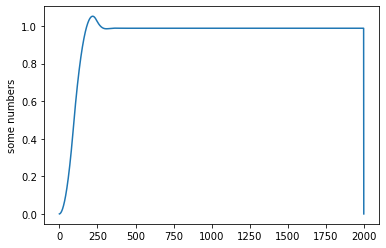

In [21]:
import matplotlib.pyplot as plt
#df2 = pd.DataFrame(columns=['z'])

plt.plot(df2.to_numpy())
plt.ylabel('some numbers')
plt.show()

In [88]:
import os  
os.makedirs('folder/subfolder', exist_ok=True)  
df2.to_csv('folder/subfolder/out.csv') 

In [19]:
#model_path = os.path.join('Trained_z_','last')
#model.save(model_path)
model_path = os.path.join('test1','last')
model = A2C.load(model_path)
#print(model_path)

In [55]:
df2.append({'z': 1 }, ignore_index=True) #obs[0][0]
print(df2.to_numpy)

<bound method DataFrame.to_numpy of Empty DataFrame
Columns: [z]
Index: []>


In [8]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

In [15]:
states = env.observation_space.shape
actions = env.action_space.shape


In [16]:
from stable_baselines3 import PPO, A2C
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
import os 
import matplotlib.pyplot as plt
import pandas as pd

log_path = os.path.join('training_z100', 'Logsa2c12')
env = quadsim()
env = DummyVecEnv([lambda: env]) 
model = A2C('MlpPolicy', env, verbose = 1, tensorboard_log=log_path, learning_rate = 0.0001)
model.learn(total_timesteps=2_000 * 2000)

df2 = pd.DataFrame(columns=['z'])
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    done = False
    score = 0
    while not done:
        action, _state = model.predict(obs, deterministic=True)
        obs, reward, done, info = env.step(action)
        df2 = df2.append({'z': obs[0][0]}, ignore_index=True)
        print("action:",action, obs, reward)
        score +=reward
    print("score:",score)  

plt.plot(df2.to_numpy())
plt.ylabel('some numbers')
plt.show()

(1,)

In [19]:
def build_model(states, actions):
    model = Sequential()    
    model.add(Dense(24, activation='relu', input_shape=states))
    model.add(Dense(24, activation='relu'))
    model.add(Dense(1, activation='linear'))
    return model

In [20]:
model = build_model(states, actions)
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 24)                72        
                                                                 
 dense_4 (Dense)             (None, 24)                600       
                                                                 
 dense_5 (Dense)             (None, 1)                 25        
                                                                 
Total params: 697
Trainable params: 697
Non-trainable params: 0
_________________________________________________________________


In [22]:
!pip install keras
!pip install keras-rl2

In [9]:
from rl.agents import DQNAgent
from rl.policy import BoltzmannQPolicy
from rl.memory import SequentialMemory

In [ ]:
def build_agent(model, actions):
    policy = BoltzmannQPolicy()
    memory = SequentialMemory(limit=50000, window_length=1)
    dqn = DQNAgent(model=model, memory=memory, policy=policy, 
                  nb_actions=actions, nb_steps_warmup=10, target_model_update=1e-2)
    return dqn

In [ ]:
dqn = build_agent(model, actions)
dqn.compile(Adam(lr=1e-3), metrics=['mae'])
dqn.fit(env, nb_steps=50000, visualize=False, verbose=1)

Using cpu device


Logging to training_z2\Logsppo\A2C_9
------------------------------------
| time/                 |          |
|    fps                | 918      |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -1.42    |
|    explained_variance | -0.00235 |
|    learning_rate      | 0.0001   |
|    n_updates          | 99       |
|    policy_loss        | -3.9     |
|    std                | 1        |
|    value_loss         | 10.4     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 914       |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -1.42     |
|    explained_variance | -0.000597 |
|    learning_rate      | 0.0001    |
|    n_updates          | 19

-------------------------------------
| time/                 |           |
|    fps                | 856       |
|    iterations         | 1600      |
|    time_elapsed       | 9         |
|    total_timesteps    | 8000      |
| train/                |           |
|    entropy_loss       | -1.43     |
|    explained_variance | -7.15e-07 |
|    learning_rate      | 0.0001    |
|    n_updates          | 1599      |
|    policy_loss        | -51.7     |
|    std                | 1.01      |
|    value_loss         | 1.44e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 855      |
|    iterations         | 1700     |
|    time_elapsed       | 9        |
|    total_timesteps    | 8500     |
| train/                |          |
|    entropy_loss       | -1.43    |
|    explained_variance | -0.0229  |
|    learning_rate      | 0.0001   |
|    n_updates          | 1699     |
|    policy_loss       

-------------------------------------
| time/                 |           |
|    fps                | 872       |
|    iterations         | 3100      |
|    time_elapsed       | 17        |
|    total_timesteps    | 15500     |
| train/                |           |
|    entropy_loss       | -1.44     |
|    explained_variance | -9.48e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 3099      |
|    policy_loss        | -4.75     |
|    std                | 1.02      |
|    value_loss         | 14.6      |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 873      |
|    iterations         | 3200     |
|    time_elapsed       | 18       |
|    total_timesteps    | 16000    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | 4.18e-05 |
|    learning_rate      | 0.0001   |
|    n_updates          | 3199     |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 891      |
|    iterations         | 4600     |
|    time_elapsed       | 25       |
|    total_timesteps    | 23000    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | -0.00102 |
|    learning_rate      | 0.0001   |
|    n_updates          | 4599     |
|    policy_loss        | 0.102    |
|    std                | 1.03     |
|    value_loss         | 0.00703  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 890      |
|    iterations         | 4700     |
|    time_elapsed       | 26       |
|    total_timesteps    | 23500    |
| train/                |          |
|    entropy_loss       | -1.44    |
|    explained_variance | 0.000924 |
|    learning_rate      | 0.0001   |
|    n_updates          | 4699     |
|    policy_loss        | -0.527   |
|

------------------------------------
| time/                 |          |
|    fps                | 880      |
|    iterations         | 6100     |
|    time_elapsed       | 34       |
|    total_timesteps    | 30500    |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 6099     |
|    policy_loss        | -3.08    |
|    std                | 1.03     |
|    value_loss         | 7.35     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 879      |
|    iterations         | 6200     |
|    time_elapsed       | 35       |
|    total_timesteps    | 31000    |
| train/                |          |
|    entropy_loss       | -1.45    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 6199     |
|    policy_loss        | -30.4    |
|

-------------------------------------
| time/                 |           |
|    fps                | 867       |
|    iterations         | 7600      |
|    time_elapsed       | 43        |
|    total_timesteps    | 38000     |
| train/                |           |
|    entropy_loss       | -1.45     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0001    |
|    n_updates          | 7599      |
|    policy_loss        | -101      |
|    std                | 1.04      |
|    value_loss         | 4.15e+03  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 867       |
|    iterations         | 7700      |
|    time_elapsed       | 44        |
|    total_timesteps    | 38500     |
| train/                |           |
|    entropy_loss       | -1.45     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0001    |
|    n_updates          | 7699      |
|    policy_

------------------------------------
| time/                 |          |
|    fps                | 865      |
|    iterations         | 9100     |
|    time_elapsed       | 52       |
|    total_timesteps    | 45500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 9099     |
|    policy_loss        | -14.4    |
|    std                | 1.04     |
|    value_loss         | 50.5     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 865      |
|    iterations         | 9200     |
|    time_elapsed       | 53       |
|    total_timesteps    | 46000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 9199     |
|    policy_loss        | -9.37    |
|

------------------------------------
| time/                 |          |
|    fps                | 871      |
|    iterations         | 10600    |
|    time_elapsed       | 60       |
|    total_timesteps    | 53000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 10599    |
|    policy_loss        | -4.6     |
|    std                | 1.04     |
|    value_loss         | 6.95     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 871      |
|    iterations         | 10700    |
|    time_elapsed       | 61       |
|    total_timesteps    | 53500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 10699    |
|    policy_loss        | -5.44    |
|

------------------------------------
| time/                 |          |
|    fps                | 868      |
|    iterations         | 12100    |
|    time_elapsed       | 69       |
|    total_timesteps    | 60500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 12099    |
|    policy_loss        | -1.98    |
|    std                | 1.04     |
|    value_loss         | 3.41     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 868      |
|    iterations         | 12200    |
|    time_elapsed       | 70       |
|    total_timesteps    | 61000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 0.0001   |
|    n_updates          | 12199    |
|    policy_loss        | -11.5    |
|

------------------------------------
| time/                 |          |
|    fps                | 868      |
|    iterations         | 13600    |
|    time_elapsed       | 78       |
|    total_timesteps    | 68000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 13599    |
|    policy_loss        | 0.335    |
|    std                | 1.05     |
|    value_loss         | 0.125    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 867      |
|    iterations         | 13700    |
|    time_elapsed       | 78       |
|    total_timesteps    | 68500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 0.0001   |
|    n_updates          | 13699    |
|    policy_loss        | 0.746    |
|

------------------------------------
| time/                 |          |
|    fps                | 870      |
|    iterations         | 15100    |
|    time_elapsed       | 86       |
|    total_timesteps    | 75500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 1.01e-06 |
|    learning_rate      | 0.0001   |
|    n_updates          | 15099    |
|    policy_loss        | 1.37     |
|    std                | 1.04     |
|    value_loss         | 1.63     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 870       |
|    iterations         | 15200     |
|    time_elapsed       | 87        |
|    total_timesteps    | 76000     |
| train/                |           |
|    entropy_loss       | -1.46     |
|    explained_variance | -1.07e-06 |
|    learning_rate      | 0.0001    |
|    n_updates          | 15199     |
|    policy_loss        | 0

------------------------------------
| time/                 |          |
|    fps                | 869      |
|    iterations         | 16600    |
|    time_elapsed       | 95       |
|    total_timesteps    | 83000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 1.8e-05  |
|    learning_rate      | 0.0001   |
|    n_updates          | 16599    |
|    policy_loss        | -0.102   |
|    std                | 1.04     |
|    value_loss         | 0.00828  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 869      |
|    iterations         | 16700    |
|    time_elapsed       | 96       |
|    total_timesteps    | 83500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 16699    |
|    policy_loss        | 0.655    |
|

------------------------------------
| time/                 |          |
|    fps                | 875      |
|    iterations         | 18100    |
|    time_elapsed       | 103      |
|    total_timesteps    | 90500    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 18099    |
|    policy_loss        | -1.34    |
|    std                | 1.04     |
|    value_loss         | 1.89     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 876      |
|    iterations         | 18200    |
|    time_elapsed       | 103      |
|    total_timesteps    | 91000    |
| train/                |          |
|    entropy_loss       | -1.46    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 18199    |
|    policy_loss        | -6.61    |
|

------------------------------------
| time/                 |          |
|    fps                | 878      |
|    iterations         | 19600    |
|    time_elapsed       | 111      |
|    total_timesteps    | 98000    |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 19599    |
|    policy_loss        | -17.1    |
|    std                | 1.05     |
|    value_loss         | 247      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 878      |
|    iterations         | 19700    |
|    time_elapsed       | 112      |
|    total_timesteps    | 98500    |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 0.0001   |
|    n_updates          | 19699    |
|    policy_loss        | -4.14    |
|

-------------------------------------
| time/                 |           |
|    fps                | 877       |
|    iterations         | 21100     |
|    time_elapsed       | 120       |
|    total_timesteps    | 105500    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | -1.79e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 21099     |
|    policy_loss        | 0.772     |
|    std                | 1.05      |
|    value_loss         | 0.464     |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 878      |
|    iterations         | 21200    |
|    time_elapsed       | 120      |
|    total_timesteps    | 106000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 1.09e-05 |
|    learning_rate      | 0.0001   |
|    n_updates          | 21199    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 882      |
|    iterations         | 22600    |
|    time_elapsed       | 128      |
|    total_timesteps    | 113000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 4.41e-06 |
|    learning_rate      | 0.0001   |
|    n_updates          | 22599    |
|    policy_loss        | -2.52    |
|    std                | 1.05     |
|    value_loss         | 2.09     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 882       |
|    iterations         | 22700     |
|    time_elapsed       | 128       |
|    total_timesteps    | 113500    |
| train/                |           |
|    entropy_loss       | -1.47     |
|    explained_variance | -2.15e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 22699     |
|    policy_loss        | 2

------------------------------------
| time/                 |          |
|    fps                | 883      |
|    iterations         | 24100    |
|    time_elapsed       | 136      |
|    total_timesteps    | 120500   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 1.85e-06 |
|    learning_rate      | 0.0001   |
|    n_updates          | 24099    |
|    policy_loss        | -0.776   |
|    std                | 1.05     |
|    value_loss         | 0.54     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 883      |
|    iterations         | 24200    |
|    time_elapsed       | 136      |
|    total_timesteps    | 121000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0.000787 |
|    learning_rate      | 0.0001   |
|    n_updates          | 24199    |
|    policy_loss        | 1.88     |
|

------------------------------------
| time/                 |          |
|    fps                | 883      |
|    iterations         | 25600    |
|    time_elapsed       | 144      |
|    total_timesteps    | 128000   |
| train/                |          |
|    entropy_loss       | -1.47    |
|    explained_variance | 0.000203 |
|    learning_rate      | 0.0001   |
|    n_updates          | 25599    |
|    policy_loss        | -0.675   |
|    std                | 1.06     |
|    value_loss         | 0.372    |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 883      |
|    iterations         | 25700    |
|    time_elapsed       | 145      |
|    total_timesteps    | 128500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 6.78e-05 |
|    learning_rate      | 0.0001   |
|    n_updates          | 25699    |
|    policy_loss        | -3.64    |
|

------------------------------------
| time/                 |          |
|    fps                | 886      |
|    iterations         | 27100    |
|    time_elapsed       | 152      |
|    total_timesteps    | 135500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 1.19e-07 |
|    learning_rate      | 0.0001   |
|    n_updates          | 27099    |
|    policy_loss        | -38.8    |
|    std                | 1.06     |
|    value_loss         | 1.64e+03 |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 886       |
|    iterations         | 27200     |
|    time_elapsed       | 153       |
|    total_timesteps    | 136000    |
| train/                |           |
|    entropy_loss       | -1.48     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0001    |
|    n_updates          | 27199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 888      |
|    iterations         | 28600    |
|    time_elapsed       | 160      |
|    total_timesteps    | 143000   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | -7.9e-05 |
|    learning_rate      | 0.0001   |
|    n_updates          | 28599    |
|    policy_loss        | -15.1    |
|    std                | 1.06     |
|    value_loss         | 94.9     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 888       |
|    iterations         | 28700     |
|    time_elapsed       | 161       |
|    total_timesteps    | 143500    |
| train/                |           |
|    entropy_loss       | -1.48     |
|    explained_variance | -2.26e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 28699     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 889      |
|    iterations         | 30100    |
|    time_elapsed       | 169      |
|    total_timesteps    | 150500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | -0.00868 |
|    learning_rate      | 0.0001   |
|    n_updates          | 30099    |
|    policy_loss        | -1.72    |
|    std                | 1.06     |
|    value_loss         | 2.14     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 889       |
|    iterations         | 30200     |
|    time_elapsed       | 169       |
|    total_timesteps    | 151000    |
| train/                |           |
|    entropy_loss       | -1.48     |
|    explained_variance | -4.65e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 30199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 891      |
|    iterations         | 31600    |
|    time_elapsed       | 177      |
|    total_timesteps    | 158000   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 31599    |
|    policy_loss        | -130     |
|    std                | 1.06     |
|    value_loss         | 9.76e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 891      |
|    iterations         | 31700    |
|    time_elapsed       | 177      |
|    total_timesteps    | 158500   |
| train/                |          |
|    entropy_loss       | -1.48    |
|    explained_variance | -0.0215  |
|    learning_rate      | 0.0001   |
|    n_updates          | 31699    |
|    policy_loss        | -4.82    |
|

-------------------------------------
| time/                 |           |
|    fps                | 891       |
|    iterations         | 33100     |
|    time_elapsed       | 185       |
|    total_timesteps    | 165500    |
| train/                |           |
|    entropy_loss       | -1.49     |
|    explained_variance | -8.34e-07 |
|    learning_rate      | 0.0001    |
|    n_updates          | 33099     |
|    policy_loss        | -127      |
|    std                | 1.07      |
|    value_loss         | 9.09e+03  |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 891      |
|    iterations         | 33200    |
|    time_elapsed       | 186      |
|    total_timesteps    | 166000   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 33199    |
|    policy_loss       

------------------------------------
| time/                 |          |
|    fps                | 890      |
|    iterations         | 34600    |
|    time_elapsed       | 194      |
|    total_timesteps    | 173000   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | -2.5e-06 |
|    learning_rate      | 0.0001   |
|    n_updates          | 34599    |
|    policy_loss        | -69      |
|    std                | 1.07     |
|    value_loss         | 3.4e+03  |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 890      |
|    iterations         | 34700    |
|    time_elapsed       | 194      |
|    total_timesteps    | 173500   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 34699    |
|    policy_loss        | -149     |
|

------------------------------------
| time/                 |          |
|    fps                | 889      |
|    iterations         | 36100    |
|    time_elapsed       | 202      |
|    total_timesteps    | 180500   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | -0.228   |
|    learning_rate      | 0.0001   |
|    n_updates          | 36099    |
|    policy_loss        | -1.36    |
|    std                | 1.08     |
|    value_loss         | 1.97     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 888       |
|    iterations         | 36200     |
|    time_elapsed       | 203       |
|    total_timesteps    | 181000    |
| train/                |           |
|    entropy_loss       | -1.49     |
|    explained_variance | -2.01e-05 |
|    learning_rate      | 0.0001    |
|    n_updates          | 36199     |
|    policy_loss        | -

------------------------------------
| time/                 |          |
|    fps                | 886      |
|    iterations         | 37600    |
|    time_elapsed       | 212      |
|    total_timesteps    | 188000   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 37599    |
|    policy_loss        | -145     |
|    std                | 1.08     |
|    value_loss         | 2.18e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 886      |
|    iterations         | 37700    |
|    time_elapsed       | 212      |
|    total_timesteps    | 188500   |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | -0.344   |
|    learning_rate      | 0.0001   |
|    n_updates          | 37699    |
|    policy_loss        | -4.8     |
|

------------------------------------
| time/                 |          |
|    fps                | 887      |
|    iterations         | 39100    |
|    time_elapsed       | 220      |
|    total_timesteps    | 195500   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 39099    |
|    policy_loss        | -185     |
|    std                | 1.08     |
|    value_loss         | 1.72e+04 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 887      |
|    iterations         | 39200    |
|    time_elapsed       | 220      |
|    total_timesteps    | 196000   |
| train/                |          |
|    entropy_loss       | -1.5     |
|    explained_variance | 0        |
|    learning_rate      | 0.0001   |
|    n_updates          | 39199    |
|    policy_loss        | -234     |
|

In [26]:
#model_path = os.path.join('Trained__z_','first')
model.save(model_path)

In [31]:
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
import os
from stable_baselines3 import PPO, A2C
env = quadsim()
env = DummyVecEnv([lambda: env]) 
model_path = os.path.join('Trained__z_','first')
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
model = A2C.load(model_path, env=env)

In [62]:
from stable_baselines3.common.evaluation import evaluate_policy
evaluate_policy(model, env, n_eval_episodes=10, render = False)

C:\Users\NP\anaconda3\lib\site-packages\stable_baselines3\common\evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


(-2360315.119368553, 0.0)

In [13]:
import pandas as pd

In [14]:
df1 = pd.DataFrame(columns=['z'])

action: [[1.]]
[[0.00011 0.022  ]] [0.00010997]
action: [[1.]]
[[0.00032986 0.0439725 ]] [0.00032985]
action: [[1.]]
[[0.00065945 0.06591754]] [0.00065947]
action: [[1.]]
[[0.00109863 0.08783514]] [0.00109863]
action: [[1.]]
[[0.00164725 0.10972534]] [0.00164723]
action: [[1.]]
[[0.00230519 0.13158819]] [0.00230521]
action: [[1.]]
[[0.00307231 0.1534237 ]] [0.00307232]
action: [[1.]]
[[0.00394847 0.17523192]] [0.00394845]
action: [[1.]]
[[0.00493354 0.19701289]] [0.00493354]
action: [[1.]]
[[0.00602737 0.21876661]] [0.00602734]
action: [[1.]]
[[0.00722983 0.24049316]] [0.0072298]
action: [[1.]]
[[0.0085408  0.26219255]] [0.00854081]
action: [[1.]]
[[0.00996012 0.2838648 ]] [0.00996011]
action: [[1.]]
[[0.01148767 0.30550998]] [0.01148766]
action: [[1.]]
[[0.01312331 0.32712808]] [0.01312333]
action: [[1.]]
[[0.01486691 0.34871918]] [0.01486689]
action: [[1.]]
[[0.01671832 0.37028328]] [0.01671833]
action: [[1.]]
[[0.01867743 0.39182043]] [0.01867741]
action: [[1.]]
[[0.02074408 0.41333

action: [[1.]]
[[1.3434461 3.2101512]] [0.65655386]
action: [[1.]]
[[1.3595868 3.2281384]] [0.64041317]
action: [[1.]]
[[1.3758173 3.2461033]] [0.6241827]
action: [[1.]]
[[1.3921375 3.2640457]] [0.6078625]
action: [[1.]]
[[1.4085474 3.2819657]] [0.5914526]
action: [[1.]]
[[1.4250467 3.299863 ]] [0.5749533]
action: [[1.]]
[[1.4416354 3.3177383]] [0.5583646]
action: [[1.]]
[[1.4583133 3.335591 ]] [0.54168665]
action: [[1.]]
[[1.4750804 3.3534217]] [0.5249196]
action: [[1.]]
[[1.4919366 3.37123  ]] [0.50806344]
action: [[1.]]
[[1.5088817 3.389016 ]] [0.4911183]
action: [[1.]]
[[1.5259155 3.4067795]] [0.4740845]
action: [[1.]]
[[1.5430381 3.4245212]] [0.45696187]
action: [[1.]]
[[1.5602493 3.4422405]] [0.43975067]
action: [[1.]]
[[1.5775491 3.4599376]] [0.4224509]
action: [[1.]]
[[1.5949371 3.4776127]] [0.4050629]
action: [[1.]]
[[1.6124134 3.4952657]] [0.3875866]
action: [[1.]]
[[1.629978  3.5128965]] [0.37002206]
action: [[1.]]
[[1.6476305 3.5305054]] [0.35236955]
action: [[1.]]
[[1.6653

[[4.967752 5.805319]] [-2.967752]
action: [[1.]]
[[4.996852 5.820062]] [-2.996852]
action: [[1.]]
[[5.0260262 5.834787 ]] [-3.0260262]
action: [[1.]]
[[5.0552735 5.8494935]] [-3.0552735]
action: [[1.]]
[[5.0845942 5.8641815]] [-3.0845942]
action: [[1.]]
[[5.113989  5.8788514]] [-3.1139889]
action: [[1.]]
[[5.1434565 5.8935027]] [-3.1434565]
action: [[1.]]
[[5.172997 5.908136]] [-3.172997]
action: [[1.]]
[[5.2026105 5.922751 ]] [-3.2026105]
action: [[1.]]
[[5.2322974 5.9373474]] [-3.2322974]
action: [[1.]]
[[5.262057  5.9519258]] [-3.2620568]
action: [[1.]]
[[5.2918897 5.966486 ]] [-3.2918897]
action: [[1.]]
[[5.3217945 5.9810276]] [-3.3217945]
action: [[1.]]
[[5.3517723 5.9955516]] [-3.3517723]
action: [[1.]]
[[5.3818226 6.010057 ]] [-3.3818226]
action: [[1.]]
[[5.4119453 6.0245442]] [-3.4119453]
action: [[1.]]
[[5.4421406 6.039014 ]] [-3.4421406]
action: [[1.]]
[[5.472408 6.053465]] [-3.4724078]
action: [[1.]]
[[5.502747  6.0678983]] [-3.502747]
action: [[1.]]
[[5.533159 6.082313]] [-

[[12.181297  8.42721 ]] [-10.181297]
action: [[1.]]
[[12.223491  8.438676]] [-10.223491]
action: [[1.]]
[[12.265741  8.450128]] [-10.265741]
action: [[1.]]
[[12.308049  8.461565]] [-10.308049]
action: [[1.]]
[[12.350414  8.472988]] [-10.350414]
action: [[1.]]
[[12.392837  8.484396]] [-10.392837]
action: [[1.]]
[[12.435315   8.4957905]] [-10.435315]
action: [[1.]]
[[12.477851  8.507172]] [-10.477851]
action: [[1.]]
[[12.520444   8.5185375]] [-10.520444]
action: [[1.]]
[[12.563093  8.529889]] [-10.563093]
action: [[1.]]
[[12.6058    8.541226]] [-10.6058]
action: [[1.]]
[[12.648562  8.55255 ]] [-10.648562]
action: [[1.]]
[[12.691381  8.56386 ]] [-10.691381]
action: [[1.]]
[[12.734257  8.575154]] [-10.734257]
action: [[1.]]
[[12.777189  8.586435]] [-10.777189]
action: [[1.]]
[[12.820178  8.597703]] [-10.820178]
action: [[1.]]
[[12.863222  8.608955]] [-10.863222]
action: [[1.]]
[[12.906323  8.620194]] [-10.906323]
action: [[1.]]
[[12.949481  8.631419]] [-10.949481]
action: [[1.]]
[[12.99269

[[21.928022  8.64172 ]] [-19.928022]
action: [[0.]]
[[21.971106  8.616918]] [-19.971106]
action: [[0.]]
[[22.014067  8.592147]] [-20.014067]
action: [[0.]]
[[22.056904  8.567407]] [-20.056904]
action: [[0.]]
[[22.099617  8.542697]] [-20.099617]
action: [[0.]]
[[22.142208  8.518019]] [-20.142208]
action: [[0.]]
[[22.184675  8.493371]] [-20.184675]
action: [[0.]]
[[22.227018  8.468755]] [-20.227018]
action: [[0.]]
[[22.26924   8.444169]] [-20.26924]
action: [[0.]]
[[22.311337  8.419614]] [-20.311337]
action: [[0.]]
[[22.353313  8.395089]] [-20.353313]
action: [[0.]]
[[22.395166  8.370595]] [-20.395166]
action: [[0.]]
[[22.436897  8.346132]] [-20.436897]
action: [[0.]]
[[22.478504  8.321699]] [-20.478504]
action: [[0.]]
[[22.51999    8.2972975]] [-20.51999]
action: [[0.]]
[[22.561356  8.272925]] [-20.561356]
action: [[0.]]
[[22.602598  8.248584]] [-20.602598]
action: [[0.]]
[[22.64372   8.224274]] [-20.64372]
action: [[0.]]
[[22.684721  8.199993]] [-20.684721]
action: [[0.]]
[[22.7256    

action: [[0.]]
[[28.334797   4.1924644]] [-26.334797]
action: [[0.]]
[[28.355663  4.173224]] [-26.355663]
action: [[0.]]
[[28.376434   4.1540074]] [-26.376434]
action: [[0.]]
[[28.397108   4.1348147]] [-26.397108]
action: [[0.]]
[[28.417686   4.1156464]] [-26.417686]
action: [[0.]]
[[28.43817   4.096502]] [-26.43817]
action: [[0.]]
[[28.458555  4.077381]] [-26.458555]
action: [[0.]]
[[28.478848   4.0582843]] [-26.478848]
action: [[0.]]
[[28.499043   4.0392113]] [-26.499043]
action: [[0.]]
[[28.519144   4.0201626]] [-26.519144]
action: [[0.]]
[[28.53915    4.0011373]] [-26.53915]
action: [[0.]]
[[28.559061   3.9821358]] [-26.559061]
action: [[0.]]
[[28.578876   3.9631581]] [-26.578876]
action: [[0.]]
[[28.598597  3.944204]] [-26.598597]
action: [[0.]]
[[28.618223  3.925274]] [-26.618223]
action: [[0.]]
[[28.637754   3.9063673]] [-26.637754]
action: [[0.]]
[[28.657192   3.8874843]] [-26.657192]
action: [[0.]]
[[28.676537  3.868625]] [-26.676537]
action: [[0.]]
[[28.695786   3.8497891]] [

action: [[0.]]
[[30.71093     0.90632373]] [-28.71093]
action: [[0.]]
[[30.715385   0.8911908]] [-28.715385]
action: [[0.]]
[[30.719767   0.8760768]] [-28.719767]
action: [[0.]]
[[30.724072   0.8609817]] [-28.724072]
action: [[0.]]
[[30.7283     0.8459055]] [-28.7283]
action: [[0.]]
[[30.732454   0.8308481]] [-28.732454]
action: [[0.]]
[[30.736534    0.81580955]] [-28.736534]
action: [[0.]]
[[30.740538   0.8007898]] [-28.740538]
action: [[0.]]
[[30.744467    0.78578883]] [-28.744467]
action: [[0.]]
[[30.748322    0.77080655]] [-28.748322]
action: [[0.]]
[[30.7521      0.75584304]] [-28.7521]
action: [[0.]]
[[30.755804    0.74089825]] [-28.755804]
action: [[0.]]
[[30.759434   0.7259721]] [-28.759434]
action: [[0.]]
[[30.762989   0.7110647]] [-28.762989]
action: [[0.]]
[[30.76647    0.6961758]] [-28.76647]
action: [[0.]]
[[30.769876    0.68130565]] [-28.769876]
action: [[0.]]
[[30.773209  0.666454]] [-28.773209]
action: [[0.]]
[[30.776468   0.6516209]] [-28.776468]
action: [[0.]]
[[30.77

[[30.572763  -1.1897548]] [-28.572763]
action: [[0.]]
[[30.566751  -1.2022676]] [-28.566751]
action: [[0.]]
[[30.560678  -1.2147648]] [-28.560678]
action: [[0.]]
[[30.554543  -1.2272463]] [-28.554543]
action: [[0.]]
[[30.548344  -1.2397122]] [-28.548344]
action: [[0.]]
[[30.542082  -1.2521626]] [-28.542082]
action: [[0.]]
[[30.535759  -1.2645974]] [-28.535759]
action: [[0.]]
[[30.529375  -1.2770166]] [-28.529375]
action: [[0.]]
[[30.522928  -1.2894204]] [-28.522928]
action: [[0.]]
[[30.516418  -1.3018086]] [-28.516418]
action: [[0.]]
[[30.509848  -1.3141813]] [-28.509848]
action: [[0.]]
[[30.503214  -1.3265387]] [-28.503214]
action: [[0.]]
[[30.496521  -1.3388804]] [-28.496521]
action: [[0.]]
[[30.489765  -1.3512069]] [-28.489765]
action: [[0.]]
[[30.482946  -1.3635179]] [-28.482946]
action: [[0.]]
[[30.476068  -1.3758135]] [-28.476068]
action: [[0.]]
[[30.469128  -1.3880937]] [-28.469128]
action: [[0.]]
[[30.462126  -1.4003586]] [-28.462126]
action: [[0.]]
[[30.455063  -1.4126081]] [-

[[28.223597  -3.4052322]] [-26.223597]
action: [[0.]]
[[28.20652   -3.4149756]] [-26.20652]
action: [[0.]]
[[28.189398 -3.424707]] [-26.189398]
action: [[0.]]
[[28.172226 -3.434426]] [-26.172226]
action: [[0.]]
[[28.155005 -3.444133]] [-26.155005]
action: [[0.]]
[[28.137735  -3.4538279]] [-26.137735]
action: [[0.]]
[[28.120419  -3.4635105]] [-26.120419]
action: [[0.]]
[[28.103052  -3.4731812]] [-26.103052]
action: [[0.]]
[[28.085638  -3.4828398]] [-26.085638]
action: [[0.]]
[[28.068176  -3.4924862]] [-26.068176]
action: [[0.]]
[[28.050665  -3.5021205]] [-26.050665]
action: [[0.]]
[[28.033106  -3.5117428]] [-26.033106]
action: [[0.]]
[[28.0155    -3.5213532]] [-26.0155]
action: [[0.]]
[[27.997845  -3.5309515]] [-25.997845]
action: [[0.]]
[[27.980143  -3.5405378]] [-25.980143]
action: [[0.]]
[[27.96239   -3.5501122]] [-25.96239]
action: [[0.]]
[[27.944593  -3.5596745]] [-25.944593]
action: [[0.]]
[[27.926746 -3.569225]] [-25.926746]
action: [[0.]]
[[27.908854  -3.5787635]] [-25.908854]
a

action: [[0.]]
[[24.839003 -4.842881]] [-22.839003]
action: [[0.]]
[[24.814749  -4.8508277]] [-22.814749]
action: [[0.]]
[[24.790455 -4.858764]] [-22.790455]
action: [[0.]]
[[24.766123  -4.8666906]] [-22.766123]
action: [[0.]]
[[24.741749 -4.874607]] [-22.741749]
action: [[0.]]
[[24.717337 -4.882514]] [-22.717337]
action: [[0.]]
[[24.692884 -4.890411]] [-22.692884]
action: [[0.]]
[[24.668392 -4.898298]] [-22.668392]
action: [[0.]]
[[24.643862 -4.906175]] [-22.643862]
action: [[0.]]
[[24.619291 -4.914042]] [-22.619291]
action: [[0.]]
[[24.594683 -4.9219  ]] [-22.594683]
action: [[0.]]
[[24.570034 -4.929747]] [-22.570034]
action: [[0.]]
[[24.545345  -4.9375854]] [-22.545345]
action: [[0.]]
[[24.520618 -4.945413]] [-22.520618]
action: [[0.]]
[[24.495852  -4.9532313]] [-22.495852]
action: [[0.]]
[[24.471046 -4.96104 ]] [-22.471046]
action: [[0.]]
[[24.446203  -4.9688387]] [-22.446203]
action: [[0.]]
[[24.42132   -4.9766273]] [-22.42132]
action: [[0.]]
[[24.396399  -4.9844065]] [-22.396399]

action: [[0.]]
[[19.756073 -6.149782]] [-17.756073]
action: [[0.]]
[[19.725292 -6.156095]] [-17.725292]
action: [[0.]]
[[19.69448 -6.1624 ]] [-17.69448]
action: [[0.]]
[[19.663637 -6.168697]] [-17.663637]
action: [[0.]]
[[19.632761 -6.174986]] [-17.632761]
action: [[0.]]
[[19.601854  -6.1812673]] [-17.601854]
action: [[0.]]
[[19.570917  -6.1875405]] [-17.570917]
action: [[0.]]
[[19.53995  -6.193806]] [-17.53995]
action: [[0.]]
[[19.508947  -6.2000637]] [-17.508947]
action: [[0.]]
[[19.477917  -6.2063136]] [-17.477917]
action: [[0.]]
[[19.446854 -6.212556]] [-17.446854]
action: [[0.]]
[[19.41576 -6.21879]] [-17.41576]
action: [[0.]]
[[19.384634  -6.2250166]] [-17.384634]
action: [[0.]]
[[19.35348   -6.2312355]] [-17.35348]
action: [[0.]]
[[19.322292  -6.2374463]] [-17.322292]
action: [[0.]]
[[19.291073  -6.2436495]] [-17.291073]
action: [[0.]]
[[19.259825 -6.249845]] [-17.259825]
action: [[0.]]
[[19.228544 -6.256033]] [-17.228544]
action: [[0.]]
[[19.197233  -6.2622128]] [-17.197233]
ac

action: [[0.]]
[[14.242845  -7.0966587]] [-12.242845]
action: [[0.]]
[[14.207335 -7.101788]] [-12.207335]
action: [[0.]]
[[14.171801  -7.1069107]] [-12.171801]
action: [[0.]]
[[14.136241 -7.112027]] [-12.136241]
action: [[0.]]
[[14.100656 -7.117137]] [-12.100656]
action: [[0.]]
[[14.065044  -7.1222405]] [-12.065044]
action: [[0.]]
[[14.0294075 -7.127338 ]] [-12.0294075]
action: [[0.]]
[[13.993745  -7.1324286]] [-11.993745]
action: [[0.]]
[[13.958057 -7.137513]] [-11.958057]
action: [[0.]]
[[0. 0.]] [-11.922344]
score: [-34801.773]


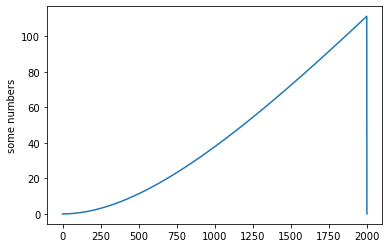

In [53]:
import matplotlib.pyplot as plt
plt.plot(df1.to_numpy())
plt.ylabel('some numbers')
plt.show()

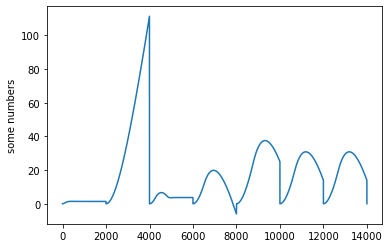

In [34]:
import matplotlib.pyplot as plt
plt.plot(df1.to_numpy())
plt.ylabel('some numbers')
plt.show()

In [38]:
print(df.to_numpy())

[[-7.00000019e-05]
 [-2.09912498e-04]
 [-4.19650110e-04]
 ...
 [-7.08202591e+01]
 [-7.08716583e+01]
 [ 0.00000000e+00]]


In [37]:
from stable_baselines3.common.env_checker import check_env

env = quadsim()
# It will check your custom environment and output additional warnings if needed
check_env(env)


In [60]:
episodes = 10
for episode in range(1, episodes+1):
    obs = env.reset()
    env.target = np.array([1.],dtype=np.float32)

    done = False
    score = 0
    
    while not done:

        action = np.array([300.])
        obs, reward, done, info = env.step(action)
        #print(obs)
        score +=reward

        
        
    #print(n_state)
    
    print("score:",score,env.z)
    #print("state",state)

IndexError: invalid index to scalar variable.